# Imports and Settings

In [1]:
import os
import sys
import warnings

from typing import List, Optional, Dict, Tuple, Any

import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    roc_auc_score,
    roc_curve
)
from sklearn.model_selection import StratifiedKFold, train_test_split

from catboost import CatBoostClassifier, Pool

import optuna
from optuna.integration import CatBoostPruningCallback
from optuna.samplers import TPESampler
from optuna.visualization import plot_optimization_history

import pickle
import shap

In [2]:
# Создаём внутренние папки проекта
folders = ['prepared_data', 'catboost_models']

for folder in folders:
    path = os.path.join('..', folder)
    os.makedirs(path, exist_ok=True) 

In [224]:
# Настроиваем pandas 
# Показывать все столбцы
pd.set_option('display.max_columns', None)
# Отображать полный текст в ячейках столбцов без усечения
pd.set_option('display.max_colwidth', None)

In [4]:
"""
Отключаем вывод предупреждений, связанных с экспериментальным статусом 
CatBoostPruningCallback  в библиотеке Optuna
"""
warnings.filterwarnings(
    "ignore",
    message="CatBoostPruningCallback is experimental",
    category=Warning
)

# Functions

## Functions for assembling a dataset from parquet files

In [5]:
def read_parquet_dataset_from_local(
    path_to_dataset: str,
    start_from: int = 0,
    num_parts_to_read: int = 2,
    columns: Optional[List[str]] = None,
    verbose: bool = False
) -> pd.DataFrame:
    """
    Читает num_parts_to_read партиций, преобразовывает их к pd.DataFrame и возвращает.

    Args:
    path_to_dataset : путь до директории с партициями
    start_from : номер партиции, с которой нужно начать чтение
    num_parts_to_read : количество партиций, которые требуется прочитать
    columns : список колонок, которые нужно прочитать из партиции
    verbose : выводить ли дополнительную информацию
    
    Returns:
    pd.DataFrame 
    """
    res = []
    dataset_paths = sorted(
        os.path.join(path_to_dataset, filename)
        for filename in os.listdir(path_to_dataset)
        if filename.startswith('train')
    )

    if verbose:
        print('Dataset paths:')
        for path in dataset_paths:
            print(path)

    start_from = max(0, start_from)
    chunks = dataset_paths[start_from: start_from + num_parts_to_read]

    if verbose:
        print('Reading chunks:')
        for chunk in chunks:
            print(chunk)

    for chunk_path in tqdm(chunks, desc="Reading dataset with pandas"):
        if verbose:
            print('Reading chunk:', chunk_path)
        chunk = pd.read_parquet(chunk_path, columns=columns)
        res.append(chunk)

    return pd.concat(res).reset_index(drop=True)

In [6]:
def prepare_transactions_dataset(
    path_to_dataset: str,
    num_parts_to_preprocess_at_once: int = 1,
    num_parts_total: int = 50,
    save_to_path: str = None,
    verbose: bool = False
) -> pd.DataFrame:
    """
    Возвращает исходный pd.DataFrame с признаками из которых нужно собрать
    учебный датасет.

    Args:
    path_to_dataset : путь до датасета с партициями
    num_parts_to_preprocess_at_once : количество партиций, 
        которые будут одновременно держаться и обрабатываться в памяти
    num_parts_total : общее количество партиций, которые нужно обработать
    save_to_path : путь до папки для сохранения обработанных блоков в .parquet-формате; 
        если None, сохранение не происходит
    verbose : логировать каждую обрабатываемую часть данных

    Returns:
    pd.DataFrame : датафрейм с объединёнными данными
    """
    preprocessed_frames = []

    for step in tqdm(range(0, num_parts_total, num_parts_to_preprocess_at_once),
                     desc="Transforming transactions data"):
        transactions_frame = read_parquet_dataset_from_local(
            path_to_dataset,
            start_from=step,
            num_parts_to_read=num_parts_to_preprocess_at_once,
            verbose=verbose
        )

       # Записываем подготовленные данные в файл
        if save_to_path:
            block_as_str = str(step)
            if len(block_as_str) == 1:
                block_as_str = '00' + block_as_str
            else:
                block_as_str = '0' + block_as_str
            transactions_frame.to_parquet(os.path.join(save_to_path, f'processed_chunk_{block_as_str}.parquet'))

        preprocessed_frames.append(transactions_frame)
    
    return pd.concat(preprocessed_frames)

## Feature engineering functions

In [7]:
def create_rn_max_feature(
    df_source: pd.DataFrame, 
    df_to_update: pd.DataFrame
) -> pd.DataFrame:
    """
    Добавляет в df_to_update новую колонку 'rn_max', 
    содержащую максимальное значение 'rn' для каждого 'id' из df_source.

    Args:
    df_source (pd.DataFrame): исходный DataFrame с колонками 'id' и 'rn'.
    df_to_update (pd.DataFrame): DataFrame, в который добавляется новая колонка.

    Returns:
    pd.DataFrame: обновлённый df_to_update с колонкой 'rn_max'.
    """    
    # Группируем df_source по 'id' и вычисляем максимальное значение 'rn' для каждой группы
    rn_max = (
    df_source
    .groupby('id', as_index=False)['rn']
    .max()
    .rename(columns={'rn': 'rn_max'})
    )

    # Объединяем df_to_update с результатом группировки по колонке 'id'
    df_to_update = df_to_update.merge(rn_max, on='id', how='left') 
    
    return df_to_update

In [8]:
def create_all_value_proportion_features(
    df_source: pd.DataFrame,
    df_to_update: pd.DataFrame,
    column: str
) -> Tuple[pd.DataFrame, List[str]]:
    """
    Для каждого уникального значения признака column
    функция создаёт новые числовые признаки,
    отражающие долю кредитов клиента (id), в которых это значение встречается.

    Args:
    df_source : исходный датафрейм.
    df_to_update : целевой датафрейм, к которому добавляются новые признаки.
    column : имя столбца, по уникальным значениям которого создаются признаки.
    
    Returns:
    df_to_update : обновлённый датафрейм с добавленными признаками.
    new_features_list : список имён новых признаков.
    """
    new_features_list = []

    for value in sorted(df_source[column].unique()):
        new_column = f'{column}_prop_{value}'
        new_features_list.append(new_column)

        # Группируем по 'id' количество записей с текущим значением признака
        group_value = (
            df_source[df_source[column] == value]
            .groupby('id')
            .size()
            .rename(new_column)
        )

        # Объединяем с целевым датафреймом по ключу 'id'
        df_to_update = df_to_update.merge(group_value, on='id', how='left')

        # Заполняем пропуски нулями (отсутствие записей с данным значением)
        df_to_update[new_column] = df_to_update[new_column].fillna(0)

        # Вычисляем долю записей с этим значением относительно количества кредитов клиента
        df_to_update[new_column] = df_to_update[new_column] / df_to_update['rn_max']

    return df_to_update, new_features_list

In [9]:
def choose_n_most_imp_features(
    df_train: pd.DataFrame,
    new_features_list: List[str],
    n_features: int
) -> List[int]:
    """
    Принимает тренировочный датафрейм и создаёт его урезанную версию 
    со столбцами из new_features_list. 
    На ней обучает CatBoostClassifier с 5-кратной стратифицированной кросс-валидацией,
    собирает важности признаков и вычисляет средние метрики ROC AUC.

    Возвращает список числовых значений, извлечённых из имён "n_features" наиболее важных признаков.

    Args:
        df_train : тренировочный датафрейм с признаками и целевой переменной 'flag'.
        new_features_list : список имён новых признаков для оценки.
        n_features : количество признаков для выбора.

    Returns:
        List: список числовых значений, извлечённых из имён "n_features" наиболее важных признаков.
    """
    # Выбираем целевую переменную и признаки
    X = df_train[new_features_list]
    y = df_train['flag']    

    # Создадим списки для хранения ROC AUC по фолдам
    roc_auc_scores_train = []
    roc_auc_scores_val = []

    # Создадим словарь для накопления важностей признаков на каждом фолде
    importances_dict = {col: [] for col in X.columns}

    # Инициализируем стратифицированный KFold
    kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

    # Поделим данные на train/val
    for train_idx, val_idx in kf.split(X, y):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

        # Упакуем результат в Pool
        train_pool = Pool(data=X_train, label=y_train)
        val_pool = Pool(data=X_val, label=y_val)

        # Обучим модель CatBoost
        model = CatBoostClassifier(
            early_stopping_rounds=100,
            eval_metric='AUC',
            random_seed=0,
            verbose=False,
            auto_class_weights='Balanced'
        )
        model.fit(
            train_pool,
            eval_set=val_pool,
            use_best_model=True
        )

        # Сохраним важности признаков в словарь
        importances = model.get_feature_importance()
        for col, imp in zip(X.columns, importances):
            importances_dict[col].append(imp)

        # Предскажем вероятности и оценим ROC AUC
        train_pred_proba = model.predict_proba(X_train)[:, 1]
        val_pred_proba = model.predict_proba(X_val)[:, 1]

        roc_auc_scores_train.append(roc_auc_score(y_train, train_pred_proba))
        roc_auc_scores_val.append(roc_auc_score(y_val, val_pred_proba))
    
    # Выведем средние и стандартные отклонения ROC AUC по фолдам
    mean_roc_auc = np.mean(roc_auc_scores_train)
    std_roc_auc = np.std(roc_auc_scores_train)
    print(f'Среднее ROC AUC на трейне: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}')
    
    mean_roc_auc = np.mean(roc_auc_scores_val)
    std_roc_auc = np.std(roc_auc_scores_val)
    print(f'Среднее ROC AUC на валидации: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}')

    # Выведем медианные важности признаков как более устойчивые к выбросам
    median_importances = {col: np.median(imps) for col, imps in importances_dict.items()}

    # Отсортируем признаки по убыванию важности  
    sorted_features = sorted(median_importances.items(), key=lambda x: x[1], reverse=True)

    # Выберем n_features наиболее важных признаков
    most_imp_features = [feat for feat, _ in sorted_features[:n_features]]

    # Извлечем числовые значения из имён признаков (число после последнего '_')
    values = [int(feature.rsplit('_', 1)[-1]) for feature in most_imp_features]

    return values

In [10]:
def create_definite_value_proportion_features(
    df_source: pd.DataFrame,
    df_to_update: pd.DataFrame,
    features_dictionary: Dict[str, List]
) -> pd.DataFrame:
    """
    На основе заданных словарём признаков и их значений создаёт новые числовые признаки,
    отражающие долю кредитов клиента (id), в которых это значение встречается. 
    Новые признаки добавляются в целевой датафрейм

    Args:
        df_source : исходный датафрейм.
        df_to_update : датафрейм, в который добавляются новые признаки.
        features_dictionary : словарь, где ключи — имена столбцов исходного датафрейма,
            а значения — списки значений, по которым создаются признаки.

    Returns:
        pd.DataFrame: обновлённый датафрейм с добавленными частотными признаками.
    """
    for col in features_dictionary.keys():
        print('-' * 50)
        print('Исходный признак:', col)
        print('Новые фичи:')

        for value in features_dictionary[col]:
            new_column = f'{col}_prop_{value}'
            print(new_column)

            # Фильтруем df_source по текущему значению и считаем количество записей для каждого id
            group_value = (
                df_source[df_source[col] == value]
                .groupby('id')
                .size()
                .rename(new_column)
            )

            # Объединяем с целевым датафреймом по ключу 'id'
            df_to_update = df_to_update.merge(group_value, on='id', how='left')

            # Заполняем пропуски нулями (отсутствие записей с данным значением)
            df_to_update[new_column] = df_to_update[new_column].fillna(0)

            # Вычисляем долю записей с этим значением относительно общего количества кредитов клиента
            df_to_update[new_column] = df_to_update[new_column] / df_to_update['rn_max']

    return df_to_update

In [11]:
def check_cat_boost(
    train_data: pd.DataFrame,
    test_data: pd.DataFrame,
    dataset_name: str
)  -> Tuple[pd.DataFrame, Dict[str, float]]:
    """
    Оценивает качество модели CatBoost на тренировочном, валидационном и тестовом наборах данных
    с помощью 5-кратной стратифицированной кросс-валидации.
    Вычисляет метрику ROC AUC для каждого фолда, аккумулирует важности признаков и возвращает
    отсортированный словарь с медианными значениями важности признаков.

    Args:
        train_data : тренировочный датасет с признаками и целевой переменной 'flag'.
        test_data  : тестовый датасет с признаками и целевой переменной 'flag'.
        dataset_name : версия тренировочного датасета для записи в итоговый DataFrame с метриками.

    Returns:
        Dict[str, float]: словарь признаков с их медианной важностью, отсортированный по убыванию.

        Tuple[pd.DataFrame, Dict[str, float]]:
            DataFrame с одной строкой и средними ROC AUC для train/val/test.
            Словарь признаков с их медианной важностью, отсортированный по убыванию.
    """
    # Датафрейм для метрик
    df_metrics = pd.DataFrame(
        data=[{}],
        columns=[
        'dataset_name',
        'train_mean',
        'train_std',
        'val_mean',
        'val_std',
        'test_mean',
        'test_std'
        ])
    df_metrics['dataset_name'] = dataset_name
    
    # Отделяем признаки и целевую переменную в тренировочном и тестовом датасетах
    X = train_data.drop(['id', 'flag'], axis=1)
    y = train_data['flag']
    X_test = test_data.drop(['id', 'flag'], axis=1)
    y_test = test_data['flag']

    # Создадим списки для хранения ROC AUC по фолдам
    roc_auc_scores_train = []
    roc_auc_scores_val = []
    roc_auc_scores_test = []

    # Создадим словарь для накопления важности признаков по каждому фолду
    importances_dict = {col: [] for col in X.columns}

    # Инициализируем стратифицированное разбиение на 5 фолдов
    kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

    # В цикл добавим enumerate для индексации
    for i, (train_index, val_index) in enumerate(kf.split(X, y)):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        train_pool = Pool(data=X_train, label=y_train)
        val_pool = Pool(data=X_val, label=y_val)

        # Обучим модель
        model = CatBoostClassifier(
            early_stopping_rounds=100,
            eval_metric='AUC',
            random_seed=0,
            verbose=False,
            auto_class_weights='Balanced'
        )
        model.fit(
            train_pool,
            eval_set=val_pool,
            use_best_model=True
        )

        # Сохраним важности признаков в словаре
        importances = model.get_feature_importance()
        for col, imp in zip(X.columns, importances):
            importances_dict[col].append(imp)

        # Предскажем вероятности для тренировочного, валидационного и тестового наборов
        train_pred_proba = model.predict_proba(X_train)[:, 1]
        val_pred_proba = model.predict_proba(X_val)[:, 1]
        test_pred_proba = model.predict_proba(X_test)[:, 1]

        # Вычислим ROC AUC для каждого набора
        train_roc_auc = roc_auc_score(y_train, train_pred_proba)
        val_roc_auc = roc_auc_score(y_val, val_pred_proba)
        test_roc_auc = roc_auc_score(y_test, test_pred_proba)

        # Сохраненим метрики
        roc_auc_scores_train.append(train_roc_auc)
        roc_auc_scores_val.append(val_roc_auc)
        roc_auc_scores_test.append(test_roc_auc)

        print(f'Фолд {i}')
        print(f'ROC AUC на трейне: {train_roc_auc:.4f}')
        print(f'ROC AUC на валидации: {val_roc_auc:.4f}')
        print(f'ROC AUC на тесте: {test_roc_auc:.4f}')

    """ 
    Выведем среднее и стандартное отклонение ROC AUC по фолдам 
    для каждого набора и запишем в df_metrics
    """
    mean_roc_auc = np.mean(roc_auc_scores_train)
    std_roc_auc = np.std(roc_auc_scores_train)
    df_metrics['train_mean'] = mean_roc_auc
    df_metrics['train_std'] = std_roc_auc
    print(f'Среднее ROC AUC на трейне: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}')

    mean_roc_auc = np.mean(roc_auc_scores_val)
    std_roc_auc = np.std(roc_auc_scores_val)
    df_metrics['val_mean'] = mean_roc_auc
    df_metrics['val_std'] = std_roc_auc
    print(f'Среднее ROC AUC на валидации: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}')

    mean_roc_auc = np.mean(roc_auc_scores_test)
    std_roc_auc = np.std(roc_auc_scores_test)
    df_metrics['test_mean'] = mean_roc_auc
    df_metrics['test_std'] = std_roc_auc
    print(f'Среднее ROC AUC на тесте: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}')

    # Вычислим медианные важности признаков по всем фолдам
    median_importances_dict = {col: np.median(imps) for col, imps in importances_dict.items()}

    # Отсортируем признаки по убыванию важности
    sorted_median_importances_dict = dict(
        sorted(median_importances_dict.items(), key=lambda x: x[1], reverse=True)
    )

    return df_metrics, sorted_median_importances_dict

In [12]:
def create_mean_values_frequency_feature(
    df_source: pd.DataFrame,
    df_to_update: pd.DataFrame,
    column: str
) -> pd.DataFrame:
    """
    Создаёт агрегированный признак,
    отражающий среднюю частоту (относительную встречаемость) значений заданного столбца
    column из исходного датафрейма для каждого уникального id.
    Результат добавляется в целевой датафрейм 
    с нормировкой на количество записей (rn_max) для каждого id.
    
    Args:
    df_source : Исходный датафрейм.
    df_to_update : Целевой датафрейм.
    column : Имя столбца в df_source, по уникальным значениям которого вычисляются частоты.
    
    Returns:
    df_to_update : Обновлённый датафрейм с добавленным новым столбцом {column}_mean_freq.
    """
    new_column = f'{column}_mean_freq'
    print(new_column)
    """
    Вычисляем долю каждого уникального значения в столбце column
    относительно общего числа записей и сохраняем в словарь
    """
    value_freq = df_source[column].value_counts(normalize=True).to_dict()
    """
    Создаём Series, где каждому значению из столбца column в df_source 
    сопоставляется его относительная встречаемость из словаря bin_freq.
    """
    freq_series = df_source[column].map(value_freq)

    # Группируем по 'id' и суммируем частоты значений для каждой группы
    agg_freq = freq_series.groupby(df_source['id']).sum().reset_index(name=new_column)

    # Объединяем с целевым датафреймом по ключу 'id'
    df_to_update = df_to_update.merge(agg_freq, on='id', how='left')

    # Нормируем сумму частот на общее количество записей (rn_max) для каждого id
    df_to_update[new_column] = df_to_update[new_column] / df_to_update['rn_max']

    return df_to_update

In [13]:
def from_enc_paym_create_normalized_group_sum_features(
    df_source: pd.DataFrame,
    df_to_update: pd.DataFrame,
    enc_paym_columns_list: List[str],
    time_span: str
) -> pd.DataFrame:
    """
    Создаёт агрегированные признаки, отражающие среднее количество 
    различных статусов платежей (от 0 до 3) за заданный временной промежуток.

    Для каждого статуса платежа i в диапазоне [0, 3] функция:
    - подсчитывает количество появлений статуса i в столбцах enc_paym_columns_list 
      для каждой записи в исходном DataFrame df_source,
    - агрегирует эти количества по  'id' суммированием,
    - добавляет полученные агрегаты в целевой DataFrame df_to_update с именами столбцов вида 
      'enc_paym_avg_i_{time_span}',
    - нормирует агрегированные суммы на количество записей 'rn_max' для каждого id, 
      получая среднее количество статусов i на один кредит.

    Args:
        df_source : Исходный DataFrame с данными по платежам.
        df_to_update : Целевой DataFrame, в который добавляются новые признаки.
        enc_paym_columns_list : Список имён столбцов в df_source, содержащих статусы платежей.
        time_span : Метка временного промежутка, добавляемая в имя нового признака.

    Returns:
        df_to_update : Обновлённый df_to_update с добавленными  признаками.
    """
     # Создаём временный DataFrame с колонкой 'id' из df_source
    df = pd.DataFrame({'id': df_source['id']})

    # Для статусов платежей по кредитам от 0 до 3 
    for status in range(4):
        new_col = f'enc_paym_avg_{status}_{time_span}'
        print(new_col)

        # Подсчитываем количество появлений  status в указанных столбцах для каждой записи
        status_counts = np.sum([df_source[col] == status for col in enc_paym_columns_list], axis=0)
        df[new_col] = status_counts

        # Группируем по 'id' и суммируем значения
        agg_sum = (
            df
            .groupby('id')[new_col]
            .sum()
            .reset_index(name=new_col)
        )

        # Добавляем агрегированные данные в df_to_update
        df_to_update = df_to_update.merge(agg_sum, on='id', how='left')

        # Нормируем агрегированные суммы на количество записей 'rn_max' для каждого id
        df_to_update[new_col] = df_to_update[new_col] / df_to_update['rn_max']

    return df_to_update

In [14]:
def create_enc_paym_avg_pair_diff_one_period(
    df_to_update: pd.DataFrame,
    time_span: str
) -> pd.DataFrame:
    """
    Создаёт новые признаки, отражающие разницу между средними значениями
    статусов платежей (от 0 до 3) в рамках одного временного промежутка
    для всех возможных пар.

    Args:
        df_to_update : Целевой DataFrame, в который
            добавляются новые признаки.
        time_span : Метка временного промежутка, используемая в именах
            столбцов для обозначения периода.

    Returns:
        pd.DataFrame: Обновлённый DataFrame с добавленными признаками разницы
            между средними значениями статусов платежей.
    """
    # Вычисляем разницу между средним значением статуса 0 и 1, 2, 3
    for i in range(1, 4):
        df_to_update[f'enc_paym_avg_0_{i}_{time_span}_diff'] = (
            df_to_update[f'enc_paym_avg_0_{time_span}'] -
            df_to_update[f'enc_paym_avg_{i}_{time_span}']
        )

    # Вычисляем разницу между средним значением статуса 1 и 2, 3
    for i in range(2, 4):
        df_to_update[f'enc_paym_avg_1_{i}_{time_span}_diff'] = (
            df_to_update[f'enc_paym_avg_1_{time_span}'] -
            df_to_update[f'enc_paym_avg_{i}_{time_span}']
        )

    # Вычисляем разницу между средним значением статуса 2 и 3
    df_to_update[f'enc_paym_avg_2_3_{time_span}_diff'] = (
        df_to_update[f'enc_paym_avg_2_{time_span}'] -
        df_to_update[f'enc_paym_avg_3_{time_span}']
    )

    return df_to_update

In [15]:
def create_enc_paym_avg_pair_diff_years(df_to_update: pd.DataFrame) -> pd.DataFrame:
    """
    Создаёт признаки, отражающие разницу между средними значениями
    статусов платежей (от 0 до 3) за текущий и предыдущий год.

    Args:
        df_to_update : Целевой DataFrame, в который будут
            добавлены новые признаки.
            
    Returns:
        pd.DataFrame: Обновлённый df_to_update с добавленными столбцами.
    """
    # Вычисляем разницу между средними значениями статусов за текущий и предыдущий год
    for i in range(4):
        df_to_update[f'enc_paym_avg_{i}_years_diff'] = (
            df_to_update[f'enc_paym_avg_{i}_this_year'] -
            df_to_update[f'enc_paym_avg_{i}_last_year']
        )
        
    return df_to_update

In [16]:
def from_is_zero_prop_1_create_sum_prop_1_feature(df_to_update: pd.DataFrame) -> pd.DataFrame:
    """ 
    Вычисляет среднее значение признаков is_zero_*_prop_1 по строкам.

    Args:
        df_to_update : DataFrame с исходными признаками.

    Returns:
        pd.DataFrame: Обновлённый DataFrame с добавленным признаком 'is_zero_sum_prop_1'.
    """
    columns = [
        'is_zero_loans5_prop_1',
        'is_zero_loans530_prop_1',
        'is_zero_loans3060_prop_1',
        'is_zero_loans6090_prop_1',
        'is_zero_loans90_prop_1'
    ]

    # Вычисляем среднее значение по выбранным столбцам для каждой строки
    df_to_update['is_zero_sum_prop_1'] = df_to_update[columns].sum(axis=1) / len(columns)

    return df_to_update

In [17]:
def from_pre_since_opened_create_pre_since_opened_sum_mean_repeated(
    df_source: pd.DataFrame,
    df_to_update: pd.DataFrame
) -> pd.DataFrame:
    """ 
    Создаёт признак, отражающий пропорцию повторяющихся значений 'pre_since_opened'
    для каждого уникального 'id'.

    Логика работы:
    - Подсчитывает количество появлений каждого значения 'pre_since_opened' для каждого 'id'.
    - Оставляет только повторяющиеся значения (где количество > 1), вычитая 1,
      чтобы не считать первое появление.
    - Суммирует количество повторов по всем значениям 'pre_since_opened' для каждого 'id'.
    - Объединяет полученные агрегаты с целевым DataFrame по ключу 'id'.
    - Заполняет отсутствующие значения нулями для 'id' без повторов.
    - Нормирует сумму повторов на количество записей 'rn_max' для каждого 'id',
      получая среднее количество повторов на одну запись.

    Args:
        df_source : Исходный DataFrame с колонками 'id' и 'pre_since_opened'.
        df_to_update : Целевой DataFrame, в который добавляется новый признак.

    Returns:
        pd.DataFrame: Обновлённый df_to_update с добавленным признаком
                      'pre_since_opened_repeated_prop'.
    """
    # Подсчёт количества появлений каждого значения 'pre_since_opened' для каждого 'id'
    counts = df_source.groupby(['id', 'pre_since_opened']).size()
    
    # Оставляем только повторяющиеся значения (count > 1) и вычитаем 1, чтобы не считать первое появление
    repeated_pre_since_opened = counts[counts > 1] - 1
    
    # Суммируем результаты по каждому id
    sum_repeated = repeated_pre_since_opened.groupby('id').sum().rename('pre_since_opened_repeated_prop')
    
    # Объединяем с df_to_update по 'id', добавляя новый признак
    df_to_update = df_to_update.merge(sum_repeated, on='id', how='left')
    
    # Заполняем пропуски нулями для 'id' без повторов
    df_to_update['pre_since_opened_repeated_prop'] = df_to_update['pre_since_opened_repeated_prop'].fillna(0)
    
    # Нормируем значение на количество записей 'rn_max' для каждого 'id'
    df_to_update['pre_since_opened_repeated_prop'] = (
        df_to_update['pre_since_opened_repeated_prop'] / df_to_update['rn_max']
    )
    
    return df_to_update

In [18]:
def from_pre_term_till_mean_freq_create_diff_features(
    df_to_update: pd.DataFrame
) -> pd.DataFrame:
    """ 
    Создаёт признаки, отражающие разницу между парами признаков 
    средней относительной частотой значений.

    Рассматриваемые признаки:
        - pre_pterm: Плановое количество дней с даты открытия кредита до даты закрытия.
        - pre_fterm: Фактическое количество дней с даты открытия кредита до даты закрытия.
        - pre_till_pclose: Плановое количество дней с даты сбора данных до даты закрытия кредита.
        - pre_till_fclose: Фактическое количество дней с даты сбора данных до даты закрытия кредита.

    Новые признаки:
        - pre_fterm_pterm_mean_freq_diff: разница между средними относительными
                    частотами pre_fterm и pre_pterm.
        - pre_till_fclose_pclose_mean_freq_diff: разница между средними относительными
                    частотами pre_till_fclose и pre_till_pclose.

    Args:
        df_to_update : DataFrame, в который добавляются новые признаки.

    Returns:
        pd.DataFrame: Обновлённый DataFrame с добавленными признаками.
    """
    df_to_update['pre_fterm_pterm_mean_freq_diff'] = (
        df_to_update['pre_fterm_mean_freq'] - df_to_update['pre_pterm_mean_freq']
    )
    df_to_update['pre_till_fclose_pclose_mean_freq_diff'] = (
        df_to_update['pre_till_fclose_mean_freq'] - df_to_update['pre_till_pclose_mean_freq']
    )
    
    return df_to_update

## Optuna hyperparameter optimization functions

In [19]:
def catboost_optuna_aggressive(
    X_train: pd.DataFrame,
    y_train: pd.Series,
    X_val: pd.DataFrame,
    y_val: pd.Series,
    X_test: pd.DataFrame,
    y_test: pd.Series,
    seed: int = 0,

    iterations: int = 3000,
    n_trials: int = 100,
    n_startup_trials: int = 10,
    n_warmup_steps: int = 50,
    cat_features: Optional[List[str]] = None,
    study_name: str = 'study_fold'
) -> Tuple[CatBoostClassifier, float]:
    """ 
    Выполняет автоматизированный подбор гиперпараметров для CatBoostClassifier
    с помощью библиотеки Optuna.
    Для тренировочных данных подбираются оптимальные гиперпараметры,
    обучается модель на всех данных и оценивается AUC на валидационной выборке.
    AUC на тестовой выборке выводится в консоль. 
    
    Args:
    X_train: матрица признаков обучающей выборки.
    y_train: целевая переменная обучающей выборки.
    X_val: матрица признаков валидационной выборки.
    y_val: целевая переменная валидационной выборки.
    X_test: матрица признаков тестовой выборки.
    y_test: целевая переменная тестовой выборки.
    seed: зерно рандома для воспроизводимости (по умолчанию 0).
    iterations: максимальное число деревьев для каждой модели CatBoost (по умолчанию 3000).
    n_trials: количество испытаний Optuna для подбора гиперпараметров на каждом фолде (по умолчанию 100).
    n_startup_trials : количество первых trials, к которым не применяется pruning (по умолчанию 10)
    n_warmup_steps : количество первых итераций модели, к которым не применяется pruning (по умолчанию 10).
    cat_features : Список имён категориальных признаков (по умолчанию None).
    study_name : Имя study для записи в базу данных результатов выполненных trials.
    
    Returns:
    Tuple: кортеж из обученной модели и её AUC на валидационной выборке.
    """ 
    
    def plot_optimization_history(study):
        """
        Функция визуализации прогресса оптимизации ГП.
        """
        fig = optuna.visualization.plot_optimization_history(study)
        fig.show()
    
    def trial_callback(study, trial):
        """
        Функция подсчета выполненных и обрезанных trials.
        """
        nonlocal completed_trials, pruned_trials
        if trial.state == optuna.trial.TrialState.COMPLETE:
            completed_trials += 1
        elif trial.state == optuna.trial.TrialState.PRUNED:
            pruned_trials += 1

    """
    Создадим переменные для отслеживания количества итераций 
    для финальной модели. 
    """
    best_auc = 0
    best_iteration = 0
    
    def objective(trial):
        """
        Целевая функция для оптимизации гиперпараметров с помощью Optuna.
        Принимает объект trial и возвращает метрику качества (AUC) 
        для текущего набора параметров.
        """
        nonlocal best_iteration, best_auc

        # Определяем пространство поисков ГП
        boosting_type = trial.suggest_categorical('boosting_type', ['Plain', 'Ordered'])
        if boosting_type == 'Ordered':
            grow_policy = 'SymmetricTree'
        else:
            grow_policy = trial.suggest_categorical('grow_policy', ['Depthwise', 'Lossguide', 'SymmetricTree'])
        params = {
        'boosting_type': boosting_type,
        'grow_policy': grow_policy,
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'depth': trial.suggest_int('depth', 3, 12),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 20),
        'random_strength': trial.suggest_float('random_strength', 1e-9, 10.0),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 1.0),
        'border_count': trial.suggest_int('border_count', 32, 128),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 50),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'rsm': trial.suggest_float('rsm', 0.5, 1.0)       
        }
        # Инициализируем модель trial
        model = CatBoostClassifier(
            **params,
            iterations=iterations,
            early_stopping_rounds=100,
            eval_metric='AUC',
            random_seed=seed,          
            verbose=False,
            auto_class_weights='Balanced'
        )
        """
        Инициализируем pruning_callback для досрочного завершения
        неэффективных trials.
        """
        pruning_callback = CatBoostPruningCallback(trial, 'AUC')
        
        # Обучаем  модель trial
        model.fit(
            train_pool,
            eval_set=val_pool,
            callbacks=[pruning_callback],
            use_best_model=True
        )
        # Выбрасывает исключение TrialPruned для прерывания trial
        pruning_callback.check_pruned()

        # Получаем AUC на валидации
        proba = model.predict_proba(X_val)[:, 1]
        auc = roc_auc_score(y_val, proba)

        if auc > best_auc:
            best_auc = auc
            print('new best_auc', best_auc)
            
            best_iteration = model.get_best_iteration()
            print('new best_iteration', best_iteration)
        
        return auc

    if cat_features is None:
        cat_features = []
    # Создаём объекты Pool для обучения и валидации
    train_pool = Pool(data=X_train, label=y_train, cat_features=cat_features)
    val_pool = Pool(data=X_val, label=y_val, cat_features=cat_features)

    # Счётчики выполненных и обрезанных trials
    completed_trials = 0
    pruned_trials = 0

    """
    Создаём сэмплер TPE (Tree-structured Parzen Estimator) — алгоритм оптимизации 
    гиперпараметров, использующий вероятностные модели для выбора лучших вариантов
    """
    sampler = TPESampler(seed=seed)
    """
    Инициализируем MedianPruner — прунинг на основе медианного значения,
    который пропускает первые n_warmup_steps trials без прерывания
    """
    pruner = optuna.pruners.MedianPruner(
        n_startup_trials=n_startup_trials,
        n_warmup_steps=n_warmup_steps
    )    
    """
    Механизм сохранения статистики выполненных trials на случай прерывания.
    При повторном запуске функции выполняется ровно столько новых trials,
    сколько указано в параметре n_trials, счёт пойдёт со следующего trials после 
    failed trial(после прерывания) или N+1 при n_trials = N. 
    Ускорение работы алгоритма достигается благодаря тому, 
    что Optuna сохраняет данные о завершённых trials и может сразу после возобновления 
    прерывать неперспективные trials с помощью pruning.
    """
    
    # Optuna использует SQLite для хранения результатов study между запусками.
    storage = 'sqlite:///../catboost_models/optuna_catboost.db'
    # Пробуем загрузить study из БД
    try:
        study = optuna.load_study(study_name=study_name, storage=storage)
        print(f'{study_name} loaded from storage')
    # Либо cоздаём новый study 
    except KeyError:
        study = optuna.create_study(
            study_name=study_name,
            direction='maximize',
            sampler=sampler,
            pruner=pruner,
            storage=storage
        )
        print(f'Created {study_name}', flush=True)
        
    # Запускаем study
    study.optimize(
        objective,
        n_trials=n_trials,
        callbacks=[trial_callback]
    )
    # Визуализируем оптимизацию ГП
    plot_optimization_history(study)
    
    print('Optuna study best value:', study.best_value)
    print('Completed trials:', completed_trials)
    print('Pruned trials:', pruned_trials)

    # Посмотрим на выбранный набор ГП
    print('The best hyperparameters of the study:', study.best_params)

    best_params = study.best_params.copy()
    if best_iteration != 0:
            best_params['iterations'] = best_iteration
    else:
        best_params['iterations'] = 100
        
    print('Final model hyperparameters:', best_params)
    
    # Объединяем train и val по строкам
    X_train_val = pd.concat([X_train, X_val], axis=0).reset_index(drop=True)
    y_train_val = pd.concat([y_train, y_val], axis=0).reset_index(drop=True)

    # Создаём Pool из объединённых данных
    train_pool = Pool(data=X_train_val, label=y_train_val, cat_features=cat_features)
    
    final_model = CatBoostClassifier(
        **best_params,
        random_seed=seed,          
        verbose=False,
        auto_class_weights='Balanced'
    )
    final_model.fit(train_pool)

    # Получаем  AUC на валидации
    proba = final_model.predict_proba(X_val)[:, 1]
    val_auc = roc_auc_score(y_val, proba)
    print(f'AUC final_model val', val_auc)

    # Выводим в консоль AUC на тесте
    proba = final_model.predict_proba(X_test)[:, 1]
    test_auc = roc_auc_score(y_test, proba)
    print(f'AUC final_model test', test_auc) 
    
    return final_model, val_auc

In [20]:
def catboost_optuna_conservative(
    X_train: pd.DataFrame,
    y_train: pd.Series,
    X_val: pd.DataFrame,
    y_val: pd.Series,
    X_test: pd.DataFrame,
    y_test: pd.Series,
    seed: int = 0,
    iterations: int = 3000,
    n_trials: int = 100,
    n_startup_trials: int = 10,
    n_warmup_steps: int = 50,
    cat_features: Optional[List[str]] = None,
    study_name: str = 'study_fold'
) -> Tuple[CatBoostClassifier, float]:
    """ 
    Выполняет автоматизированный подбор гиперпараметров для CatBoostClassifier
    с помощью библиотеки Optuna.
    Для тренировочных данных подбираются оптимальные гиперпараметры,
    на тренировочных данных данного фолда (train-части) обучается финальная модель и 
    оценивается AUC на валидационной выборке.
    AUC на тестовой выборке выводится в консоль. 
    
    Args:
    X_train: матрица признаков обучающей выборки.
    y_train: целевая переменная обучающей выборки.
    X_val: матрица признаков валидационной выборки.
    y_val: целевая переменная валидационной выборки.
    X_test: матрица признаков тестовой выборки.
    y_test: целевая переменная тестовой выборки.
    seed: зерно рандома для воспроизводимости (по умолчанию 0).
    iterations: максимальное число деревьев для каждой модели CatBoost (по умолчанию 3000).
    n_trials: количество испытаний Optuna для подбора гиперпараметров на каждом фолде (по умолчанию 100).
    n_startup_trials : количество первых trials, к которым не применяется pruning (по умолчанию 10)
    n_warmup_steps : количество первых итераций модели, к которым не применяется pruning (по умолчанию 10).
    cat_features : Список имён категориальных признаков (по умолчанию None).
    study_name : Имя study для записи в базу данных результатов выполненных trials.
    
    Returns:
    Tuple: кортеж из обученной модели и её AUC на валидационной выборке.
    """ 
    
    def plot_optimization_history(study):
        """
        Функция визуализации прогресса оптимизации ГП.
        """
        fig = optuna.visualization.plot_optimization_history(study)
        fig.show()
    
    def trial_callback(study, trial):
        """
        Функция подсчета выполненных и обрезанных trials.
        """
        nonlocal completed_trials, pruned_trials
        if trial.state == optuna.trial.TrialState.COMPLETE:
            completed_trials += 1
        elif trial.state == optuna.trial.TrialState.PRUNED:
            pruned_trials += 1

    def objective(trial):
        """
        Целевая функция для оптимизации гиперпараметров с помощью Optuna.
        Принимает объект trial и возвращает метрику качества (AUC) 
        для текущего набора параметров.
        """
        # Определяем пространство поисков ГП
        boosting_type = trial.suggest_categorical('boosting_type', ['Plain', 'Ordered'])
        if boosting_type == 'Ordered':
            grow_policy = 'SymmetricTree'
        else:
            grow_policy = trial.suggest_categorical('grow_policy', ['Depthwise', 'Lossguide', 'SymmetricTree'])
        params = {
        'boosting_type': boosting_type,
        'grow_policy': grow_policy,
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'depth': trial.suggest_int('depth', 3, 12),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 20),
        'random_strength': trial.suggest_float('random_strength', 1e-9, 10.0),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 1.0),
        'border_count': trial.suggest_int('border_count', 32, 128),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 50),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'rsm': trial.suggest_float('rsm', 0.5, 1.0)       
        }
        # Инициализируем модель trial
        model = CatBoostClassifier(
            **params,
            iterations=iterations,
            early_stopping_rounds=100,
            eval_metric='AUC',
            random_seed=seed,          
            verbose=False,
            auto_class_weights='Balanced'
        )
        """
        Инициализируем pruning_callback для досрочного завершения
        неэффективных trials.
        """
        pruning_callback = CatBoostPruningCallback(trial, 'AUC')
        
        # Обучаем  модель trial
        model.fit(
            train_pool,
            eval_set=val_pool,
            callbacks=[pruning_callback],
            use_best_model=True
        )
        # Выбрасывает исключение TrialPruned для прерывания trial
        pruning_callback.check_pruned()

        # Получаем AUC на валидации
        val_proba = model.predict_proba(X_val)[:, 1]
        auc = roc_auc_score(y_val, val_proba)    
        
        return auc

    if cat_features is None:
        cat_features = []
    # Создаём объекты Pool для обучения и валидации
    train_pool = Pool(data=X_train, label=y_train, cat_features=cat_features)
    val_pool = Pool(data=X_val, label=y_val, cat_features=cat_features)

    # Счётчики выполненных и обрезанных trials
    completed_trials = 0
    pruned_trials = 0

    """
    Создаём сэмплер TPE (Tree-structured Parzen Estimator) — алгоритм оптимизации 
    гиперпараметров, использующий вероятностные модели для выбора лучших вариантов
    """
    sampler = TPESampler(seed=seed)
    """
    Инициализируем MedianPruner — прунинг на основе медианного значения,
    который пропускает первые n_warmup_steps trials без прерывания
    """
    pruner = optuna.pruners.MedianPruner(
        n_startup_trials=n_startup_trials,
        n_warmup_steps=n_warmup_steps
    )    
    """
    Механизм сохранения статистики выполненных trials на случай прерывания.
    При повторном запуске функции выполняется ровно столько новых trials,
    сколько указано в параметре n_trials, счёт пойдёт со следующего trials после 
    failed trial(после прерывания) или N+1 при n_trials = N. 
    Ускорение работы алгоритма достигается благодаря тому, 
    что Optuna сохраняет данные о завершённых trials и может сразу после возобновления 
    прерывать неперспективные trials с помощью pruning.
    """
    
    # Optuna использует SQLite для хранения результатов study между запусками.
    storage = 'sqlite:///../catboost_models/optuna_catboost.db'
    # Пробуем загрузить study из БД
    try:
        study = optuna.load_study(study_name=study_name, storage=storage)
        print(f'{study_name} loaded from storage')
    # Либо cоздаём новый study 
    except KeyError:
        study = optuna.create_study(
            study_name=study_name,
            direction='maximize',
            sampler=sampler,
            pruner=pruner,
            storage=storage
        )
        print(f'Created {study_name}', flush=True)
        
    # Запускаем study
    study.optimize(
        objective,
        n_trials=n_trials,
        callbacks=[trial_callback]
    )
    # Визуализируем оптимизацию ГП
    plot_optimization_history(study)
    
    print('Optuna study best value:', study.best_value)
    print('Completed trials:', completed_trials)
    print('Pruned trials:', pruned_trials)

    # Посмотрим на выбранный набор ГП
    print('The best hyperparameters of the study:', study.best_params)
    
    # Инициализируем и обучаем финальную модель
    final_model = CatBoostClassifier(
            **study.best_params,
            iterations=iterations,
            early_stopping_rounds=100,
            eval_metric='AUC',
            random_seed=seed,          
            verbose=False,
            auto_class_weights='Balanced'
        )
    final_model.fit(
            train_pool,
            eval_set=val_pool,
            use_best_model=True
        )
    # Получаем  AUC на валидации
    proba = final_model.predict_proba(X_val)[:, 1]
    val_auc = roc_auc_score(y_val, proba)
    print(f'AUC final_model val', val_auc)

    # Выводим в консоль AUC на тесте
    proba = final_model.predict_proba(X_test)[:, 1]
    test_auc = roc_auc_score(y_test, proba)
    print(f'AUC final_model test', test_auc) 
    
    return final_model, val_auc

## Select treshhold function

In [21]:
def select_threshold_by_tpr(
    y_true: np.ndarray, 
    y_proba: np.ndarray, 
    desired_tpr: float = 0.8
) -> Tuple[float, float, float]:
    """
    Подбирает порог классификации по заданному уровню полноты (True Positive Rate).

    Args:
        y_true : Истинные бинарные метки классов (0 или 1), shape (n_samples,).
        y_proba : Предсказанные вероятности положительного класса, shape (n_samples,).
        desired_tpr : Желаемый уровень TPR. По умолчанию 0.8.

    Returns:
        Tuple[float, float, float]: Кортеж из трех элементов:
            - threshold (float): Порог классификации, при котором TPR >= desired_tpr.
            - tpr (float): Достигнутый уровень TPR при этом пороге.
            - fpr (float): Частота ложноположительных срабатываний (FPR) при этом пороге.
    """
    # Вычисляем значения всех возможных порогов и FPR, TPR при них 
    fpr, tpr, thresholds = roc_curve(y_true, y_proba)

    # Находим индексы, где TPR >= desired_tpr
    candidates = np.where(tpr >= desired_tpr)[0]

    # Если желаемый TPR недостижим, выбираем индекс с максимальным TPR
    if len(candidates) == 0:
        idx = np.argmax(tpr)
            
    # Иначе берем минимальный порог, при котором TPR >= desired_tpr
    else:
        idx = candidates[0]

    # Возвращаем выбранный порог, TPR и FPR при этом пороге
    return thresholds[idx], tpr[idx], fpr[idx]

# Description of the dataset

In [22]:
# Описание признаков датасета
df_schema = pd.read_excel('../description.xlsx', sheet_name='features')
df_schema

,Поле,Описание
0,id,"Идентификатор заявки. Заявки пронумерованы так, что большему номеру соответствует более поздняя дата заявки."
1,rn,Порядковый номер кредитного продукта в кредитной истории. Большему номеру соответствует продукт с более поздней датой открытия.
2,pre_since_opened,Дней с даты открытия кредита до даты сбора данных (бинаризовано*)
3,pre_since_confirmed,Дней с даты подтверждения информации по кредиту до даты сбора данных (бинаризовано*)
4,pre_pterm,Плановое количество дней с даты открытия кредита до даты закрытия (бинаризовано*)
5,pre_fterm,Фактическое количество дней с даты открытия кредита до даты закрытия (бинаризовано*)
6,pre_till_pclose,Плановое количество дней с даты сбора данных до даты закрытия кредита (бинаризовано*)
7,pre_till_fclose,Фактическое количество дней с даты сбора данных до даты закрытия кредита (бинаризовано*)
8,pre_loans_credit_limit,Кредитный лимит (бинаризовано*)
9,pre_loans_next_pay_summ,Сумма следующего платежа по кредиту (бинаризовано*)


# Target

In [23]:
# Загрузим датасет с целевой переменной
df_target = pd.read_csv('../train_target.csv')
df_target

,id,flag
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0
...,...,...
2999995,2999995,0
2999996,2999996,0
2999997,2999997,0
2999998,2999998,0


In [24]:
# Проверим на пустые значения
print('Количество пустых строк',
df_target[df_target.isnull().any(axis=1)].shape[0])

Количество пустых строк 0


In [25]:
# Проверим на дубликаты строк
print('Количество дубликатов строк',
df_target[df_target.duplicated()].shape[0])

Количество дубликатов строк 0


In [26]:
df_target.dtypes

id      int64
flag    int64
dtype: object

In [27]:
# Проверим на монотонное возрастание id
print('id возростает монотонно',
df_target['id'].is_monotonic_increasing)

id возростает монотонно True


In [28]:
# Вычислим коэффициент дисбаланса
print('Коэффициент дисбаланса', 
df_target[df_target.flag == 0].shape[0] / df_target[df_target.flag == 1].shape[0])

Коэффициент дисбаланса 27.18436331523271


Выводы.    
Дубликатов и пустых значений нет, типы данных правильные, id идёт по порядку возрастания.  
Датасет перекошен в 27 раз сторону класса 0.

# Assemble the source dataset from parquet files

In [29]:
# Путь до исходных данных в проекте
path = '../train_data/'

In [30]:
# Исходный данные находятся в двенадцати файлах parquet
df = prepare_transactions_dataset(
    path,
    num_parts_to_preprocess_at_once=1,
    num_parts_total=12,
    save_to_path='../train_data/')

Transforming transactions data:   0%|          | 0/12 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
df

,id,rn,pre_since_opened,pre_since_confirmed,pre_pterm,pre_fterm,pre_till_pclose,pre_till_fclose,pre_loans_credit_limit,pre_loans_next_pay_summ,pre_loans_outstanding,pre_loans_total_overdue,pre_loans_max_overdue_sum,pre_loans_credit_cost_rate,pre_loans5,pre_loans530,pre_loans3060,pre_loans6090,pre_loans90,is_zero_loans5,is_zero_loans530,is_zero_loans3060,is_zero_loans6090,is_zero_loans90,pre_util,pre_over2limit,pre_maxover2limit,is_zero_util,is_zero_over2limit,is_zero_maxover2limit,enc_paym_0,enc_paym_1,enc_paym_2,enc_paym_3,enc_paym_4,enc_paym_5,enc_paym_6,enc_paym_7,enc_paym_8,enc_paym_9,enc_paym_10,enc_paym_11,enc_paym_12,enc_paym_13,enc_paym_14,enc_paym_15,enc_paym_16,enc_paym_17,enc_paym_18,enc_paym_19,enc_paym_20,enc_paym_21,enc_paym_22,enc_paym_23,enc_paym_24,enc_loans_account_holder_type,enc_loans_credit_status,enc_loans_credit_type,enc_loans_account_cur,pclose_flag,fclose_flag
0,0,1,18,9,2,3,16,10,11,3,3,0,2,11,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,3,3,3,3,3,3,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,0,0
1,0,2,18,9,14,14,12,12,0,3,3,0,2,11,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,4,1,3,4,1,0,0
2,0,3,18,9,4,8,1,11,11,0,5,0,2,8,6,16,5,4,8,1,1,1,1,1,15,2,17,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,4,1,2,3,1,1,1
3,0,4,4,1,9,12,16,7,12,2,3,0,2,4,6,16,5,4,8,0,1,1,1,1,16,2,17,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,1,1,0,0
4,0,5,5,12,15,2,11,12,10,2,3,0,2,4,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,0,0,0,0,0,3,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2284251,2499999,11,3,9,4,3,1,12,6,2,3,0,2,7,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,3,3,3,3,3,3,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,1,0
2284252,2499999,12,3,9,1,15,12,6,9,3,3,0,2,11,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,3,4,3,3,3,4,1,3,4,1,0,0
2284253,2499999,13,2,9,4,8,1,11,7,3,5,0,1,5,6,16,5,4,8,1,0,1,1,1,1,2,3,0,1,0,0,0,0,0,0,0,0,1,0,0,0,2,1,1,1,0,3,3,3,3,4,3,3,3,4,1,2,3,1,1,1
2284254,2499999,14,2,9,4,9,1,15,16,2,3,0,1,2,6,16,5,4,8,1,0,1,1,1,16,2,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,1,0


In [32]:
print('Количество уникальных id',
f'{df.id.nunique():,}')

Количество уникальных id 3,000,000


In [33]:
# Проверим на пустые значения
print('Количество пустых строк',
df[df.isnull().any(axis=1)].shape[0])

Количество пустых строк 0


In [34]:
# Проверим на дубликаты строк
print('Количество дубликатов строк',
df[df.duplicated()].shape[0])

Количество дубликатов строк 0


In [35]:
df.dtypes.tolist()

[dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'

In [36]:
# Проверим на монотонное возрастание id
print('id возростает монотонно',
df['id'].is_monotonic_increasing)

id возростает монотонно False


In [37]:
# Пусть id и rn идут по возрастанию
df.sort_values(by=['id', 'rn'], ignore_index=True, inplace=True)

print('id возростает монотонно',
df['id'].is_monotonic_increasing)

id возростает монотонно True


In [38]:
# Проверим на монотонное возрастание и уникальность индексов
print('Индекс возрастает монотонно', 
df.index.is_monotonic_increasing)

print('Индексы уникальны',
df.index.is_unique)

Индекс возрастает монотонно True
Индексы уникальны True


In [39]:
# Запишем исходный датасет в файл
df.to_csv('../prepared_data/source_data.csv', index=False)

# Create train/test datasets, split sourse dataset

Разделим таргет датасет на тренировочную и тестовую часть и создадим df_train/df_test,    
датасет с исходными данными поделим на source_df_train/source_df_test     
соответсвенно id в df_train/df_test.    
В df_train/df_test будем набирать фичи через агрегирование признаков в source_df_train/source_df_test.

In [40]:
# Разделим  таргет датасет на тренировочную и тестовую подвыборки
df_train, df_test  = train_test_split(
    df_target,
    train_size=0.8,
    random_state=0,
    stratify=df_target.flag
)
df_train.shape, df_test.shape

((2400000, 2), (600000, 2))

In [41]:
# Отсортируем результат по id
df_train = df_train.sort_values(by='id').reset_index(drop=True)
df_test = df_test.sort_values(by='id').reset_index(drop=True)

In [42]:
# Выберем id из тренировочной и тестовой подвыборок
train_id = df_train['id'].values
test_id = df_test['id'].values

In [43]:
# Разделим исходный датасет по id на тренировочную и тестовую подвыборки 
source_df_train = df[df['id'].isin(train_id)]
source_df_test = df[df['id'].isin(test_id)]
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [44]:
# Проверим что в исходныхм и целевых датасетах наборы id одинаковые
all(df_train.id.unique() == source_df_train.id.unique())

True

In [45]:
all(df_test.id.unique() == source_df_test.id.unique())

True

In [46]:
df_train.head(3)

,id,flag
0,0,0
1,1,0
2,2,0


In [47]:
source_df_train.head(3)

,id,rn,pre_since_opened,pre_since_confirmed,pre_pterm,pre_fterm,pre_till_pclose,pre_till_fclose,pre_loans_credit_limit,pre_loans_next_pay_summ,pre_loans_outstanding,pre_loans_total_overdue,pre_loans_max_overdue_sum,pre_loans_credit_cost_rate,pre_loans5,pre_loans530,pre_loans3060,pre_loans6090,pre_loans90,is_zero_loans5,is_zero_loans530,is_zero_loans3060,is_zero_loans6090,is_zero_loans90,pre_util,pre_over2limit,pre_maxover2limit,is_zero_util,is_zero_over2limit,is_zero_maxover2limit,enc_paym_0,enc_paym_1,enc_paym_2,enc_paym_3,enc_paym_4,enc_paym_5,enc_paym_6,enc_paym_7,enc_paym_8,enc_paym_9,enc_paym_10,enc_paym_11,enc_paym_12,enc_paym_13,enc_paym_14,enc_paym_15,enc_paym_16,enc_paym_17,enc_paym_18,enc_paym_19,enc_paym_20,enc_paym_21,enc_paym_22,enc_paym_23,enc_paym_24,enc_loans_account_holder_type,enc_loans_credit_status,enc_loans_credit_type,enc_loans_account_cur,pclose_flag,fclose_flag
0,0,1,18,9,2,3,16,10,11,3,3,0,2,11,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,3,3,3,3,3,3,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,0,0
1,0,2,18,9,14,14,12,12,0,3,3,0,2,11,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,4,1,3,4,1,0,0
2,0,3,18,9,4,8,1,11,11,0,5,0,2,8,6,16,5,4,8,1,1,1,1,1,15,2,17,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,4,1,2,3,1,1,1


In [48]:
# Сохраним тренировочную и тестовую подвыборки таргет датасета
df_train.to_csv('../prepared_data/features_data_train.csv', index=False)
df_test.to_csv('../prepared_data/features_data_test.csv', index=False)

In [49]:
# Сохраним тренировочную и тестовую подвыборки исходного датасета
source_df_train.to_csv('../prepared_data/source_data_train.csv', index=False)
source_df_test.to_csv('../prepared_data/source_data_test.csv', index=False)

# Feature engineering

Будем обрабатывать признаки группами.   
Сначала создам все задуманные фичи, после удалю лишние в соответствии с их важностью для модели catBoost,  
а так же мультиколениарные фичи.

## Lists of feature groups

In [49]:
# rn - уникальный признак

# Бинаризированные
pre_features = [
    'pre_since_opened',
    'pre_since_confirmed',
    'pre_pterm',
    'pre_fterm',
    'pre_till_pclose',
    'pre_till_fclose',
    'pre_loans_credit_limit',
    'pre_loans_next_pay_summ',
    'pre_loans_outstanding',
    'pre_loans_total_overdue',
    'pre_loans_max_overdue_sum',
    'pre_loans_credit_cost_rate',
    'pre_loans5',
    'pre_loans530',
    'pre_loans3060',
    'pre_loans6090',
    'pre_loans90',
    'pre_util',
    'pre_over2limit',
    'pre_maxover2limit'
]

# Закодированные
enc_features = [
    'enc_loans_account_holder_type',
    'enc_loans_credit_status',
    'enc_loans_credit_type',
    'enc_loans_account_cur'
]

# Статусы ежемесячных платежей
enc_paym_features = [
    'enc_paym_0',
    'enc_paym_1',
    'enc_paym_2',
    'enc_paym_3',
    'enc_paym_4',
    'enc_paym_5',
    'enc_paym_6',
    'enc_paym_7',
    'enc_paym_8',
    'enc_paym_9',
    'enc_paym_10',
    'enc_paym_11',
    'enc_paym_12',
    'enc_paym_13',
    'enc_paym_14',
    'enc_paym_15',
    'enc_paym_16',
    'enc_paym_17',
    'enc_paym_18',
    'enc_paym_19',
    'enc_paym_20',
    'enc_paym_21',
    'enc_paym_22',
    'enc_paym_23',
    'enc_paym_24'
]

#  Флаги
flag_features = [
    'is_zero_loans5',
    'is_zero_loans530',
    'is_zero_loans3060',
    'is_zero_loans6090',
    'is_zero_loans90',
    'is_zero_util',
    'is_zero_over2limit',
    'is_zero_maxover2limit',
    'pclose_flag',
    'fclose_flag'
]

##  Rn feature

In [51]:
df_train = pd.read_csv('../prepared_data/features_data_train.csv')
df_test = pd.read_csv('../prepared_data/features_data_test.csv')
df_train.shape, df_test.shape

((2400000, 2), (600000, 2))

In [2]:
source_df_train = pd.read_csv('../prepared_data/source_data_train.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [38]:
print("Количество уникальных значений rn в source_df_train  ", 
      source_df_train.rn.nunique())
print("Количество уникальных значений rn в source_df_test  ", 
      source_df_test.rn.nunique())

Количество уникальных значений rn в source_df_train   55
Количество уникальных значений rn в source_df_test   58


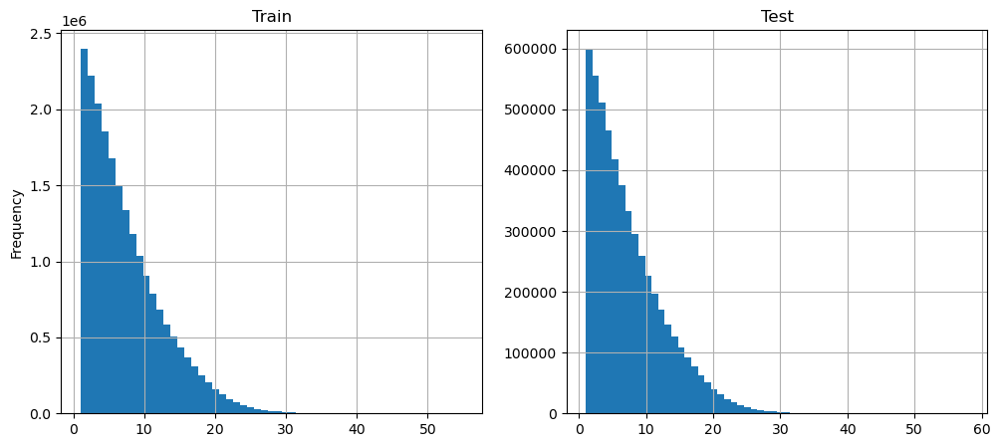

In [44]:
"""
Так как количество уникальных значений признака в train и test наборах отличаются, 
то построим их гистограммы в разных окнах, а для удобного сравнения форм распределений 
зададим каждому графику собственный масштаб (sharey=False)
"""
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=False)

# Гистограмма для train 
source_df_train['rn'].hist(bins=55, ax=axes[0])
axes[0].set_title('Train')
axes[0].set_ylabel('Frequency')

# Гистограмма для test
source_df_test['rn'].hist(bins=58, ax=axes[1])
axes[1].set_title('Test')

plt.show()

В тестовом наборе наблюдается немного больше уникальных значений признака rn — 58 против 55 в обучающей выборке, что говорит о наличии клиентов с большим количеством кредитов. Тем не менее, распределения rn в train и test остаются визуально схожими, что свидетельствует о стабильности признака и отсутствии значимого сдвига в данных. Новые значения встречаются крайне редко, не искажают общую структуру распределения и, как следствие, не должны существенно повлиять на предсказательную способность модели.

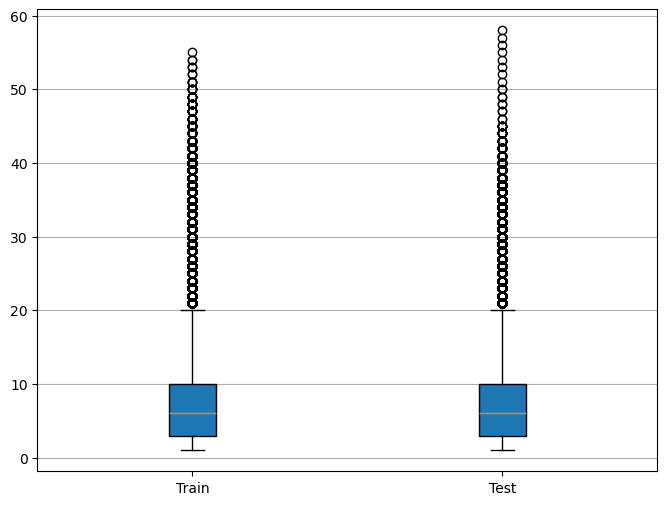

In [47]:
# Оценим визуально наличие выбросов в наборах данных
data = [
    source_df_train.rn,
    source_df_test.rn
]

plt.figure(figsize=(8, 6))
plt.boxplot(data, tick_labels=['Train', 'Test'], patch_artist=True)
plt.grid(axis='y')
plt.show()

На графике заметны выбросы среди клиентов с большим количеством кредитов. Однако я принял решение не удалять эти значения, поскольку они могут отражать важную характеристику - высокую закредитованность. Подобные случаи встречаются и в реальных данных, поэтому исключение таких наблюдений из учебного набора могло бы исказить распределение и снизить способность модели правильно обрабатывать нетипичные сценарии. Важно, чтобы модель оставалась устойчивой к аномалиям и могла эффективно выявлять и оценивать риски, связанные с редкими, но значимыми случаями.

In [54]:
"""
Добавим в df_train/df_test новую колонку 'rn_max',    
содержащую максимальное значение 'rn' для каждого 'id' из df_source.
"""
df_train = create_rn_max_feature(source_df_train, df_train)
df_test = create_rn_max_feature(source_df_test, df_test)
df_train.shape, df_test.shape

((2400000, 3), (600000, 3))

In [55]:
nan_count = df_train.isna().sum().sum()
print("Количество NaN в df_train:", nan_count)

nan_count = df_test.isna().sum().sum()
print("Количество NaN в df_test:", nan_count)

Количество NaN в df_train: 0
Количество NaN в df_test: 0


In [56]:
# Сохраним промежуточный результат
df_train.to_csv('../prepared_data/rn_train.csv', index=False)
df_test.to_csv('../prepared_data/rn_test.csv', index=False)

## Pre_features

### Research pre_features

In [58]:
source_df_train = pd.read_csv('../prepared_data/source_data_train.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [59]:
# Посмотрим на количество уникальных значений признаков
for col in df[pre_features]:
    print(col, df[col].nunique())

pre_since_opened 20
pre_since_confirmed 18
pre_pterm 18
pre_fterm 17
pre_till_pclose 17
pre_till_fclose 16
pre_loans_credit_limit 20
pre_loans_next_pay_summ 7
pre_loans_outstanding 5
pre_loans_total_overdue 2
pre_loans_max_overdue_sum 4
pre_loans_credit_cost_rate 14
pre_loans5 13
pre_loans530 20
pre_loans3060 10
pre_loans6090 5
pre_loans90 7
pre_util 20
pre_over2limit 20
pre_maxover2limit 20


In [60]:
# Посмотрим на признак с двумя значениями
df.pre_loans_total_overdue.value_counts()

pre_loans_total_overdue
0    26162716
1           1
Name: count, dtype: int64

In [50]:
# Удалим его из списка как неинформативный
pre_features_cut = [x for x in pre_features if x != 'pre_loans_total_overdue']
pre_features_cut

['pre_since_opened',
 'pre_since_confirmed',
 'pre_pterm',
 'pre_fterm',
 'pre_till_pclose',
 'pre_till_fclose',
 'pre_loans_credit_limit',
 'pre_loans_next_pay_summ',
 'pre_loans_outstanding',
 'pre_loans_max_overdue_sum',
 'pre_loans_credit_cost_rate',
 'pre_loans5',
 'pre_loans530',
 'pre_loans3060',
 'pre_loans6090',
 'pre_loans90',
 'pre_util',
 'pre_over2limit',
 'pre_maxover2limit']

In [52]:
"""
Посмотрим есть ли различия в уникальных значениях между трен и тест выборками,
выведем только признаки с различиями
"""
for col in pre_features_cut:
    if sorted(source_df_train[col].unique()) != sorted(source_df_test[col].unique()):
        print(col, sorted(source_df_train[col].unique()))
        print(col, sorted(source_df_test[col].unique()))

pre_loans_max_overdue_sum [0, 1, 2, 3]
pre_loans_max_overdue_sum [1, 2, 3]
pre_loans5 [0, 1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 16]
pre_loans5 [0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 13, 16]
pre_loans530 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
pre_loans530 [0, 1, 2, 3, 4, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19]
pre_loans3060 [0, 1, 2, 3, 5, 6, 7, 8, 9]
pre_loans3060 [1, 2, 4, 5, 6, 7, 8, 9]
pre_loans6090 [1, 2, 3, 4]
pre_loans6090 [0, 1, 2, 3, 4]


В некоторых признаках уникальные значения в тренировочной и тестовой выборках не совпадают,     
что может привести к проблемам с обобщением модели на новых данных.

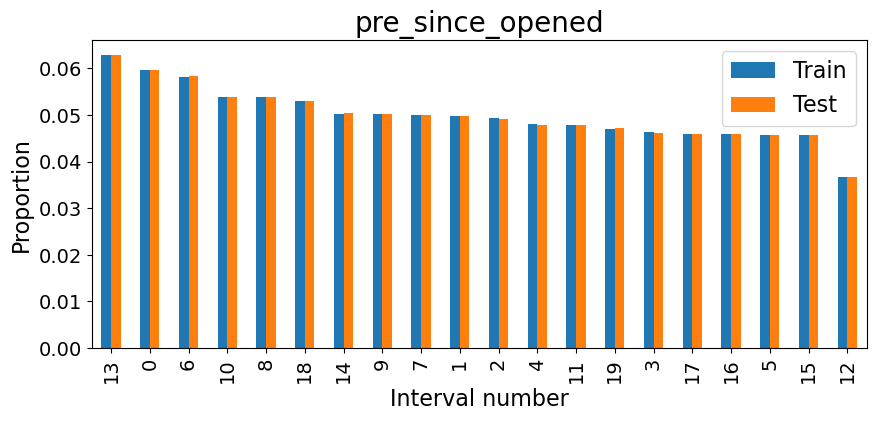

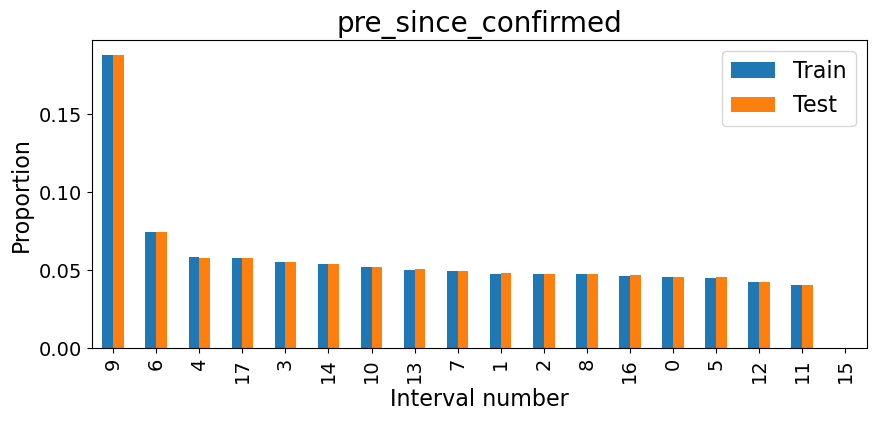

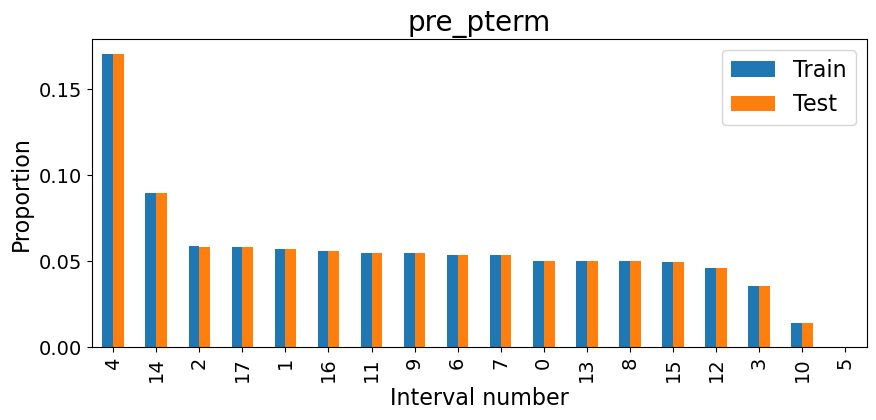

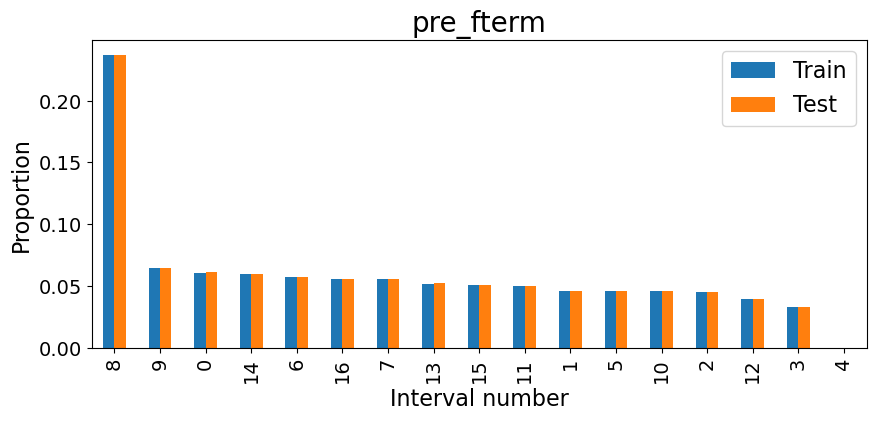

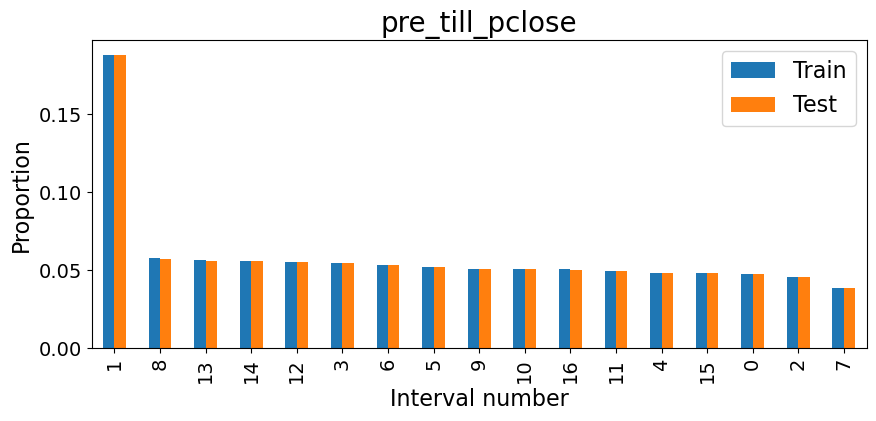

...

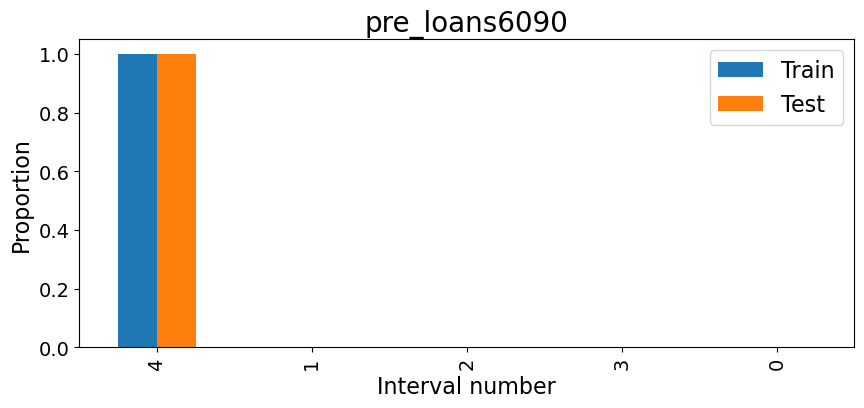

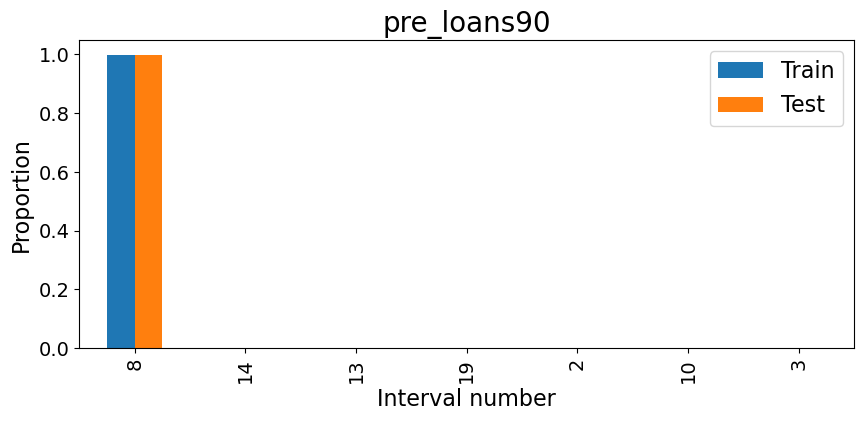

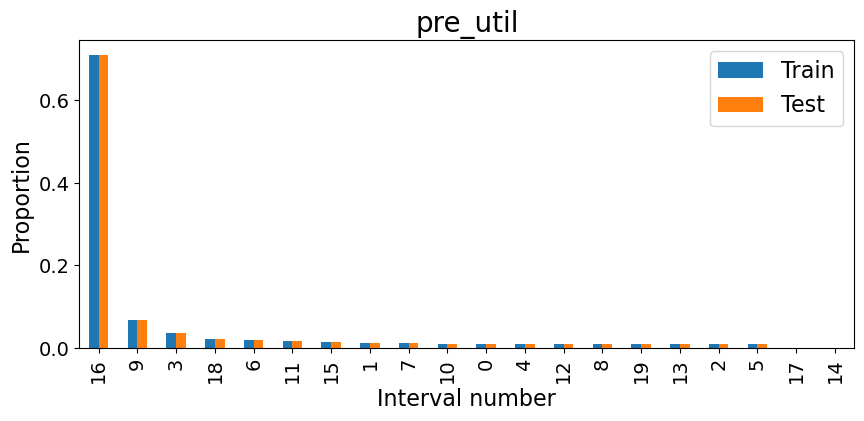

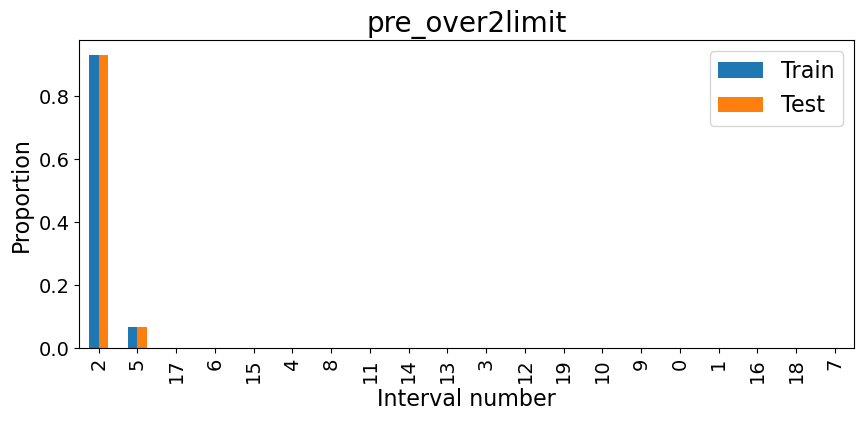

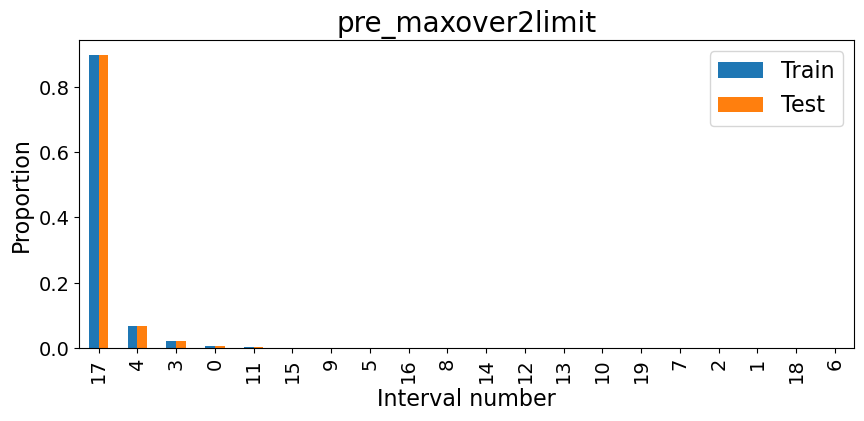

In [93]:
"""
Посмотрим на формы распределений признаков группы и сравним 
их схожесть между тренировочный и тестовым набором
"""
for col in pre_features_cut:    
    # Считаем пропорцию каждого уникального значения признака в train и test
    train_counts = source_df_train[col].value_counts(normalize=True)
    test_counts = source_df_test[col].value_counts(normalize=True)

    """
    Объединяем результаты в DataFrame с двумя столбцами: Train и Test.
    Если какая-то категория встречается только в одной из выборок,
    то для другой ставится NaN, который после объединения заменяется  на 0.
    """
    df_plot = pd.DataFrame({'Train': train_counts, 'Test': test_counts}).fillna(0)

    """
    Для сортировки категорий по убыванию доли, создадим столбец суммы частот 
    категорий в train и test.
    """
    df_plot['sum'] = df_plot['Train'] + df_plot['Test']

    # Сортируем датафрейм и удаляем колонку sum
    df_plot_sorted = df_plot.sort_values(by='sum', ascending=False).drop(columns='sum')

    # Строим bar plot
    ax = df_plot_sorted.plot(kind='bar', figsize=(10, 4))

    # Создаём подписи
    ax.set_title(col, fontsize=20)  
    ax.set_xlabel('Interval number', fontsize=16)
    ax.set_ylabel('Proportion', fontsize=16)

    # Задаём размер чисел на графике
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)

    ax.legend(fontsize=16)
    plt.show()

Визуально распределения признаков практически совпадают, что свидетельствует о корректном разбиении данных и отсутствии явного сдвига между выборками.      
Распределения по большинству признаков сильно смещены: для многих из них наблюдается выраженное преобладание одного или нескольких значений, тогда как остальные встречаются значительно реже. Это говорит о наличии дисбаланса и специфических частотных свойств в данных, что, вероятно, соответствует дисбалансу таргета.  

Бинаризация сильно искажает информацию о реальных значениях признаков: после неё нельзя утверждать, что большее значение бинаризованного признака соответствует большему количеству исходного или наоборот. При бинаризации теряется количественная информация, и признаки становятся лишь индикаторами попадания в некий общий интервал исходного признака.   
Поэтому поиск выбросов для бинаризованных признаков теряет смысл, 
а для построения признаков тренировочного датасета следует опираться на частотные свойства значений признаков.

### Create proportion value pre_feature

In [65]:
df_train = pd.read_csv('../prepared_data/rn_train.csv')
df_test = pd.read_csv('../prepared_data/rn_test.csv')
df_train.shape, df_test.shape

((2400000, 3), (600000, 3))

In [66]:
""" 
Создадим словарь, где ключами будут имена исходных признаков из pre_features,
а значениями — три уникальных значения признака, на основе которых
были созданы новые частотные признаки с наибольшим вкладом в качество модели.
"""
pre_prop_features_dictionary = {}

for col in pre_features_cut:
    print('-' * 50)
    print('Исходный признак:', col)
    
    # Создаём новые частотные признаки для каждого уникального значения признака col
    df_train, new_features_list = create_all_value_proportion_features(
        source_df_train,
        df_train,
        col
    )
    print('Новые признаки тренировочного датасета:\n' +
      '\n'.join(new_features_list))
    
    # Определяем 3 наиболее важных значения признака с помощью CatBoost
    values = choose_n_most_imp_features(df_train, new_features_list, 3)
    print('Наиболее важные категории признака:', values)
    
    # Сохраняем их в словарь
    pre_prop_features_dictionary[col] = values

    # Удаляем все новые признаки из тренировочного датафрейма
    df_train = df_train.drop(new_features_list, axis=1)

--------------------------------------------------
Исходный признак: pre_since_opened
Новые признаки тренировочного датасета:
pre_since_opened_prop_0
pre_since_opened_prop_1
pre_since_opened_prop_2
pre_since_opened_prop_3
pre_since_opened_prop_4
pre_since_opened_prop_5
pre_since_opened_prop_6
pre_since_opened_prop_7
pre_since_opened_prop_8
pre_since_opened_prop_9
pre_since_opened_prop_10
pre_since_opened_prop_11
pre_since_opened_prop_12
pre_since_opened_prop_13
pre_since_opened_prop_14
pre_since_opened_prop_15
pre_since_opened_prop_16
pre_since_opened_prop_17
pre_since_opened_prop_18
pre_since_opened_prop_19
Среднее ROC AUC на трейне: 0.6363 ± 0.0018
Среднее ROC AUC на валидации: 0.6219 ± 0.0012
Наиболее важные категории признака: [12, 19, 8]
--------------------------------------------------
Исходный признак: pre_since_confirmed
Новые признаки тренировочного датасета:
pre_since_confirmed_prop_0
pre_since_confirmed_prop_1
pre_since_confirmed_prop_2
pre_since_confirmed_prop_3
pre_since_

In [67]:
pre_prop_features_dictionary

{'pre_since_opened': [12, 19, 8],
 'pre_since_confirmed': [7, 4, 9],
 'pre_pterm': [6, 3, 4],
 'pre_fterm': [3, 8, 7],
 'pre_till_pclose': [0, 10, 7],
 'pre_till_fclose': [4, 3, 1],
 'pre_loans_credit_limit': [2, 18, 15],
 'pre_loans_next_pay_summ': [5, 2, 0],
 'pre_loans_outstanding': [3, 5, 1],
 'pre_loans_max_overdue_sum': [2, 1, 3],
 'pre_loans_credit_cost_rate': [6, 4, 11],
 'pre_loans5': [6, 0, 3],
 'pre_loans530': [13, 16, 2],
 'pre_loans3060': [5, 8, 9],
 'pre_loans6090': [4, 2, 1],
 'pre_loans90': [8, 14, 13],
 'pre_util': [16, 6, 3],
 'pre_over2limit': [2, 5, 17],
 'pre_maxover2limit': [17, 4, 9]}

In [68]:
# Создадим признаки из выбранных значений в тренировочном датасете
df_train = create_definite_value_proportion_features(
    source_df_train,
    df_train,
    pre_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: pre_since_opened
Новые фичи:
pre_since_opened_prop_12
pre_since_opened_prop_19
pre_since_opened_prop_8
--------------------------------------------------
Исходный признак: pre_since_confirmed
Новые фичи:
pre_since_confirmed_prop_7
pre_since_confirmed_prop_4
pre_since_confirmed_prop_9
--------------------------------------------------
Исходный признак: pre_pterm
Новые фичи:
pre_pterm_prop_6
pre_pterm_prop_3
pre_pterm_prop_4
--------------------------------------------------
Исходный признак: pre_fterm
Новые фичи:
pre_fterm_prop_3
pre_fterm_prop_8
pre_fterm_prop_7
--------------------------------------------------
Исходный признак: pre_till_pclose
Новые фичи:
pre_till_pclose_prop_0
pre_till_pclose_prop_10
pre_till_pclose_prop_7
--------------------------------------------------
Исходный признак: pre_till_fclose
Новые фичи:
pre_till_fclose_prop_4
pre_till_fclose_prop_3
pre_till_fclose_prop_1
-----------------------------

In [69]:
# Создадим признаки из выбранных значений в тестовом датасете
df_test = create_definite_value_proportion_features(
    source_df_test,
    df_test,
    pre_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: pre_since_opened
Новые фичи:
pre_since_opened_prop_12
pre_since_opened_prop_19
pre_since_opened_prop_8
--------------------------------------------------
Исходный признак: pre_since_confirmed
Новые фичи:
pre_since_confirmed_prop_7
pre_since_confirmed_prop_4
pre_since_confirmed_prop_9
--------------------------------------------------
Исходный признак: pre_pterm
Новые фичи:
pre_pterm_prop_6
pre_pterm_prop_3
pre_pterm_prop_4
--------------------------------------------------
Исходный признак: pre_fterm
Новые фичи:
pre_fterm_prop_3
pre_fterm_prop_8
pre_fterm_prop_7
--------------------------------------------------
Исходный признак: pre_till_pclose
Новые фичи:
pre_till_pclose_prop_0
pre_till_pclose_prop_10
pre_till_pclose_prop_7
--------------------------------------------------
Исходный признак: pre_till_fclose
Новые фичи:
pre_till_fclose_prop_4
pre_till_fclose_prop_3
pre_till_fclose_prop_1
-----------------------------

In [70]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/pre_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/pre_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 60), (600000, 60))

In [71]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[3:]

for col in columns:
    print(df_train[col].nunique(), col)

483 pre_since_opened_prop_12
370 pre_since_opened_prop_19
255 pre_since_opened_prop_8
226 pre_since_confirmed_prop_7
240 pre_since_confirmed_prop_4
463 pre_since_confirmed_prop_9
230 pre_pterm_prop_6
493 pre_pterm_prop_3
536 pre_pterm_prop_4
483 pre_fterm_prop_3
495 pre_fterm_prop_8
199 pre_fterm_prop_7
222 pre_till_pclose_prop_0
273 pre_till_pclose_prop_10
452 pre_till_pclose_prop_7
182 pre_till_fclose_prop_4
245 pre_till_fclose_prop_3
236 pre_till_fclose_prop_1
320 pre_loans_credit_limit_prop_2
453 pre_loans_credit_limit_prop_18
228 pre_loans_credit_limit_prop_15
300 pre_loans_next_pay_summ_prop_5
468 pre_loans_next_pay_summ_prop_2
229 pre_loans_next_pay_summ_prop_0
336 pre_loans_outstanding_prop_3
152 pre_loans_outstanding_prop_5
205 pre_loans_outstanding_prop_1
335 pre_loans_max_overdue_sum_prop_2
289 pre_loans_max_overdue_sum_prop_1
238 pre_loans_max_overdue_sum_prop_3
521 pre_loans_credit_cost_rate_prop_6
512 pre_loans_credit_cost_rate_prop_4
287 pre_loans_credit_cost_rate_prop_1

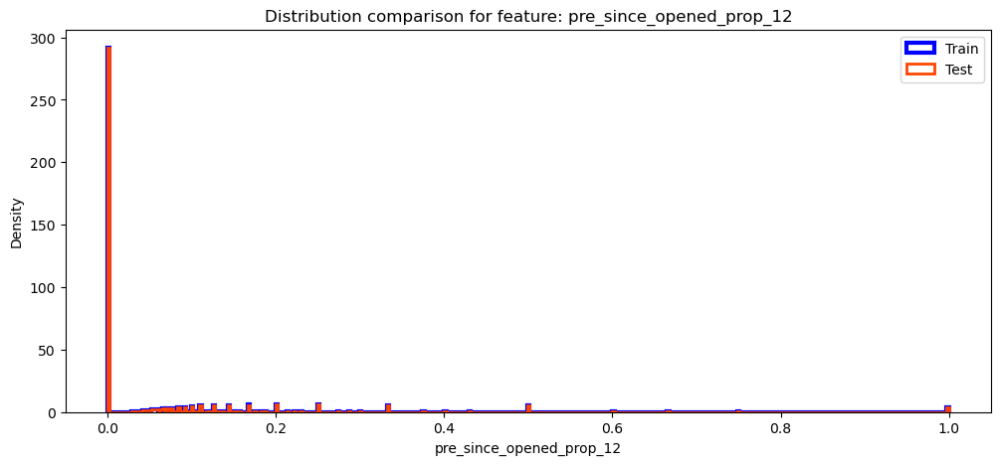

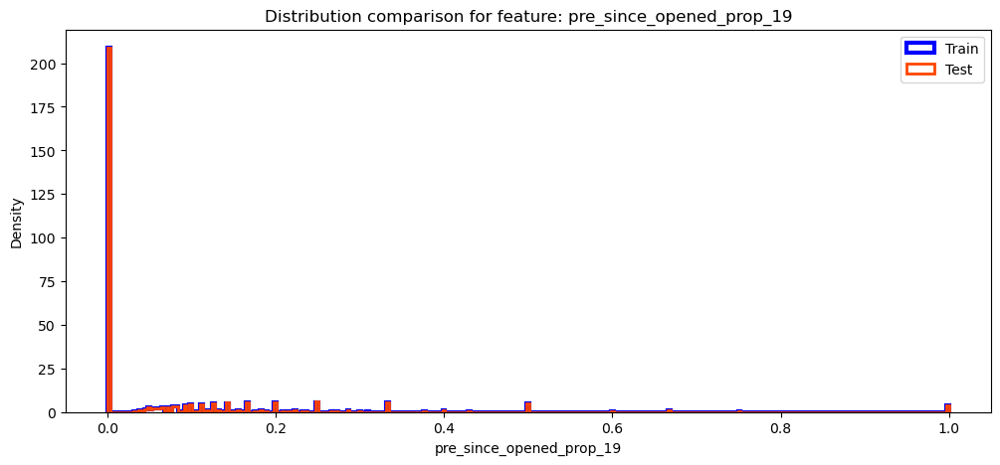

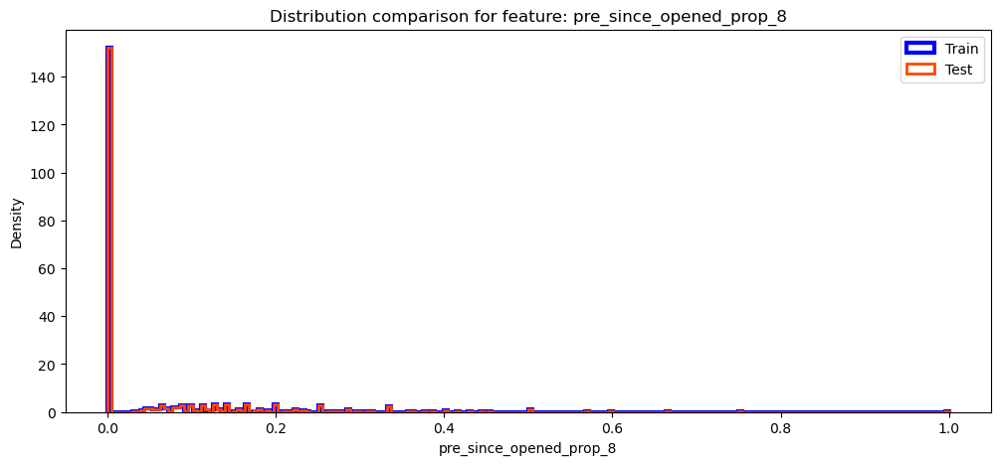

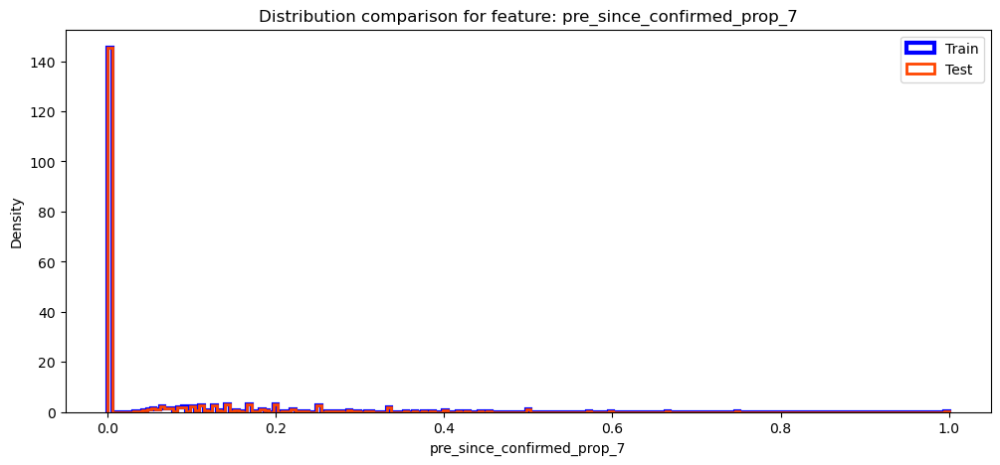

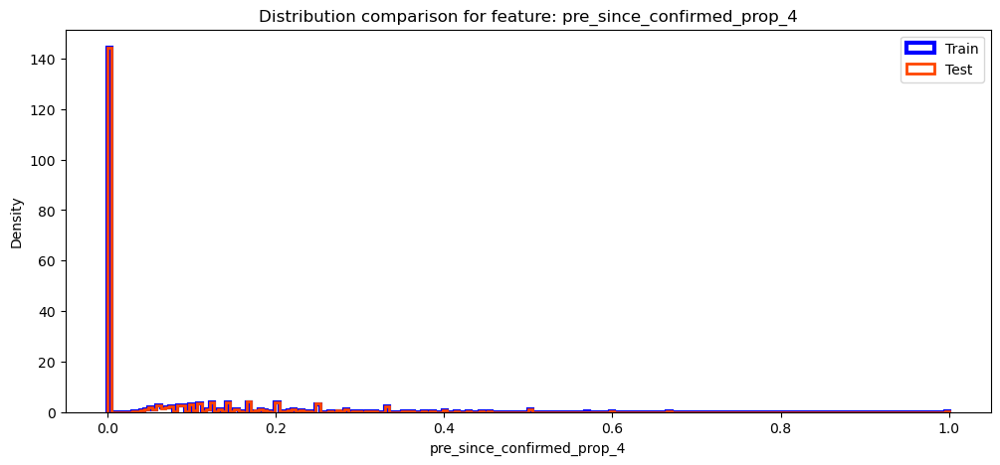

...

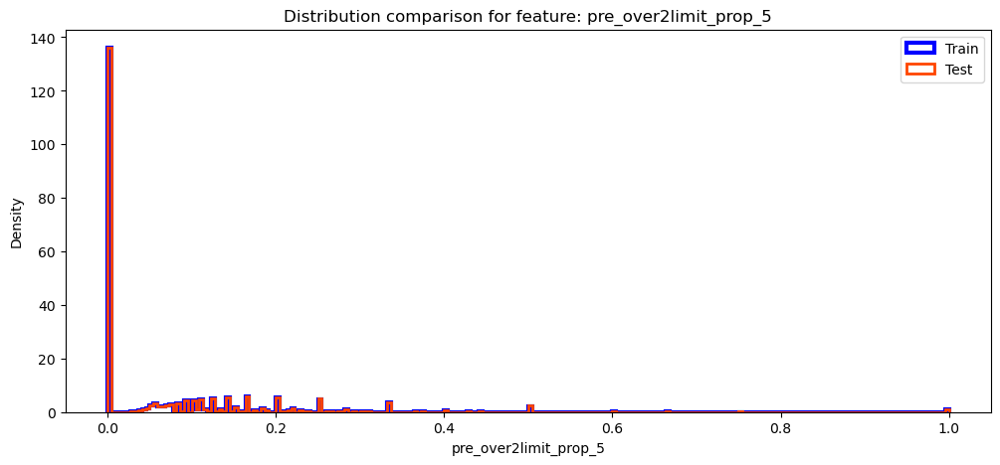

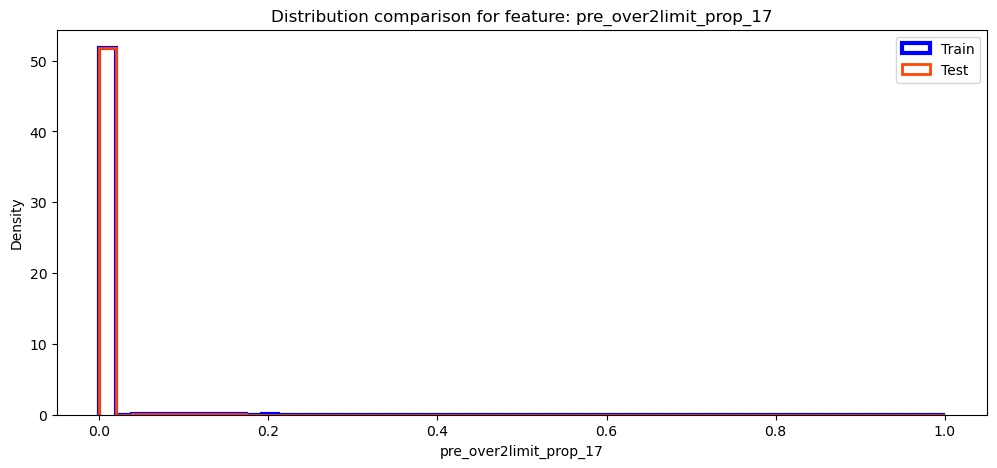

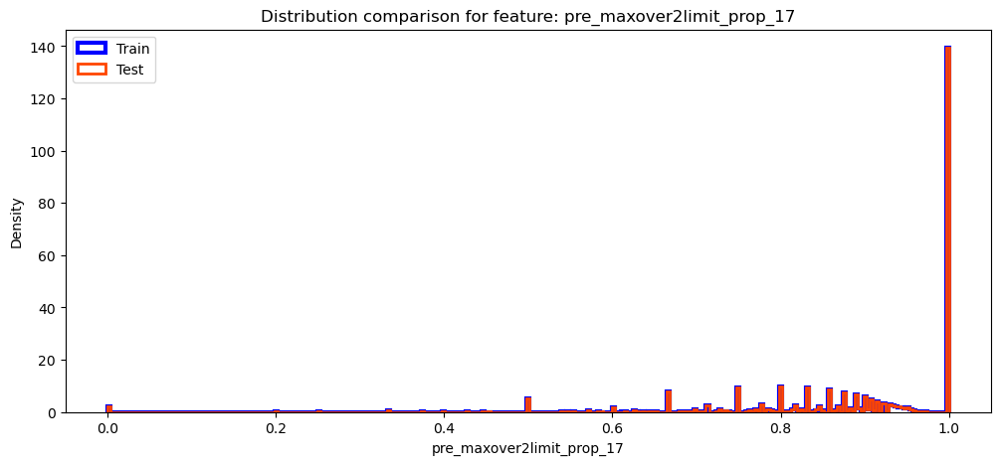

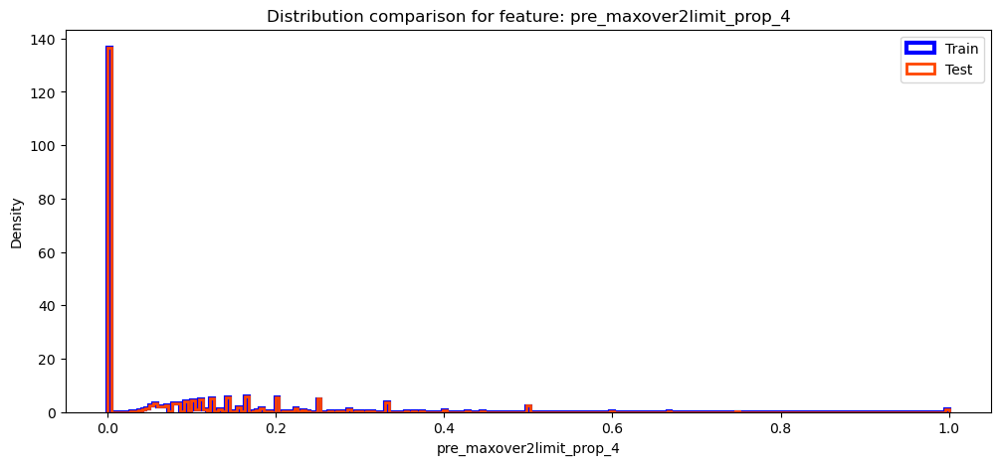

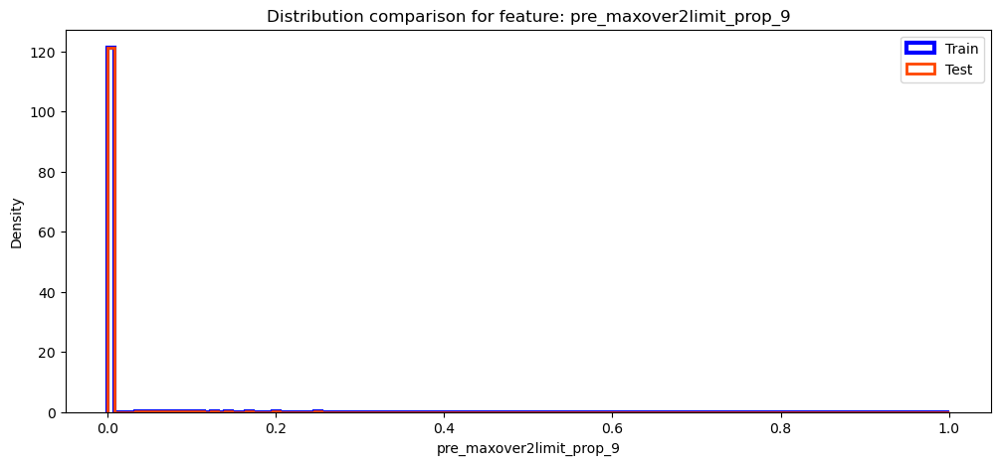

In [72]:
# Визуально сравним распределения признаков для тренировочного и тестового датасетов
columns = df_train.columns[3:]
for col in columns:
    plt.figure(figsize=(12, 5))
    
    # Выбираем количество бинов как минимальное число уникальных значений в train и test
    bins = min(df_train[col].nunique(), df_test[col].nunique())
    
    # Строим нормализованные гистограммы для тренировочного и тестового наборов
    plt.hist(
        df_train[col],
        bins=bins,
        density=True,
        label='Train',
        color='blue',
        histtype='step',
        linewidth=3
    )
    plt.hist(
        df_test[col],
        bins=bins,
        density=True,
        label='Test',
        color='orangered',
        histtype='step',
        linewidth=2
    )

    plt.title(f'Distribution comparison for feature: {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()
    plt.show()

За исключением pre_loans3060_prop_9 распределения практически совпадают.   
Можно отметить что смещение распределений усилилось по сравнению с исходными признаками.

In [73]:
# Проведём кроссвалидацию нового датасета
df_metrics, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'pre_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7479
ROC AUC на валидации: 0.7268
ROC AUC на тесте: 0.7256
Фолд 1
ROC AUC на трейне: 0.7461
ROC AUC на валидации: 0.7227
ROC AUC на тесте: 0.7258
Фолд 2
ROC AUC на трейне: 0.7460
ROC AUC на валидации: 0.7233
ROC AUC на тесте: 0.7263
Фолд 3
ROC AUC на трейне: 0.7454
ROC AUC на валидации: 0.7248
ROC AUC на тесте: 0.7265
Фолд 4
ROC AUC на трейне: 0.7452
ROC AUC на валидации: 0.7241
ROC AUC на тесте: 0.7260
Среднее ROC AUC на трейне: 0.7461 ± 0.0009
Среднее ROC AUC на валидации: 0.7243 ± 0.0014
Среднее ROC AUC на тесте: 0.7260 ± 0.0003


In [74]:
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326


In [75]:
# Посмотрим на важности фичей
importances_dict

{'pre_loans_credit_limit_prop_2': 6.376457919873512,
 'pre_util_prop_3': 5.5796541574975,
 'pre_util_prop_16': 5.255955813946264,
 'rn_max': 4.821434332757035,
 'pre_loans_credit_cost_rate_prop_6': 4.6313343374306895,
 'pre_till_pclose_prop_10': 4.406546352355341,
 'pre_loans_max_overdue_sum_prop_2': 4.27265930851066,
 'pre_util_prop_6': 4.109190451463819,
 'pre_since_opened_prop_12': 4.063472699933333,
 'pre_loans_credit_cost_rate_prop_4': 3.260494649492927,
 'pre_loans_next_pay_summ_prop_2': 3.1928362158296006,
 'pre_loans_max_overdue_sum_prop_1': 3.147872631654345,
 'pre_loans_credit_cost_rate_prop_11': 3.017675727010026,
 'pre_loans_outstanding_prop_1': 2.9772081398563963,
 'pre_loans_next_pay_summ_prop_5': 2.59410965272306,
 'pre_fterm_prop_8': 2.3815563754818414,
 'pre_pterm_prop_6': 2.279425445971348,
 'pre_maxover2limit_prop_17': 2.1491539414438616,
 'pre_loans_credit_limit_prop_18': 2.1323545632698,
 'pre_loans_credit_limit_prop_15': 1.932169274411099,
 'pre_loans_outstanding_

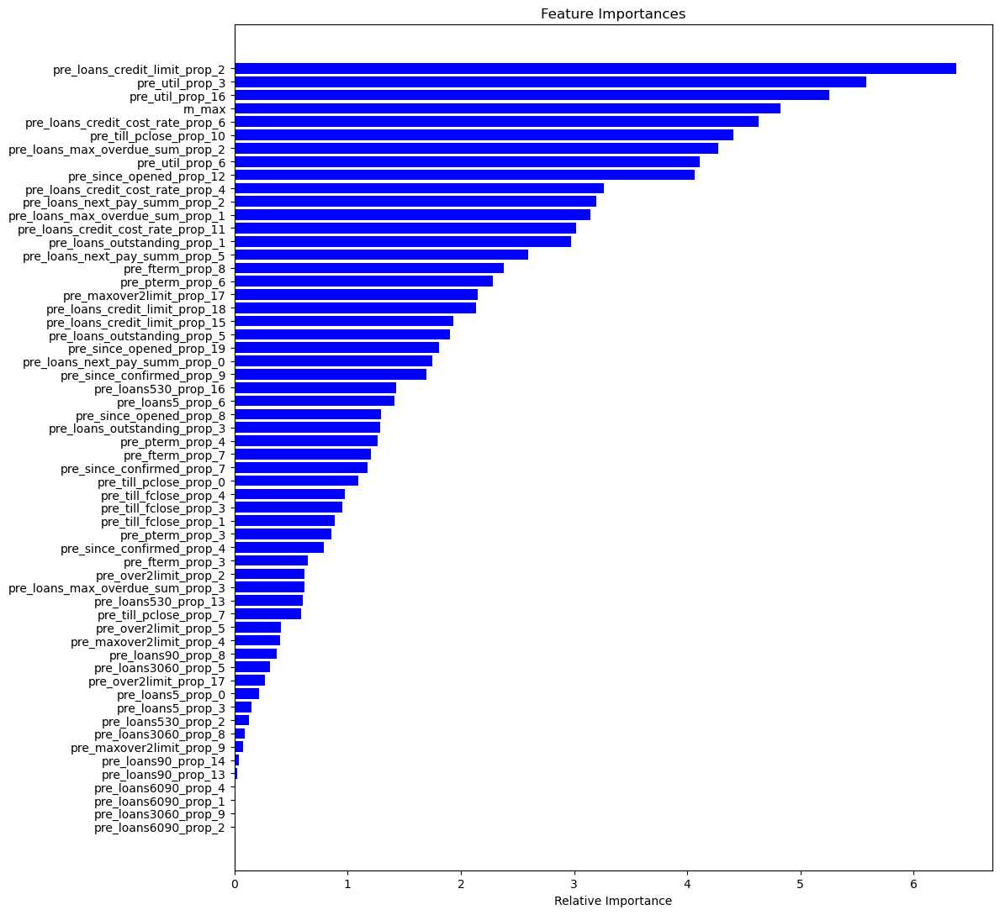

In [76]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

### Create mean value frequency pre_features

In [77]:
df_train = pd.read_csv('../prepared_data/pre_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/pre_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 60), (600000, 60))

Циклом пройдём по списку pre_features и для каждого исходного признака
создадим агрегированный признак отражающий суммированную относительную встречаемость
значений исходного признака по каждому id, нормированную на количество записей у id.

In [78]:
print('New  df_train columns')
for col in pre_features_cut:
    df_train = create_mean_values_frequency_feature(
        source_df_train,
        df_train,
        col
    )
    
df_train.shape

New  df_train columns
pre_since_opened_mean_freq
pre_since_confirmed_mean_freq
pre_pterm_mean_freq
pre_fterm_mean_freq
pre_till_pclose_mean_freq
pre_till_fclose_mean_freq
pre_loans_credit_limit_mean_freq
pre_loans_next_pay_summ_mean_freq
pre_loans_outstanding_mean_freq
pre_loans_max_overdue_sum_mean_freq
pre_loans_credit_cost_rate_mean_freq
pre_loans5_mean_freq
pre_loans530_mean_freq
pre_loans3060_mean_freq
pre_loans6090_mean_freq
pre_loans90_mean_freq
pre_util_mean_freq
pre_over2limit_mean_freq
pre_maxover2limit_mean_freq


(2400000, 79)

In [79]:
print('New df_test columns')
for col in pre_features_cut:
    df_test = create_mean_values_frequency_feature(
        source_df_test,
        df_test,
        col
    )
    
df_test.shape

New df_test columns
pre_since_opened_mean_freq
pre_since_confirmed_mean_freq
pre_pterm_mean_freq
pre_fterm_mean_freq
pre_till_pclose_mean_freq
pre_till_fclose_mean_freq
pre_loans_credit_limit_mean_freq
pre_loans_next_pay_summ_mean_freq
pre_loans_outstanding_mean_freq
pre_loans_max_overdue_sum_mean_freq
pre_loans_credit_cost_rate_mean_freq
pre_loans5_mean_freq
pre_loans530_mean_freq
pre_loans3060_mean_freq
pre_loans6090_mean_freq
pre_loans90_mean_freq
pre_util_mean_freq
pre_over2limit_mean_freq
pre_maxover2limit_mean_freq


(600000, 79)

In [80]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/pre_f_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/pre_f_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 79), (600000, 79))

In [81]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-19:]

for col in columns:
    print(df_train[col].nunique(), col)

1334951 pre_since_opened_mean_freq
1247657 pre_since_confirmed_mean_freq
1260740 pre_pterm_mean_freq
1159709 pre_fterm_mean_freq
1245038 pre_till_pclose_mean_freq
1124589 pre_till_fclose_mean_freq
1360109 pre_loans_credit_limit_mean_freq
108618 pre_loans_next_pay_summ_mean_freq
9832 pre_loans_outstanding_mean_freq
2162 pre_loans_max_overdue_sum_mean_freq
742565 pre_loans_credit_cost_rate_mean_freq
1668 pre_loans5_mean_freq
5910 pre_loans530_mean_freq
314 pre_loans3060_mean_freq
81 pre_loans6090_mean_freq
335 pre_loans90_mean_freq
328242 pre_util_mean_freq
5817 pre_over2limit_mean_freq
27874 pre_maxover2limit_mean_freq


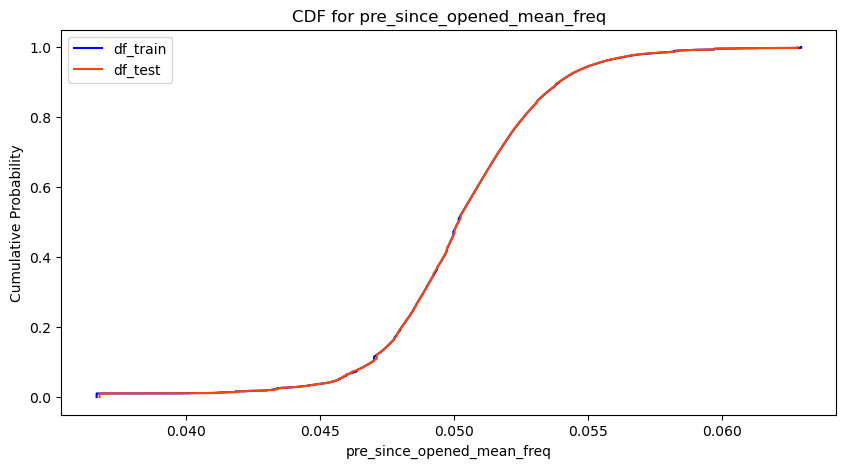

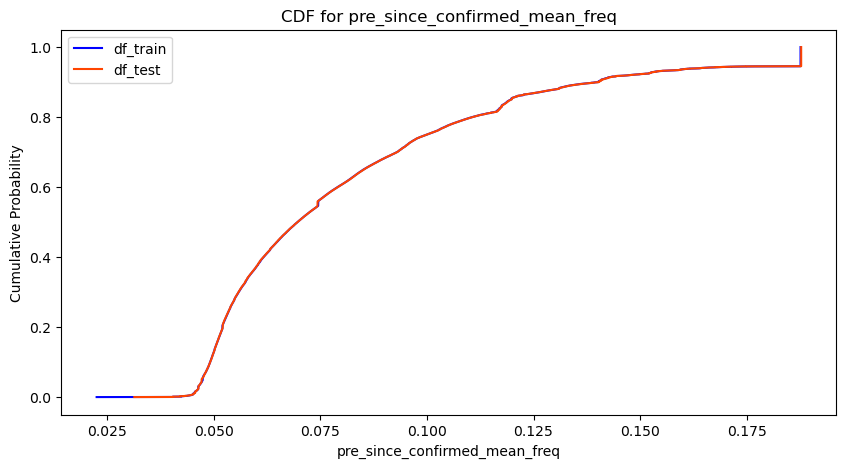

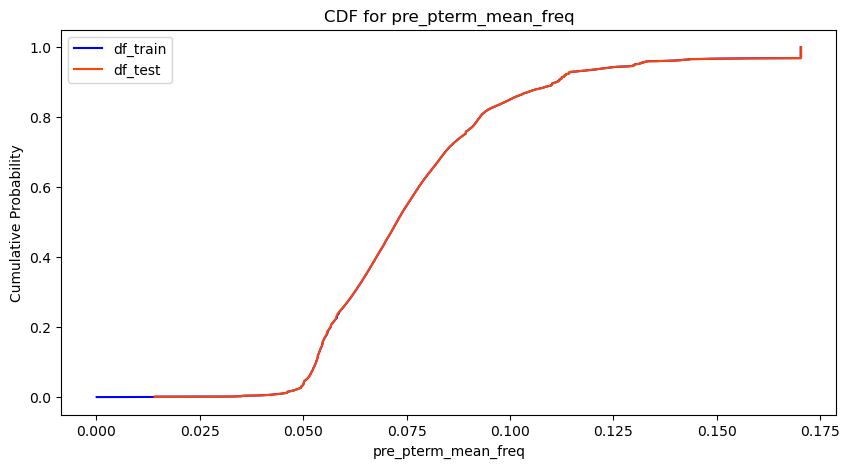

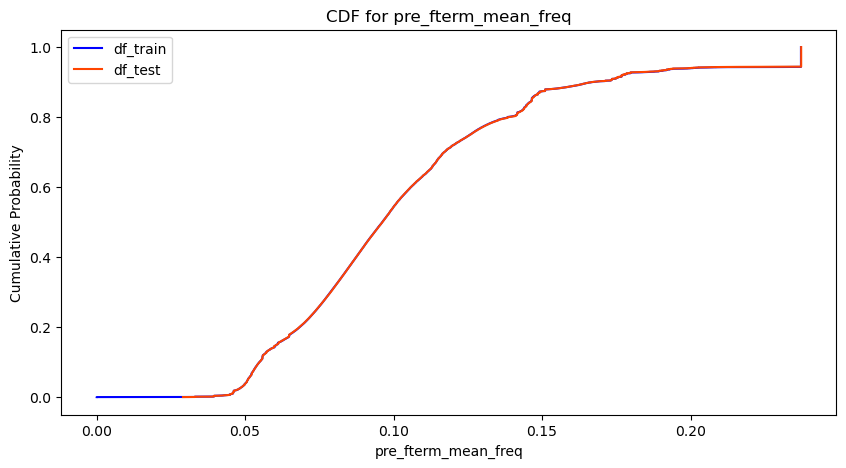

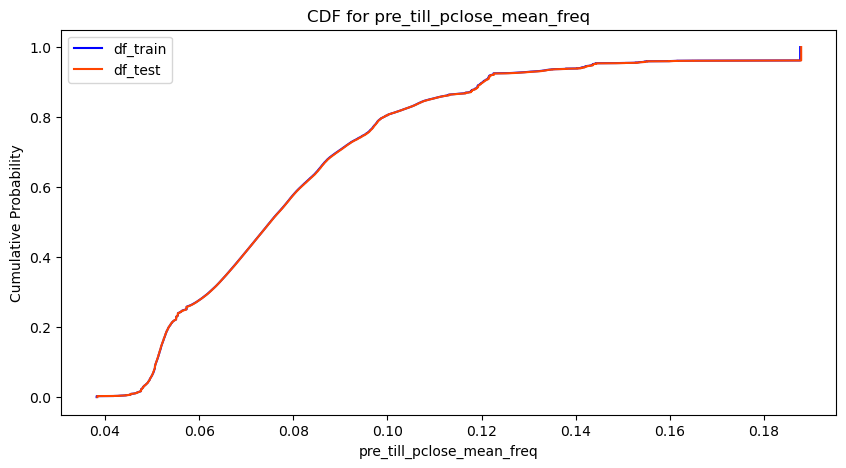

...

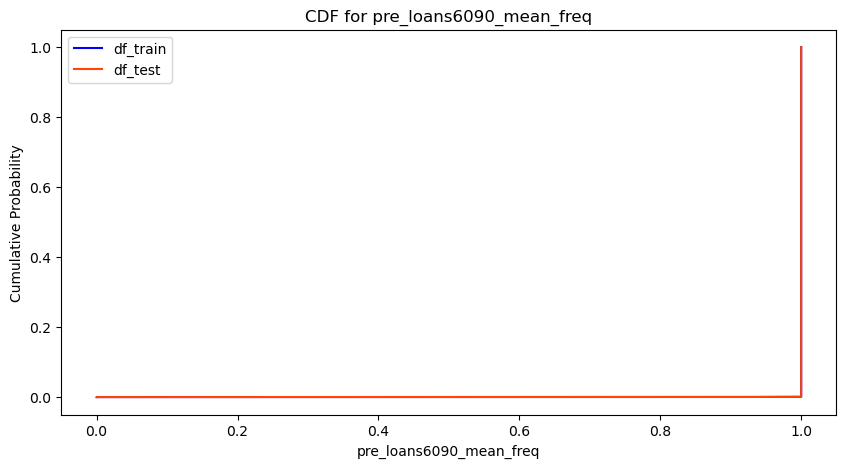

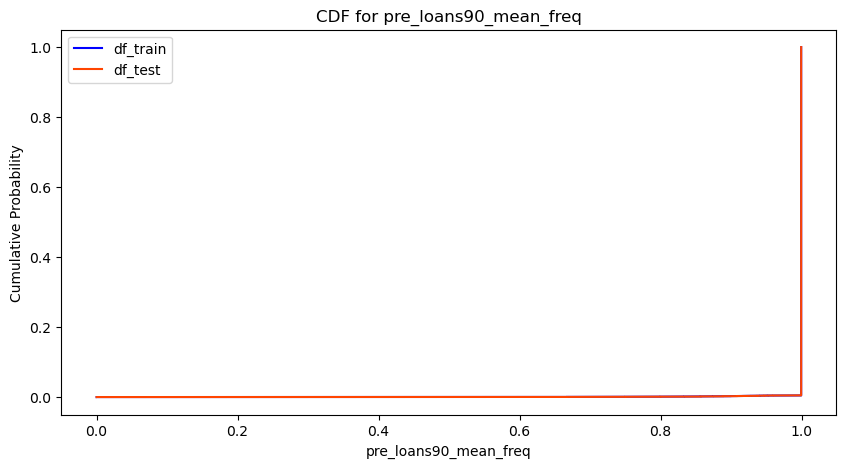

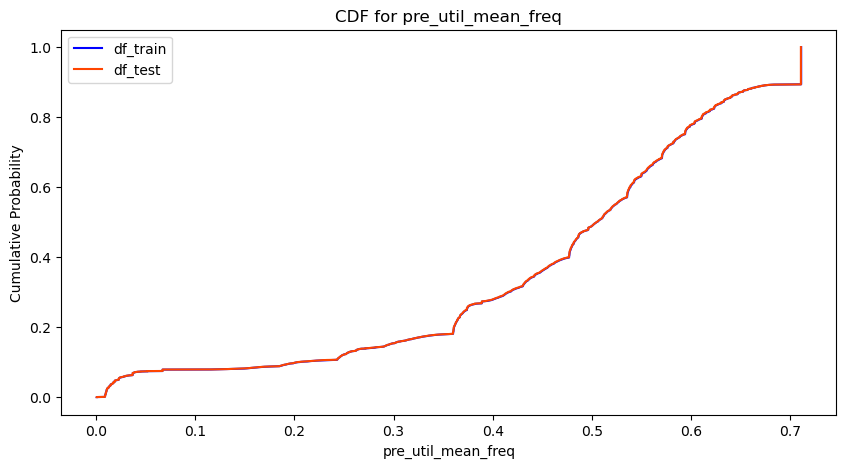

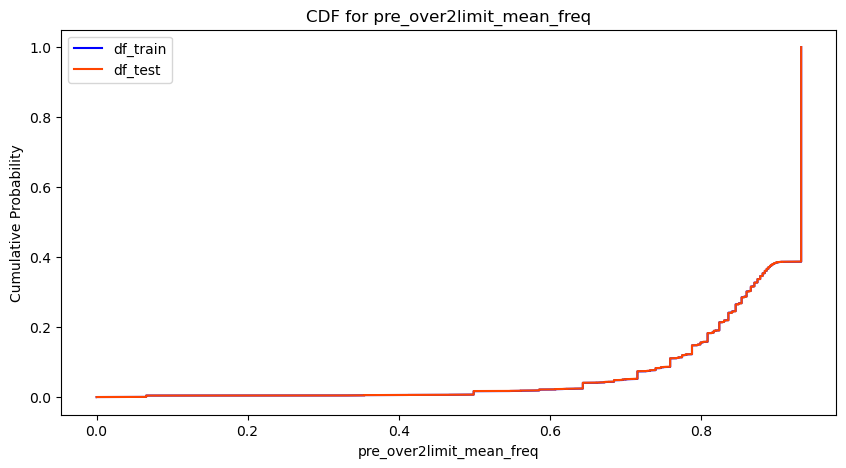

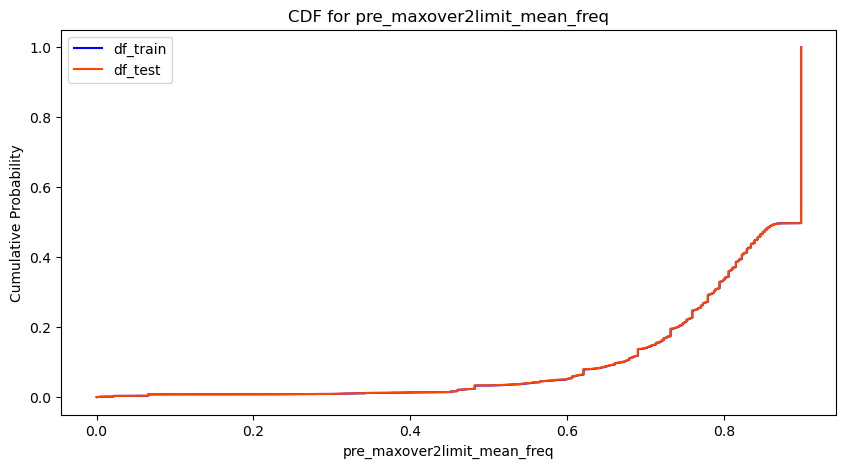

In [82]:
""" 
Так как у нас есть признаки с очень большим количеством уникальных значений 
то для сравнения распределений новых признаков используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-19:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Распределения новых признаков в тренировочном и тестовом датасетах практически идентичны.
Распределения некоторых признаки имеют сильный перекос. 

In [83]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(
    df_train,
    df_test,
    'pre_f_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7507
ROC AUC на валидации: 0.7315
ROC AUC на тесте: 0.7292
Фолд 1
ROC AUC на трейне: 0.7522
ROC AUC на валидации: 0.7279
ROC AUC на тесте: 0.7293
Фолд 2
ROC AUC на трейне: 0.7515
ROC AUC на валидации: 0.7267
ROC AUC на тесте: 0.7294
Фолд 3
ROC AUC на трейне: 0.7623
ROC AUC на валидации: 0.7276
ROC AUC на тесте: 0.7292
Фолд 4
ROC AUC на трейне: 0.7510
ROC AUC на валидации: 0.7278
ROC AUC на тесте: 0.7297
Среднее ROC AUC на трейне: 0.7535 ± 0.0044
Среднее ROC AUC на валидации: 0.7283 ± 0.0016
Среднее ROC AUC на тесте: 0.7293 ± 0.0002


In [84]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196


In [85]:
# Посмотрим на важности фичей
importances_dict

{'pre_loans_credit_limit_prop_2': 5.6804090789257815,
 'pre_util_prop_3': 4.962454227907478,
 'pre_loans_credit_cost_rate_prop_6': 4.452110235755611,
 'pre_since_opened_mean_freq': 4.33822323858817,
 'pre_till_pclose_prop_10': 3.914136034415266,
 'rn_max': 3.6952836916156486,
 'pre_util_prop_6': 3.661882795614431,
 'pre_loans_credit_limit_mean_freq': 3.164961466612138,
 'pre_loans_max_overdue_sum_prop_1': 2.928329326206444,
 'pre_util_prop_16': 2.923756028824394,
 'pre_since_opened_prop_12': 2.8419989147883196,
 'pre_loans_credit_cost_rate_prop_11': 2.780109437665167,
 'pre_util_mean_freq': 2.744236578827554,
 'pre_loans_outstanding_prop_1': 2.6338910825309005,
 'pre_loans_credit_cost_rate_prop_4': 2.5970933756493193,
 'pre_loans_next_pay_summ_prop_5': 2.234772426430629,
 'pre_loans_credit_cost_rate_mean_freq': 2.234575831132636,
 'pre_till_fclose_mean_freq': 2.035984553568312,
 'pre_loans_max_overdue_sum_prop_2': 1.9995950196290464,
 'pre_pterm_prop_6': 1.9452148253223687,
 'pre_loans

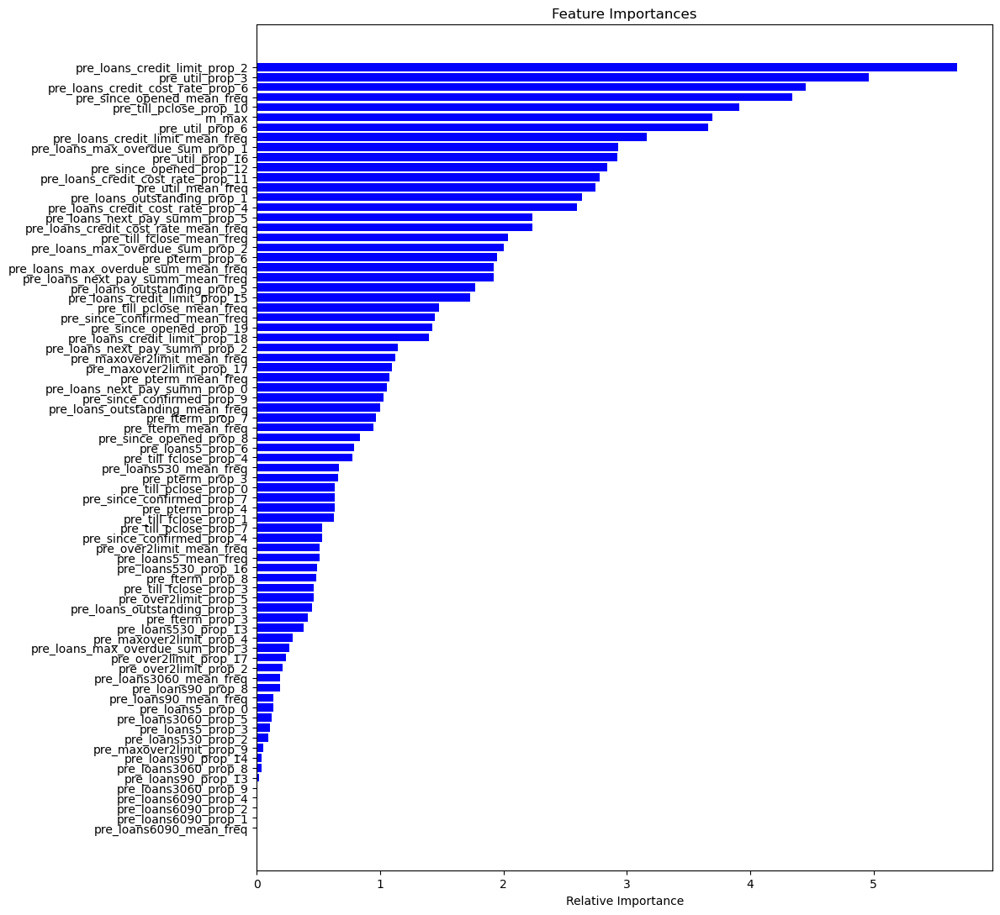

In [86]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

## Enc_features

### Research enc_features

In [88]:
source_df_train = pd.read_csv('../prepared_data/source_data_train.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [80]:
# Посмотрим на количество уникальных значений признаков в train и test
for col in enc_features:
    print(
        f'{col} train: {source_df_train[col].nunique()}'
        f'  test: {source_df_test[col].nunique()}')

enc_loans_account_holder_type train: 7  test: 7
enc_loans_credit_status train: 7  test: 7
enc_loans_credit_type train: 8  test: 8
enc_loans_account_cur train: 4  test: 4


In [84]:
"""
Посмотрим есть ли различия в уникальных значениях между трен и тест выборками,
выведем только признаки с различиями
"""
found_difference = False
for col in enc_features:
    if sorted(source_df_train[col].unique()) != sorted(source_df_test[col].unique()):
        print(col, sorted(source_df_train[col].unique()))
        print(col, sorted(source_df_test[col].unique()))
        found_difference = True
if not found_difference:
  print("All values are matched")

All values are matched


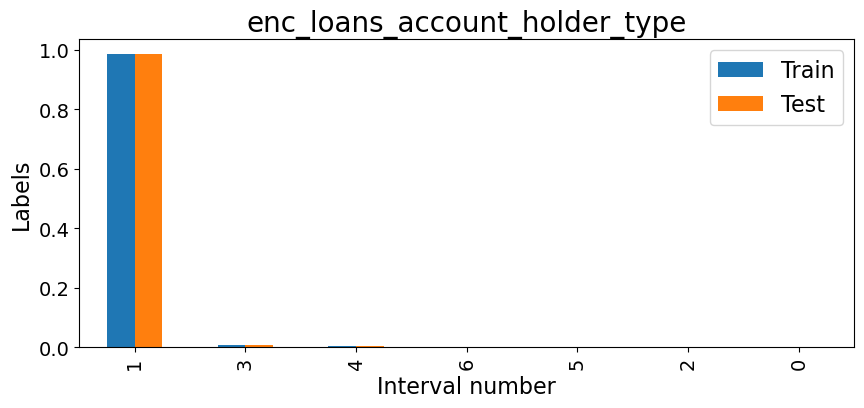

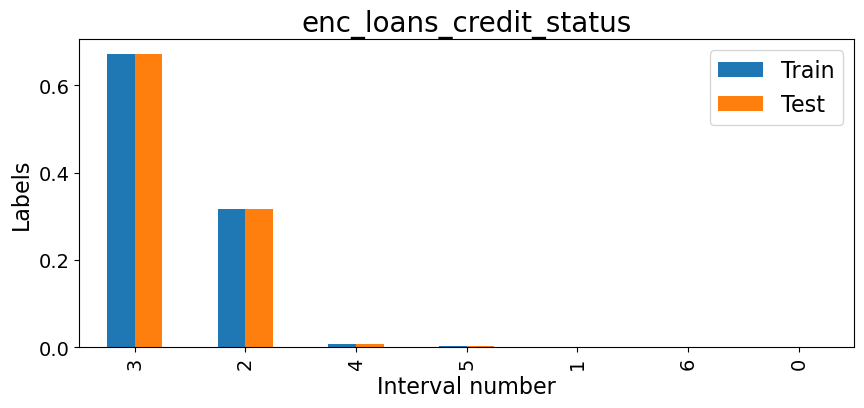

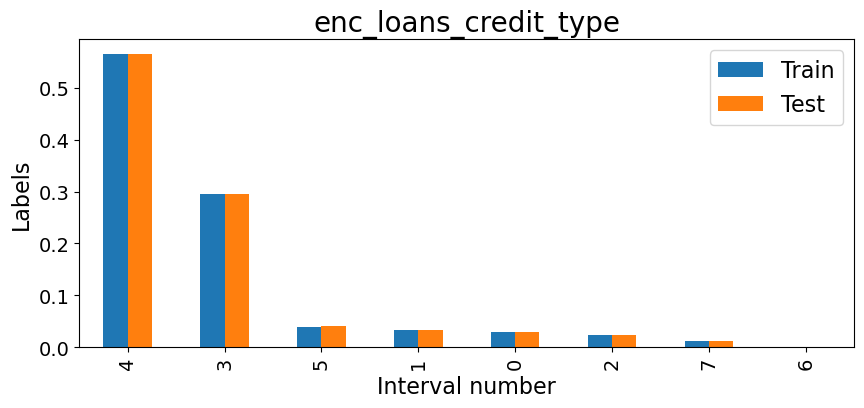

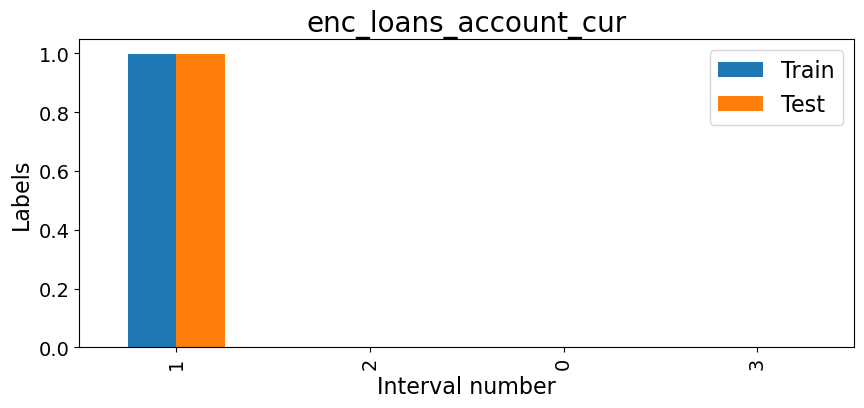

In [94]:
"""
Посмотрим на формы распределений признаков группы и сравним 
их схожесть между тренировочный и тестовым набором.
"""
for col in enc_features:    
    # Считаем пропорцию каждого уникального значения признака в train и test
    train_counts = source_df_train[col].value_counts(normalize=True)
    test_counts = source_df_test[col].value_counts(normalize=True)

    """
    Объединяем результаты в DataFrame с двумя столбцами: Train и Test.
    Если какая-то категория встречается только в одной из выборок,
    то для другой ставится NaN, который после объединения заменяется  на 0.
    """
    df_plot = pd.DataFrame({'Train': train_counts, 'Test': test_counts}).fillna(0)

    """
    Для сортировки категорий по убыванию доли, создадим столбец суммы частот 
    категорий в train и test.
    """
    df_plot['sum'] = df_plot['Train'] + df_plot['Test']

    # Сортируем датафрейм и удаляем колонку sum
    df_plot_sorted = df_plot.sort_values(by='sum', ascending=False).drop(columns='sum')

    # Строим bar plot
    ax = df_plot_sorted.plot(kind='bar', figsize=(10, 4))

    # Создаём подписи
    ax.set_title(col, fontsize=20)  
    ax.set_xlabel('Interval number', fontsize=16)
    ax.set_ylabel('Labels', fontsize=16)

    # Задаём размер чисел на графике
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)

    ax.legend(fontsize=16)
    plt.show()

Можно сделать выводы схожие с выводами из Research pre_features.
Распределения признаков сильно смещены: для многих из них наблюдается выраженное преобладание одного или нескольких значений, тогда как остальные встречаются значительно реже. Это говорит о наличии дисбаланса и специфических частотных свойств в данных, что, вероятно, соответствует дисбалансу таргета.

Кодирование меньше искажает информацию о реальных значениях признаков чем бинаризация, но после неё также нельзя утверждать, что большее значение закодированного признака соответствует большему количеству исходного или наоборот. 

Поиск выбросов здесь тоже не имеет смысла 
и для построения признаков тренировочного датасета также следует опираться на частотные свойства значений признаков.

### Create proportion value enc_features

In [92]:
df_train = pd.read_csv('../prepared_data/pre_f_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/pre_f_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 79), (600000, 79))

In [93]:
""" 
Создадим словарь, где ключами будут имена исходных признаков из Enc_features,
а значениями — три уникальных значения признака, на основе которых
были созданы новые частотные признаки с наибольшим вкладом в качество модели.
"""
enc_prop_features_dictionary = {}

for col in enc_features:
    print('-' * 50)
    print('Исходный признак:', col)
    
    # Создаём новые частотные признаки для каждого уникального значения признака col
    df_train, new_features_list = create_all_value_proportion_features(
        source_df_train,
        df_train,
        col
    )
    print('Новые признаки тренировочного датасета:\n' +
      '\n'.join(new_features_list))
    
    # Определяем 3 наиболее важных значения признака с помощью CatBoost
    values = choose_n_most_imp_features(df_train, new_features_list, 3)
    print('Наиболее важные категории признака:', values)
    
    # Сохраняем их в словарь
    enc_prop_features_dictionary[col] = values

    # Удаляем все новые признаки из тренировочного датафрейма
    df_train = df_train.drop(new_features_list, axis=1)

--------------------------------------------------
Исходный признак: enc_loans_account_holder_type
Новые признаки тренировочного датасета:
enc_loans_account_holder_type_prop_0
enc_loans_account_holder_type_prop_1
enc_loans_account_holder_type_prop_2
enc_loans_account_holder_type_prop_3
enc_loans_account_holder_type_prop_4
enc_loans_account_holder_type_prop_5
enc_loans_account_holder_type_prop_6
Среднее ROC AUC на трейне: 0.5185 ± 0.0005
Среднее ROC AUC на валидации: 0.5180 ± 0.0009
Наиболее важные категории признака: [1, 3, 4]
--------------------------------------------------
Исходный признак: enc_loans_credit_status
Новые признаки тренировочного датасета:
enc_loans_credit_status_prop_0
enc_loans_credit_status_prop_1
enc_loans_credit_status_prop_2
enc_loans_credit_status_prop_3
enc_loans_credit_status_prop_4
enc_loans_credit_status_prop_5
enc_loans_credit_status_prop_6
Среднее ROC AUC на трейне: 0.5904 ± 0.0018
Среднее ROC AUC на валидации: 0.5845 ± 0.0026
Наиболее важные категории пр

In [94]:
enc_prop_features_dictionary

{'enc_loans_account_holder_type': [1, 3, 4],
 'enc_loans_credit_status': [5, 3, 2],
 'enc_loans_credit_type': [0, 5, 2],
 'enc_loans_account_cur': [1, 2, 0]}

In [95]:
# Создадим признаки из выбранных значений в тренировочном датасете
df_train = create_definite_value_proportion_features(
    source_df_train,
    df_train,
    enc_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: enc_loans_account_holder_type
Новые фичи:
enc_loans_account_holder_type_prop_1
enc_loans_account_holder_type_prop_3
enc_loans_account_holder_type_prop_4
--------------------------------------------------
Исходный признак: enc_loans_credit_status
Новые фичи:
enc_loans_credit_status_prop_5
enc_loans_credit_status_prop_3
enc_loans_credit_status_prop_2
--------------------------------------------------
Исходный признак: enc_loans_credit_type
Новые фичи:
enc_loans_credit_type_prop_0
enc_loans_credit_type_prop_5
enc_loans_credit_type_prop_2
--------------------------------------------------
Исходный признак: enc_loans_account_cur
Новые фичи:
enc_loans_account_cur_prop_1
enc_loans_account_cur_prop_2
enc_loans_account_cur_prop_0


In [96]:
# Создадим признаки из выбранных значений в тестовом датасете
df_test = create_definite_value_proportion_features(
    source_df_test,
    df_test,
    enc_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: enc_loans_account_holder_type
Новые фичи:
enc_loans_account_holder_type_prop_1
enc_loans_account_holder_type_prop_3
enc_loans_account_holder_type_prop_4
--------------------------------------------------
Исходный признак: enc_loans_credit_status
Новые фичи:
enc_loans_credit_status_prop_5
enc_loans_credit_status_prop_3
enc_loans_credit_status_prop_2
--------------------------------------------------
Исходный признак: enc_loans_credit_type
Новые фичи:
enc_loans_credit_type_prop_0
enc_loans_credit_type_prop_5
enc_loans_credit_type_prop_2
--------------------------------------------------
Исходный признак: enc_loans_account_cur
Новые фичи:
enc_loans_account_cur_prop_1
enc_loans_account_cur_prop_2
enc_loans_account_cur_prop_0


In [97]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/enc_p_pre_f_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/enc_p_pre_f_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 91), (600000, 91))

In [98]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-12:]

for col in columns:
    print(df_train[col].nunique(), col)

269 enc_loans_account_holder_type_prop_1
108 enc_loans_account_holder_type_prop_3
254 enc_loans_account_holder_type_prop_4
178 enc_loans_credit_status_prop_5
429 enc_loans_credit_status_prop_3
421 enc_loans_credit_status_prop_2
226 enc_loans_credit_type_prop_0
494 enc_loans_credit_type_prop_5
195 enc_loans_credit_type_prop_2
129 enc_loans_account_cur_prop_1
115 enc_loans_account_cur_prop_2
75 enc_loans_account_cur_prop_0


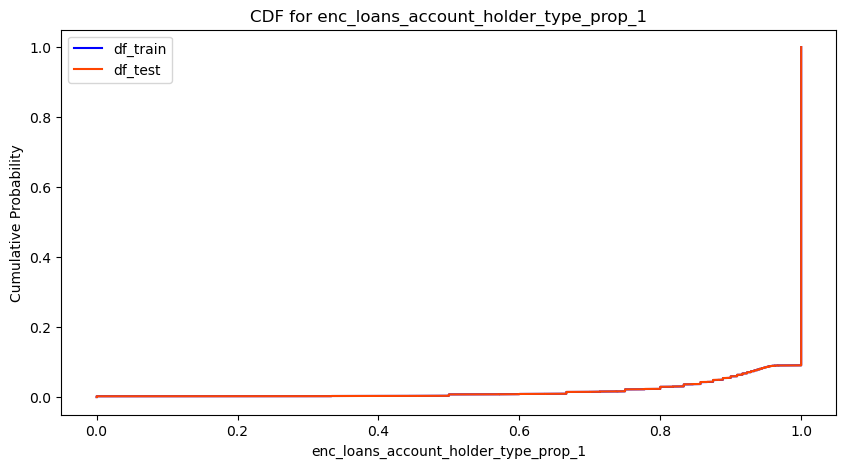

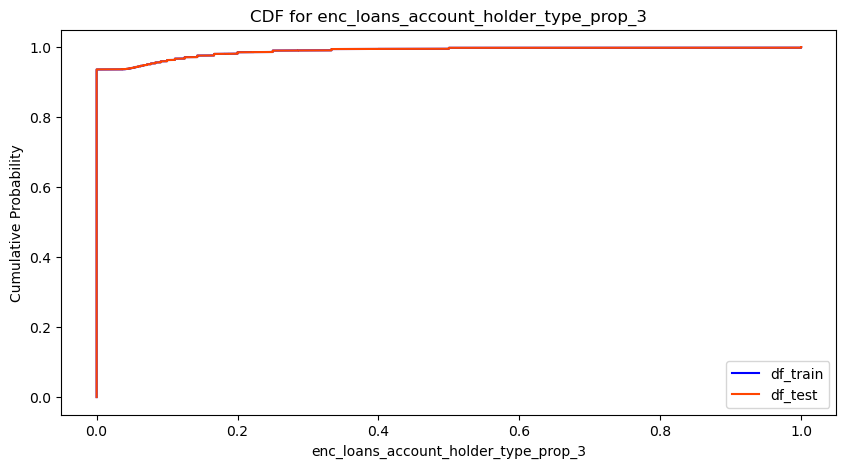

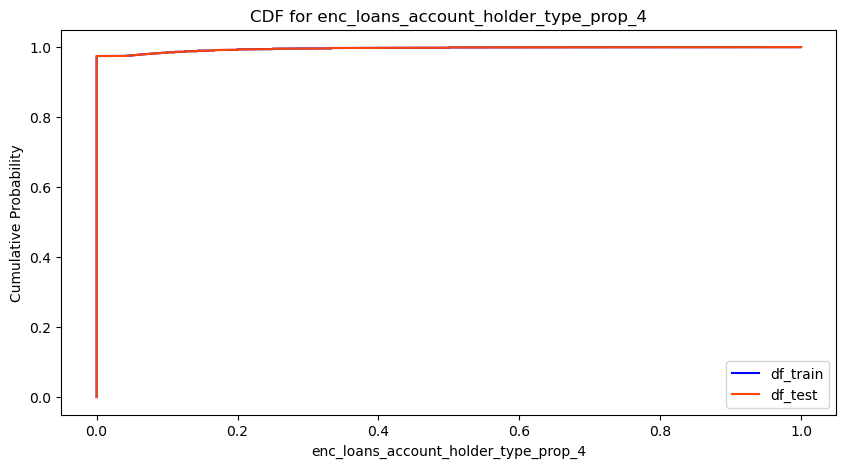

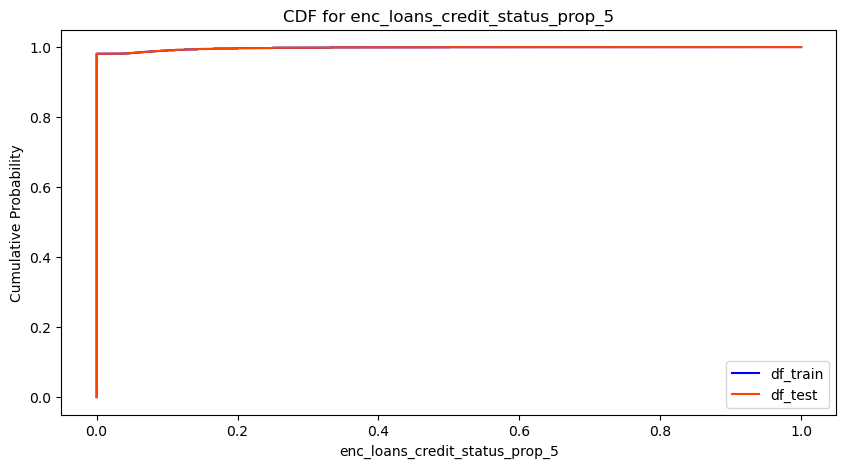

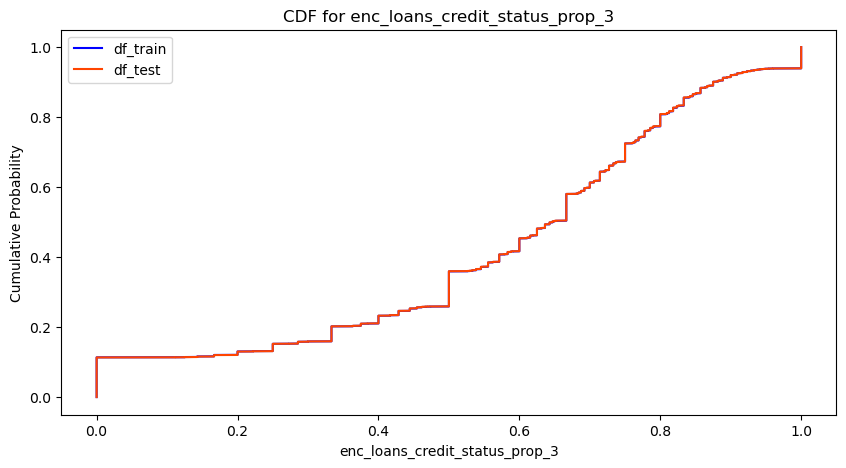

...

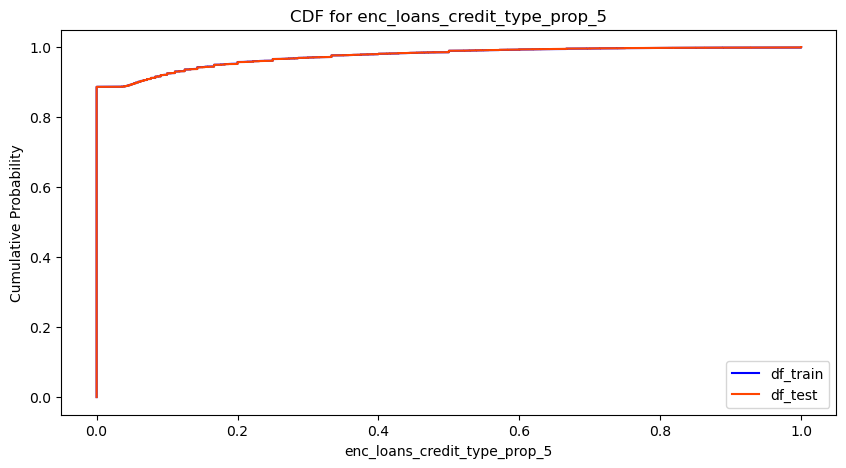

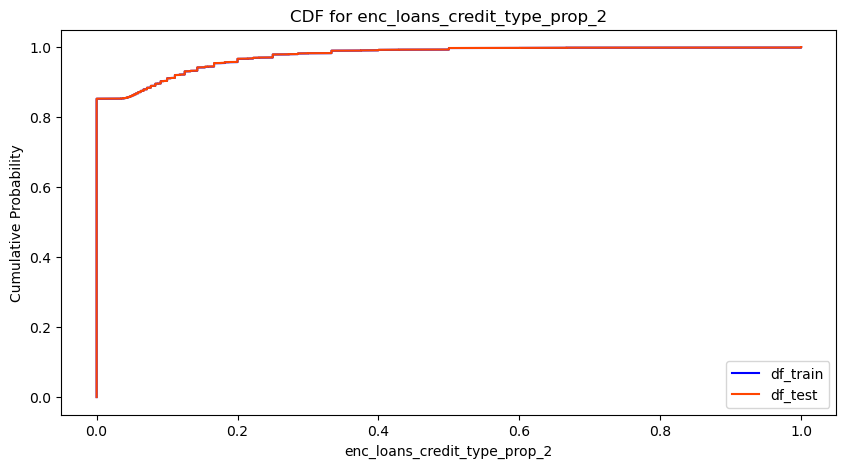

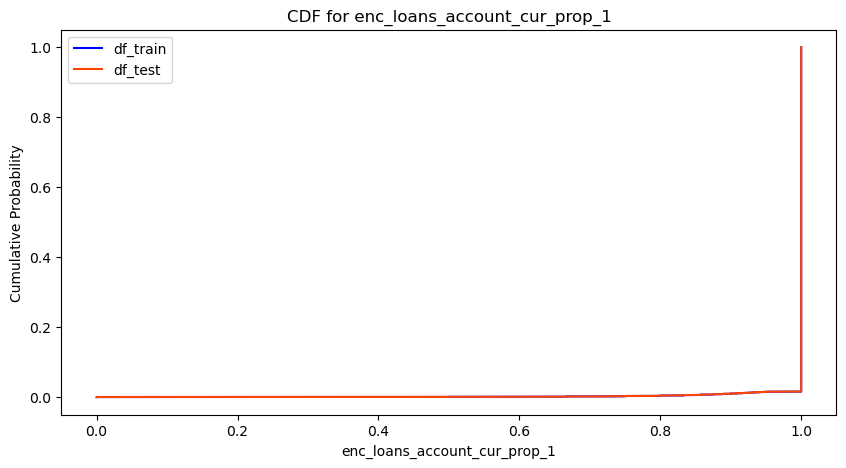

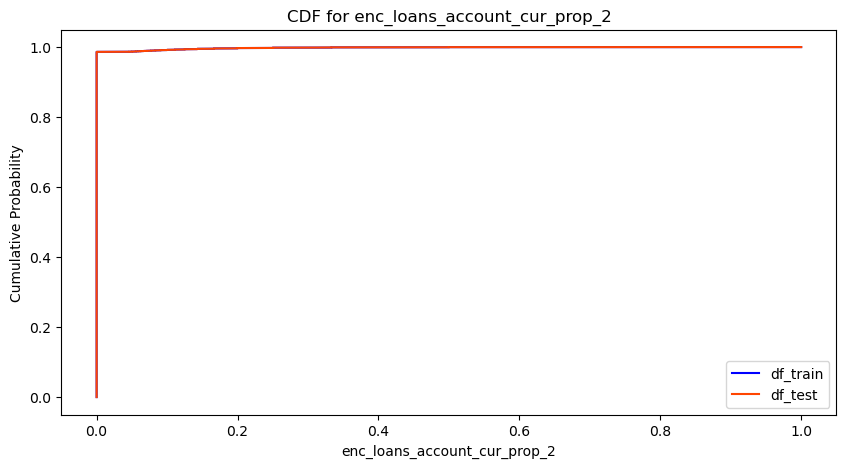

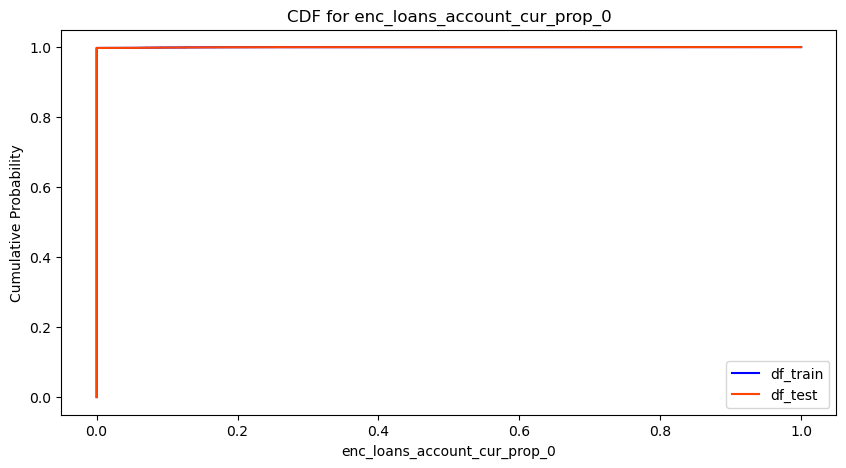

In [99]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-12:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Формы распределения практически совпадают.   
В новых фичах уникальных значений больше чем в оригиналах, распределения некоторых сильно перекошено.

In [100]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'enc_p_pre_f_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7569
ROC AUC на валидации: 0.7363
ROC AUC на тесте: 0.7343
Фолд 1
ROC AUC на трейне: 0.7572
ROC AUC на валидации: 0.7321
ROC AUC на тесте: 0.7352
Фолд 2
ROC AUC на трейне: 0.7609
ROC AUC на валидации: 0.7316
ROC AUC на тесте: 0.7349
Фолд 3
ROC AUC на трейне: 0.7561
ROC AUC на валидации: 0.7318
ROC AUC на тесте: 0.7340
Фолд 4
ROC AUC на трейне: 0.7566
ROC AUC на валидации: 0.7318
ROC AUC на тесте: 0.7342
Среднее ROC AUC на трейне: 0.7575 ± 0.0017
Среднее ROC AUC на валидации: 0.7327 ± 0.0018
Среднее ROC AUC на тесте: 0.7345 ± 0.0005


In [101]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453


In [102]:
# Посмотрим на важности фичей
importances_dict

{'pre_util_prop_3': 5.18187465935095,
 'enc_loans_credit_type_prop_0': 4.260951891518959,
 'rn_max': 3.992998596266886,
 'pre_since_opened_mean_freq': 3.690026130321452,
 'pre_loans_credit_cost_rate_prop_6': 3.6370177339089196,
 'pre_till_pclose_prop_10': 3.6244367701776152,
 'pre_util_prop_6': 3.5065539532337606,
 'pre_util_mean_freq': 3.393256892340979,
 'pre_loans_credit_limit_prop_2': 3.095627152724634,
 'pre_loans_credit_limit_mean_freq': 2.842288247497547,
 'pre_since_opened_prop_12': 2.8024991340298624,
 'pre_loans_outstanding_prop_1': 2.7676759924719803,
 'pre_loans_credit_cost_rate_prop_11': 2.420814301453086,
 'pre_loans_max_overdue_sum_prop_1': 2.4205546242278175,
 'pre_loans_max_overdue_sum_mean_freq': 2.366984848690886,
 'pre_loans_credit_cost_rate_prop_4': 2.1576015150894112,
 'pre_loans_next_pay_summ_prop_5': 1.9492804497760716,
 'enc_loans_credit_status_prop_2': 1.8885673811937855,
 'pre_maxover2limit_mean_freq': 1.8143176304197643,
 'pre_loans_outstanding_prop_5': 1.78

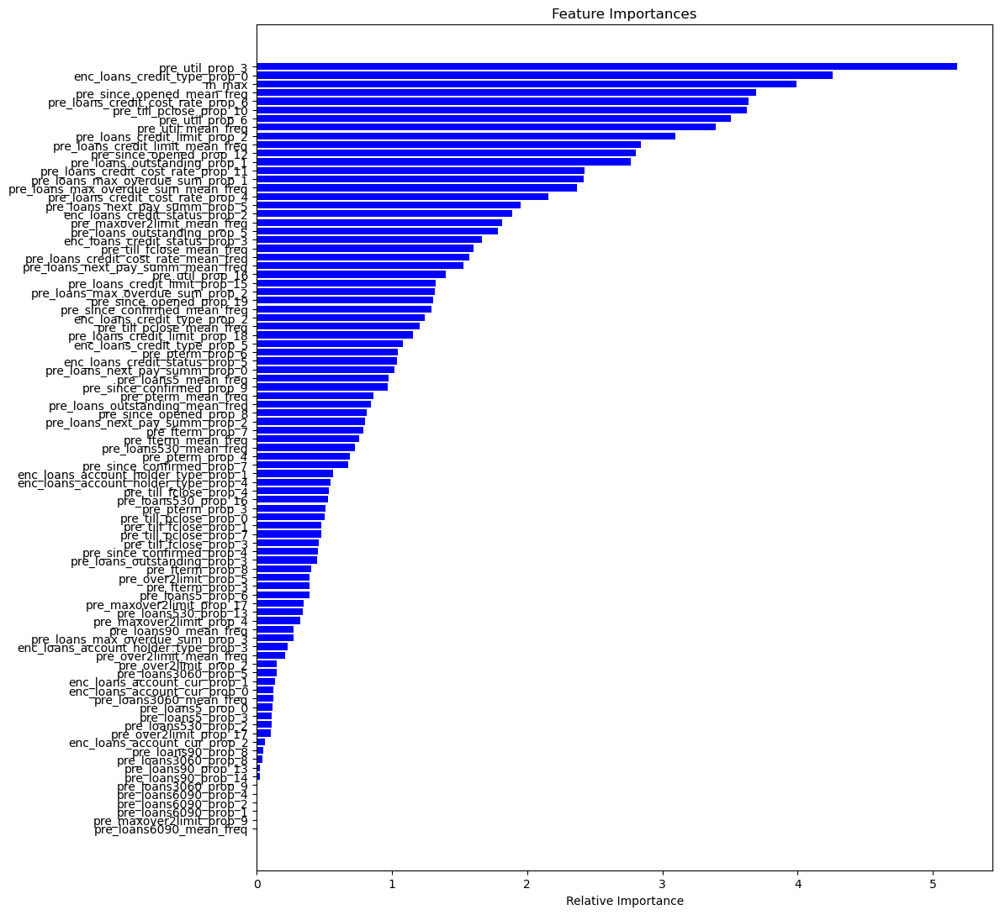

In [103]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

### Create mean value frequency enc_features

In [104]:
df_train = pd.read_csv('../prepared_data/enc_p_pre_f_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/enc_p_pre_f_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 91), (600000, 91))

Циклом пройдём по списку enc_features и для каждого исходного признака    
создадим агрегированный признак отражающий суммированную относительную встречаемость    
значений исходного признака по каждому id, нормированную на количество записей у id.

In [105]:
print('New  df_train columns')
for col in enc_features:
    df_train = create_mean_values_frequency_feature(
        source_df_train,
        df_train,
        col
    )
    
df_train.shape

New  df_train columns
enc_loans_account_holder_type_mean_freq
enc_loans_credit_status_mean_freq
enc_loans_credit_type_mean_freq
enc_loans_account_cur_mean_freq


(2400000, 95)

In [106]:
print('New df_test columns')
for col in enc_features:
    df_test = create_mean_values_frequency_feature(
        source_df_test,
        df_test,
        col
    )
    
df_test.shape

New df_test columns
enc_loans_account_holder_type_mean_freq
enc_loans_credit_status_mean_freq
enc_loans_credit_type_mean_freq
enc_loans_account_cur_mean_freq


(600000, 95)

In [107]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/enc_f_p_pre_f_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/enc_f_p_pre_f_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 95), (600000, 95))

In [108]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-4:]

for col in columns:
    print(df_train[col].nunique(), col)

2001 enc_loans_account_holder_type_mean_freq
7229 enc_loans_credit_status_mean_freq
77204 enc_loans_credit_type_mean_freq
424 enc_loans_account_cur_mean_freq


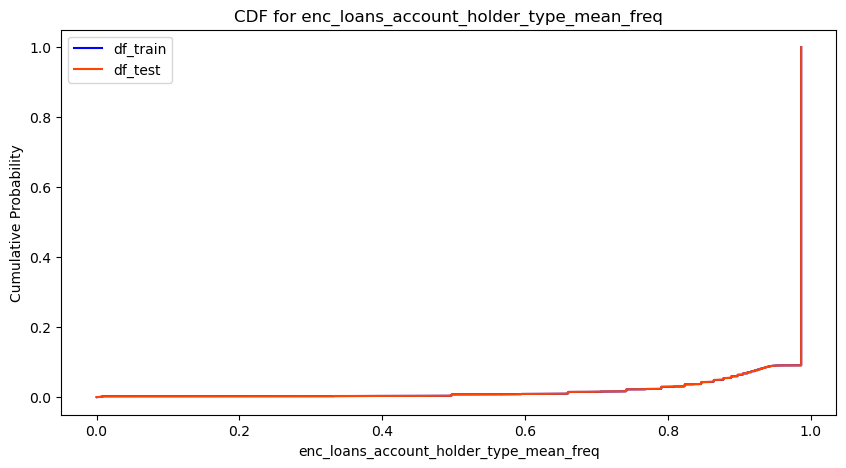

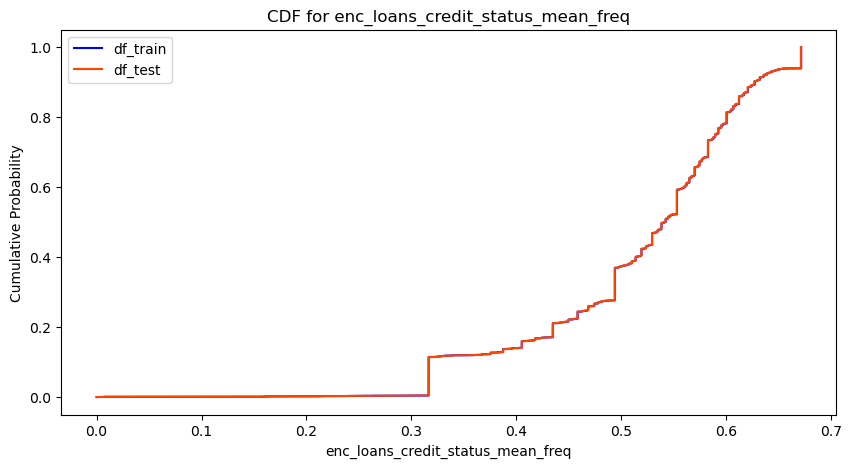

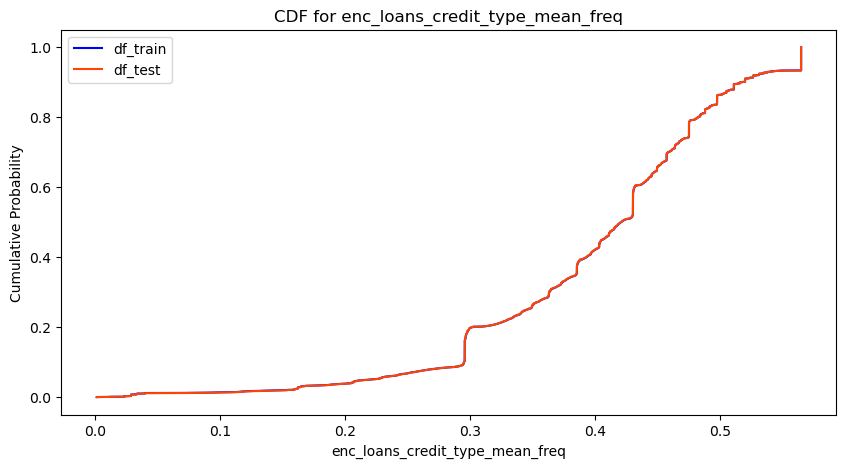

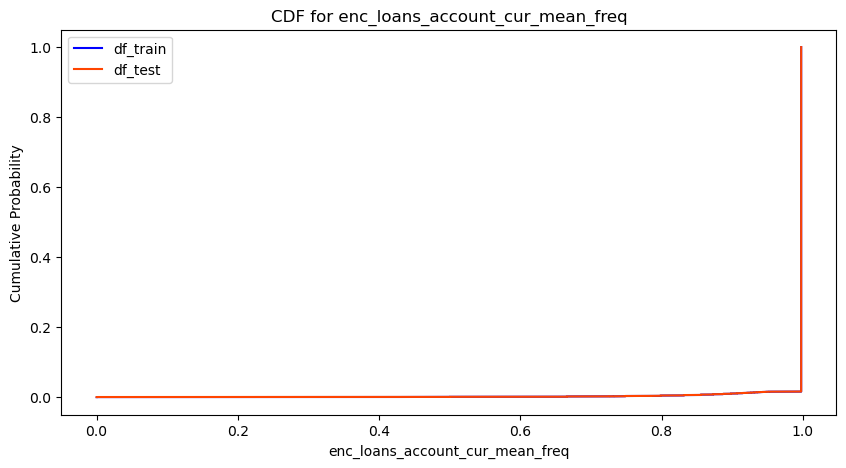

In [109]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Распределения новых признаков в тренировочном и тестовом датасетах практически идентичны.
Распределения некоторых признаки имеют сильный перекос. 

In [110]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'enc_f_p_pre_f_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7543
ROC AUC на валидации: 0.7374
ROC AUC на тесте: 0.7353
Фолд 1
ROC AUC на трейне: 0.7591
ROC AUC на валидации: 0.7319
ROC AUC на тесте: 0.7347
Фолд 2
ROC AUC на трейне: 0.7594
ROC AUC на валидации: 0.7315
ROC AUC на тесте: 0.7348
Фолд 3
ROC AUC на трейне: 0.7595
ROC AUC на валидации: 0.7329
ROC AUC на тесте: 0.7346
Фолд 4
ROC AUC на трейне: 0.7547
ROC AUC на валидации: 0.7320
ROC AUC на тесте: 0.7352
Среднее ROC AUC на трейне: 0.7574 ± 0.0024
Среднее ROC AUC на валидации: 0.7331 ± 0.0022
Среднее ROC AUC на тесте: 0.7349 ± 0.0003


In [111]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271


In [112]:
# Посмотрим на важности фичей
importances_dict

{'enc_loans_credit_type_prop_0': 4.681758886723577,
 'pre_util_prop_3': 4.594589579479239,
 'pre_since_opened_mean_freq': 3.51482147143848,
 'pre_till_pclose_prop_10': 3.3969529974266983,
 'rn_max': 3.3868179537754446,
 'pre_util_prop_6': 3.3393950147076934,
 'pre_loans_credit_cost_rate_prop_6': 3.2565987944632124,
 'pre_util_mean_freq': 3.0952580552412585,
 'pre_loans_credit_limit_mean_freq': 2.911706066334013,
 'pre_loans_outstanding_prop_1': 2.8450556328928864,
 'pre_since_opened_prop_12': 2.832823289907808,
 'pre_loans_credit_limit_prop_2': 2.7262019140140237,
 'pre_loans_credit_cost_rate_prop_11': 2.401030035857797,
 'pre_loans_credit_cost_rate_prop_4': 2.3237351128794166,
 'pre_loans_max_overdue_sum_prop_1': 2.252839672511576,
 'pre_loans_max_overdue_sum_mean_freq': 2.0924974203770934,
 'pre_loans_next_pay_summ_prop_5': 2.04317245906391,
 'enc_loans_credit_status_mean_freq': 1.9963170835309585,
 'pre_loans_outstanding_prop_5': 1.747081373926111,
 'pre_loans_max_overdue_sum_prop_2

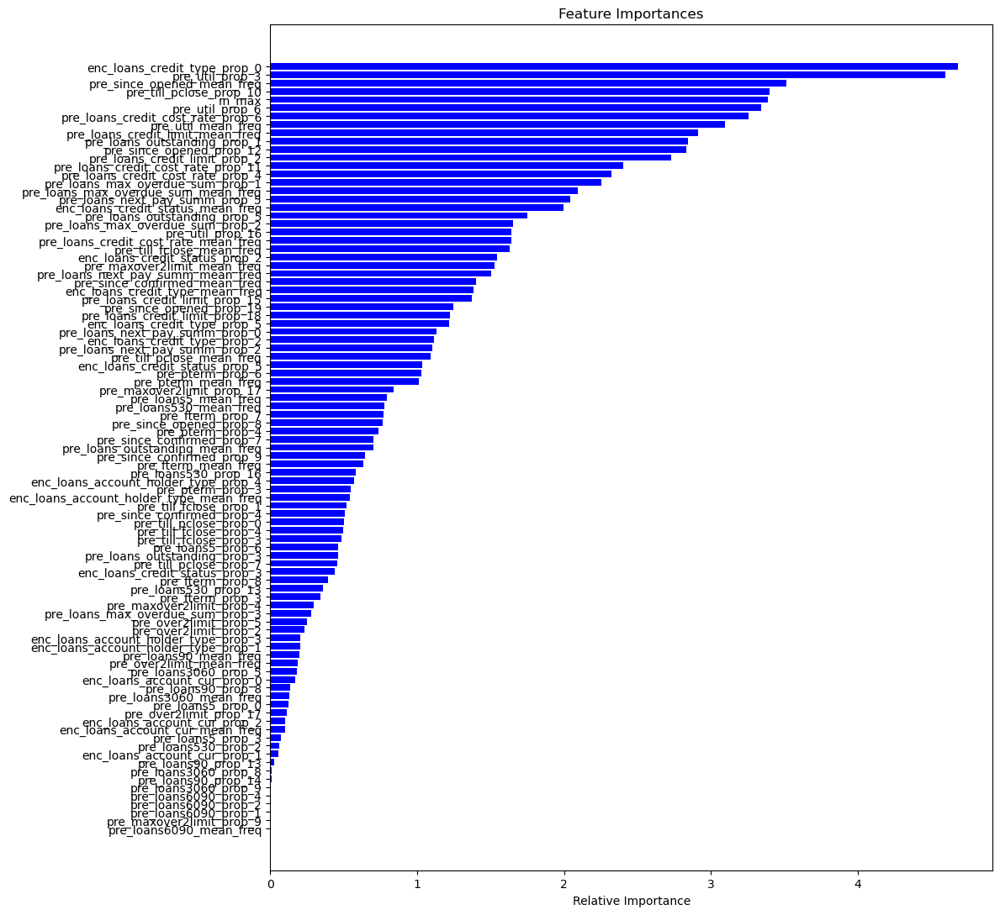

In [113]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

## Enc_paym_features

### Research enc_paym_features

In [114]:
source_df_train = pd.read_csv('../prepared_data/source_data_train.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [115]:
# Списки уникальных значений признаков enc_paym_{0-24} в source_df_train
for col in enc_paym_features:
    print(sorted(source_df_train[col].unique()))

[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]


In [116]:
# Списки уникальных значений признаков enc_paym_{0-24} в source_df_test
for col in enc_paym_features:
    print(sorted(source_df_test[col].unique()))

[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]


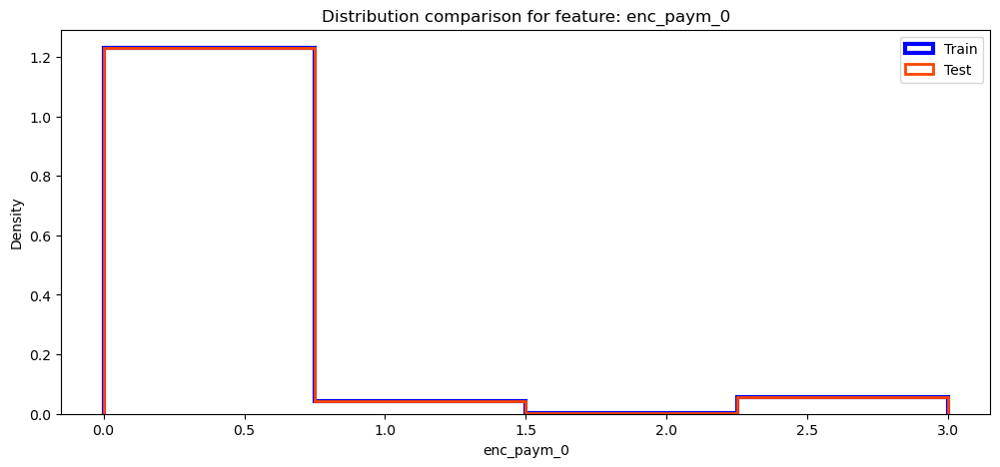

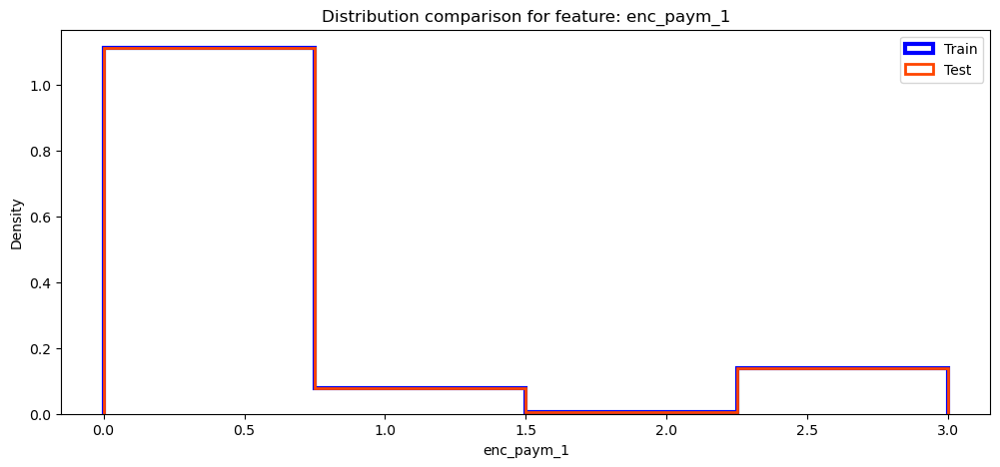

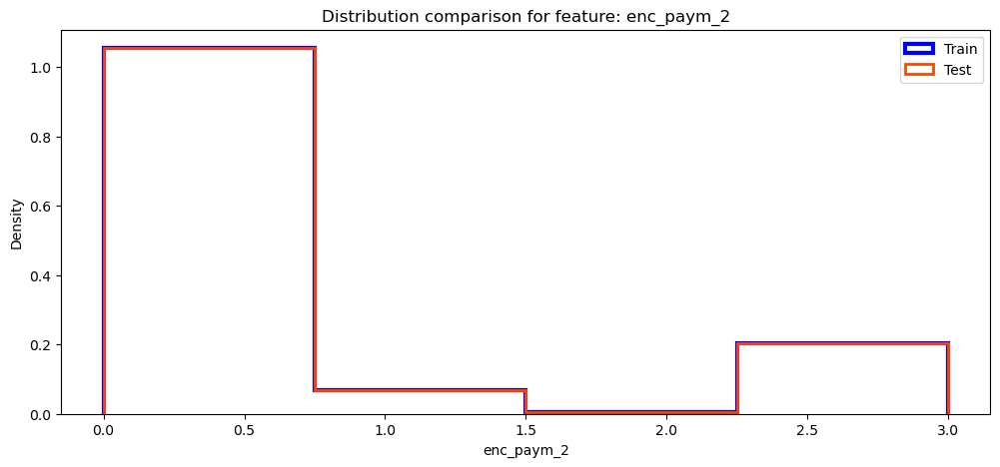

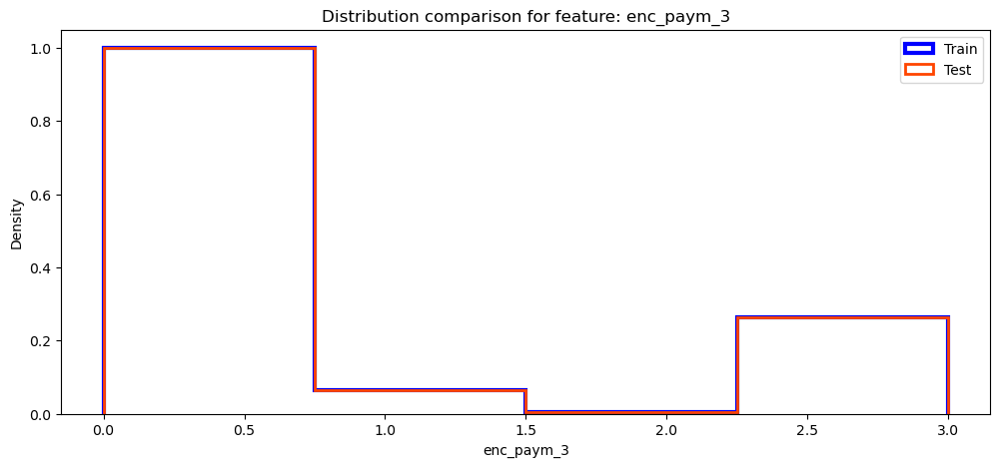

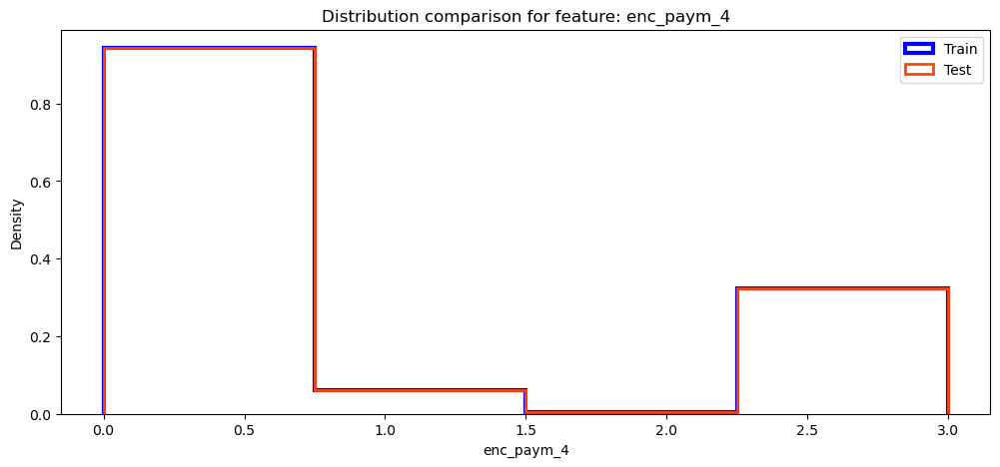

...

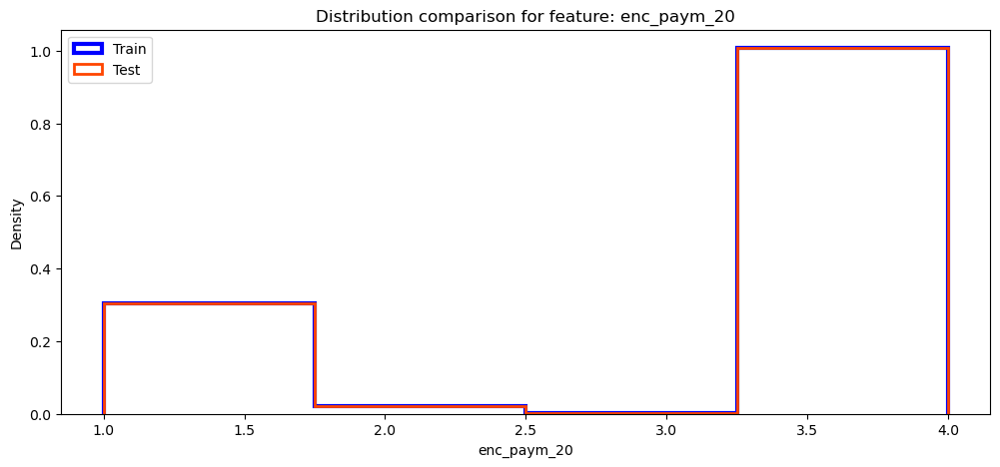

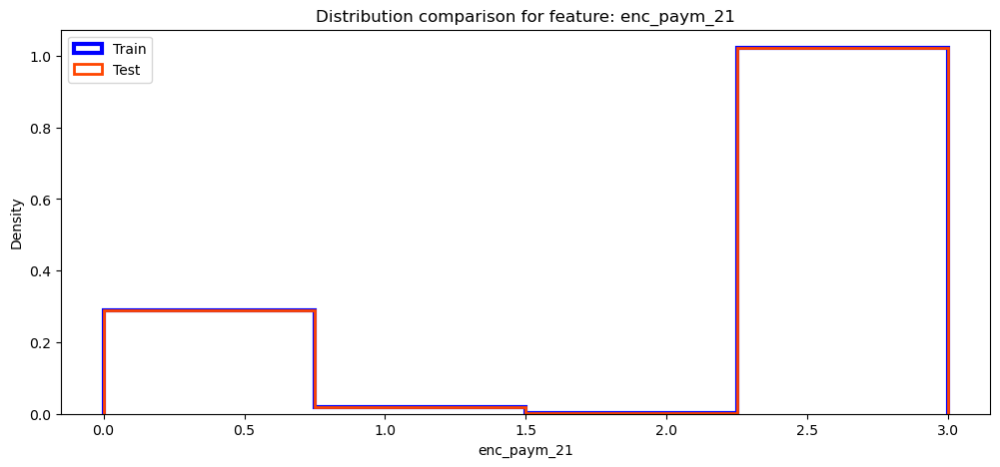

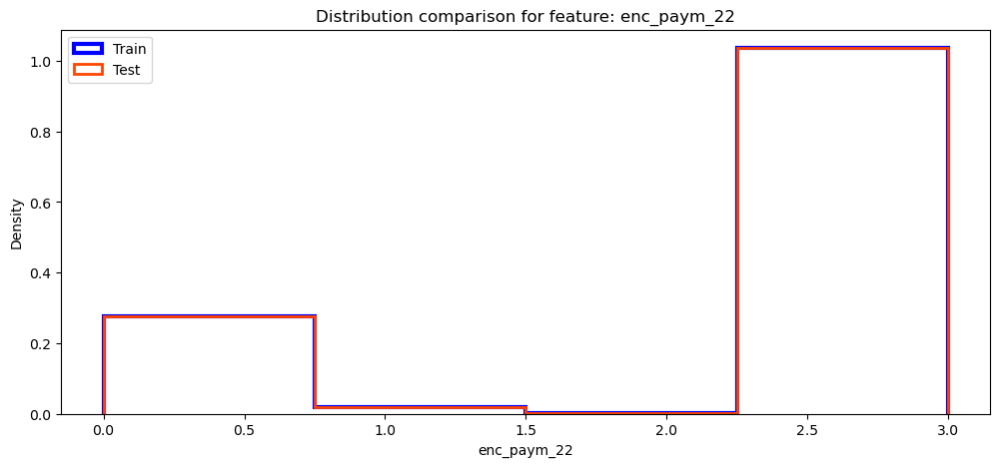

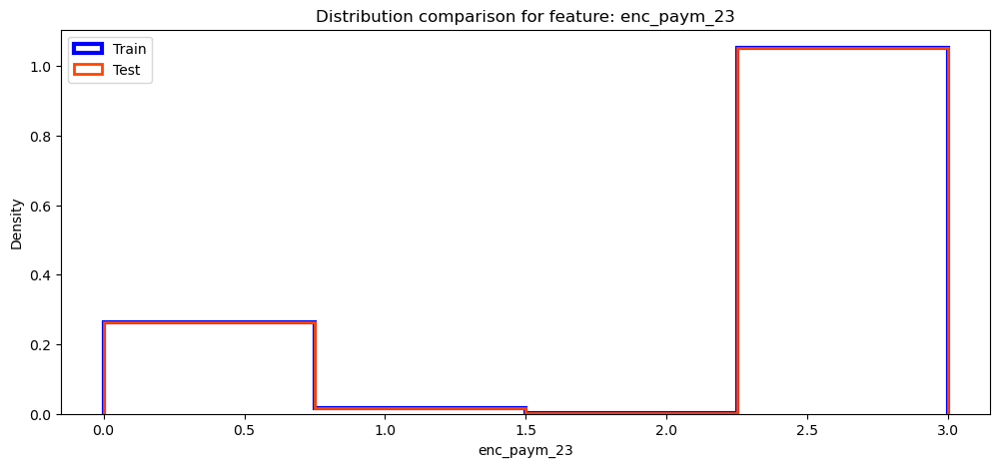

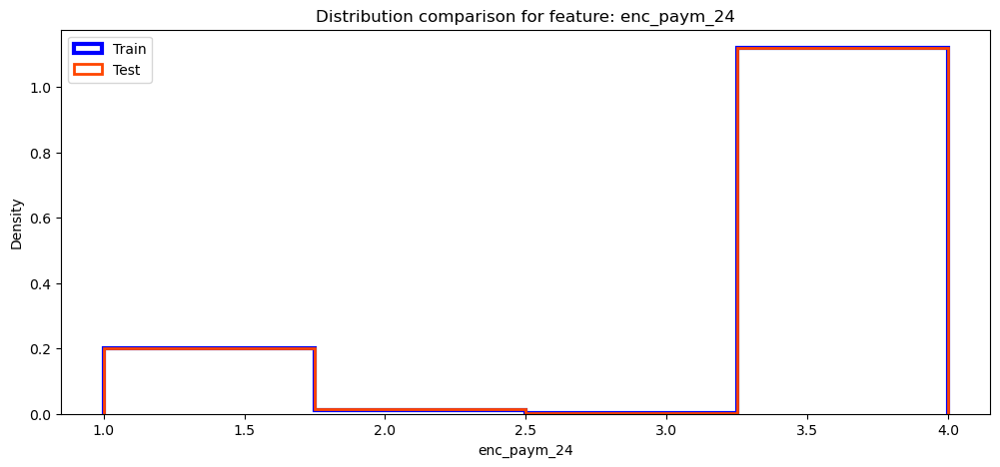

In [117]:
"""
Визуально сравним распределения признаков для исходников 
тренировочного и тестового датасетов
"""
for col in enc_paym_features:
    plt.figure(figsize=(12, 5))
    
    # Выбираем количество бинов как минимальное число уникальных значений в train и test
    bins = min(source_df_train[col].nunique(), source_df_test[col].nunique())
    
    # Строим нормализованные гистограммы для тренировочного и тестового наборов
    plt.hist(
        source_df_train[col],
        bins=bins,
        density=True,
        label='Train',
        color='blue',
        histtype='step',
        linewidth=3
    )
    plt.hist(
        source_df_test[col],
        bins=bins,
        density=True,
        label='Test',
        color='orangered',
        histtype='step',
        linewidth=2
    )

    plt.title(f'Distribution comparison for feature: {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()
    plt.show()

Есть три признака где кодировка отличается, вместо 0-3 там 1-4.    
Форма распределений между train/test совпадает.    
Видна денамика изменения частотности значений по месяцам, сначала чаще встречаются 0 (1), позже 3 (4) и эти изменения происходят плавно. Поётому предположим что все категории закодированны одинаково, и поменяем кодировку 1-4 на 0-3 для совместной обработки.

In [118]:
# Перекодировка признаков в source_df_train
for col in enc_paym_features:
    if 4 in source_df_train[col].unique():
        source_df_train.loc[:, col] = source_df_train[col].map({1: 0, 2: 1, 3: 2, 4: 3})
        
for col in enc_paym_features:
    print(sorted(source_df_train[col].unique()))

[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]


In [119]:
# Перекодировка признаков в source_df_test
for col in enc_paym_features:
    if 4 in source_df_test[col].unique():
        source_df_test.loc[:, col] = source_df_test[col].map({1: 0, 2: 1, 3: 2, 4: 3})
        
for col in enc_paym_features:
    print(sorted(source_df_test[col].unique()))

[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]


In [120]:
# Перезапишем исходные датасеты
source_df_train.to_csv('../prepared_data/source_data_train_1.csv', index=False)
source_df_test.to_csv('../prepared_data/source_data_test_1.csv', index=False)
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

### Create proportion value enc_paym_features

In [121]:
source_df_train = pd.read_csv('../prepared_data/source_data_train_1.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test_1.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [122]:
df_train = pd.read_csv('../prepared_data/enc_f_p_pre_f_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/enc_f_p_pre_f_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 95), (600000, 95))

In [123]:
""" 
Создадим словарь, где ключами будут имена исходных признаков из enc_paym_features,
а значениями — два уникальных значения признака, на основе которых
были созданы новые частотные признаки с наибольшим вкладом в качество модели.
"""
enc_paym_prop_features_dictionary = {}

for col in enc_paym_features:
    print('-' * 50)
    print('Исходный признак:', col)
    
    # Создаём новые частотные признаки для каждого уникального значения признака col
    df_train, new_features_list = create_all_value_proportion_features(
        source_df_train,
        df_train,
        col
    )
    print('Новые признаки тренировочного датасета:\n' +
      '\n'.join(new_features_list))
    
    # Определяем 2 наиболее важных значения признака с помощью CatBoost
    values = choose_n_most_imp_features(df_train, new_features_list, 2)
    print('Наиболее важные категории признака:', values)
    
    # Сохраняем их в словарь
    enc_paym_prop_features_dictionary[col] = values

    # Удаляем все новые признаки из тренировочного датафрейма
    df_train = df_train.drop(new_features_list, axis=1)

--------------------------------------------------
Исходный признак: enc_paym_0
Новые признаки тренировочного датасета:
enc_paym_0_prop_0
enc_paym_0_prop_1
enc_paym_0_prop_2
enc_paym_0_prop_3
Среднее ROC AUC на трейне: 0.5865 ± 0.0006
Среднее ROC AUC на валидации: 0.5862 ± 0.0026
Наиболее важные категории признака: [0, 1]
--------------------------------------------------
Исходный признак: enc_paym_1
Новые признаки тренировочного датасета:
enc_paym_1_prop_0
enc_paym_1_prop_1
enc_paym_1_prop_2
enc_paym_1_prop_3
Среднее ROC AUC на трейне: 0.6188 ± 0.0011
Среднее ROC AUC на валидации: 0.6186 ± 0.0019
Наиболее важные категории признака: [0, 3]
--------------------------------------------------
Исходный признак: enc_paym_2
Новые признаки тренировочного датасета:
enc_paym_2_prop_0
enc_paym_2_prop_1
enc_paym_2_prop_2
enc_paym_2_prop_3
Среднее ROC AUC на трейне: 0.6262 ± 0.0010
Среднее ROC AUC на валидации: 0.6256 ± 0.0028
Наиболее важные категории признака: [0, 3]
----------------------------

In [124]:
enc_paym_prop_features_dictionary

{'enc_paym_0': [0, 1],
 'enc_paym_1': [0, 3],
 'enc_paym_2': [0, 3],
 'enc_paym_3': [0, 1],
 'enc_paym_4': [0, 1],
 'enc_paym_5': [0, 1],
 'enc_paym_6': [0, 1],
 'enc_paym_7': [0, 1],
 'enc_paym_8': [0, 1],
 'enc_paym_9': [0, 1],
 'enc_paym_10': [0, 1],
 'enc_paym_11': [0, 1],
 'enc_paym_12': [0, 1],
 'enc_paym_13': [0, 1],
 'enc_paym_14': [0, 1],
 'enc_paym_15': [0, 1],
 'enc_paym_16': [0, 1],
 'enc_paym_17': [0, 1],
 'enc_paym_18': [0, 1],
 'enc_paym_19': [0, 1],
 'enc_paym_20': [0, 1],
 'enc_paym_21': [0, 1],
 'enc_paym_22': [0, 1],
 'enc_paym_23': [0, 1],
 'enc_paym_24': [0, 1]}

In [125]:
# Создадим признаки из выбранных значений в тренировочном датасете
df_train = create_definite_value_proportion_features(
    source_df_train,
    df_train,
    enc_paym_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: enc_paym_0
Новые фичи:
enc_paym_0_prop_0
enc_paym_0_prop_1
--------------------------------------------------
Исходный признак: enc_paym_1
Новые фичи:
enc_paym_1_prop_0
enc_paym_1_prop_3
--------------------------------------------------
Исходный признак: enc_paym_2
Новые фичи:
enc_paym_2_prop_0
enc_paym_2_prop_3
--------------------------------------------------
Исходный признак: enc_paym_3
Новые фичи:
enc_paym_3_prop_0
enc_paym_3_prop_1
--------------------------------------------------
Исходный признак: enc_paym_4
Новые фичи:
enc_paym_4_prop_0
enc_paym_4_prop_1
--------------------------------------------------
Исходный признак: enc_paym_5
Новые фичи:
enc_paym_5_prop_0
enc_paym_5_prop_1
--------------------------------------------------
Исходный признак: enc_paym_6
Новые фичи:
enc_paym_6_prop_0
enc_paym_6_prop_1
--------------------------------------------------
Исходный признак: enc_paym_7
Новые фичи:
enc_paym_7_p

In [126]:
# Создадим признаки из выбранных значений в тестовом датасете
df_test = create_definite_value_proportion_features(
    source_df_test,
    df_test,
    enc_paym_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: enc_paym_0
Новые фичи:
enc_paym_0_prop_0
enc_paym_0_prop_1
--------------------------------------------------
Исходный признак: enc_paym_1
Новые фичи:
enc_paym_1_prop_0
enc_paym_1_prop_3
--------------------------------------------------
Исходный признак: enc_paym_2
Новые фичи:
enc_paym_2_prop_0
enc_paym_2_prop_3
--------------------------------------------------
Исходный признак: enc_paym_3
Новые фичи:
enc_paym_3_prop_0
enc_paym_3_prop_1
--------------------------------------------------
Исходный признак: enc_paym_4
Новые фичи:
enc_paym_4_prop_0
enc_paym_4_prop_1
--------------------------------------------------
Исходный признак: enc_paym_5
Новые фичи:
enc_paym_5_prop_0
enc_paym_5_prop_1
--------------------------------------------------
Исходный признак: enc_paym_6
Новые фичи:
enc_paym_6_prop_0
enc_paym_6_prop_1
--------------------------------------------------
Исходный признак: enc_paym_7
Новые фичи:
enc_paym_7_p

In [127]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/encpaym_p_enc_f_p_pre_f_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/encpaym_p_enc_f_p_pre_f_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 145), (600000, 145))

In [128]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-50:]

for col in columns:
    print(df_train[col].nunique(), col)

427 enc_paym_0_prop_0
271 enc_paym_0_prop_1
530 enc_paym_1_prop_0
528 enc_paym_1_prop_3
542 enc_paym_2_prop_0
546 enc_paym_2_prop_3
525 enc_paym_3_prop_0
261 enc_paym_3_prop_1
527 enc_paym_4_prop_0
257 enc_paym_4_prop_1
507 enc_paym_5_prop_0
244 enc_paym_5_prop_1
498 enc_paym_6_prop_0
229 enc_paym_6_prop_1
487 enc_paym_7_prop_0
228 enc_paym_7_prop_1
471 enc_paym_8_prop_0
217 enc_paym_8_prop_1
458 enc_paym_9_prop_0
210 enc_paym_9_prop_1
445 enc_paym_10_prop_0
201 enc_paym_10_prop_1
431 enc_paym_11_prop_0
194 enc_paym_11_prop_1
413 enc_paym_12_prop_0
182 enc_paym_12_prop_1
398 enc_paym_13_prop_0
180 enc_paym_13_prop_1
390 enc_paym_14_prop_0
177 enc_paym_14_prop_1
387 enc_paym_15_prop_0
169 enc_paym_15_prop_1
378 enc_paym_16_prop_0
178 enc_paym_16_prop_1
376 enc_paym_17_prop_0
171 enc_paym_17_prop_1
364 enc_paym_18_prop_0
163 enc_paym_18_prop_1
356 enc_paym_19_prop_0
167 enc_paym_19_prop_1
345 enc_paym_20_prop_0
157 enc_paym_20_prop_1
345 enc_paym_21_prop_0
157 enc_paym_21_prop_1
342 enc_

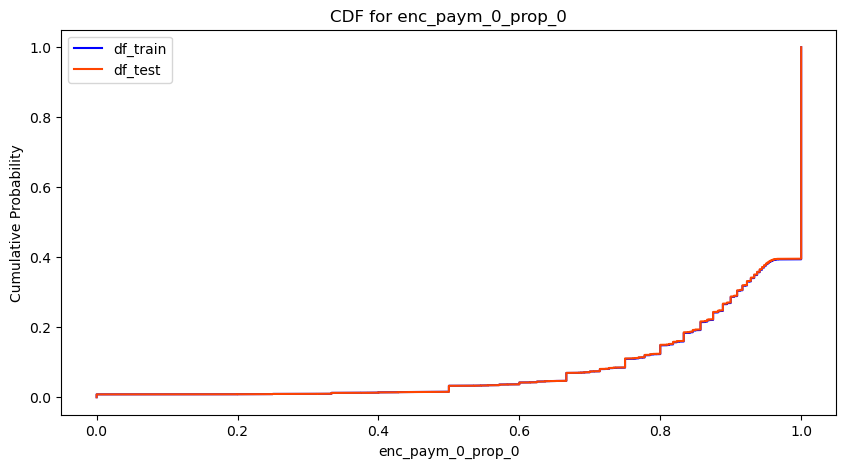

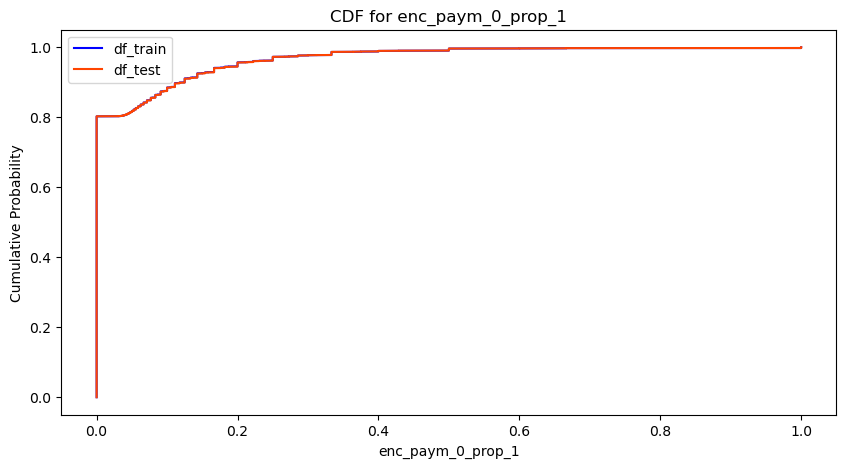

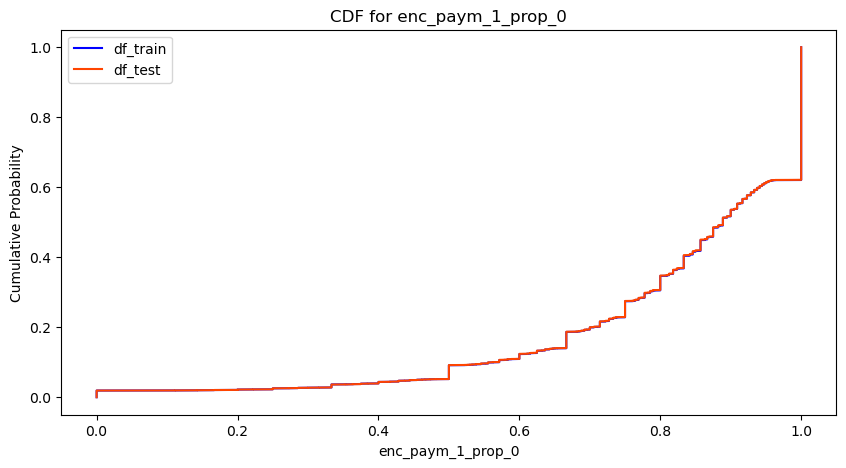

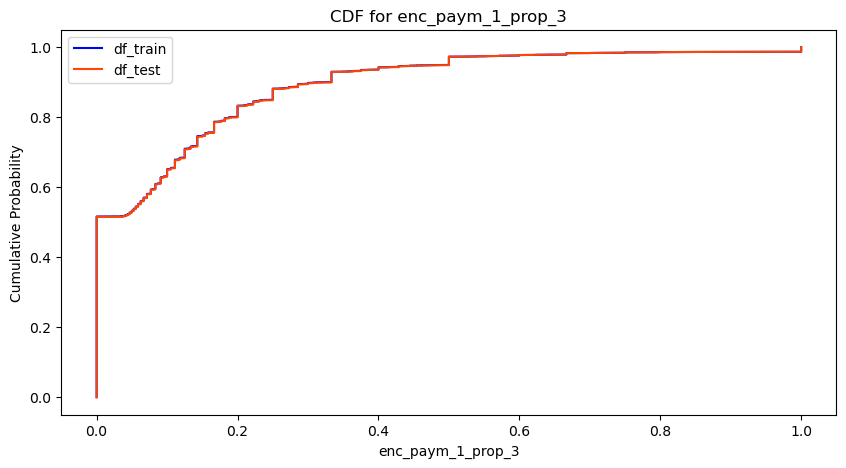

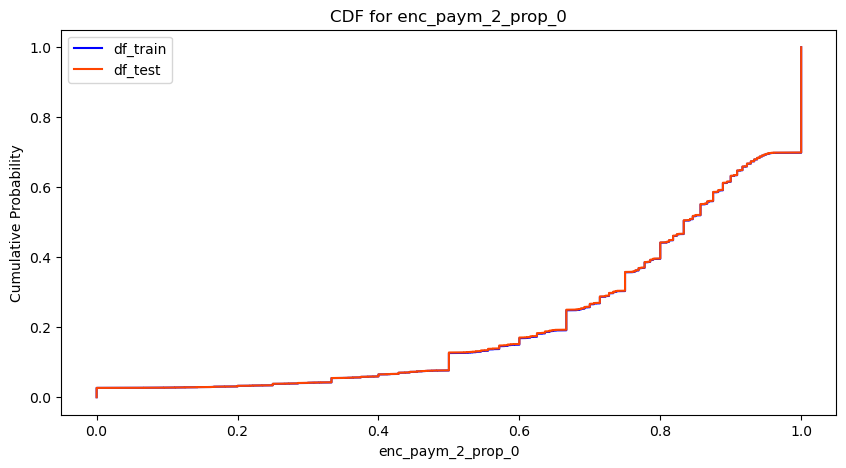

...

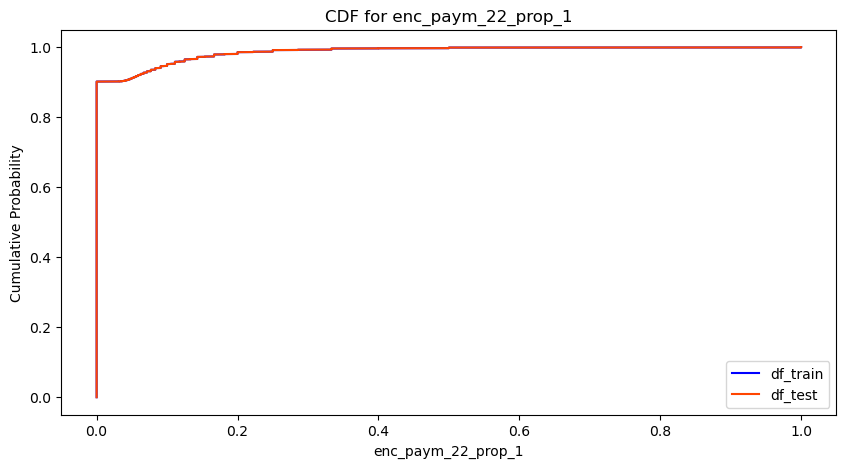

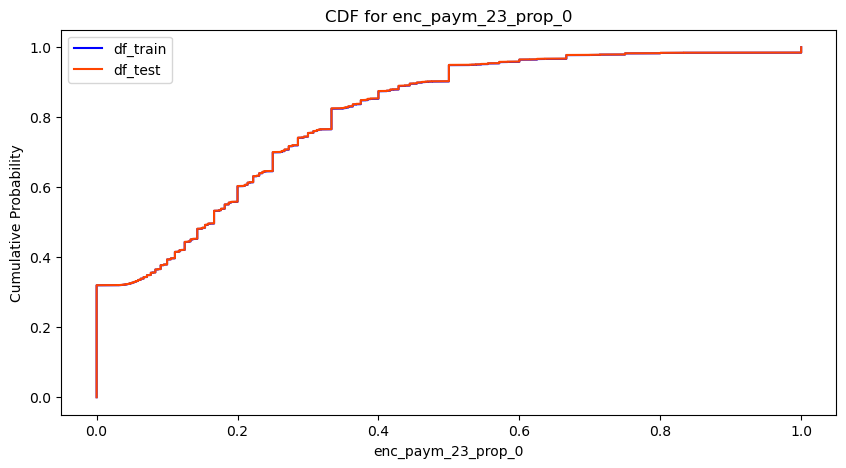

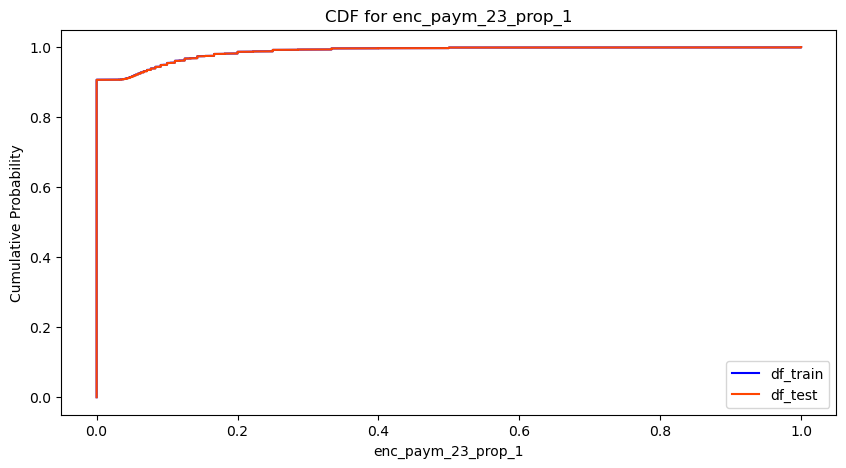

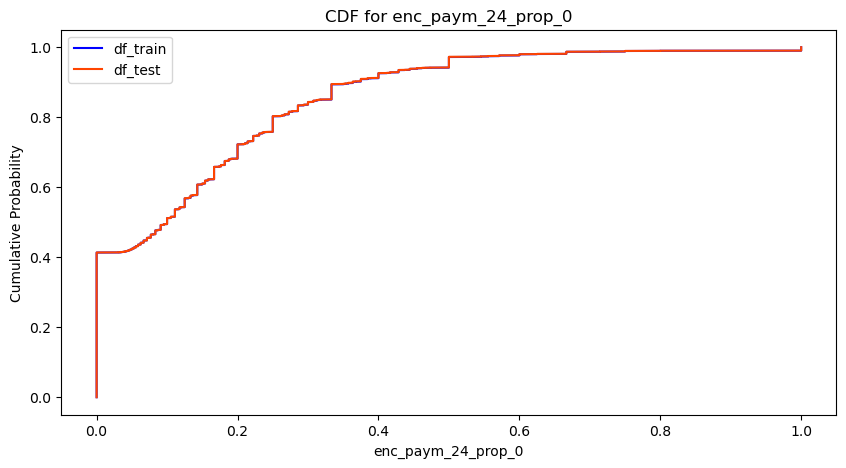

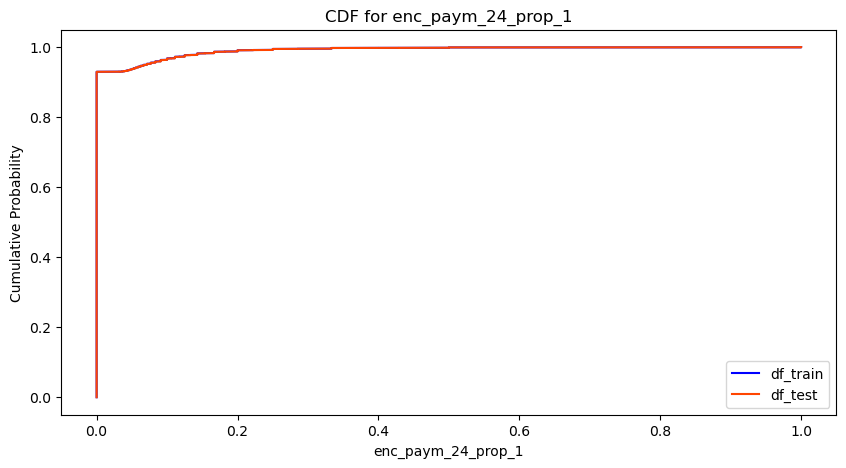

In [129]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-50:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Формы распределения практически совпадают.

In [130]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'encpaym_p_enc_f_p_pre_f_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7717
ROC AUC на валидации: 0.7505
ROC AUC на тесте: 0.7486
Фолд 1
ROC AUC на трейне: 0.7681
ROC AUC на валидации: 0.7475
ROC AUC на тесте: 0.7496
Фолд 2
ROC AUC на трейне: 0.7754
ROC AUC на валидации: 0.7456
ROC AUC на тесте: 0.7492
Фолд 3
ROC AUC на трейне: 0.7736
ROC AUC на валидации: 0.7483
ROC AUC на тесте: 0.7488
Фолд 4
ROC AUC на трейне: 0.7705
ROC AUC на валидации: 0.7467
ROC AUC на тесте: 0.7496
Среднее ROC AUC на трейне: 0.7719 ± 0.0025
Среднее ROC AUC на валидации: 0.7477 ± 0.0016
Среднее ROC AUC на тесте: 0.7491 ± 0.0004


In [131]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388


In [132]:
# Посмотрим на важности фичей
importances_dict

{'pre_util_prop_3': 5.055818171054414,
 'enc_loans_credit_type_prop_0': 4.062070522517625,
 'enc_paym_2_prop_0': 3.731546535238098,
 'enc_paym_1_prop_0': 3.728790841868997,
 'pre_till_pclose_prop_10': 3.3316071852249203,
 'pre_util_prop_6': 3.2146183870222877,
 'pre_util_mean_freq': 3.044750179826177,
 'pre_loans_outstanding_prop_1': 2.669844147311514,
 'pre_loans_credit_limit_prop_2': 2.3185456116805034,
 'rn_max': 2.239612665154927,
 'enc_paym_0_prop_1': 1.9164595482937847,
 'pre_loans_credit_cost_rate_prop_11': 1.9161632742875265,
 'pre_loans_credit_limit_mean_freq': 1.8354380026646404,
 'enc_paym_16_prop_0': 1.8066661491994536,
 'pre_loans_credit_cost_rate_prop_4': 1.791836236554236,
 'pre_loans_outstanding_prop_5': 1.7063571254985999,
 'pre_loans_credit_cost_rate_prop_6': 1.5589927064790188,
 'pre_loans_max_overdue_sum_mean_freq': 1.4957928552113404,
 'pre_util_prop_16': 1.35443808413495,
 'pre_loans_next_pay_summ_prop_5': 1.3058088793087395,
 'enc_paym_3_prop_0': 1.25437364367652

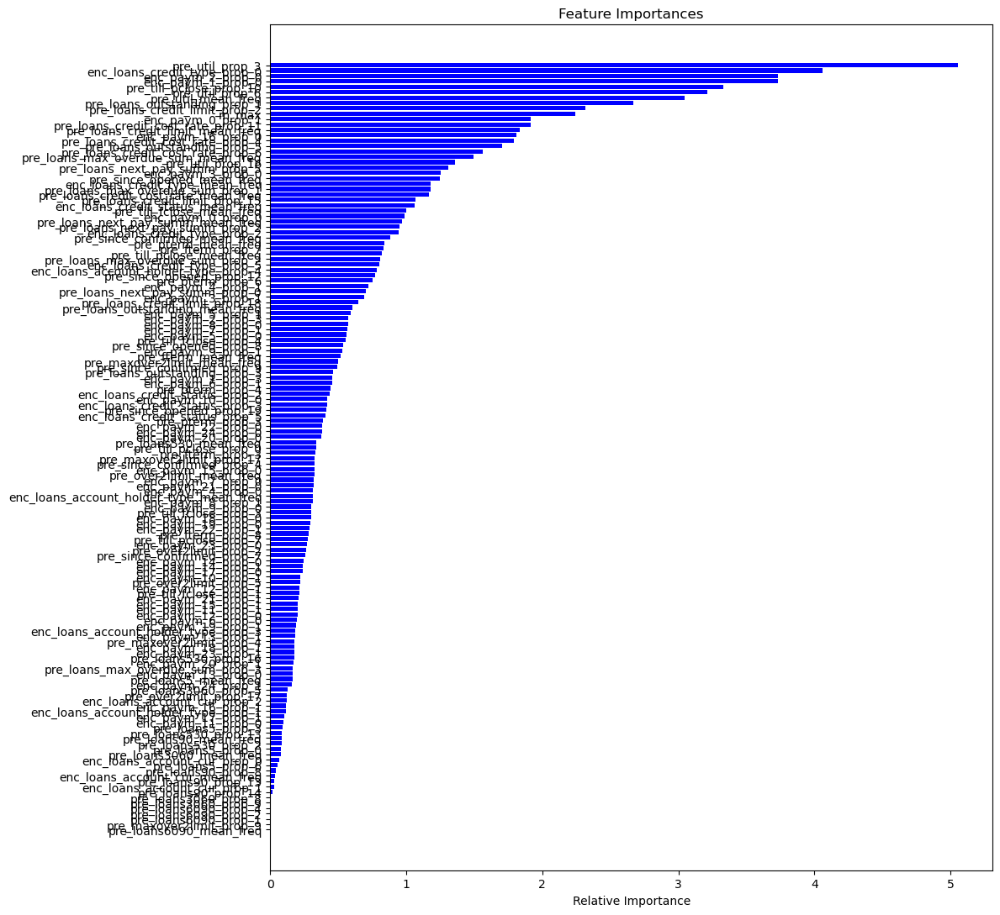

In [133]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

### Enc_paym_features mean value frequency individual months

In [134]:
source_df_train = pd.read_csv('../prepared_data/source_data_train_1.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test_1.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [135]:
df_train = pd.read_csv('../prepared_data/encpaym_p_enc_f_p_pre_f_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/encpaym_p_enc_f_p_pre_f_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 145), (600000, 145))

Циклом пройдём по списку Enc_paym_features и для каждого исходного признака    
создадим агрегированный признак отражающий суммированную относительную встречаемость    
значений исходного признака по каждому id, нормированную на количество записей у id.

In [136]:
print('New  df_train columns')
for col in enc_paym_features:
    df_train = create_mean_values_frequency_feature(
        source_df_train,
        df_train,
        col
    )
    
df_train.shape

New  df_train columns
enc_paym_0_mean_freq
enc_paym_1_mean_freq
enc_paym_2_mean_freq
enc_paym_3_mean_freq
enc_paym_4_mean_freq
enc_paym_5_mean_freq
enc_paym_6_mean_freq
enc_paym_7_mean_freq
enc_paym_8_mean_freq
enc_paym_9_mean_freq
enc_paym_10_mean_freq
enc_paym_11_mean_freq
enc_paym_12_mean_freq
enc_paym_13_mean_freq
enc_paym_14_mean_freq
enc_paym_15_mean_freq
enc_paym_16_mean_freq
enc_paym_17_mean_freq
enc_paym_18_mean_freq
enc_paym_19_mean_freq
enc_paym_20_mean_freq
enc_paym_21_mean_freq
enc_paym_22_mean_freq
enc_paym_23_mean_freq
enc_paym_24_mean_freq


(2400000, 170)

In [137]:
print('New df_test columns')
for col in enc_paym_features:
    df_test = create_mean_values_frequency_feature(
        source_df_test,
        df_test,
        col
    )
    
df_test.shape

New df_test columns
enc_paym_0_mean_freq
enc_paym_1_mean_freq
enc_paym_2_mean_freq
enc_paym_3_mean_freq
enc_paym_4_mean_freq
enc_paym_5_mean_freq
enc_paym_6_mean_freq
enc_paym_7_mean_freq
enc_paym_8_mean_freq
enc_paym_9_mean_freq
enc_paym_10_mean_freq
enc_paym_11_mean_freq
enc_paym_12_mean_freq
enc_paym_13_mean_freq
enc_paym_14_mean_freq
enc_paym_15_mean_freq
enc_paym_16_mean_freq
enc_paym_17_mean_freq
enc_paym_18_mean_freq
enc_paym_19_mean_freq
enc_paym_20_mean_freq
enc_paym_21_mean_freq
enc_paym_22_mean_freq
enc_paym_23_mean_freq
enc_paym_24_mean_freq


(600000, 170)

In [138]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/encpaym_f_p_enc_f_p_pre_f_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/encpaym_f_p_enc_f_p_pre_f_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 170), (600000, 170))

In [139]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-25:]

for col in columns:
    print(df_train[col].nunique(), col)

4860 enc_paym_0_mean_freq
8218 enc_paym_1_mean_freq
8066 enc_paym_2_mean_freq
8039 enc_paym_3_mean_freq
7727 enc_paym_4_mean_freq
7435 enc_paym_5_mean_freq
7442 enc_paym_6_mean_freq
6615 enc_paym_7_mean_freq
6815 enc_paym_8_mean_freq
5977 enc_paym_9_mean_freq
6055 enc_paym_10_mean_freq
5595 enc_paym_11_mean_freq
4989 enc_paym_12_mean_freq
4649 enc_paym_13_mean_freq
4346 enc_paym_14_mean_freq
4366 enc_paym_15_mean_freq
4105 enc_paym_16_mean_freq
3873 enc_paym_17_mean_freq
3881 enc_paym_18_mean_freq
3737 enc_paym_19_mean_freq
3670 enc_paym_20_mean_freq
3645 enc_paym_21_mean_freq
3455 enc_paym_22_mean_freq
3143 enc_paym_23_mean_freq
2812 enc_paym_24_mean_freq


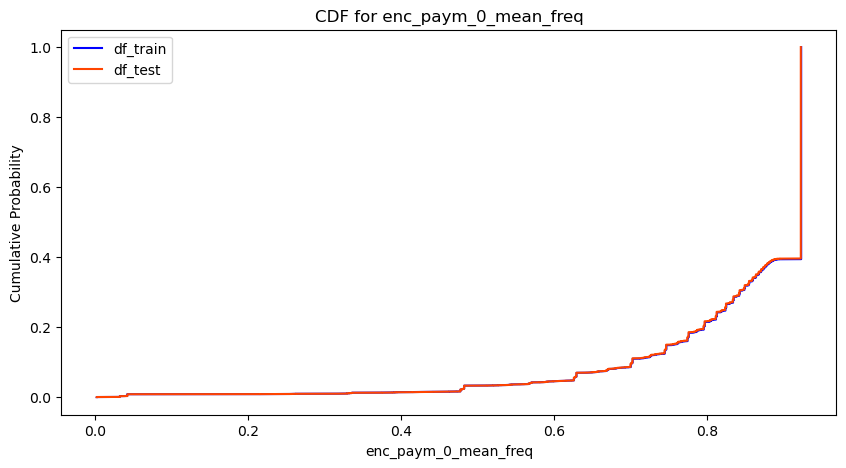

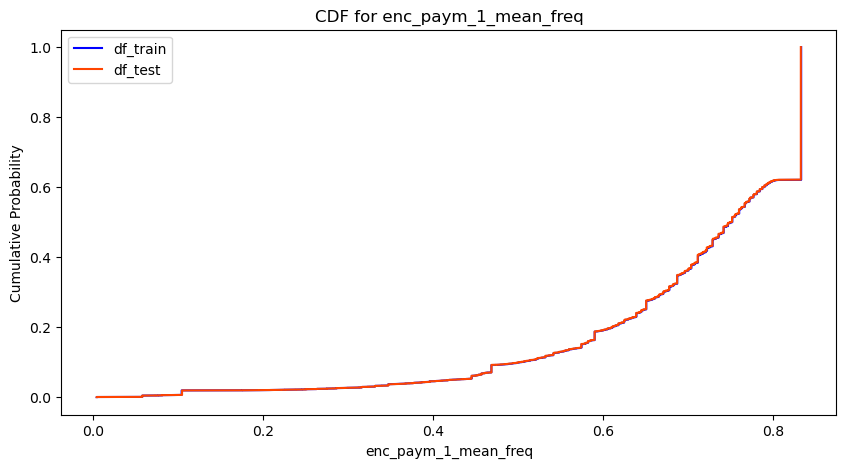

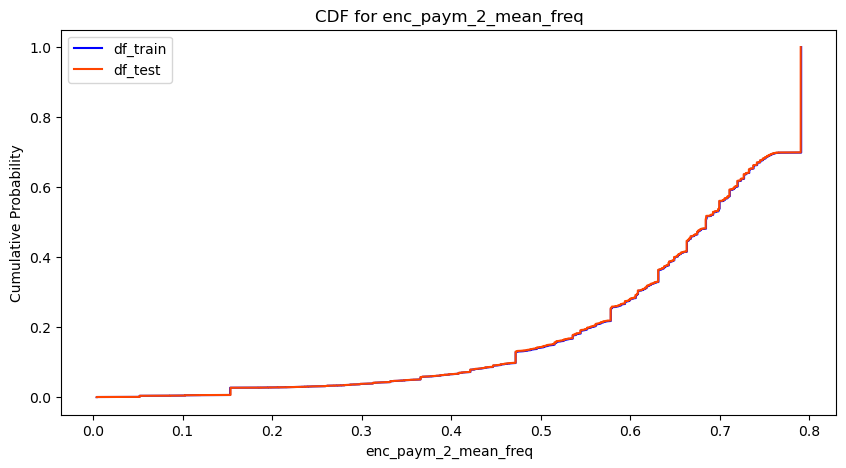

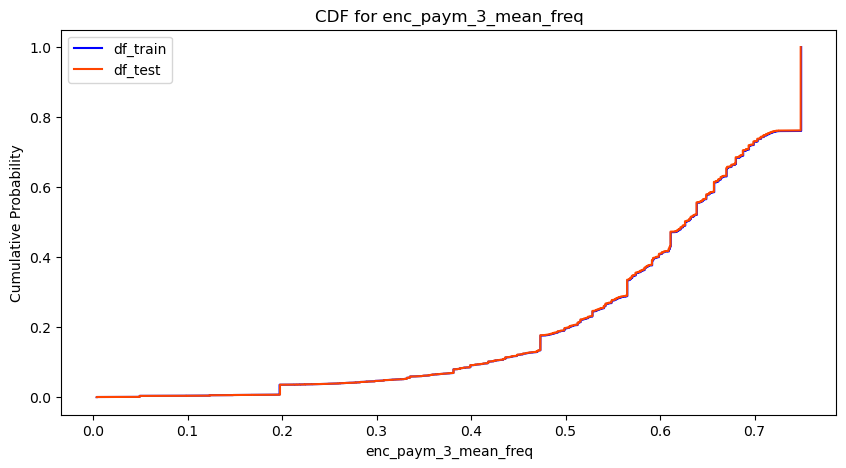

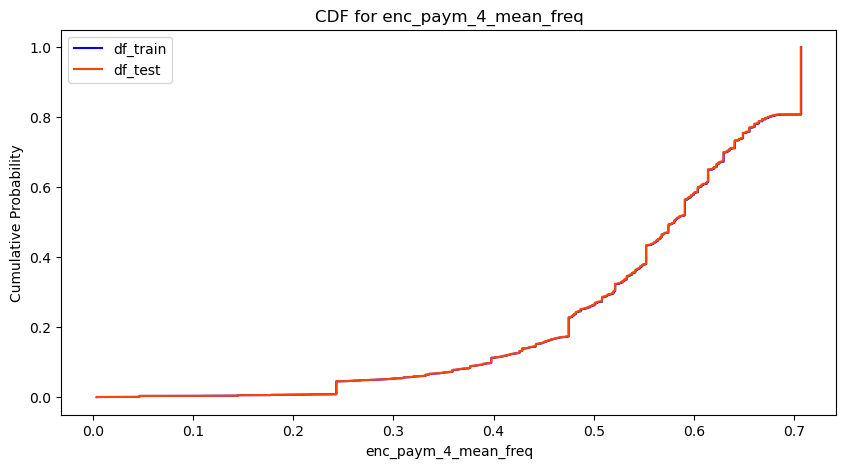

...

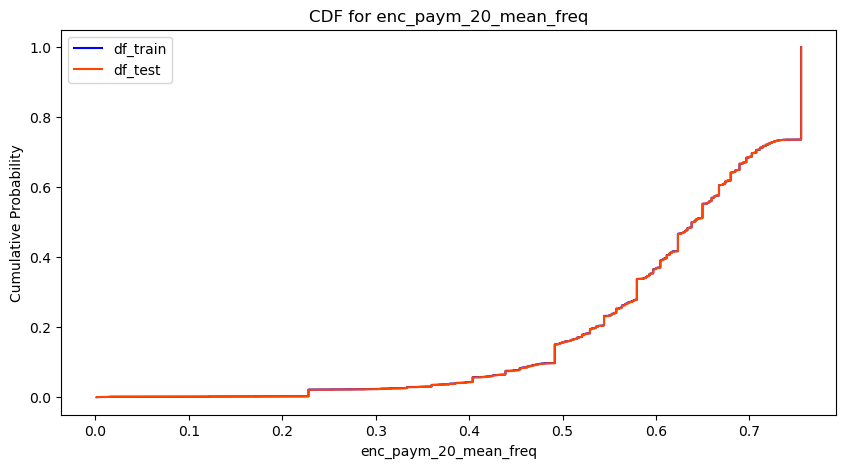

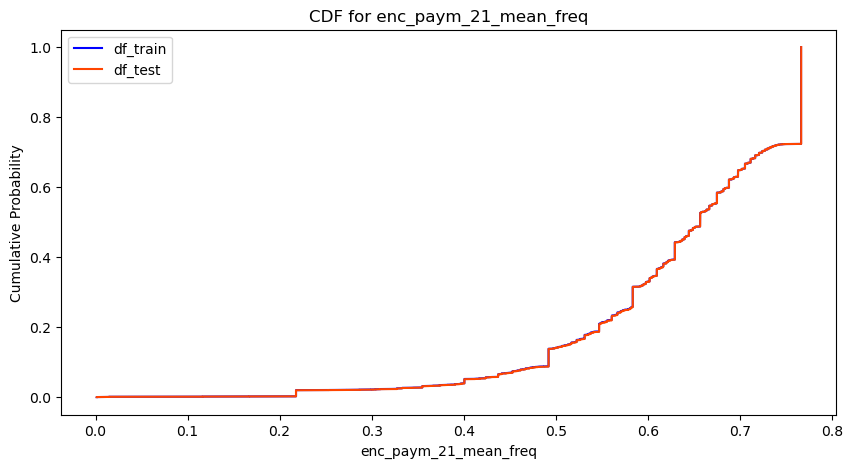

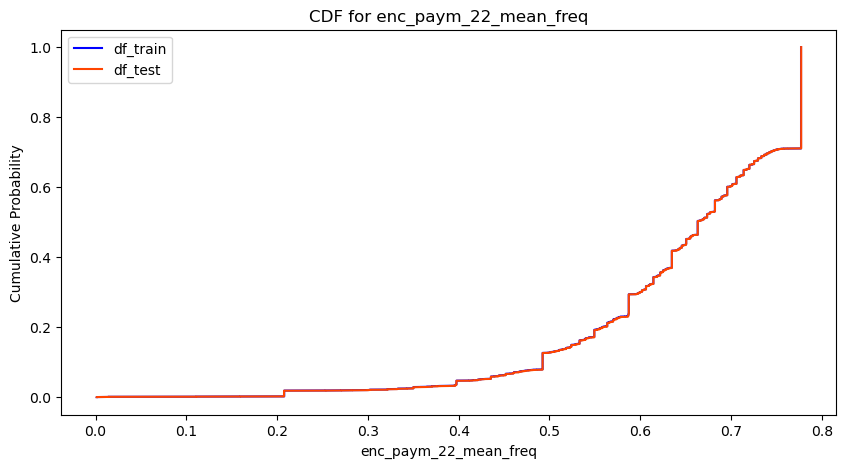

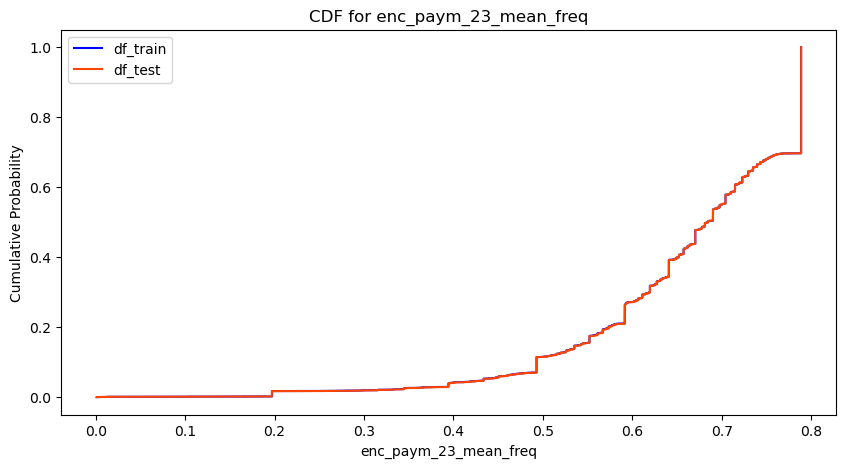

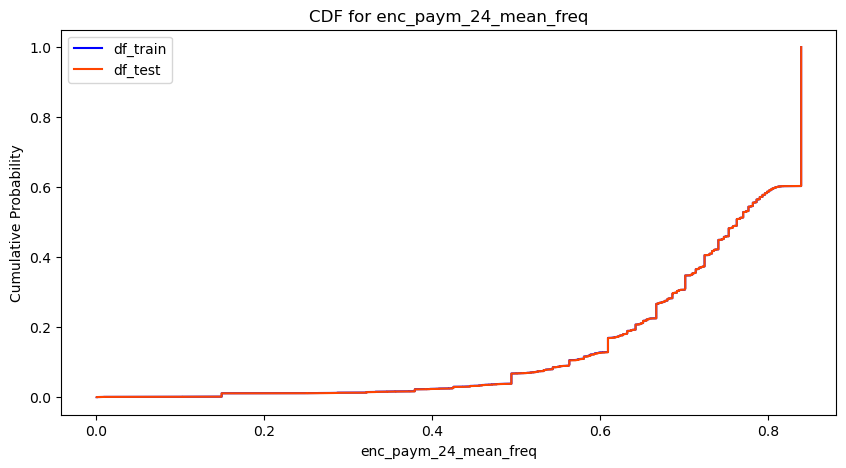

In [140]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-25:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Распределения новых признаков в тренировочном и тестовом датасетах практически идентичны. 

In [141]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'encpaym_f_p_enc_f_p_pre_f_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7723
ROC AUC на валидации: 0.7507
ROC AUC на тесте: 0.7498
Фолд 1
ROC AUC на трейне: 0.7690
ROC AUC на валидации: 0.7475
ROC AUC на тесте: 0.7491
Фолд 2
ROC AUC на трейне: 0.7734
ROC AUC на валидации: 0.7465
ROC AUC на тесте: 0.7493
Фолд 3
ROC AUC на трейне: 0.7670
ROC AUC на валидации: 0.7469
ROC AUC на тесте: 0.7496
Фолд 4
ROC AUC на трейне: 0.7666
ROC AUC на валидации: 0.7475
ROC AUC на тесте: 0.7485
Среднее ROC AUC на трейне: 0.7697 ± 0.0028
Среднее ROC AUC на валидации: 0.7478 ± 0.0015
Среднее ROC AUC на тесте: 0.7493 ± 0.0005


In [142]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456


In [143]:
# Посмотрим на важности фичей
importances_dict

{'pre_util_prop_3': 4.962151692236566,
 'enc_loans_credit_type_prop_0': 4.244601086702979,
 'pre_till_pclose_prop_10': 3.631202739064108,
 'pre_util_prop_6': 3.212562910074732,
 'pre_util_mean_freq': 3.0087179987284496,
 'pre_loans_outstanding_prop_1': 2.815193173230612,
 'enc_paym_1_mean_freq': 2.5188102821321974,
 'pre_loans_credit_limit_prop_2': 2.439066205458635,
 'rn_max': 2.3170829584831187,
 'enc_paym_2_mean_freq': 2.21248173219687,
 'pre_loans_credit_cost_rate_prop_11': 2.039790740234769,
 'pre_loans_outstanding_prop_5': 1.8539856160085537,
 'pre_loans_credit_cost_rate_prop_4': 1.8029172976039327,
 'pre_loans_credit_limit_mean_freq': 1.6744111664110655,
 'pre_loans_credit_cost_rate_prop_6': 1.6259930702702008,
 'enc_paym_0_prop_1': 1.588239370837217,
 'enc_paym_3_mean_freq': 1.5553618022503162,
 'enc_paym_7_mean_freq': 1.341978791297344,
 'pre_loans_next_pay_summ_prop_5': 1.2755232827509788,
 'pre_since_opened_mean_freq': 1.177678647662878,
 'enc_loans_credit_status_mean_freq':

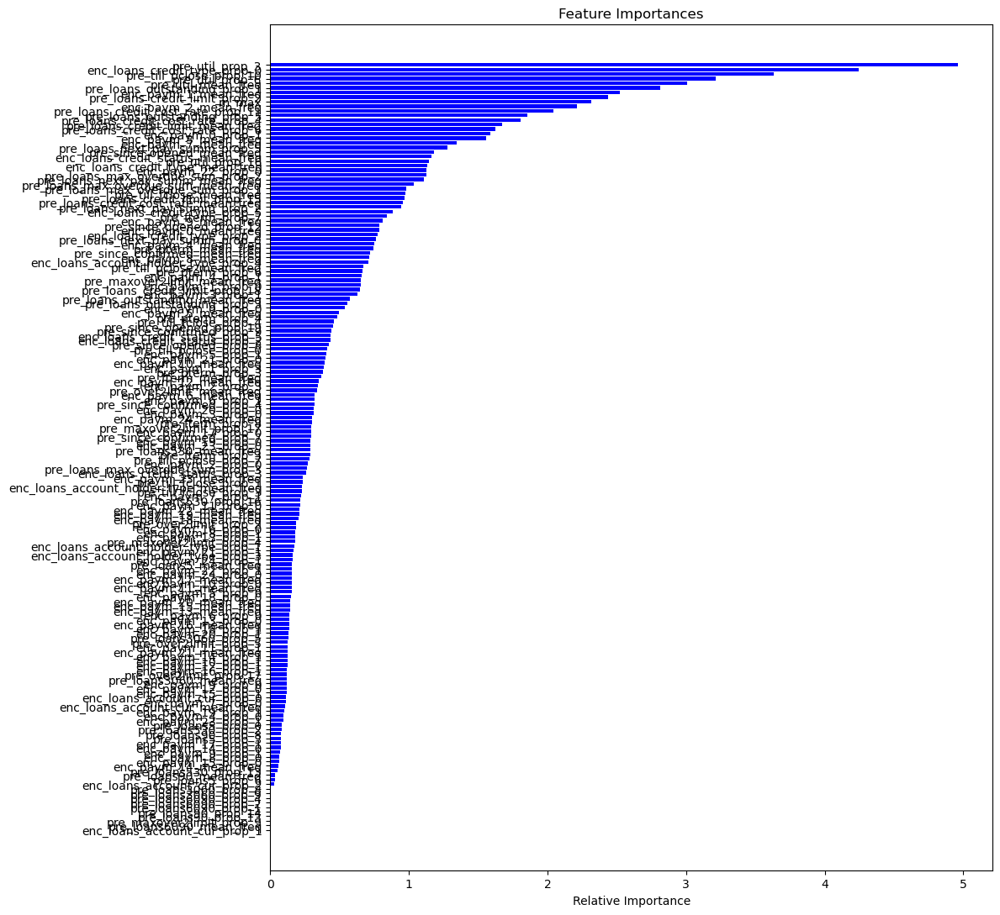

In [144]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

### Enc_paym_features sum mean value frequency periods

In [145]:
source_df_train = pd.read_csv('../prepared_data/source_data_train_1.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test_1.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [146]:
df_train = pd.read_csv('../prepared_data/encpaym_f_p_enc_f_p_pre_f_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/encpaym_f_p_enc_f_p_pre_f_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 170), (600000, 170))

#### All years

In [147]:
# Выведу признаки среднего количества статусов 0-3 на один кредит за все два года в df_train
print('New df_train columns')
df_train = from_enc_paym_create_normalized_group_sum_features(
    source_df_train,
    df_train,
    enc_paym_features,
    'all'
)

print('df_train.shape', df_train.shape)

New df_train columns
enc_paym_avg_0_all
enc_paym_avg_1_all
enc_paym_avg_2_all
enc_paym_avg_3_all
df_train.shape (2400000, 174)


In [148]:
# Выведем признаки среднего количества статусов 0-3 на один кредит за все два года в df_test
print('New df_test columns')
df_test = from_enc_paym_create_normalized_group_sum_features(
    source_df_test,
    df_test,
    enc_paym_features,
    'all'
)

print('df_test.shape', df_test.shape)

New df_test columns
enc_paym_avg_0_all
enc_paym_avg_1_all
enc_paym_avg_2_all
enc_paym_avg_3_all
df_test.shape (600000, 174)


In [149]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-4:]

for col in columns:
    print(df_train[col].nunique(), col)

7098 enc_paym_avg_0_all
2503 enc_paym_avg_1_all
656 enc_paym_avg_2_all
7389 enc_paym_avg_3_all


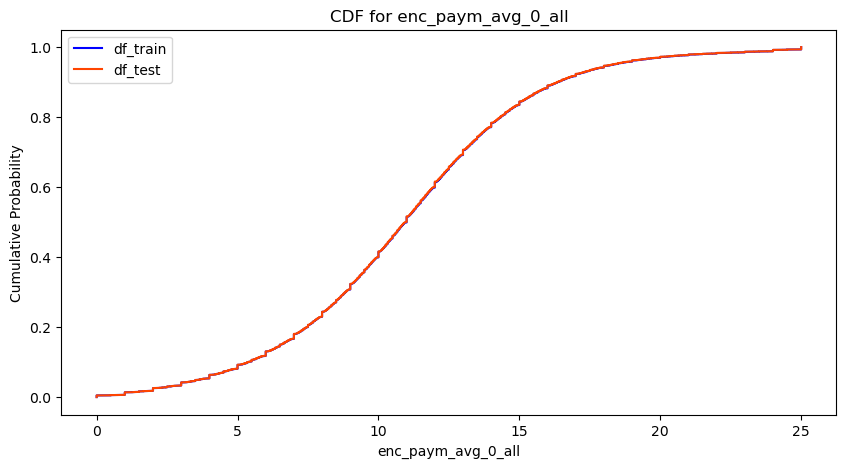

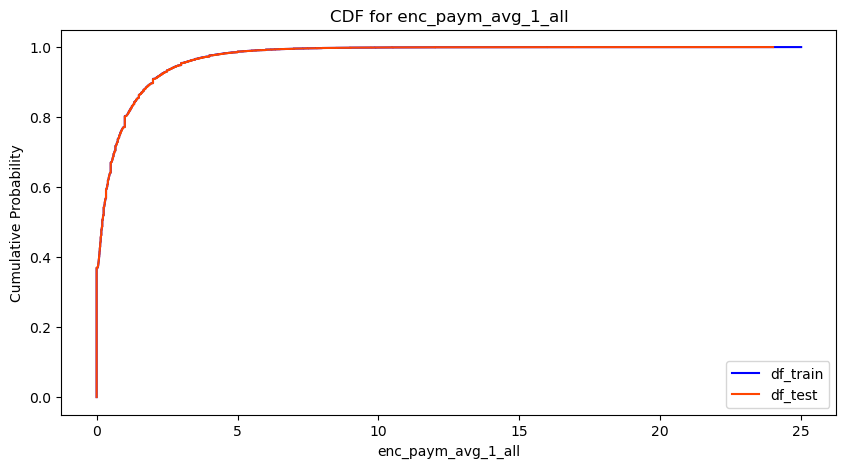

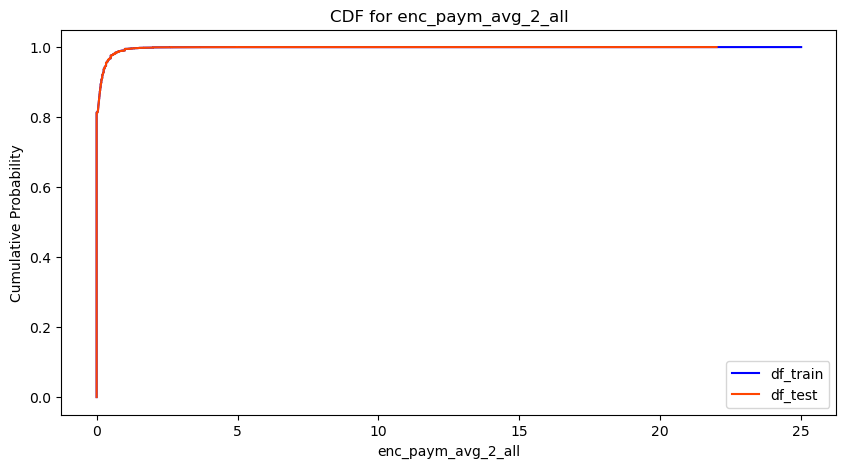

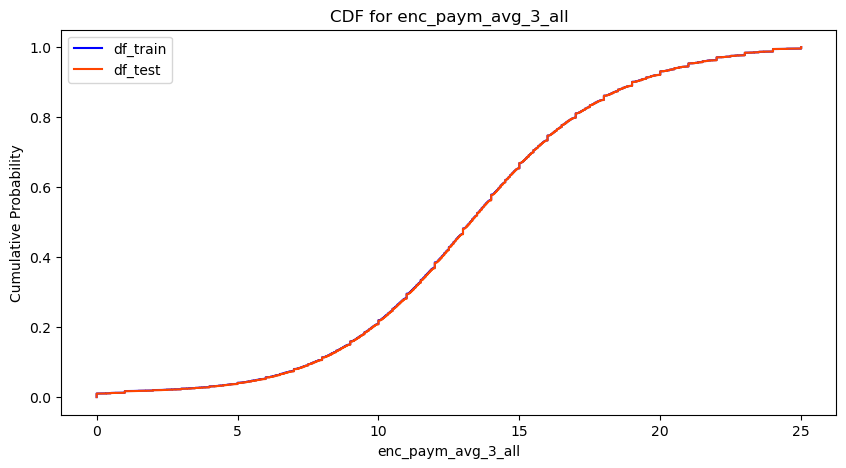

In [150]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Распределения совпадают. Пара из них выглядит как нормальное распределление.

#### This year

In [151]:
# Выведем признаки среднего количества статусов 0-3 на один кредит за ЭТОТ год в df_train
df_train = from_enc_paym_create_normalized_group_sum_features(
    source_df_train,
    df_train,
    enc_paym_features[:12],
    'this_year'
)

print('df_train.shape', df_train.shape)

enc_paym_avg_0_this_year
enc_paym_avg_1_this_year
enc_paym_avg_2_this_year
enc_paym_avg_3_this_year
df_train.shape (2400000, 178)


In [152]:
# Выведу признаки среднего количества статусов 0-3 на один кредит за ЭТОТ год в df_test
df_test = from_enc_paym_create_normalized_group_sum_features(
    source_df_test,
    df_test,
    enc_paym_features[:12],
    'this_year'
)

print('df_test.shape', df_test.shape)

enc_paym_avg_0_this_year
enc_paym_avg_1_this_year
enc_paym_avg_2_this_year
enc_paym_avg_3_this_year
df_test.shape (600000, 178)


In [153]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-4:]

for col in columns:
    print(df_train[col].nunique(), col)

4335 enc_paym_avg_0_this_year
1685 enc_paym_avg_1_this_year
446 enc_paym_avg_2_this_year
4417 enc_paym_avg_3_this_year


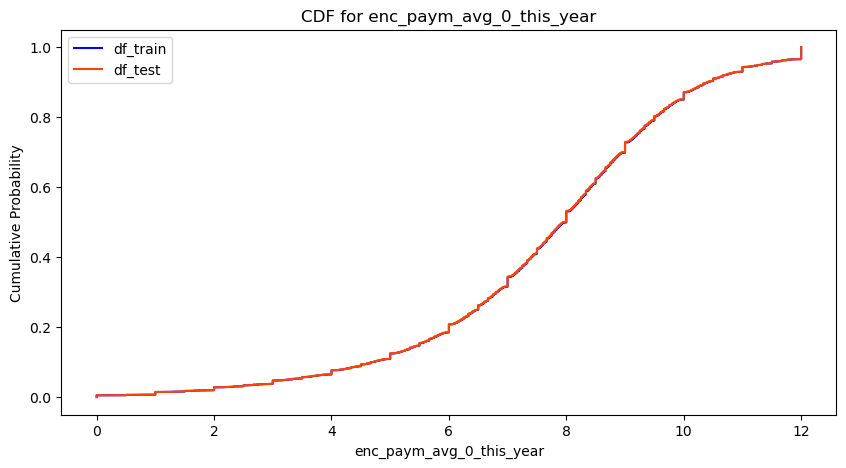

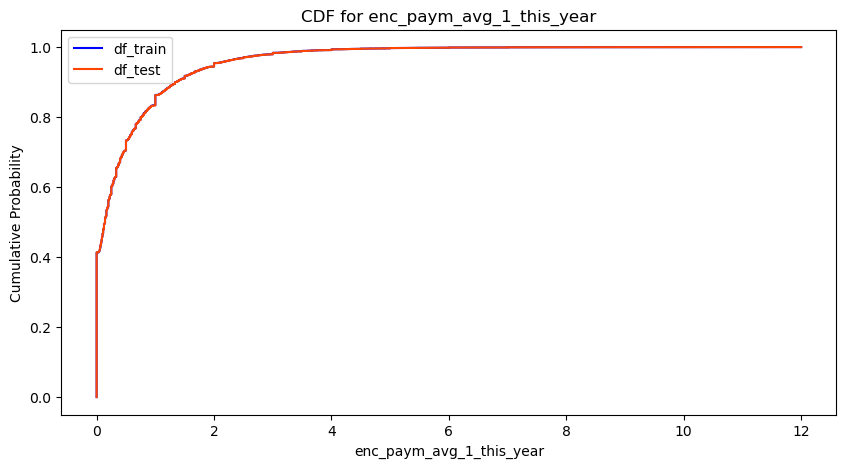

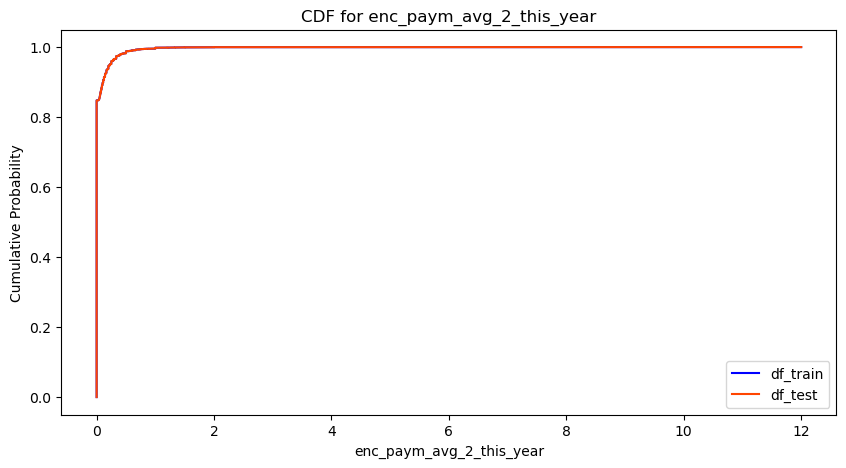

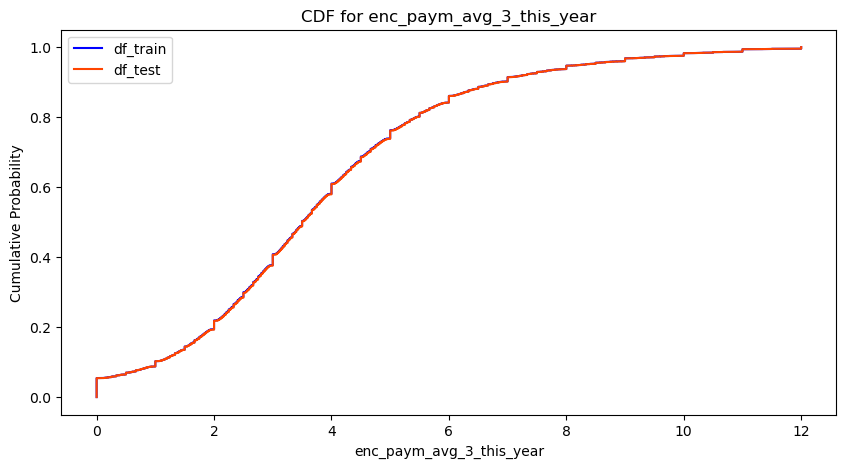

In [154]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Распределения совпадают. Пара из них выглядит как нормальное распределление.

#### Last year

In [155]:
# Выведу признаки среднего количества статусов 0-3 на один кредит за ПРОШЛЫЙ год в df_train
df_train = from_enc_paym_create_normalized_group_sum_features(
    source_df_train,
    df_train,
    enc_paym_features[12:],
    'last_year'
)

print('df_train.shape', df_train.shape)

enc_paym_avg_0_last_year
enc_paym_avg_1_last_year
enc_paym_avg_2_last_year
enc_paym_avg_3_last_year
df_train.shape (2400000, 182)


In [156]:
# Выведу признаки среднего количества статусов 0-3 на один кредит за ПРОШЛЫЙ год в df_test
df_test = from_enc_paym_create_normalized_group_sum_features(
    source_df_test,
    df_test,
    enc_paym_features[12:],
    'last_year')

print('df_test.shape', df_test.shape)

enc_paym_avg_0_last_year
enc_paym_avg_1_last_year
enc_paym_avg_2_last_year
enc_paym_avg_3_last_year
df_test.shape (600000, 182)


In [157]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-4:]

for col in columns:
    print(df_train[col].nunique(), col)

3500 enc_paym_avg_0_last_year
1251 enc_paym_avg_1_last_year
361 enc_paym_avg_2_last_year
3665 enc_paym_avg_3_last_year


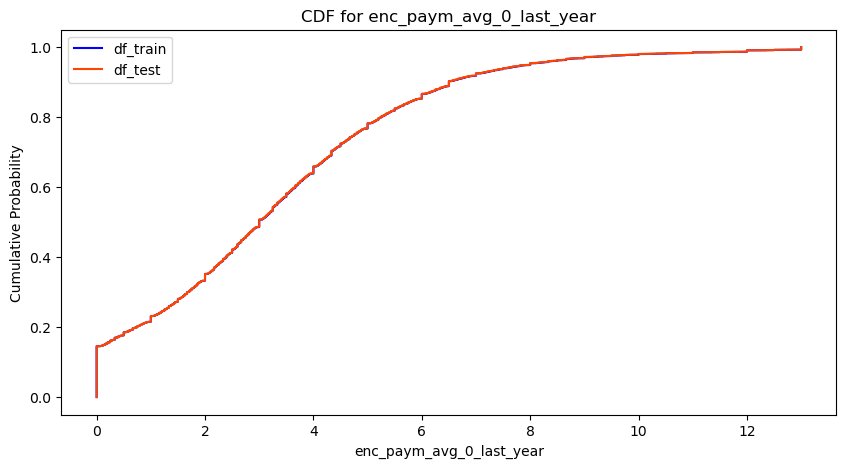

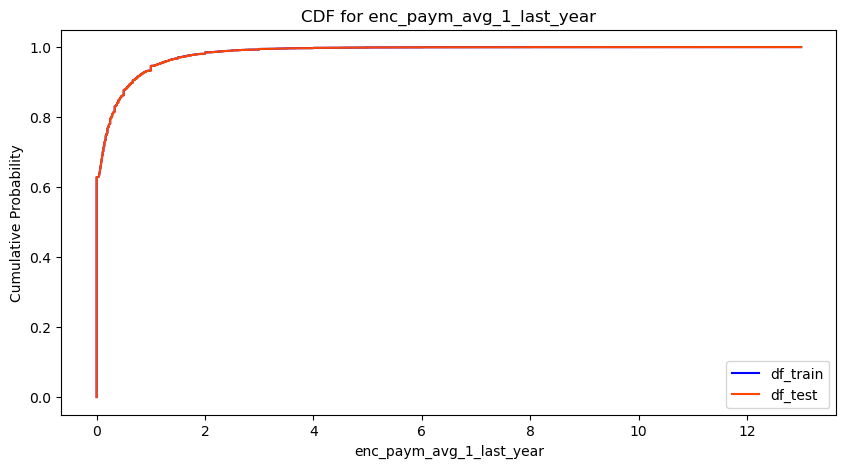

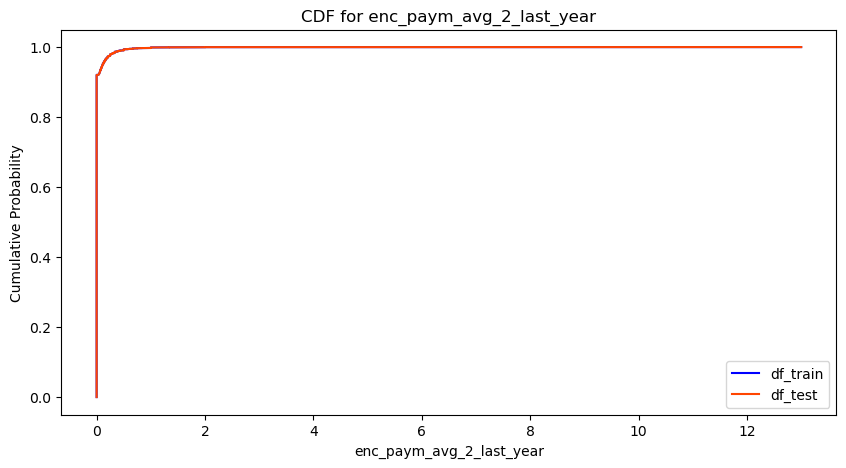

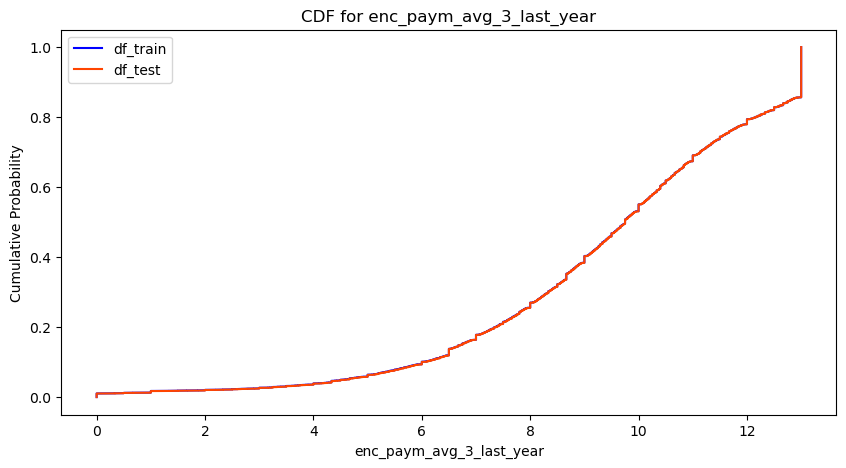

In [158]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Распределения совпадают. Пара из них выглядит как нормальное распределление.

#### Save result and evaluation

In [159]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/encpaym_y_f_p_enc_f_p_pre_f_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/encpaym_y_f_p_enc_f_p_pre_f_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 182), (600000, 182))

In [160]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'encpaym_y_f_p_enc_f_p_pre_f_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7736
ROC AUC на валидации: 0.7538
ROC AUC на тесте: 0.7520
Фолд 1
ROC AUC на трейне: 0.7716
ROC AUC на валидации: 0.7511
ROC AUC на тесте: 0.7522
Фолд 2
ROC AUC на трейне: 0.7759
ROC AUC на валидации: 0.7487
ROC AUC на тесте: 0.7517
Фолд 3
ROC AUC на трейне: 0.7717
ROC AUC на валидации: 0.7506
ROC AUC на тесте: 0.7518
Фолд 4
ROC AUC на трейне: 0.7738
ROC AUC на валидации: 0.7493
ROC AUC на тесте: 0.7530
Среднее ROC AUC на трейне: 0.7733 ± 0.0016
Среднее ROC AUC на валидации: 0.7507 ± 0.0018
Среднее ROC AUC на тесте: 0.7521 ± 0.0005


In [161]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455


In [162]:
# Посмотрим на важности фичей
importances_dict

{'enc_paym_avg_1_all': 5.577243892386354,
 'pre_util_prop_3': 5.036901626487007,
 'enc_loans_credit_type_prop_0': 4.235584956457109,
 'pre_till_pclose_prop_10': 3.348797780338512,
 'pre_util_prop_6': 3.220447804394776,
 'pre_loans_outstanding_prop_1': 2.62270169191221,
 'enc_paym_avg_0_this_year': 2.479454906432735,
 'rn_max': 2.441342197763625,
 'pre_util_mean_freq': 2.2910035782250087,
 'pre_loans_credit_limit_prop_2': 2.257281455382506,
 'enc_paym_avg_2_all': 2.066030222629662,
 'enc_paym_avg_1_this_year': 2.0117868973145985,
 'pre_loans_credit_cost_rate_prop_11': 1.881702184203098,
 'pre_loans_credit_cost_rate_prop_4': 1.855938712516683,
 'pre_loans_outstanding_prop_5': 1.8250314000591896,
 'pre_loans_credit_cost_rate_prop_6': 1.6198988433939407,
 'pre_loans_credit_limit_mean_freq': 1.522754086611756,
 'enc_paym_avg_0_all': 1.508328070329519,
 'enc_loans_credit_status_mean_freq': 1.4529131163909415,
 'pre_util_prop_16': 1.4087904250076588,
 'enc_paym_1_prop_0': 1.2683063122030755,


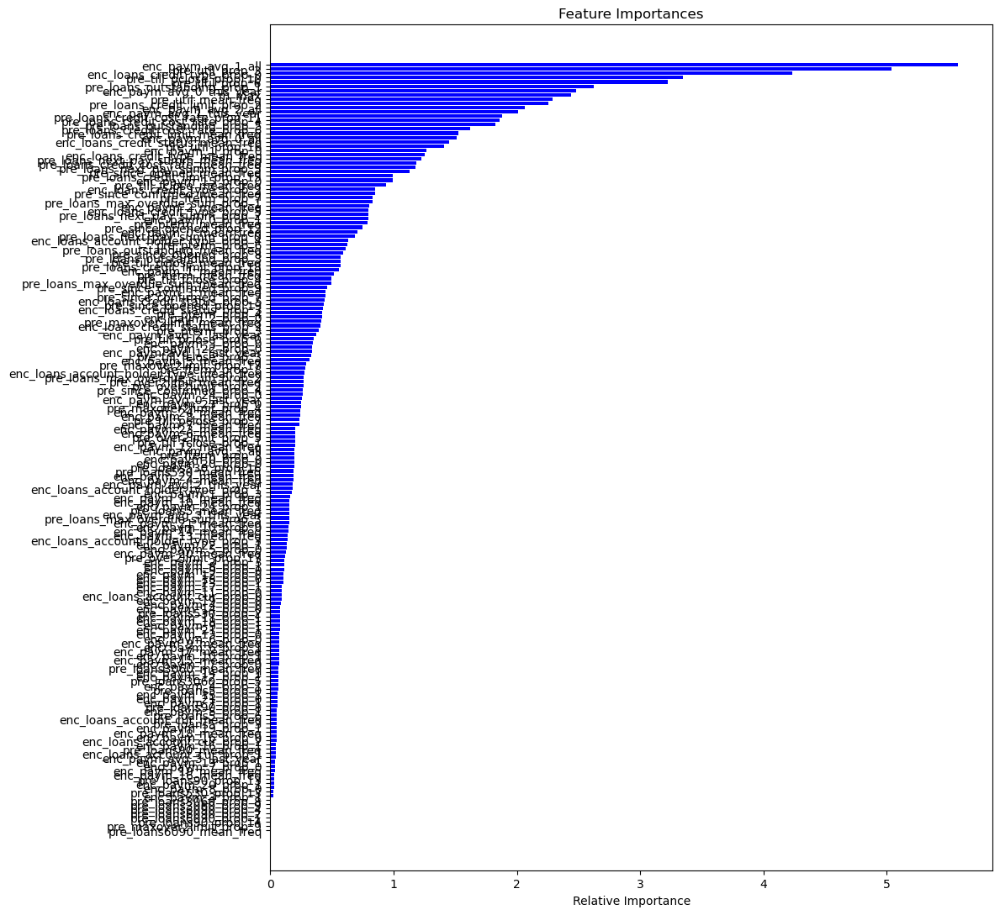

In [163]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

### Enc_paym_features sum mean value frequency difference,  periods difference

Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за все меcяца.   
Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за этот год.    
Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за прошлый год.   
Создадим признаки разницы значений между всеми enc_paym_avg_{0 - 3} за этот и прошлый год.    

In [164]:
source_df_train = pd.read_csv('../prepared_data/source_data_train_1.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test_1.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [165]:
df_train = pd.read_csv('../prepared_data/encpaym_y_f_p_enc_f_p_pre_f_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/encpaym_y_f_p_enc_f_p_pre_f_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 182), (600000, 182))

In [166]:
# Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за все меcяца.   
df_train = create_enc_paym_avg_pair_diff_one_period(df_train, 'all')
df_test = create_enc_paym_avg_pair_diff_one_period(df_test, 'all')
df_train.shape, df_test.shape

((2400000, 188), (600000, 188))

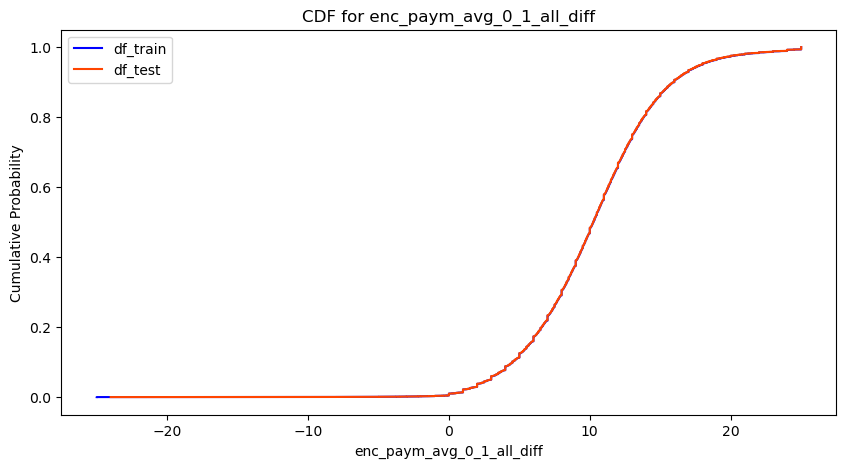

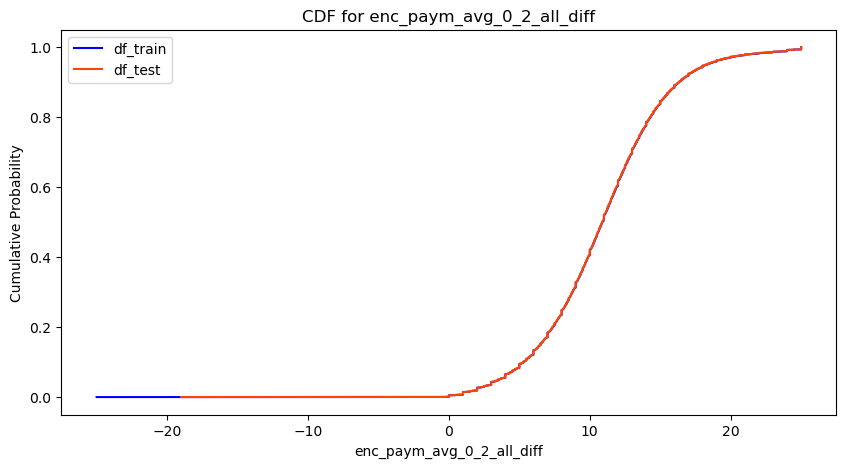

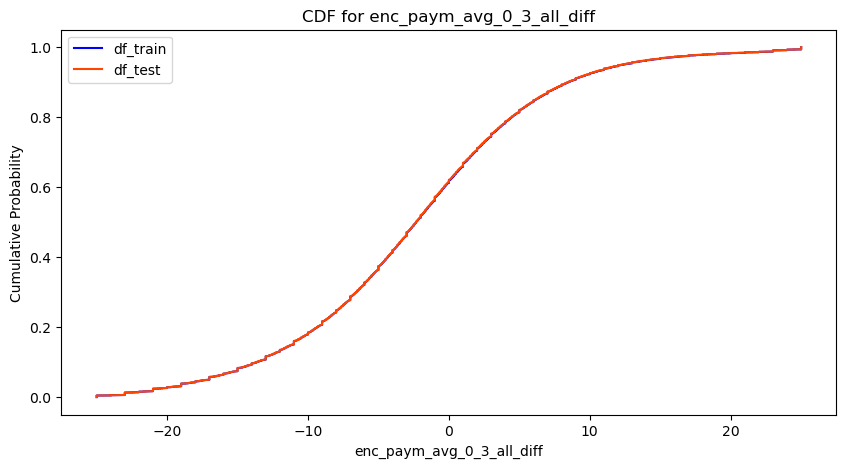

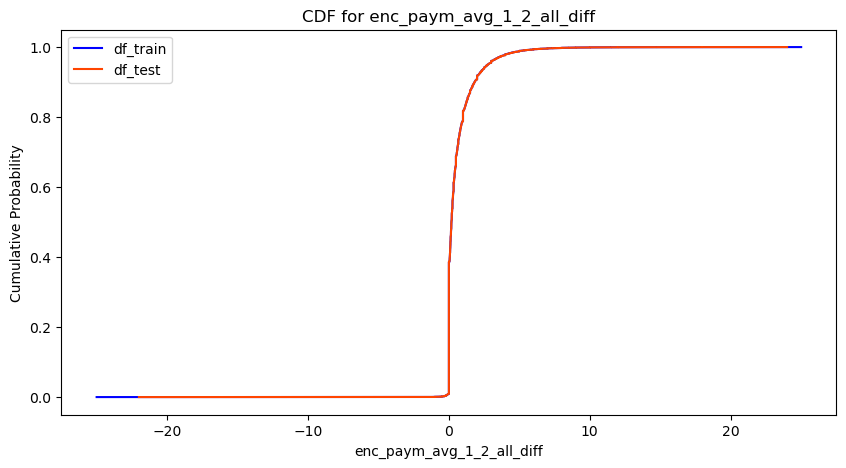

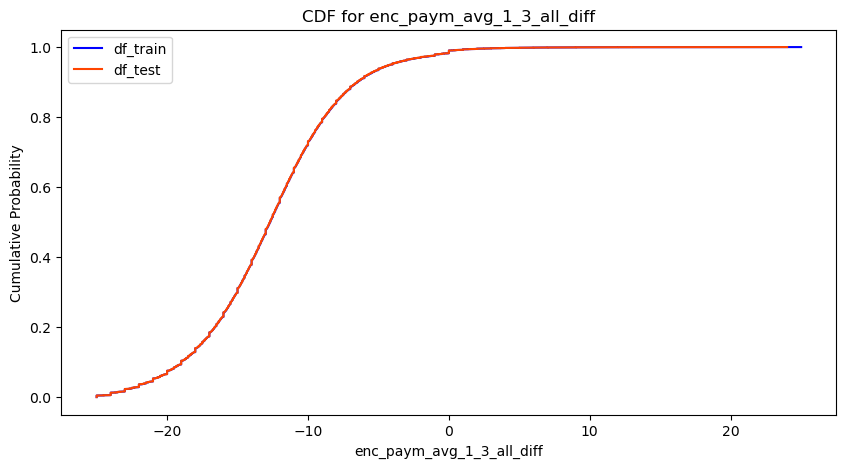

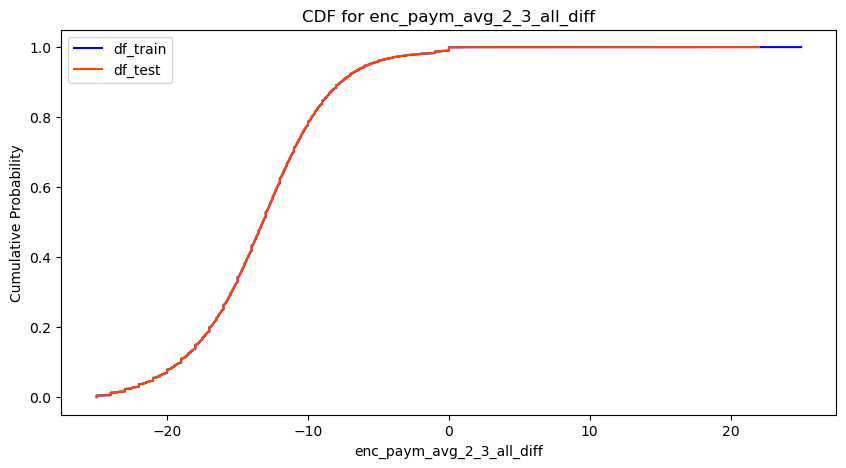

In [167]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-6:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

In [168]:
# Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за этот год.    
df_train = create_enc_paym_avg_pair_diff_one_period(df_train, 'this_year')
df_test = create_enc_paym_avg_pair_diff_one_period(df_test, 'this_year')
df_train.shape, df_test.shape

((2400000, 194), (600000, 194))

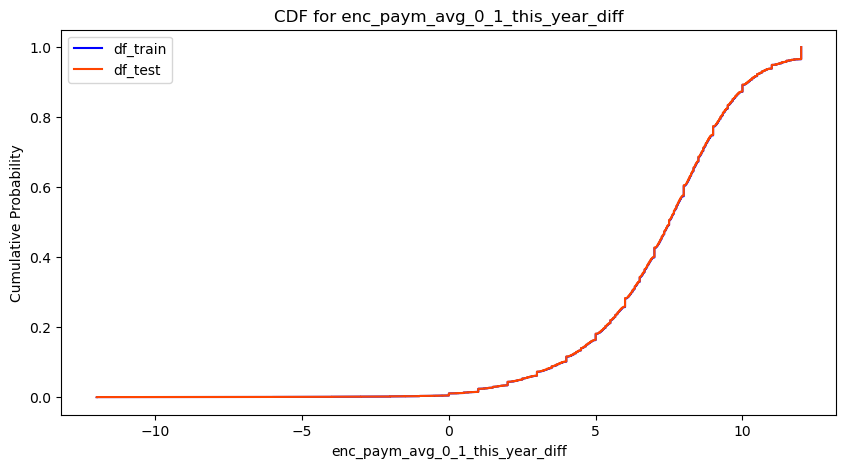

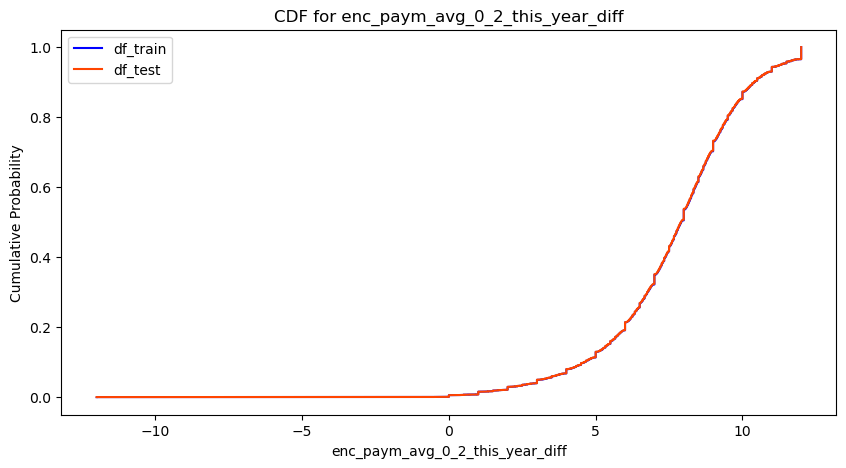

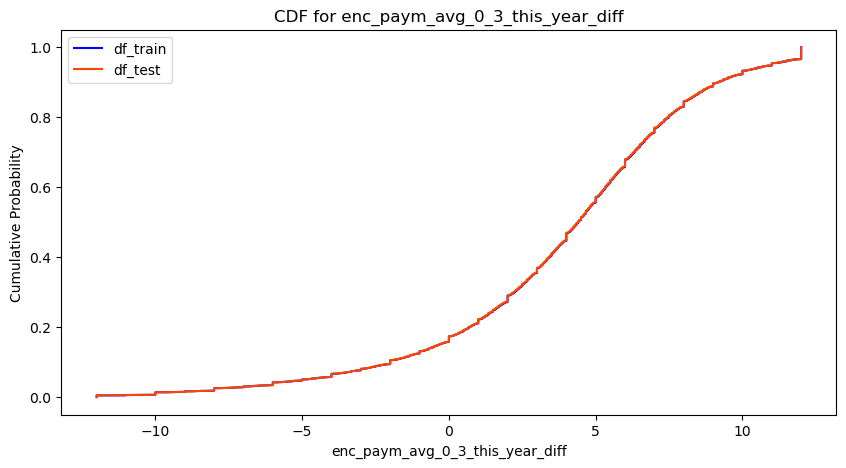

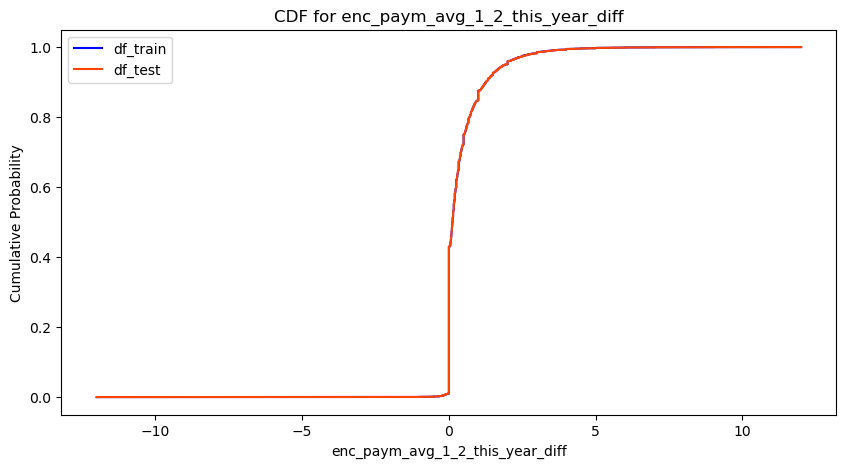

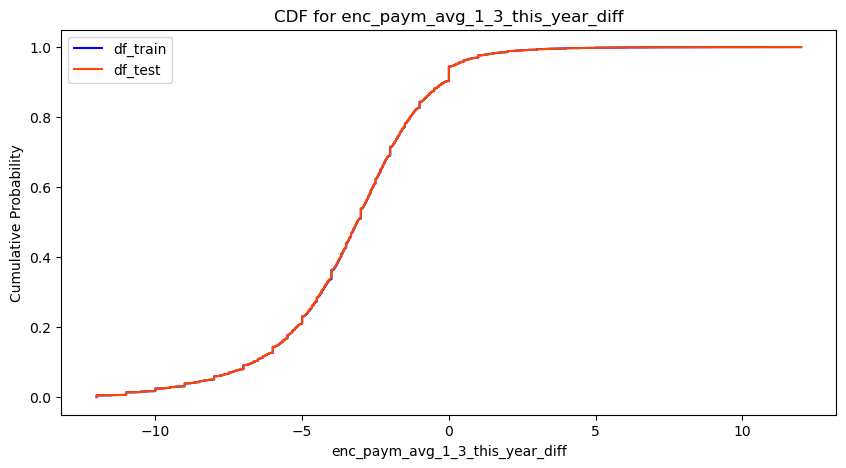

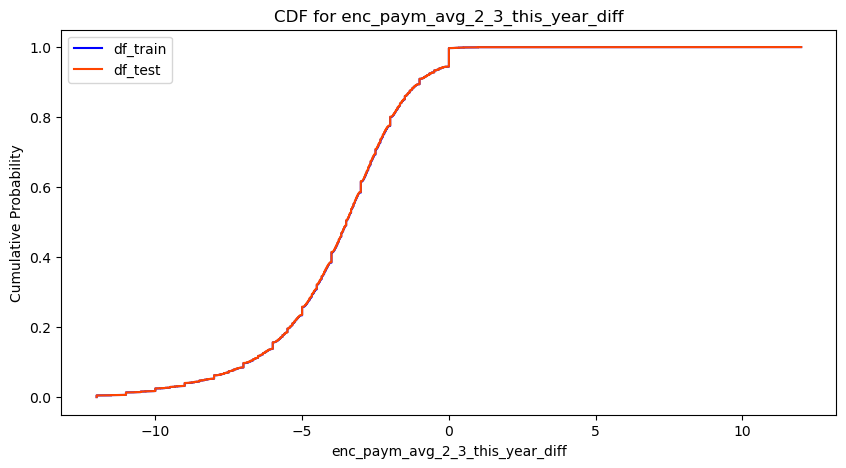

In [169]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-6:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

In [170]:
#  Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за прошлый год.   
df_train = create_enc_paym_avg_pair_diff_one_period(df_train, 'last_year')
df_test = create_enc_paym_avg_pair_diff_one_period(df_test, 'last_year')
df_train.shape, df_test.shape

((2400000, 200), (600000, 200))

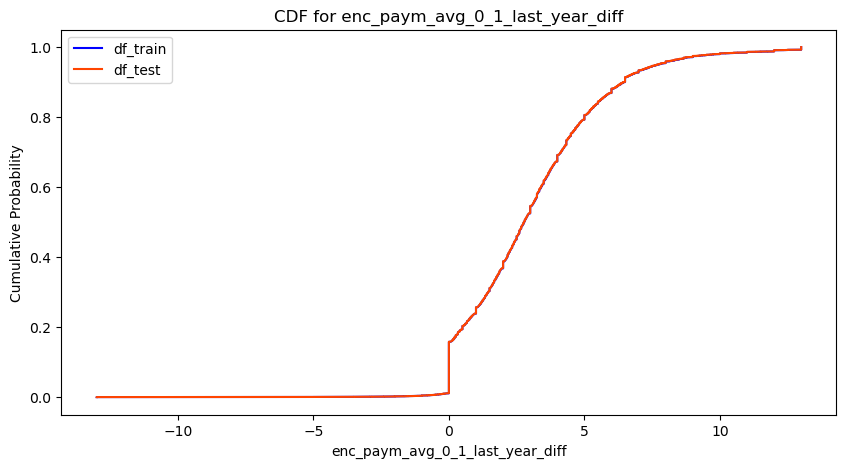

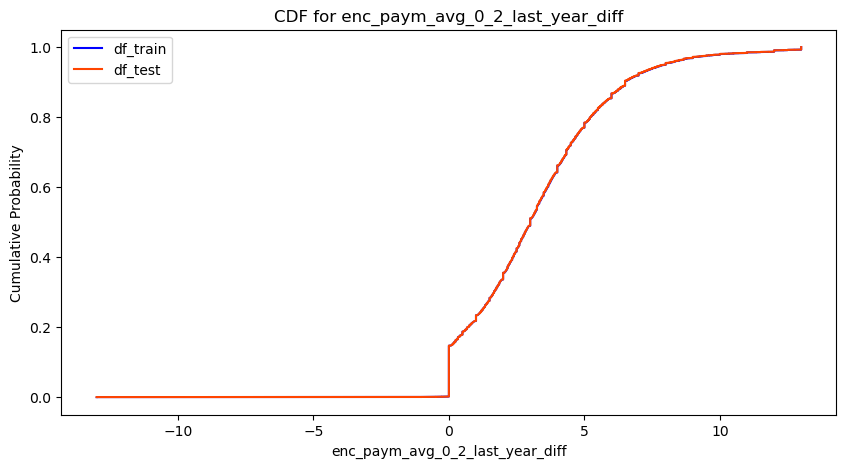

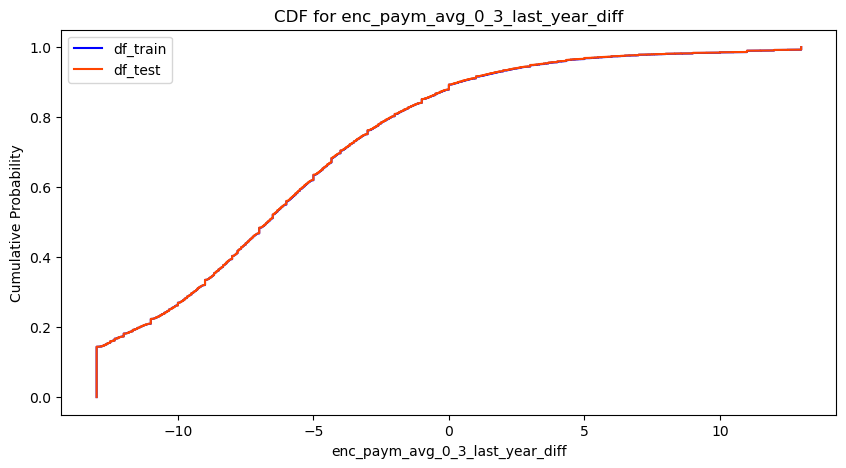

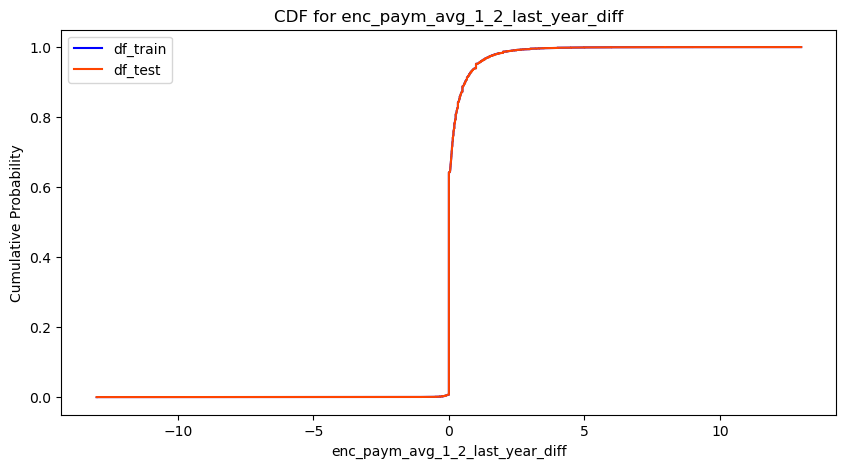

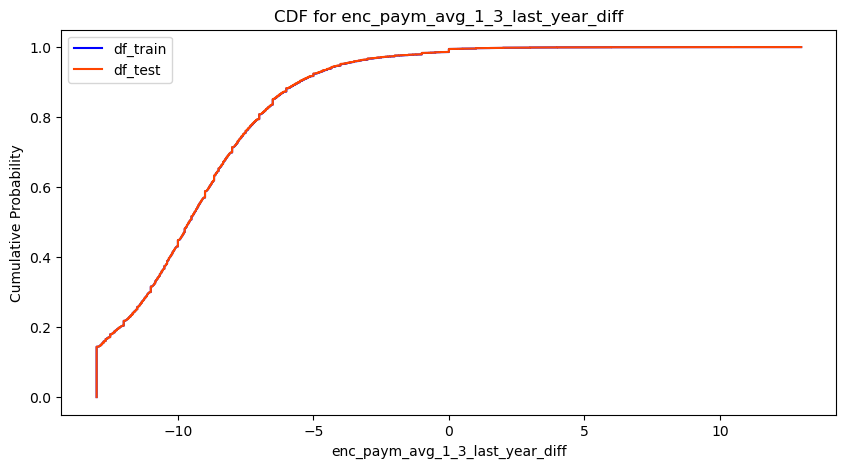

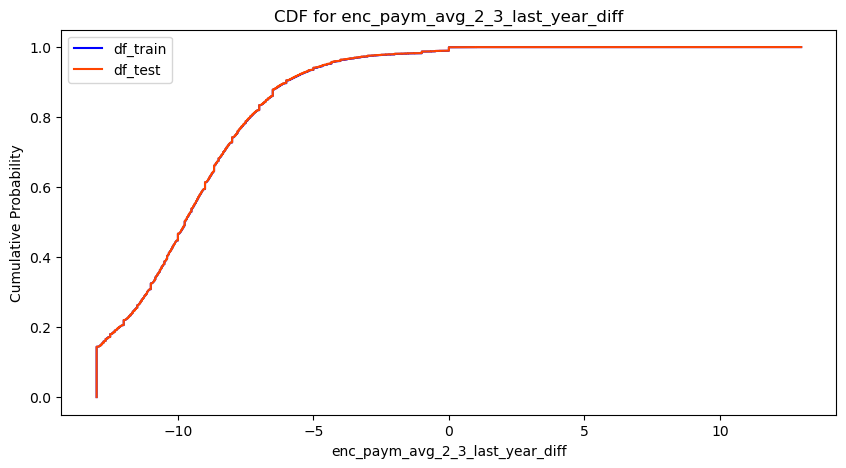

In [171]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-6:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

In [172]:
# Создадим признаки разницы значений между всеми enc_paym_avg_{0 - 3} за этот и прошлый год.    
df_train = create_enc_paym_avg_pair_diff_years(df_train)
df_test = create_enc_paym_avg_pair_diff_years(df_test)
df_train.shape, df_test.shape

((2400000, 204), (600000, 204))

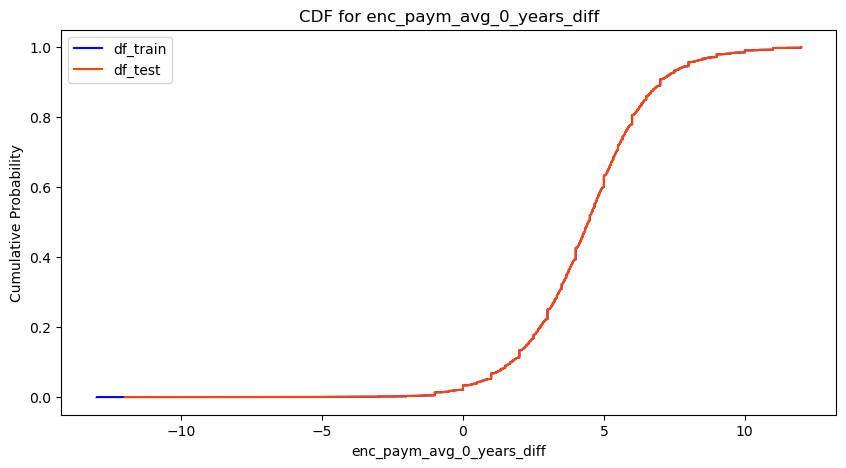

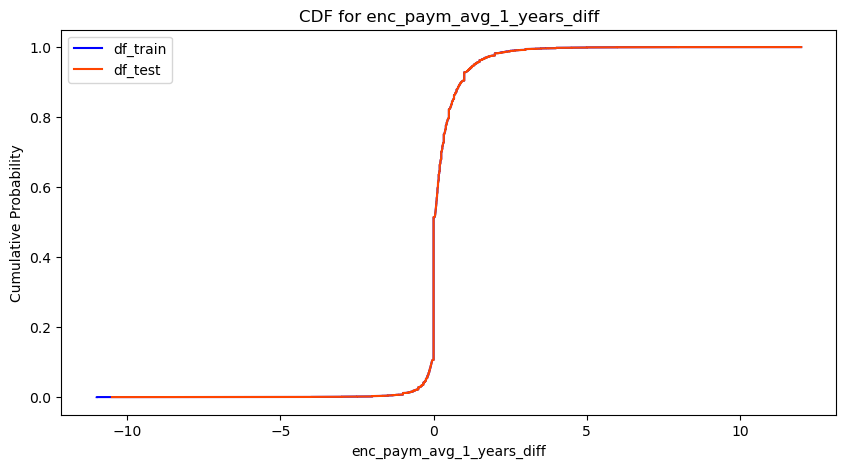

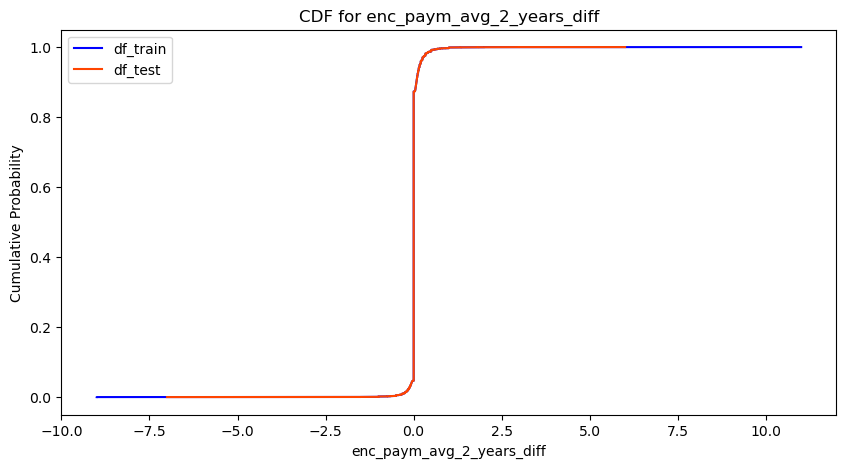

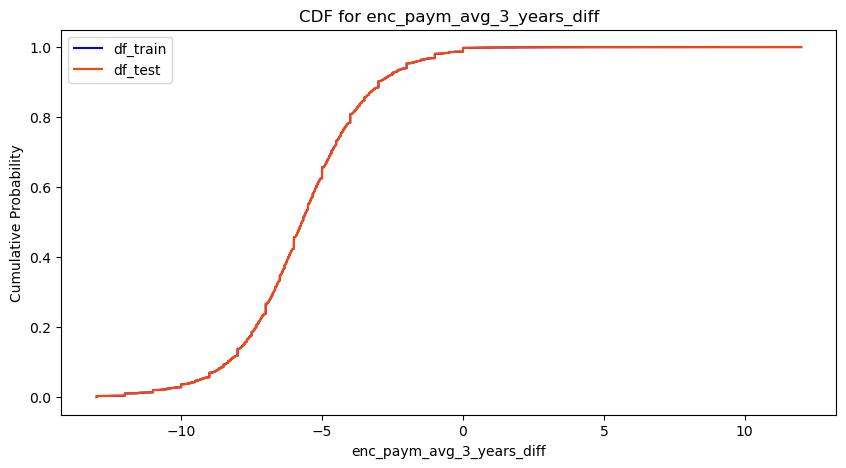

In [173]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

In [174]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 204), (600000, 204))

In [175]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'encpaym_d_y_f_p_enc_f_p_pre_f_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7761
ROC AUC на валидации: 0.7546
ROC AUC на тесте: 0.7525
Фолд 1
ROC AUC на трейне: 0.7705
ROC AUC на валидации: 0.7515
ROC AUC на тесте: 0.7522
Фолд 2
ROC AUC на трейне: 0.7688
ROC AUC на валидации: 0.7495
ROC AUC на тесте: 0.7518
Фолд 3
ROC AUC на трейне: 0.7711
ROC AUC на валидации: 0.7507
ROC AUC на тесте: 0.7520
Фолд 4
ROC AUC на трейне: 0.7695
ROC AUC на валидации: 0.7494
ROC AUC на тесте: 0.7521
Среднее ROC AUC на трейне: 0.7712 ± 0.0026
Среднее ROC AUC на валидации: 0.7511 ± 0.0019
Среднее ROC AUC на тесте: 0.7521 ± 0.0002


In [176]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246


In [177]:
# Посмотрим на важности фичей
importances_dict

{'enc_paym_avg_0_1_this_year_diff': 5.772471552675427,
 'pre_util_prop_3': 5.21008925271068,
 'enc_loans_credit_type_prop_0': 4.1304790186683995,
 'pre_till_pclose_prop_10': 3.7647782137750325,
 'pre_util_prop_6': 3.308654579849606,
 'enc_paym_avg_1_all': 2.863776227286237,
 'pre_util_mean_freq': 2.740131090264479,
 'pre_loans_outstanding_prop_1': 2.6888072808799404,
 'rn_max': 2.4985341125464107,
 'pre_loans_credit_limit_prop_2': 2.33529979185989,
 'enc_paym_avg_2_all': 2.217996665047513,
 'pre_loans_credit_cost_rate_prop_11': 1.9710184332135707,
 'pre_loans_credit_cost_rate_prop_4': 1.7962882477134183,
 'pre_loans_outstanding_prop_5': 1.7911271991662734,
 'pre_loans_credit_cost_rate_prop_6': 1.7354261757947205,
 'enc_paym_avg_0_1_all_diff': 1.6871523578179026,
 'pre_loans_credit_limit_mean_freq': 1.667916944347257,
 'enc_paym_avg_1_2_this_year_diff': 1.5164187189453289,
 'enc_loans_credit_status_mean_freq': 1.3199866214239826,
 'pre_loans_credit_cost_rate_mean_freq': 1.28903255434414

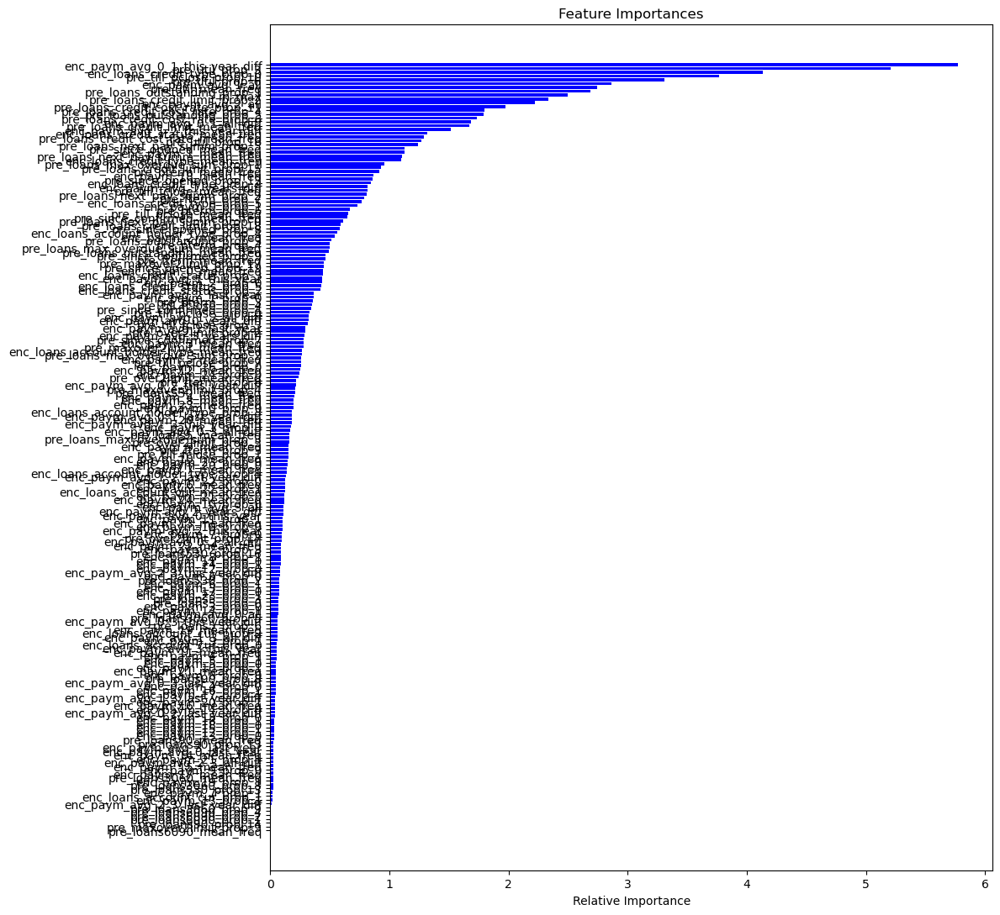

In [178]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

## Flag_features

### Research flag_features

In [180]:
source_df_train = pd.read_csv('../prepared_data/source_data_train_1.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test_1.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [181]:
# Проверим признаки группы на бинарность
flag = all(df[col].nunique() == 2 for col in flag_features)
print('Все признаки группы бинарные' if flag else 'Есть признаки, не являющиеся бинарными')

Все признаки группы бинарные


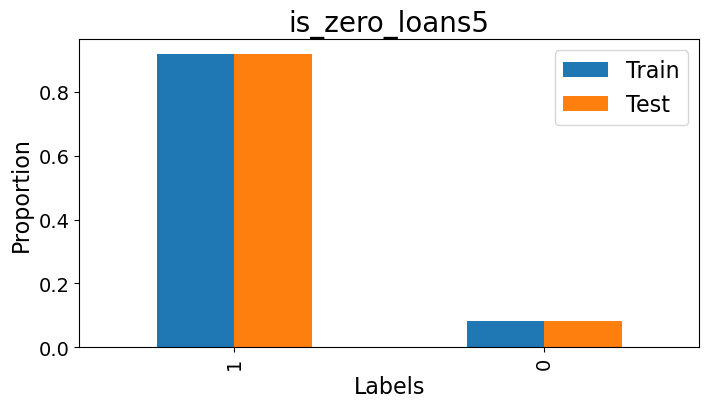

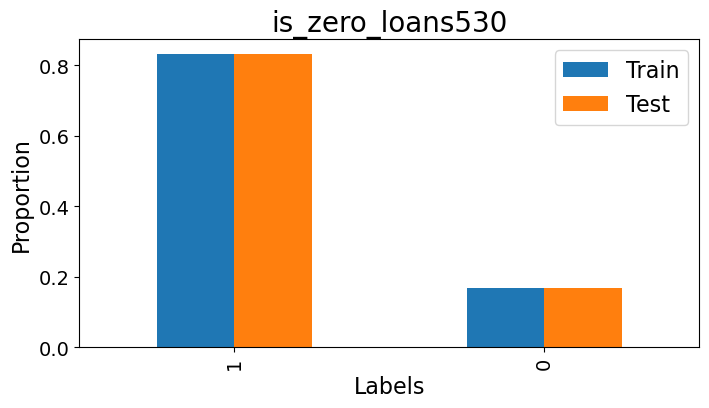

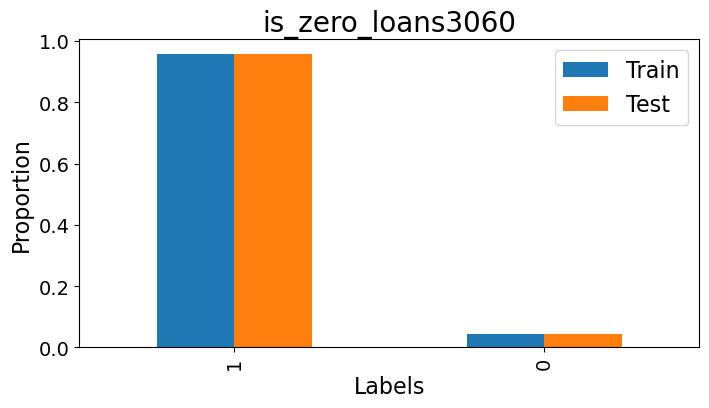

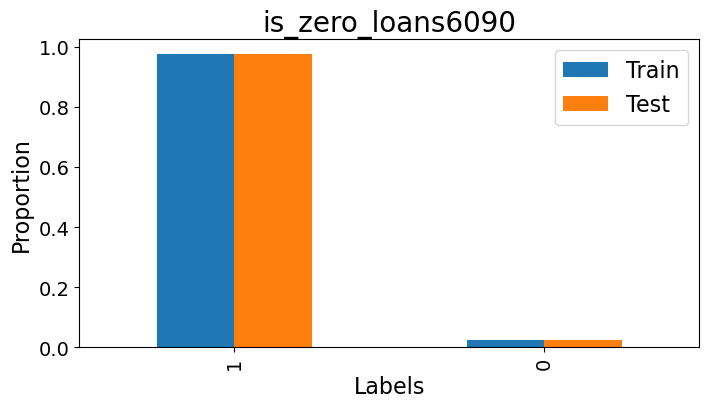

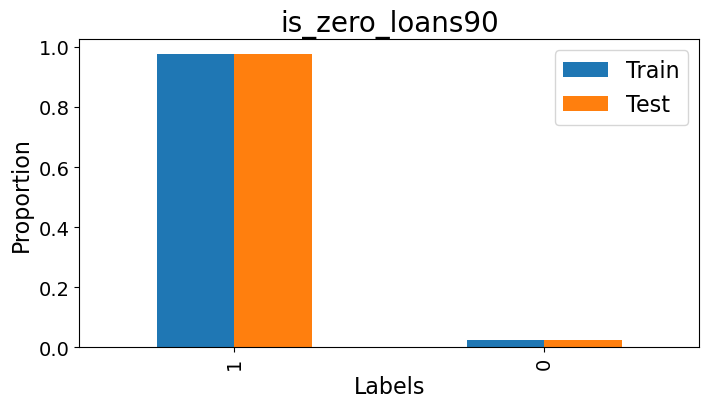

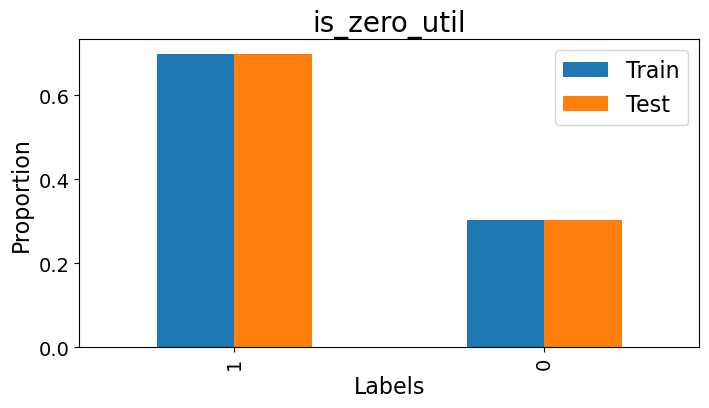

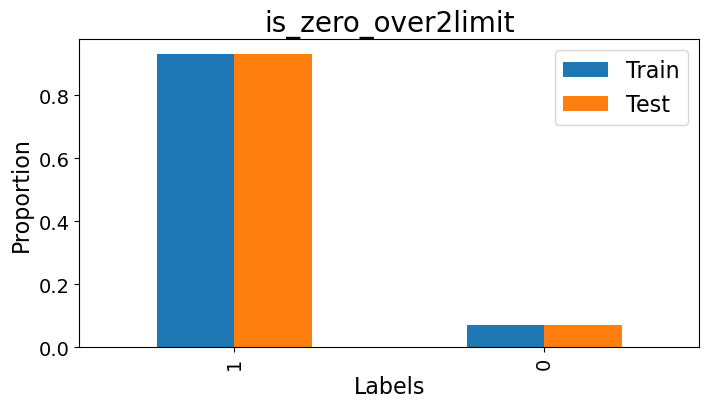

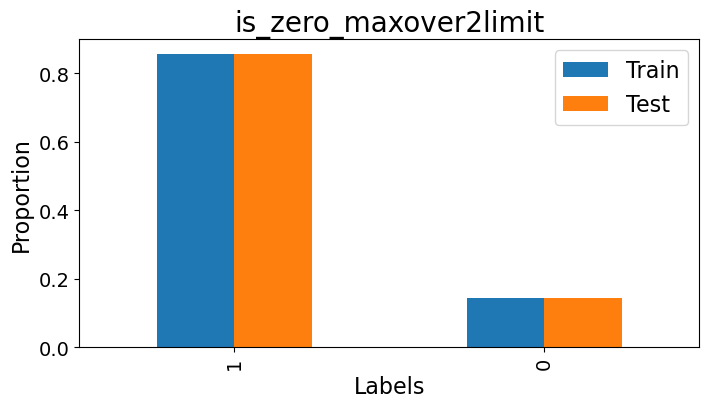

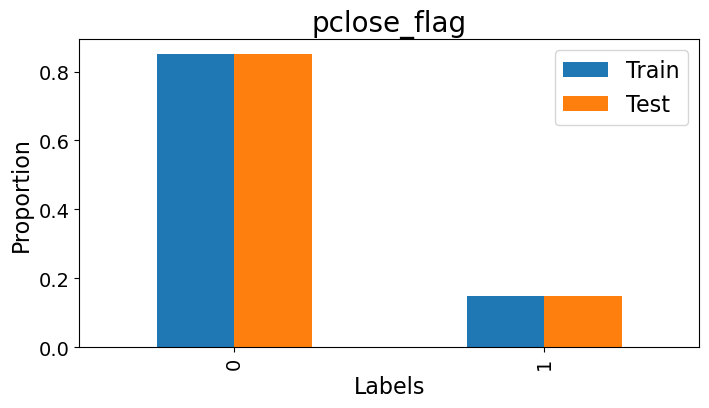

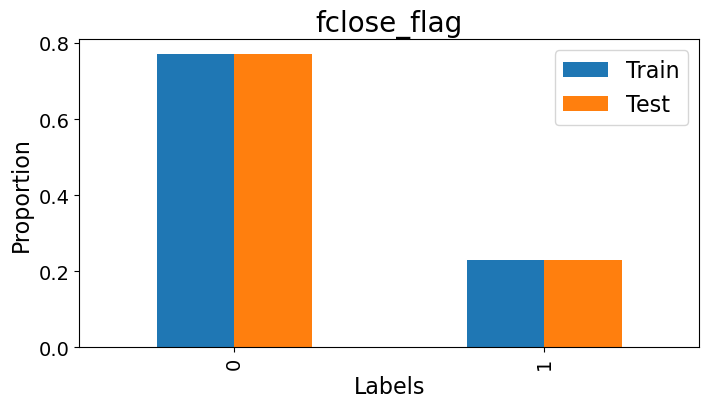

In [89]:
"""
Посмотрим на формы распределений признаков группы и сравним 
их схожесть между тренировочный и тестовым набором
"""
for col in flag_features:    
    # Считаем пропорцию каждого уникального значения признака в train и test
    train_counts = source_df_train[col].value_counts(normalize=True)
    test_counts = source_df_test[col].value_counts(normalize=True)

    """
    Объединяем результаты в DataFrame с двумя столбцами: Train и Test.
    Если какая-то категория встречается только в одной из выборок,
    то для другой ставится NaN, который после объединения заменяется  на 0.
    """
    df_plot = pd.DataFrame({'Train': train_counts, 'Test': test_counts}).fillna(0)

    """
    Для сортировки категорий по убыванию доли, создадим столбец суммы частот 
    категорий в train и test.
    """
    df_plot['sum'] = df_plot['Train'] + df_plot['Test']

    # Сортируем датафрейм и удаляем колонку sum
    df_plot_sorted = df_plot.sort_values(by='sum', ascending=False).drop(columns='sum')

    # Строим bar plot
    ax = df_plot_sorted.plot(kind='bar', figsize=(8, 4))

    # Создаём подписи
    ax.set_title(col, fontsize=20)  
    ax.set_xlabel('Labels', fontsize=16)
    ax.set_ylabel('Proportion', fontsize=16)

    # Задаём размер чисел на графике
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)

    ax.legend(fontsize=16)
    plt.show()

Визуально распределения признаков практически совпадают, что свидетельствует о корректном разбиении данных и отсутствии явного сдвига между выборками.      
Распределения по большинству признаков сильно смещены: для многих из них наблюдается выраженное преобладание значения 1 - отсутствие просрочки, что нормально для большинства клиентов.

### Create proportion value 1 flag_features

In [183]:
source_df_train = pd.read_csv('../prepared_data/source_data_train_1.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test_1.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [184]:
df_train = pd.read_csv('../prepared_data/encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 204), (600000, 204))

In [185]:
flag_features_dict = {key: [1] for key in flag_features}
flag_features_dict

{'is_zero_loans5': [1],
 'is_zero_loans530': [1],
 'is_zero_loans3060': [1],
 'is_zero_loans6090': [1],
 'is_zero_loans90': [1],
 'is_zero_util': [1],
 'is_zero_over2limit': [1],
 'is_zero_maxover2limit': [1],
 'pclose_flag': [1],
 'fclose_flag': [1]}

In [186]:
# Создадим признаки пропорций значения 1 в тренировочном датасете
df_train = create_definite_value_proportion_features(
    source_df_train,
    df_train,
    flag_features_dict
)
df_train.shape

--------------------------------------------------
Исходный признак: is_zero_loans5
Новые фичи:
is_zero_loans5_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans530
Новые фичи:
is_zero_loans530_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans3060
Новые фичи:
is_zero_loans3060_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans6090
Новые фичи:
is_zero_loans6090_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans90
Новые фичи:
is_zero_loans90_prop_1
--------------------------------------------------
Исходный признак: is_zero_util
Новые фичи:
is_zero_util_prop_1
--------------------------------------------------
Исходный признак: is_zero_over2limit
Новые фичи:
is_zero_over2limit_prop_1
--------------------------------------------------
Исходный признак: is_zero_maxover2limit
Новые фичи:
is_zero_maxover2limit_prop_1
--------------------

(2400000, 214)

In [187]:
# Создадим признаки пропорций значения 1 в тестовом датасете
df_test = create_definite_value_proportion_features(
    source_df_test,
    df_test,
    flag_features_dict
)
df_test.shape

--------------------------------------------------
Исходный признак: is_zero_loans5
Новые фичи:
is_zero_loans5_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans530
Новые фичи:
is_zero_loans530_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans3060
Новые фичи:
is_zero_loans3060_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans6090
Новые фичи:
is_zero_loans6090_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans90
Новые фичи:
is_zero_loans90_prop_1
--------------------------------------------------
Исходный признак: is_zero_util
Новые фичи:
is_zero_util_prop_1
--------------------------------------------------
Исходный признак: is_zero_over2limit
Новые фичи:
is_zero_over2limit_prop_1
--------------------------------------------------
Исходный признак: is_zero_maxover2limit
Новые фичи:
is_zero_maxover2limit_prop_1
--------------------

(600000, 214)

In [188]:
# Создадим признаки средних значений группы по строкам.
df_train = from_is_zero_prop_1_create_sum_prop_1_feature(df_train)
df_test = from_is_zero_prop_1_create_sum_prop_1_feature(df_test)
df_train.shape, df_test.shape

((2400000, 215), (600000, 215))

In [189]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 215), (600000, 215))

In [190]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-11:]

for col in columns:
    print(df_train[col].nunique(), col)

304 is_zero_loans5_prop_1
374 is_zero_loans530_prop_1
283 is_zero_loans3060_prop_1
250 is_zero_loans6090_prop_1
300 is_zero_loans90_prop_1
411 is_zero_util_prop_1
295 is_zero_over2limit_prop_1
367 is_zero_maxover2limit_prop_1
346 pclose_flag_prop_1
415 fclose_flag_prop_1
1740 is_zero_sum_prop_1


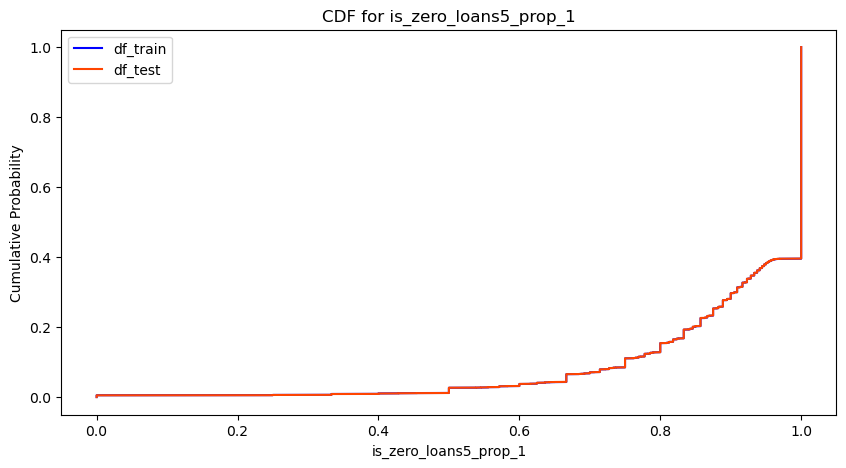

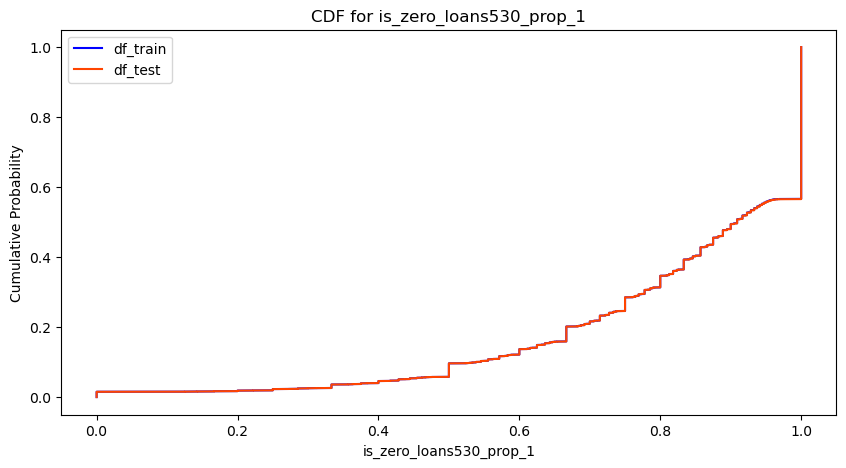

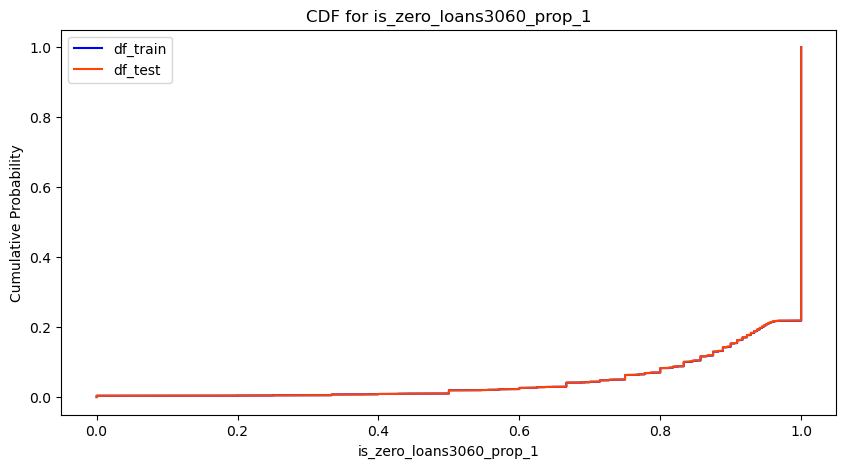

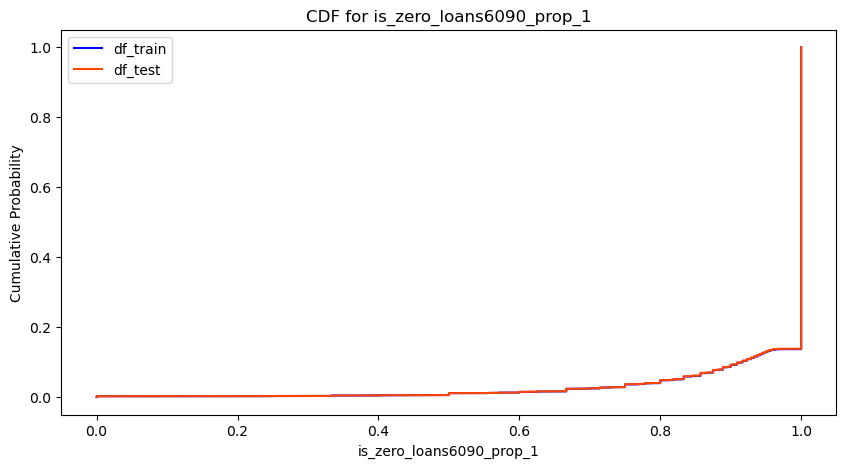

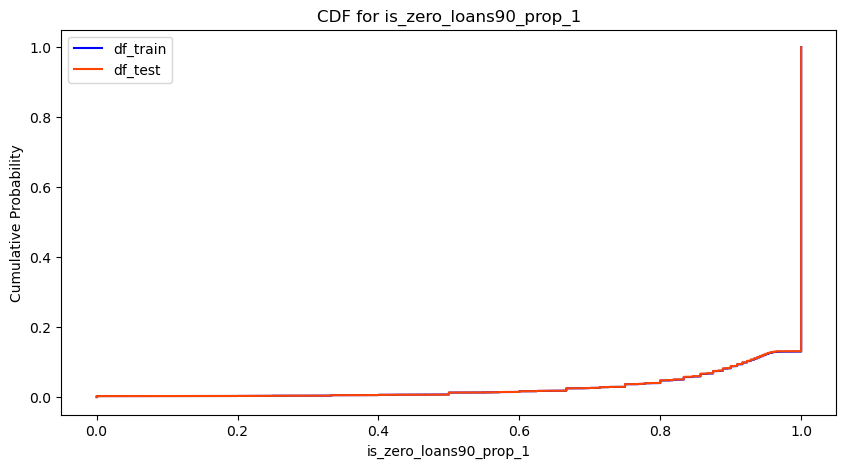

...

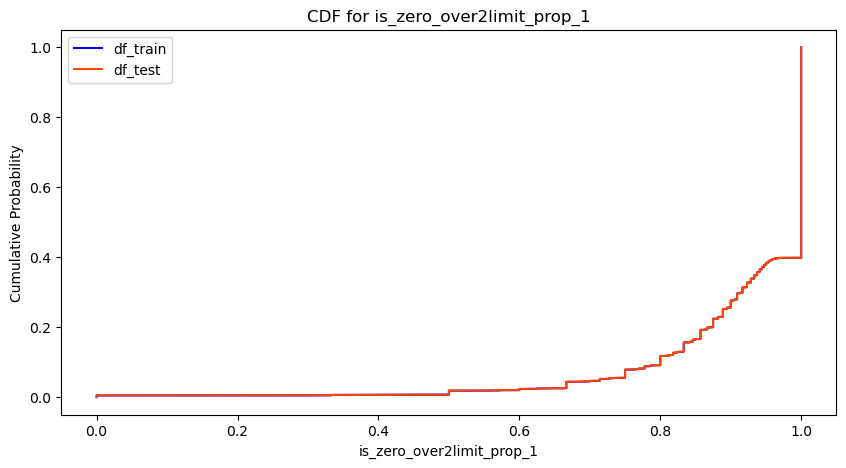

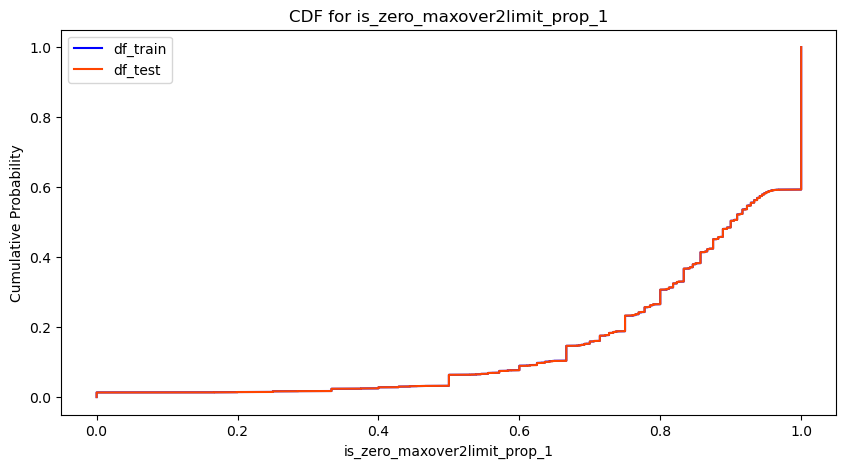

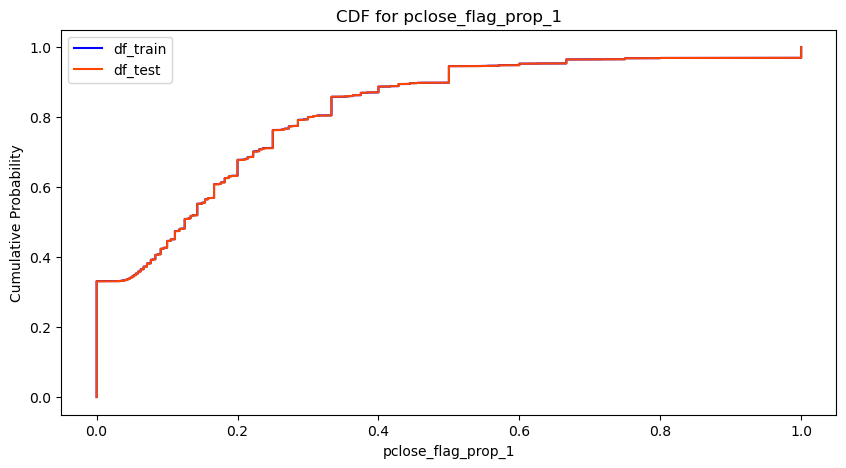

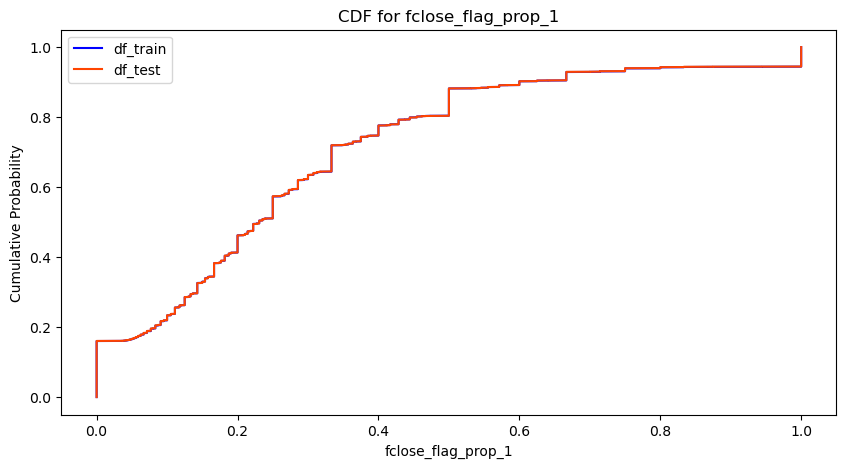

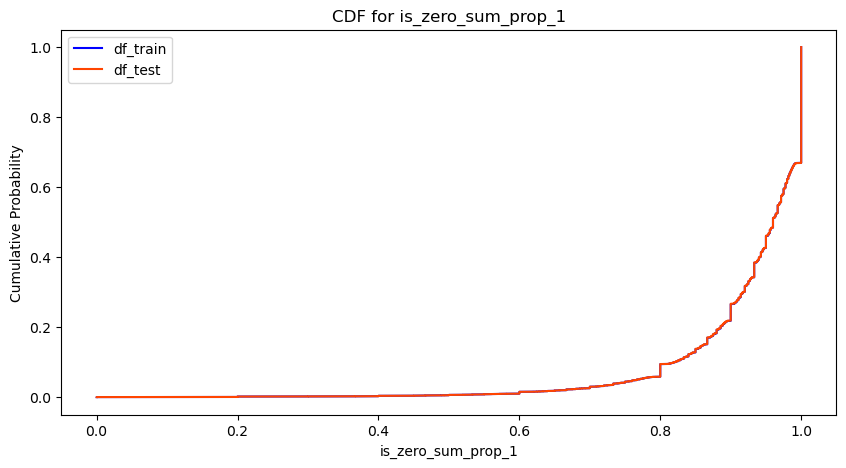

In [191]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-11:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Формы распределения практически совпадают.

In [192]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7779
ROC AUC на валидации: 0.7568
ROC AUC на тесте: 0.7556
Фолд 1
ROC AUC на трейне: 0.7747
ROC AUC на валидации: 0.7534
ROC AUC на тесте: 0.7551
Фолд 2
ROC AUC на трейне: 0.7710
ROC AUC на валидации: 0.7519
ROC AUC на тесте: 0.7546
Фолд 3
ROC AUC на трейне: 0.7803
ROC AUC на валидации: 0.7539
ROC AUC на тесте: 0.7548
Фолд 4
ROC AUC на трейне: 0.7722
ROC AUC на валидации: 0.7516
ROC AUC на тесте: 0.7546
Среднее ROC AUC на трейне: 0.7752 ± 0.0035
Среднее ROC AUC на валидации: 0.7535 ± 0.0019
Среднее ROC AUC на тесте: 0.7549 ± 0.0004


In [193]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246
8,flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.775219,0.003499,0.753511,0.001877,0.754948,0.000369


In [194]:
# Посмотрим на важности фичей
importances_dict

{'is_zero_sum_prop_1': 7.881182223529712,
 'pre_util_prop_3': 5.303348654474881,
 'enc_paym_avg_0_1_this_year_diff': 4.628269472827802,
 'enc_loans_credit_type_prop_0': 3.9001088357193123,
 'pre_till_pclose_prop_10': 3.7472366650486904,
 'pre_util_prop_6': 3.161300217402409,
 'pre_loans_outstanding_prop_1': 2.6471537898682804,
 'rn_max': 2.3127469198388915,
 'pre_loans_credit_limit_prop_2': 2.207907614561619,
 'pre_loans_outstanding_prop_5': 1.81418404471993,
 'pre_util_prop_16': 1.7841172678456183,
 'pre_loans_credit_cost_rate_prop_6': 1.7454540674087011,
 'pre_loans_credit_cost_rate_prop_11': 1.713414961513915,
 'pre_loans_credit_cost_rate_prop_4': 1.5698971933913812,
 'pre_loans_credit_limit_mean_freq': 1.4961909565507936,
 'enc_paym_avg_0_1_all_diff': 1.447376016365233,
 'pre_util_mean_freq': 1.4035166979023779,
 'pre_since_opened_mean_freq': 1.214217189909756,
 'enc_loans_credit_type_mean_freq': 1.2133817846572863,
 'pre_loans_next_pay_summ_prop_5': 1.1326429236621272,
 'pre_loans

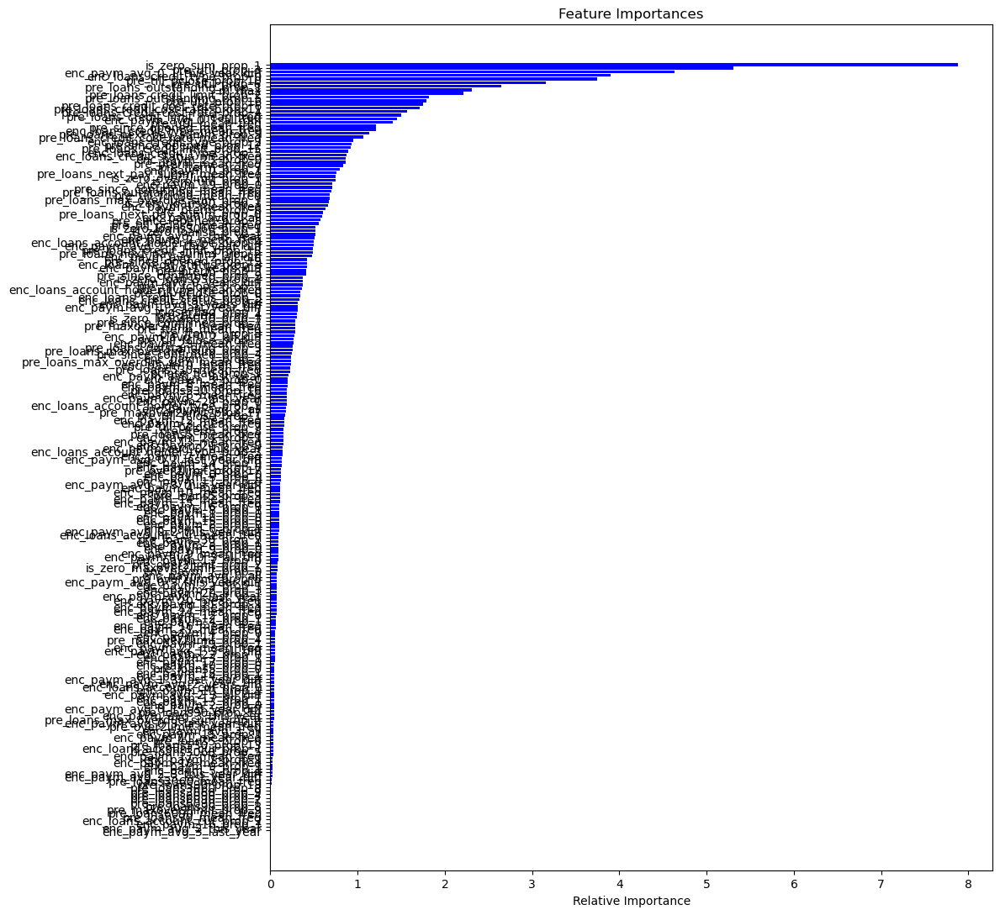

In [195]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

## Custom features

In [196]:
source_df_train = pd.read_csv('../prepared_data/source_data_train_1.csv')
source_df_test = pd.read_csv('../prepared_data/source_data_test_1.csv')
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [197]:
df_train = pd.read_csv('../prepared_data/flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 215), (600000, 215))

Создам признак количества одинаковых значений признака pre_since_opened, как признак закредитованности.
Одинаковые значения признака должны указывать что кредиты брались примерно в одно и то же время.
И пронормирую его на количество кредитов.

In [198]:
df_train = from_pre_since_opened_create_pre_since_opened_sum_mean_repeated(
    source_df_train,
    df_train
)
df_test = from_pre_since_opened_create_pre_since_opened_sum_mean_repeated(
    source_df_test,
    df_test
)
df_train.shape, df_test.shape

((2400000, 216), (600000, 216))

In [199]:
#  Посмотрим на количество уникальных значений нового признака
df_train.pre_since_opened_repeated_prop.nunique()

380

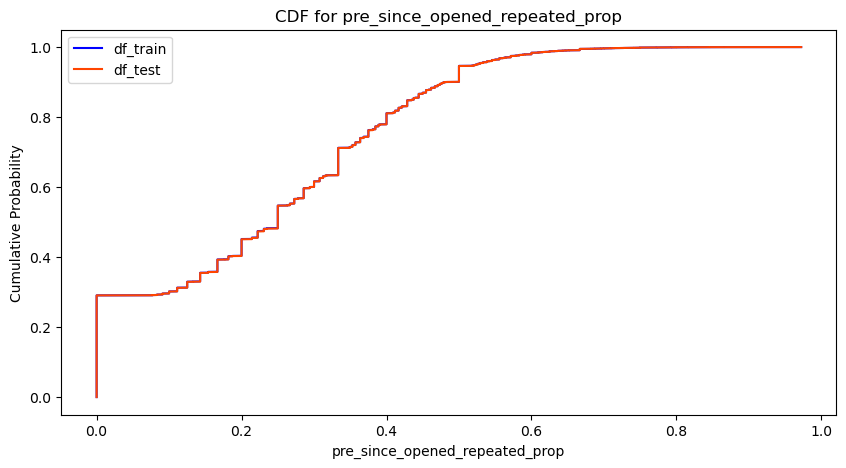

In [200]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-1:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Формы распределения практически совпадают.

In [201]:
df_train = from_pre_term_till_mean_freq_create_diff_features(df_train)
df_test = from_pre_term_till_mean_freq_create_diff_features(df_test)
df_train.shape, df_test.shape

((2400000, 218), (600000, 218))

In [202]:
#  Посмотрим на количество уникальных значений нового признака
df_train.pre_fterm_pterm_mean_freq_diff.nunique()

1798316

In [203]:
#  Посмотрим на количество уникальных значений нового признака
df_train.pre_till_fclose_pclose_mean_freq_diff.nunique()

1720818

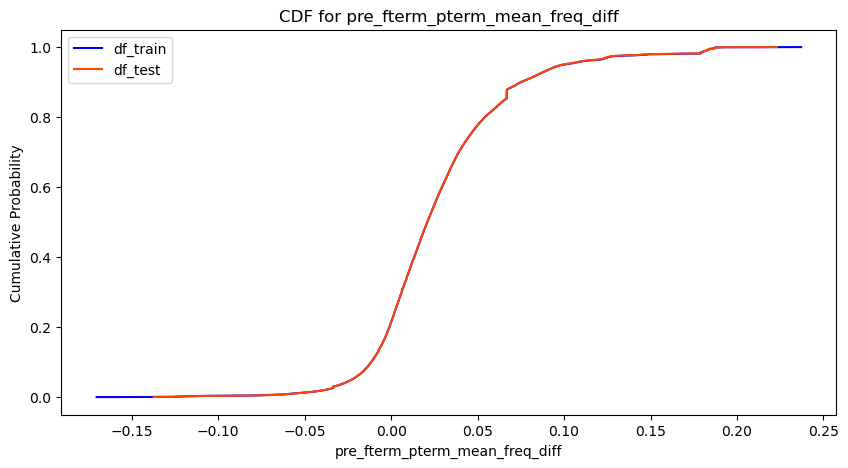

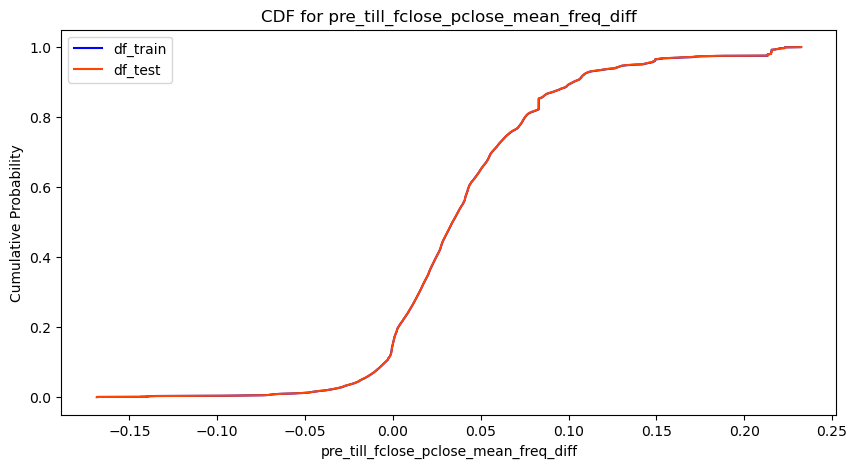

In [204]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-2:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], 'df_train', 'blue'),
        (df_test[col], 'df_test', 'orangered')
    ]:  
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения 
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
        
        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)
        
    plt.title(f'CDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

Формы распределения практически совпадают.

In [205]:
# Запишем промежуточные результаты в файлы
df_train.to_csv('../prepared_data/cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv', index=False)
df_test.to_csv('../prepared_data/cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 218), (600000, 218))

In [206]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn'
)

Фолд 0
ROC AUC на трейне: 0.7803
ROC AUC на валидации: 0.7562
ROC AUC на тесте: 0.7543
Фолд 1
ROC AUC на трейне: 0.7765
ROC AUC на валидации: 0.7536
ROC AUC на тесте: 0.7547
Фолд 2
ROC AUC на трейне: 0.7731
ROC AUC на валидации: 0.7523
ROC AUC на тесте: 0.7551
Фолд 3
ROC AUC на трейне: 0.7820
ROC AUC на валидации: 0.7529
ROC AUC на тесте: 0.7544
Фолд 4
ROC AUC на трейне: 0.7746
ROC AUC на валидации: 0.7519
ROC AUC на тесте: 0.7554
Среднее ROC AUC на трейне: 0.7773 ± 0.0034
Среднее ROC AUC на валидации: 0.7534 ± 0.0015
Среднее ROC AUC на тесте: 0.7548 ± 0.0004


In [207]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246
8,flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.775219,0.003499,0.753511,0.001877,0.754948,0.000369
9,cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.777299,0.003380,0.753371,0.001517,0.754799,0.000422


In [208]:
# Посмотрим на важности фичей
importances_dict

{'is_zero_sum_prop_1': 7.364457469561486,
 'enc_paym_avg_0_1_this_year_diff': 5.781582284851507,
 'pre_util_prop_3': 4.819124585838127,
 'enc_loans_credit_type_prop_0': 3.981744268477956,
 'pre_till_pclose_prop_10': 3.373294535447774,
 'pre_util_prop_6': 3.1396406579802565,
 'pre_loans_outstanding_prop_1': 2.5908373326181846,
 'pre_util_mean_freq': 2.312329218760038,
 'rn_max': 2.2432991845940857,
 'pre_loans_credit_limit_prop_2': 1.940382981444204,
 'pre_loans_credit_cost_rate_prop_6': 1.8466736793062692,
 'pre_loans_outstanding_prop_5': 1.7993715656231364,
 'pre_loans_credit_cost_rate_prop_11': 1.7639238770673626,
 'pre_loans_credit_cost_rate_prop_4': 1.5541752200208832,
 'pre_loans_credit_limit_mean_freq': 1.5100429057829998,
 'pre_since_opened_mean_freq': 1.2594465655777753,
 'pre_loans_credit_cost_rate_mean_freq': 1.2239969687437118,
 'enc_paym_avg_0_1_all_diff': 1.1945057516829136,
 'enc_paym_avg_1_all': 1.0970834584299256,
 'enc_loans_credit_type_mean_freq': 1.0555604039503503,


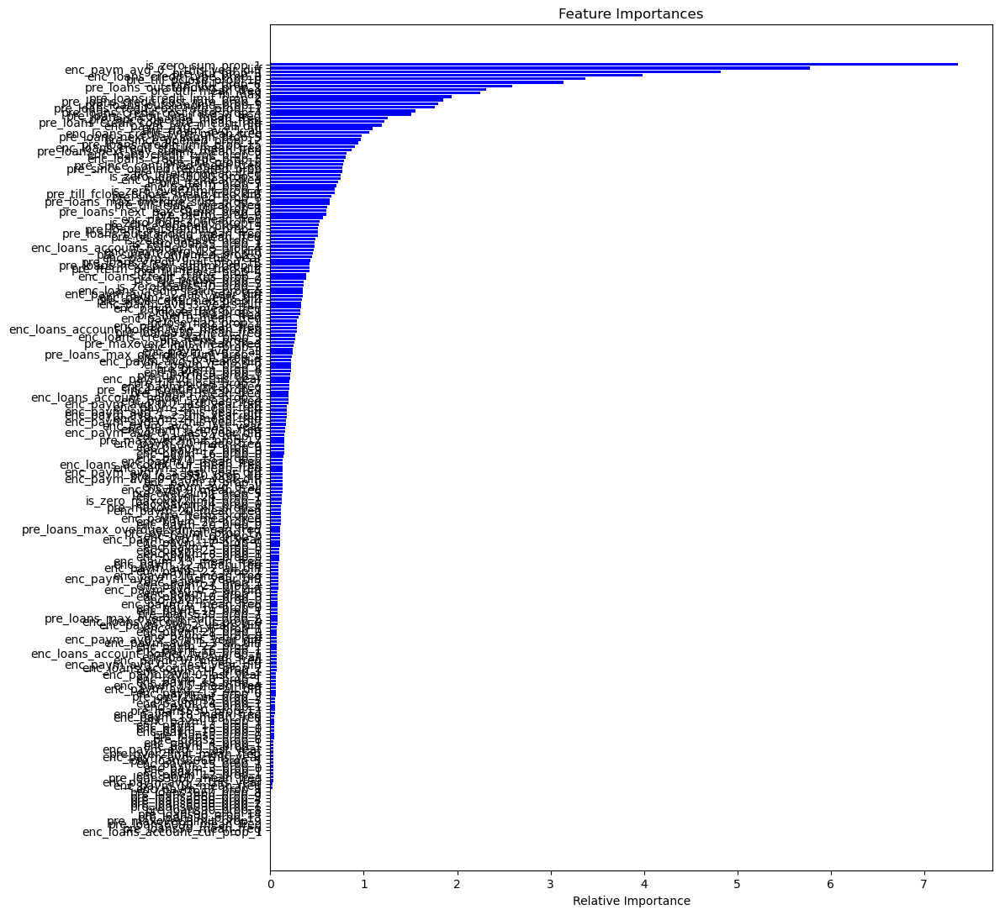

In [209]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

In [210]:
# Сохраним словарь важностей фичей в отдельную переменную
all_features_importances_dict = importances_dict

# Trimming features by importance

In [211]:
df_train = pd.read_csv('../prepared_data/cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv')
df_test = pd.read_csv('../prepared_data/cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv')
df_train.shape, df_test.shape

((2400000, 218), (600000, 218))

In [212]:
# Отберем из словаря важности признаков признаки дающие прирост качества > 0.1
filtered_importances_dict = {k: v for k, v in all_features_importances_dict.items() if v > 0.1}
len(filtered_importances_dict)

136

In [213]:
# Создадим новый список фичей
new_features_list = [x for x in filtered_importances_dict.keys()]
len(new_features_list)

136

In [214]:
df_train = df_train[['id', 'flag'] + new_features_list]
df_test = df_test[['id', 'flag'] + new_features_list]
df_train.shape, df_test.shape

((2400000, 138), (600000, 138))

In [215]:
# Запишем промежуточный результат в файл
df_train.to_csv('../prepared_data/cut_imp_train.csv', index=False)
df_test.to_csv('../prepared_data/cut_imp_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 138), (600000, 138))

In [216]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'cut_imp'
)

Фолд 0
ROC AUC на трейне: 0.7773
ROC AUC на валидации: 0.7570
ROC AUC на тесте: 0.7550
Фолд 1
ROC AUC на трейне: 0.7803
ROC AUC на валидации: 0.7540
ROC AUC на тесте: 0.7552
Фолд 2
ROC AUC на трейне: 0.7766
ROC AUC на валидации: 0.7518
ROC AUC на тесте: 0.7550
Фолд 3
ROC AUC на трейне: 0.7816
ROC AUC на валидации: 0.7542
ROC AUC на тесте: 0.7560
Фолд 4
ROC AUC на трейне: 0.7736
ROC AUC на валидации: 0.7521
ROC AUC на тесте: 0.7554
Среднее ROC AUC на трейне: 0.7779 ± 0.0028
Среднее ROC AUC на валидации: 0.7538 ± 0.0018
Среднее ROC AUC на тесте: 0.7553 ± 0.0004


In [217]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246
8,flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.775219,0.003499,0.753511,0.001877,0.754948,0.000369
9,cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.777299,0.003380,0.753371,0.001517,0.754799,0.000422


In [218]:
# Посмотрим на важности фичей
importances_dict

{'is_zero_sum_prop_1': 7.002073504934776,
 'pre_util_prop_3': 4.856695840973746,
 'enc_loans_credit_type_prop_0': 4.15256217551908,
 'enc_paym_avg_0_1_this_year_diff': 4.124247687621228,
 'pre_till_pclose_prop_10': 3.5537702805862965,
 'pre_util_prop_6': 3.0621018094197856,
 'pre_loans_outstanding_prop_1': 2.723633917588994,
 'pre_loans_credit_limit_prop_2': 2.145733628327441,
 'rn_max': 2.1231322505933723,
 'pre_util_mean_freq': 1.980183812453113,
 'enc_paym_avg_0_1_all_diff': 1.9706008065708764,
 'pre_loans_outstanding_prop_5': 1.8542347011262732,
 'pre_loans_credit_cost_rate_prop_11': 1.7867399673681603,
 'pre_loans_credit_cost_rate_prop_4': 1.724367962051071,
 'pre_loans_credit_limit_mean_freq': 1.681589798546487,
 'pre_loans_credit_cost_rate_prop_6': 1.6208605489563628,
 'pre_since_opened_mean_freq': 1.5178892238830768,
 'enc_loans_credit_type_mean_freq': 1.2421706484017683,
 'enc_paym_avg_1_2_all_diff': 1.167448899923196,
 'pre_loans_next_pay_summ_prop_5': 1.1585987506033433,
 'p

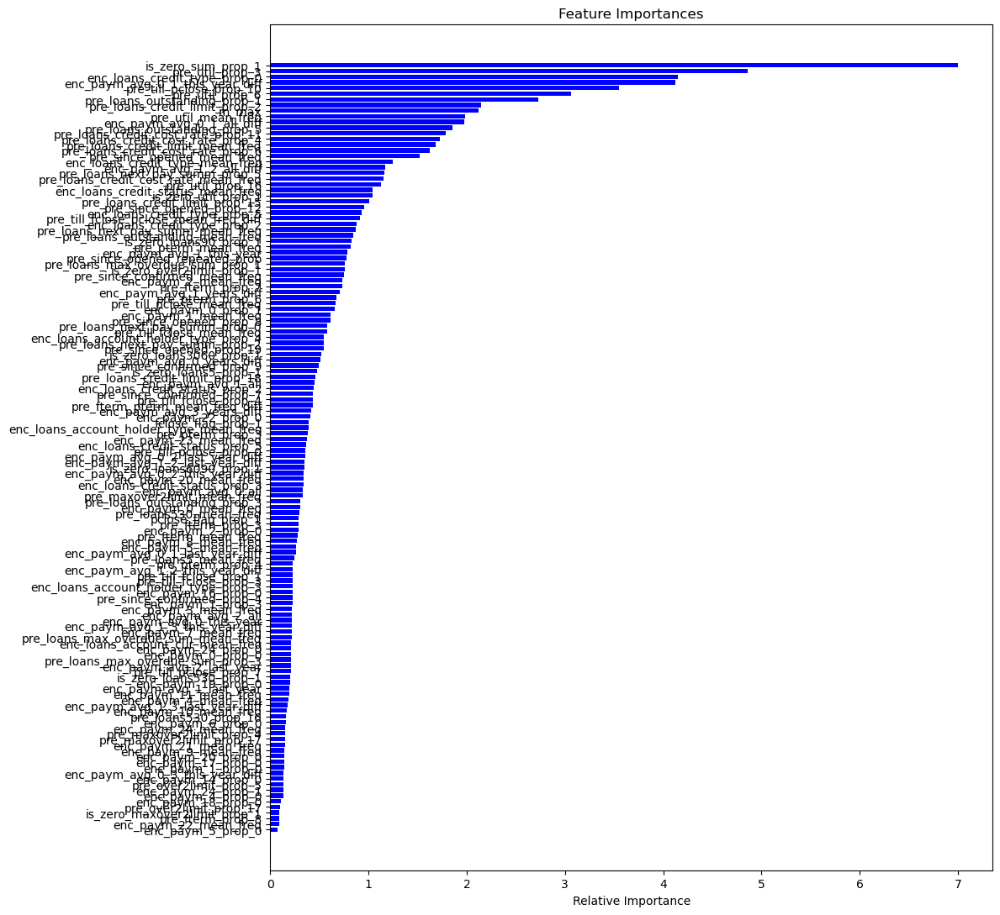

In [219]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

In [220]:
# Сохраним словарь важностей в отдельную переменную
cut_imp_dict = importances_dict

# Trimming collinear features

Мультиколениарность не должна мешать работе алгоритма градиентного бустинга,   
но для уменьшения размерности датасета, ускорения обучения и более ясной     
интерпритируемости признаков удалю колениарные признаки из датасета.

In [221]:
df_train = pd.read_csv('../prepared_data/cut_imp_train.csv')
df_test = pd.read_csv('../prepared_data/cut_imp_test.csv')
df_train.shape, df_test.shape

((2400000, 138), (600000, 138))

In [222]:
df_corr = df_train.corr()
df_corr

,id,flag,is_zero_sum_prop_1,enc_paym_avg_0_1_this_year_diff,pre_util_prop_3,enc_loans_credit_type_prop_0,pre_till_pclose_prop_10,pre_util_prop_6,pre_loans_outstanding_prop_1,pre_util_mean_freq,rn_max,pre_loans_credit_limit_prop_2,pre_loans_credit_cost_rate_prop_6,pre_loans_outstanding_prop_5,pre_loans_credit_cost_rate_prop_11,pre_loans_credit_cost_rate_prop_4,pre_loans_credit_limit_mean_freq,pre_since_opened_mean_freq,pre_loans_credit_cost_rate_mean_freq,enc_paym_avg_0_1_all_diff,enc_paym_avg_1_all,enc_loans_credit_type_mean_freq,pre_loans_next_pay_summ_prop_5,pre_since_opened_prop_12,pre_loans_credit_limit_prop_15,enc_loans_credit_status_mean_freq,pre_loans_next_pay_summ_mean_freq,enc_loans_credit_type_prop_2,enc_loans_credit_type_prop_5,pre_util_prop_16,pre_since_confirmed_mean_freq,pre_since_opened_repeated_prop,pre_pterm_mean_freq,is_zero_loans6090_prop_1,enc_paym_1_mean_freq,pre_fterm_prop_7,enc_paym_0_prop_1,is_zero_over2limit_prop_1,pre_till_fclose_pclose_mean_freq_diff,pre_since_opened_prop_8,pre_loans_max_overdue_sum_prop_1,pre_till_fclose_mean_freq,is_zero_util_prop_1,pre_loans_next_pay_summ_prop_0,pre_pterm_prop_6,enc_paym_2_mean_freq,is_zero_loans3060_prop_1,pre_since_opened_prop_19,pre_loans_outstanding_prop_3,pre_loans_outstanding_mean_freq,pre_till_pclose_mean_freq,is_zero_loans90_prop_1,is_zero_loans5_prop_1,enc_loans_account_holder_type_prop_4,enc_paym_avg_1_2_all_diff,pre_since_confirmed_prop_9,enc_paym_avg_1_this_year,pre_loans_credit_limit_prop_18,pre_loans_next_pay_summ_prop_2,pre_fterm_pterm_mean_freq_diff,pre_till_fclose_prop_4,enc_loans_credit_status_prop_2,pre_till_pclose_prop_0,pre_pterm_prop_3,is_zero_loans530_prop_1,enc_loans_credit_status_prop_5,enc_paym_avg_1_2_last_year_diff,enc_paym_avg_1_years_diff,pre_since_confirmed_prop_4,enc_paym_avg_3_years_diff,enc_paym_23_mean_freq,fclose_flag_prop_1,pre_fterm_mean_freq,enc_paym_0_mean_freq,pclose_flag_prop_1,enc_paym_21_mean_freq,enc_loans_account_holder_type_mean_freq,pre_loans530_mean_freq,enc_loans_credit_status_prop_3,pre_fterm_prop_3,pre_maxover2limit_mean_freq,enc_paym_1_prop_3,enc_paym_avg_2_all,pre_loans_max_overdue_sum_prop_3,pre_till_fclose_prop_3,enc_paym_avg_0_years_diff,enc_paym_1_prop_0,pre_pterm_prop_4,enc_paym_4_prop_0,pre_till_fclose_prop_1,enc_paym_avg_0_this_year,pre_till_pclose_prop_7,enc_paym_8_mean_freq,pre_since_confirmed_prop_7,pre_loans5_mean_freq,enc_loans_account_holder_type_prop_3,enc_paym_5_mean_freq,enc_paym_avg_0_2_last_year_diff,enc_paym_22_mean_freq,enc_paym_avg_1_3_this_year_diff,enc_paym_avg_1_2_this_year_diff,enc_paym_24_mean_freq,enc_paym_avg_0_3_this_year_diff,enc_paym_avg_2_last_year,enc_paym_3_mean_freq,enc_paym_avg_0_1_last_year_diff,enc_paym_24_prop_0,pre_maxover2limit_prop_17,enc_paym_10_mean_freq,enc_paym_19_prop_0,enc_paym_2_prop_0,enc_paym_16_prop_0,enc_paym_18_prop_0,enc_paym_4_mean_freq,enc_loans_account_cur_mean_freq,enc_paym_11_mean_freq,enc_paym_avg_1_3_last_year_diff,pre_loans530_prop_16,enc_paym_avg_0_2_this_year_diff,enc_paym_0_prop_0,enc_paym_avg_0_all,enc_paym_9_mean_freq,pre_over2limit_prop_5,enc_paym_24_prop_1,is_zero_maxover2limit_prop_1,enc_paym_14_prop_0,pre_maxover2limit_prop_4,enc_paym_20_mean_freq,pre_fterm_prop_8,enc_paym_7_mean_freq,enc_paym_22_prop_0,enc_paym_20_prop_0,pre_loans_max_overdue_sum_mean_freq,pre_over2limit_prop_17,enc_paym_6_prop_0,enc_paym_avg_1_last_year,enc_paym_17_prop_0,enc_paym_5_prop_0
id,1.000000,-0.000153,-0.003917,0.055588,-0.001318,0.048148,0.022418,-0.008304,0.043305,-0.003542,0.074200,0.040603,0.011408,0.005502,0.078538,-0.067281,0.034167,-0.098458,-0.017849,0.049711,-0.018438,0.043740,0.027044,-0.019659,0.027264,-0.004788,0.096294,-0.010052,0.030783,-0.005668,-0.058542,0.041674,-0.024507,-0.027439,0.027193,0.039702,-0.046847,-0.059823,0.000037,-0.072876,-0.056188,-0.028132,-0.007938,-0.019799,0.053119,0.024190,-0.017037,-0.013177,0.012923,0.012982,-0.051515,-0.026688,0.039859,0.010315,-0.020004,-0.057000,-0.024170,-0.002396,0.096141,-0.015693,0.036591,0.000188,

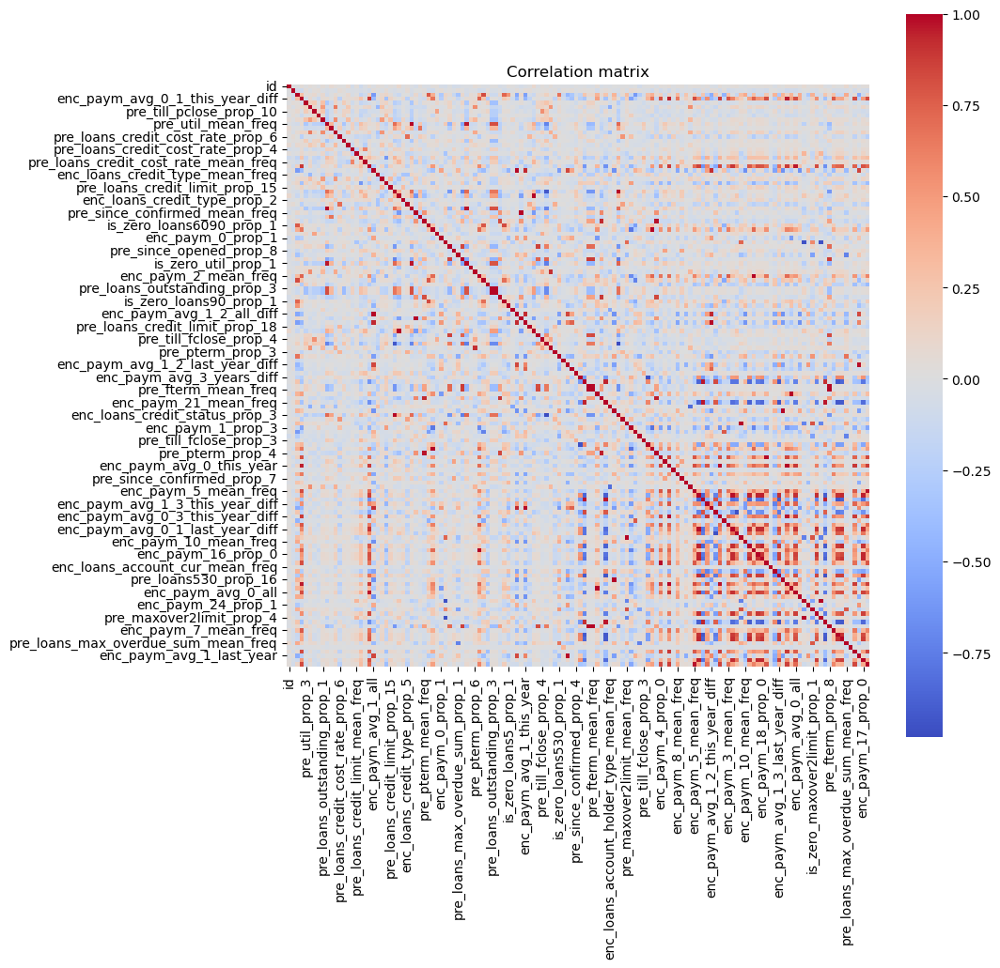

In [223]:
# Визуализация корреляционной матрицы
plt.figure(figsize=(10, 10))
sns.heatmap(df_corr,  fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation matrix')
plt.show()

In [224]:
# Собираем словарь признаков с высокой корреляцией
mult_dict = {}

for col in df_corr.columns:
    mult_dict[col] = []
    for i, val in enumerate(df_corr[col]):
        # Если у признаков высокая корреляция (модуль значения > 0.7), но не 1 (не с самим собой)
        if (abs(val) > 0.7) and (abs(val) != 1):
            # Добавляем название коррелирующего признака в словарь
            mult_dict[col].append(df_corr.index[i])

# Оставляем только признаки, у которых есть коррелирующие с ними признаки
mult_dict = {k: v for k, v in mult_dict.items() if len(v) > 0}

print('Number of features with high correlation', len(mult_dict))
mult_dict


Number of features with high correlation 92


{'is_zero_sum_prop_1': ['is_zero_loans6090_prop_1',
  'is_zero_loans3060_prop_1',
  'is_zero_loans90_prop_1'],
 'enc_paym_avg_0_1_this_year_diff': ['enc_paym_avg_0_1_all_diff',
  'enc_paym_2_mean_freq',
  'enc_paym_4_prop_0',
  'enc_paym_avg_0_this_year',
  'enc_paym_5_mean_freq',
  'enc_paym_avg_0_3_this_year_diff',
  'enc_paym_3_mean_freq',
  'enc_paym_2_prop_0',
  'enc_paym_4_mean_freq',
  'enc_paym_avg_0_2_this_year_diff',
  'enc_paym_avg_0_all',
  'enc_paym_7_mean_freq',
  'enc_paym_6_prop_0',
  'enc_paym_5_prop_0'],
 'pre_util_mean_freq': ['pre_util_prop_16',
  'is_zero_util_prop_1',
  'pre_loans_outstanding_prop_3',
  'pre_loans_outstanding_mean_freq',
  'enc_loans_credit_status_prop_2',
  'enc_loans_credit_status_prop_3'],
 'pre_loans_credit_cost_rate_prop_6': ['enc_loans_credit_type_prop_5'],
 'enc_paym_avg_0_1_all_diff': ['enc_paym_avg_0_1_this_year_diff',
  'enc_paym_avg_0_this_year',
  'enc_paym_5_mean_freq',
  'enc_paym_avg_0_2_last_year_diff',
  'enc_paym_avg_0_3_this_yea

In [225]:
"""
Из словаря корелирующих признаков сделаем список в котором останется 
только одно значение из каждого ключа(ключ или значение) которое 
дает наибольший прирост качества согласно cut_imp_dict
"""
del_list = []

for key, values in mult_dict.items():
    corr_list = [key] + values
    
    # Считаем важности для всех признаков из corr_list
    imps = [cut_imp_dict[col] for col in corr_list]
    
    # Находим индекс максимального значения важности
    max_idx = imps.index(max(imps))
    
    # Добавляем в de_list все элементы кроме максимального
    for i, col in enumerate(corr_list):
        if i != max_idx:
            del_list.append(col)

# Удаляем дубликаты из списка
del_list = list(set(del_list))

print('Length of the list to delete', len(del_list))
del_list

Length of the list to delete 77


['enc_loans_credit_status_prop_3',
 'pre_loans_next_pay_summ_prop_2',
 'enc_paym_22_prop_0',
 'enc_paym_avg_0_2_this_year_diff',
 'enc_paym_avg_0_1_all_diff',
 'pre_pterm_prop_4',
 'pre_till_fclose_mean_freq',
 'enc_paym_avg_3_years_diff',
 'enc_paym_avg_1_last_year',
 'enc_paym_22_mean_freq',
 'enc_paym_avg_0_1_last_year_diff',
 'pre_till_fclose_pclose_mean_freq_diff',
 'enc_paym_avg_1_this_year',
 'pclose_flag_prop_1',
 'enc_paym_avg_0_this_year',
 'pre_loans530_prop_16',
 'pre_till_pclose_mean_freq',
 'enc_paym_5_prop_0',
 'pre_maxover2limit_mean_freq',
 'pre_fterm_mean_freq',
 'enc_paym_1_mean_freq',
 'pre_util_prop_16',
 'enc_paym_1_prop_0',
 'pre_over2limit_prop_5',
 'pre_maxover2limit_prop_17',
 'fclose_flag_prop_1',
 'enc_paym_avg_1_all',
 'enc_loans_credit_type_prop_5',
 'enc_paym_23_mean_freq',
 'enc_paym_avg_1_3_last_year_diff',
 'pre_loans_outstanding_prop_3',
 'is_zero_util_prop_1',
 'is_zero_loans3060_prop_1',
 'enc_paym_24_prop_0',
 'enc_paym_2_mean_freq',
 'enc_paym_2_p

In [226]:
# Удалим корелирующие фичи
df_train = df_train.drop(del_list, axis=1)
df_test = df_test.drop(del_list, axis=1)
df_train.shape, df_test.shape

((2400000, 61), (600000, 61))

In [227]:
# Запишем  результат в файл
df_train.to_csv('../prepared_data/cut_corr_imp_train.csv', index=False)
df_test.to_csv('../prepared_data/cut_corr_imp_test.csv', index=False)
df_train.shape, df_test.shape

((2400000, 61), (600000, 61))

In [228]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict =  check_cat_boost(
    df_train,
    df_test,
    'cut_corr_imp'
)

Фолд 0
ROC AUC на трейне: 0.7734
ROC AUC на валидации: 0.7552
ROC AUC на тесте: 0.7540
Фолд 1
ROC AUC на трейне: 0.7688
ROC AUC на валидации: 0.7529
ROC AUC на тесте: 0.7539
Фолд 2
ROC AUC на трейне: 0.7710
ROC AUC на валидации: 0.7507
ROC AUC на тесте: 0.7541
Фолд 3
ROC AUC на трейне: 0.7719
ROC AUC на валидации: 0.7525
ROC AUC на тесте: 0.7539
Фолд 4
ROC AUC на трейне: 0.7755
ROC AUC на валидации: 0.7504
ROC AUC на тесте: 0.7534
Среднее ROC AUC на трейне: 0.7721 ± 0.0022
Среднее ROC AUC на валидации: 0.7524 ± 0.0017
Среднее ROC AUC на тесте: 0.7539 ± 0.0002


In [229]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv('../prepared_data/df_metrics.csv')
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv('../prepared_data/df_metrics.csv', index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246
8,flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.775219,0.003499,0.753511,0.001877,0.754948,0.000369
9,cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.777299,0.003380,0.753371,0.001517,0.754799,0.000422


Несмотря на снижение AUC на валидации на 0.00146, считаю это приемлемой ценой за   
существенное уменьшение размерности датасета — с 138 до 61 признака.    
Такая оптимизация упрощает модель,    
ускоряет обучение и повышает интерпретируемость без значительной потери качества.

In [230]:
# Посмотрим на важности фичей
importances_dict

{'enc_paym_avg_0_1_this_year_diff': 10.541363842103316,
 'is_zero_sum_prop_1': 9.721407971060769,
 'pre_util_prop_3': 5.302670343632289,
 'pre_util_mean_freq': 5.016371592101838,
 'enc_loans_credit_type_prop_0': 4.576182481339506,
 'pre_till_pclose_prop_10': 3.7956473580836967,
 'pre_util_prop_6': 3.2007070144306335,
 'rn_max': 3.1495609082700673,
 'pre_loans_outstanding_prop_1': 2.956403994793042,
 'pre_since_opened_mean_freq': 2.571951556175923,
 'enc_paym_avg_0_years_diff': 2.4721923396376413,
 'pre_loans_credit_cost_rate_prop_6': 2.2901062314794345,
 'pre_loans_credit_limit_prop_2': 2.178331120139408,
 'enc_paym_avg_1_2_all_diff': 2.144380249309474,
 'pre_loans_outstanding_prop_5': 2.050059191174736,
 'pre_loans_credit_cost_rate_prop_11': 2.0326961692570014,
 'pre_loans_credit_limit_mean_freq': 2.004317556985904,
 'pre_loans_credit_cost_rate_prop_4': 1.9438199292656737,
 'pre_loans_next_pay_summ_mean_freq': 1.672918257356083,
 'pre_loans_credit_cost_rate_mean_freq': 1.5428990438512

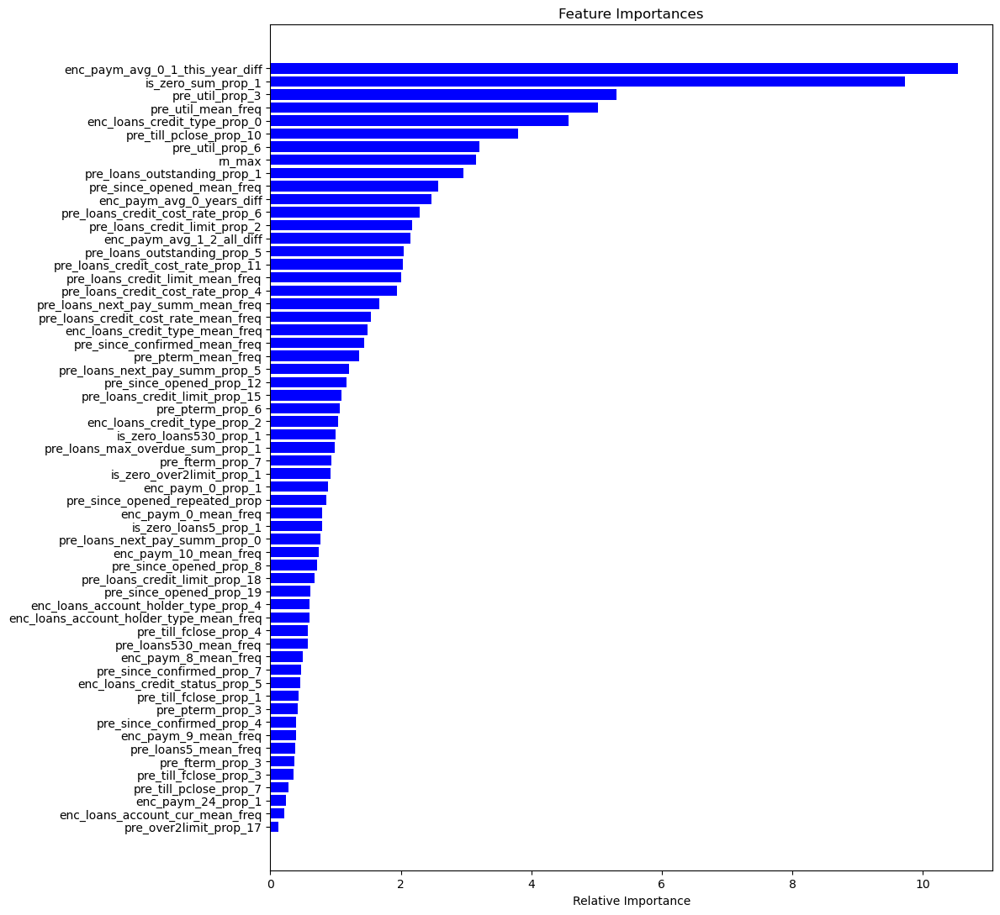

In [231]:
# Визуализируем важности фичей
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color='blue')
plt.xlabel('Relative Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() # Самый важный сверху
plt.tight_layout()
plt.show()

# Hyperparameter optimization with Optuna

## Aggressive scheme (Kaggle-style)

Выполним автоматизированный подбор гиперпараметров для CatBoostClassifier с помощью библиотеки Optuna.      
Тренировочный датасет разбивается на 5 фолдов.    
Для каждого фолда подбираются оптимальные гиперпараметры и на всех тренировочных    
данных обучается финальная модель.
Оценивается её AUC на валидационной и тестовой выборках.    

Для финального предсказания на тестовой выборке      
формируется  средневзвешенное предсказание ансамбля моделей:     
предсказания всех моделей усредняются через их AUC на валидационных выборках.     

In [233]:
df_train = pd.read_csv('../prepared_data/cut_corr_imp_train.csv')
df_test = pd.read_csv('../prepared_data/cut_corr_imp_test.csv')
df_train.shape, df_test.shape

((2400000, 61), (600000, 61))

In [234]:
X = df_train.drop(['id', 'flag'], axis=1)
y = df_train.flag
X.shape, y.shape

((2400000, 59), (2400000,))

In [235]:
X_test = df_test.drop(['id', 'flag'], axis=1)
y_test = df_test.flag
X_test.shape, y_test.shape

((600000, 59), (600000,))

In [236]:
X_train_list = []
y_train_list = []
X_val_list = []
y_val_list = []


# Инициализируем сбалансированное разделение на фолды 
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
# Итерируем по фолдам 
for i, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]    

    X_train_list.append(X_train) 
    y_train_list.append(y_train)
    X_val_list.append(X_val)
    y_val_list.append(y_val)
    
print(X_train_list[0].shape, y_train_list[0].shape)
print(X_val_list[0].shape, y_val_list[0].shape)

(1920000, 59) (1920000,)
(480000, 59) (480000,)


Функция catboost_optuna_aggressive имеет механизм сохранения результатов выполненных trials.   
При повторном запуске функции выполняется ровно столько новых trials,    
сколько указано в параметре n_trials, счёт пойдёт со следующего trials после    
failed trial(после прерывания) или N+1 при n_trials = N при удачном завершении первого запуска.       
Ускорение работы алгоритма достигается благодаря тому,       
что Optuna сохраняет данные о завершённых trials и может сразу после возобновления    
прерывать неперспективные trials с помощью pruning.   

In [ ]:
# Fold 0
model, val_auc  = catboost_optuna_aggressive(
    X_train_list[0],
    y_train_list[0],
    X_val_list[0],
    y_val_list[0],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    study_name = 'fold_0_aggressive'
)

Для ячеек поиска ГП  после их выполнения удалены выводы для снижения размера ноутбука и обеспечения   
возможности его просмотра в GitHub без использования дополнительных средств.   
Для наглядности представлены скриншоты частей вывода ячейки.   
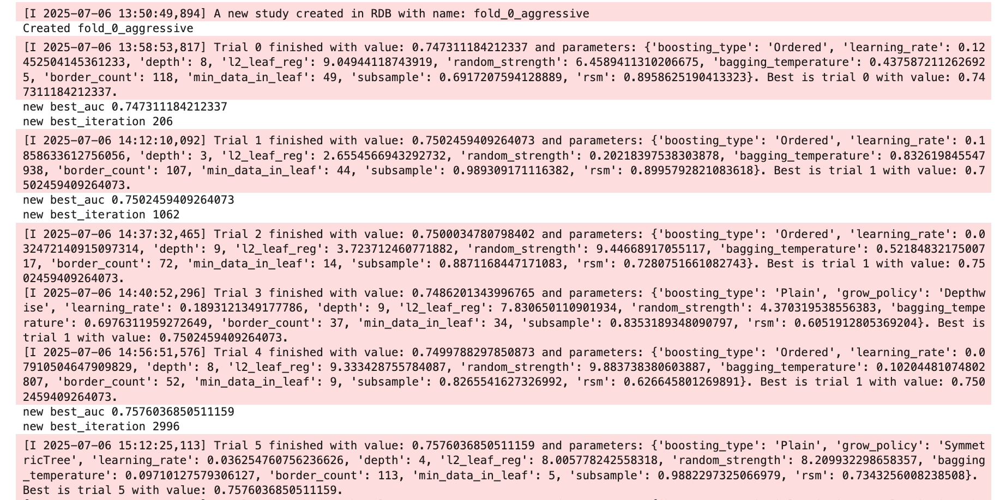
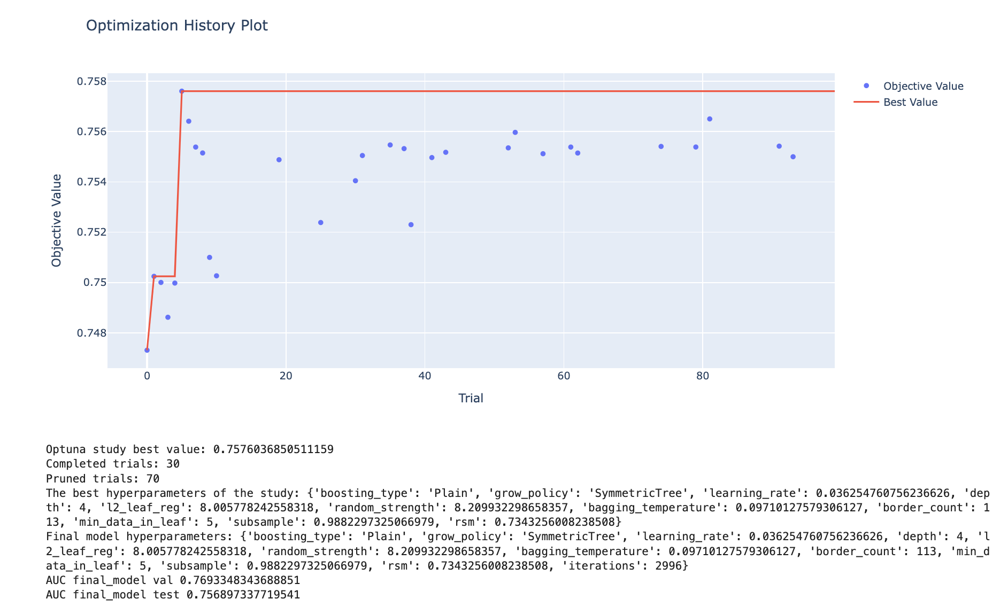

In [238]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_0_aggressive_model.bin')

In [ ]:
# Fold 1
model, val_auc  = catboost_optuna_aggressive(
    X_train_list[1],
    y_train_list[1],
    X_val_list[1],
    y_val_list[1],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    study_name = 'fold_1_aggressive'
)

In [240]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_1_aggressive_model.bin')

In [ ]:
# Fold 2
model, val_auc  = catboost_optuna_aggressive(
    X_train_list[2],
    y_train_list[2],
    X_val_list[2],
    y_val_list[2],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    study_name = 'fold_2_aggressive'
)

In [242]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_2_aggressive_model.bin')

In [ ]:
# Fold 3
model, val_auc  = catboost_optuna_aggressive(
    X_train_list[3],
    y_train_list[3],
    X_val_list[3],
    y_val_list[3],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    study_name = 'fold_3_aggressive'
)

In [244]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_3_aggressive_model.bin')

In [ ]:
# Fold 4
model, val_auc  = catboost_optuna_aggressive(
    X_train_list[4],
    y_train_list[4],
    X_val_list[4],
    y_val_list[4],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    study_name = 'fold_4_aggressive'
)

In [246]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_4_aggressive_model.bin')

In [247]:
# Собираем словарь с моделями
models_dict = {}
for i in range(5):
    model = CatBoostClassifier()
    model.load_model(f'../catboost_models/fold_{i}_aggressive_model.bin')
    models_dict[f'fold_{i}_aggressive_model'] = model

models_dict

{'fold_0_aggressive_model': <catboost.core.CatBoostClassifier at 0x151ee1940>,
 'fold_1_aggressive_model': <catboost.core.CatBoostClassifier at 0x151ee1d60>,
 'fold_2_aggressive_model': <catboost.core.CatBoostClassifier at 0x151ee0e60>,
 'fold_3_aggressive_model': <catboost.core.CatBoostClassifier at 0x151ee0f80>,
 'fold_4_aggressive_model': <catboost.core.CatBoostClassifier at 0x151ee0fb0>}

In [248]:
# Собираем список весов моделей - это их AUC на валидации
val_auc_list = []

for (model_name, value), X_val, y_val in zip(models_dict.items(), X_val_list, y_val_list):
    pred = value.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, pred)
    val_auc_list.append(auc)
    
val_auc_list

[0.7693348343688851,
 0.7675416890756452,
 0.7651370914585489,
 0.7661752867843185,
 0.7647998719911736]

In [249]:
"""
На тестовых данных обираем средневзвешенный по AUC предикт
на всех моделях фолдов и финальной моделе.
"""
df_pred = pd.DataFrame()

for (model_name, value), weight in zip(models_dict.items(), val_auc_list):
    # Получаем вероятности положительного класса
    pred = value.predict_proba(X_test)[:, 1]
    # Умножаем предсказания на вес модели
    df_pred[model_name] = pred * weight

# Суммируем веса всех моделей
weights_sum = sum(val_auc_list)
# Формируем итоговое взвешенное среднее
df_pred['ensemble_weighted_pred'] = df_pred.sum(axis=1) / weights_sum
# Получаем AUC ансамбля
auc = roc_auc_score(y_test, df_pred['ensemble_weighted_pred'])
print('AUC ensemble weighted test', auc)

AUC ensemble weighted test 0.7571983800960184


## Сonservative scheme

Выполним автоматизированный подбор гиперпараметров для CatBoostClassifier с помощью библиотеки Optuna.  
Финальная модель обучается только на тренировочных данных данного фолда (train-части).    
Тренировочный датасет разбивается на заданное количество фолдов.    
Для каждого фолда подбираются оптимальные гиперпараметры,    
обучается отдельная модель, и оценивается AUC на валидационной и тестовой выборках.    
После определяется лучший набор гиперпараметров по максимальному AUC на фолдах,    
и на всех обучающих данных обучается финальная модель с этими параметрами.    
Для финального предсказания на тестовой выборке      
формируется взвешенное среднее предсказание ансамбля моделей фолдов и     
модели обученной на всех данных:     
предсказания всех моделей усредняются весами это их AUC на валидационных выборках,    
а для модели обученной на всех данных вес модели это среднее AUC моделей фолдов.     

In [250]:
df_train = pd.read_csv('../prepared_data/cut_corr_imp_train.csv')
df_test = pd.read_csv('../prepared_data/cut_corr_imp_test.csv')
df_train.shape, df_test.shape

((2400000, 61), (600000, 61))

In [251]:
X = df_train.drop(['id', 'flag'], axis=1)
y = df_train.flag
X.shape, y.shape

((2400000, 59), (2400000,))

In [252]:
X_test = df_test.drop(['id', 'flag'], axis=1)
y_test = df_test.flag
X_test.shape, y_test.shape

((600000, 59), (600000,))

In [253]:
X_train_list = []
y_train_list = []
X_val_list = []
y_val_list = []


# Инициализируем сбалансированное разделение на фолды 
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
# Итерируем по фолдам 
for i, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]    

    X_train_list.append(X_train) 
    y_train_list.append(y_train)
    X_val_list.append(X_val)
    y_val_list.append(y_val)
    
X_train_list[0].shape, y_train_list[0].shape

((1920000, 59), (1920000,))

In [254]:
# Словарь гиперпараметров лучшего фолда
best_all_folds_params = {}

# Список метрик фолдов на валидации
val_auc_list = []

Функция catboost_optuna_hyperparameter_search имеет механизм сохранения результатов выполненных trials.   
При повторном запуске функции выполняется ровно столько новых trials,    
сколько указано в параметре n_trials, счёт пойдёт со следующего trials после    
failed trial(после прерывания) или N+1 при n_trials = N при удачном завершении первого запуска.       
Ускорение работы алгоритма достигается благодаря тому,       
что Optuna сохраняет данные о завершённых trials и может сразу после возобновления    
прерывать неперспективные trials с помощью pruning.   

In [ ]:
# Fold 0
model, val_auc  = catboost_optuna_conservative(
    X_train_list[0],
    y_train_list[0],
    X_val_list[0],
    y_val_list[0],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    study_name = 'fold_0_сonservative'
)

Для ячеек поиска ГП  после их выполнения удалены выводы для снижения размера ноутбука и обеспечения   
возможности его просмотра в GitHub без использования дополнительных средств.   
Для наглядности представлены скриншоты частей вывода ячейки.    
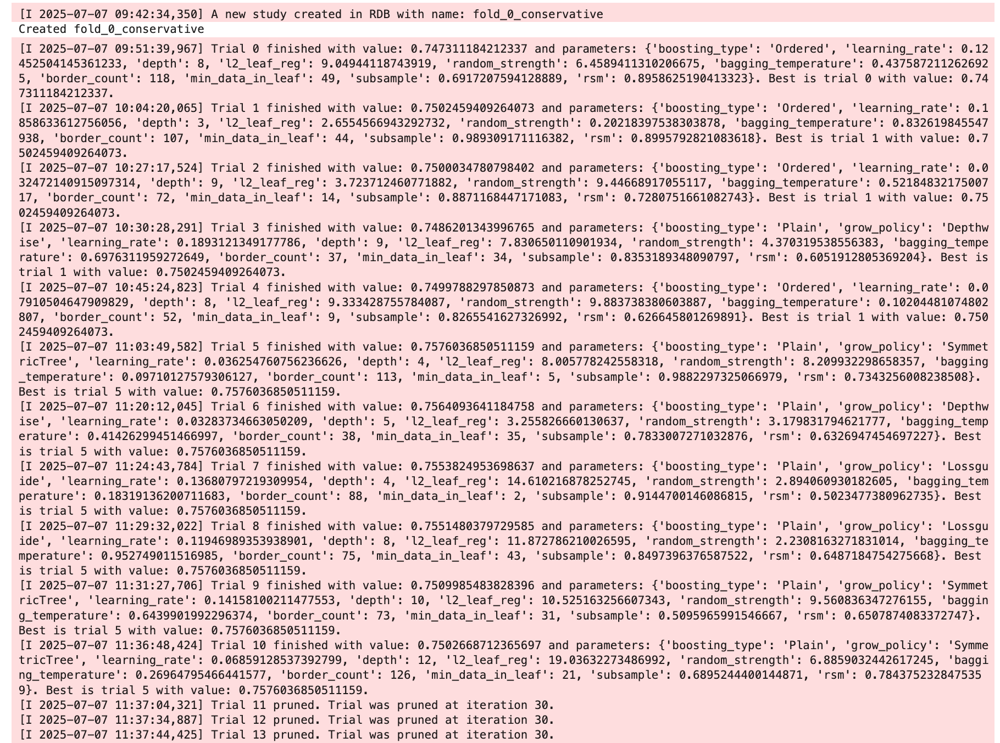  
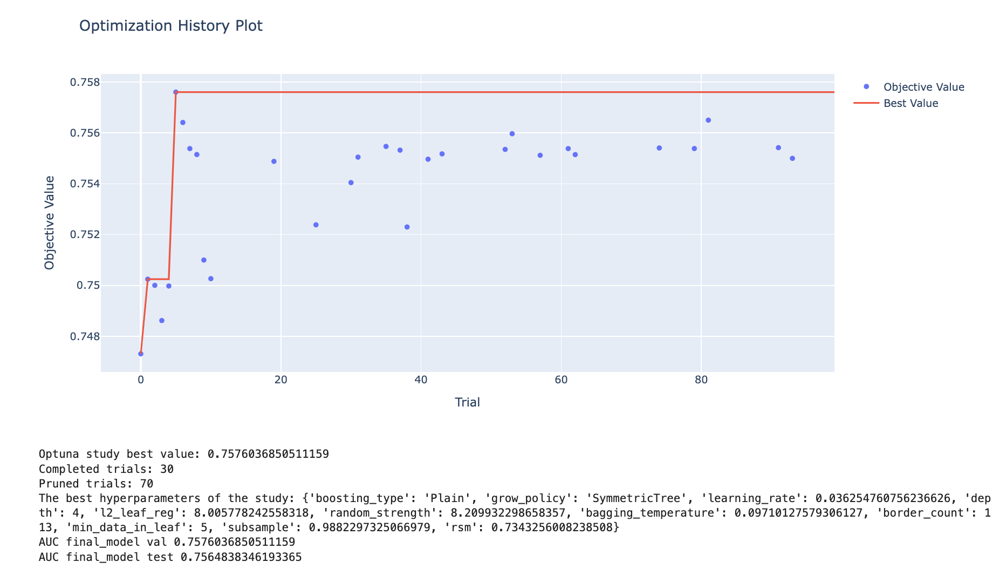

In [256]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_0_сonservative_model.bin')

In [257]:
# Добавляем метрику в список
val_auc_list.append(val_auc)

In [258]:
"""
Переписываем набор гиперпараметров 
для обучения модели на всех данных и добавляем в словарь количество итераций,
так как обучение будет проходить без валидационной выборки.
"""
best_all_folds_params = model.get_params()
best_all_folds_params['iterations'] = model.get_best_iteration()

print('New best_all_folds_params', best_all_folds_params)

New best_all_folds_params {'iterations': 2996, 'learning_rate': 0.036254760756236626, 'depth': 4, 'l2_leaf_reg': 8.005778242558318, 'rsm': 0.7343256008238508, 'border_count': 113, 'random_seed': 0, 'verbose': False, 'auto_class_weights': 'Balanced', 'random_strength': 8.209932298658357, 'eval_metric': 'AUC', 'bagging_temperature': 0.09710127579306127, 'boosting_type': 'Plain', 'subsample': 0.9882297325066979, 'early_stopping_rounds': 100, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 5}


In [259]:
# Сохраняем словарь с лучшими ГП и список метрик в файл
with open('../catboost_models/best_сonservative_params.pkl', 'wb') as f:
    pickle.dump({
        'best_all_folds_params': best_all_folds_params,
        'val_auc_list': val_auc_list
    }, f)

In [ ]:
# Fold 1
model, val_auc  = catboost_optuna_conservative(
    X_train_list[1],
    y_train_list[1],
    X_val_list[1],
    y_val_list[1],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    cat_features = [],
    study_name = 'fold_1_сonservative'
)

In [261]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_1_сonservative_model.bin')

In [262]:
# Загружаем состояние переменных из файла
with open('../catboost_models/best_сonservative_params.pkl', 'rb') as f:
    state = pickle.load(f)
    
best_all_folds_params = state['best_all_folds_params']
val_auc_list = state['val_auc_list']

In [263]:
"""
Если это лучшая AUC на валидации по фолдам то переписываем набор гиперпараметров 
для обучения модели на всех данных и добавляем в словарь количество итераций,
так как обучение будет проходить без валидационной выборки.
"""
if max(val_auc_list) < val_auc:
    best_all_folds_params = model.get_params()
    best_all_folds_params['iterations'] = model.get_best_iteration()
    
    print('New best_all_folds_params', best_all_folds_params)
else:
    print('No update. Current best_all_folds_params',  best_all_folds_params)

No update. Current best_all_folds_params {'iterations': 2996, 'learning_rate': 0.036254760756236626, 'depth': 4, 'l2_leaf_reg': 8.005778242558318, 'rsm': 0.7343256008238508, 'border_count': 113, 'random_seed': 0, 'verbose': False, 'auto_class_weights': 'Balanced', 'random_strength': 8.209932298658357, 'eval_metric': 'AUC', 'bagging_temperature': 0.09710127579306127, 'boosting_type': 'Plain', 'subsample': 0.9882297325066979, 'early_stopping_rounds': 100, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 5}


In [264]:
# Добавляем новую метрику в список
val_auc_list.append(val_auc)

In [265]:
# Сохраняем словарь с лучшими ГП и список метрик в файл
with open('../catboost_models/best_сonservative_params.pkl', 'wb') as f:
    pickle.dump({
        'best_all_folds_params': best_all_folds_params,
        'val_auc_list': val_auc_list
    }, f)

Для следующей ячейки после её выполнения удалён вывод для снижения размера ноутбука и обеспечения возможности его просмотра в GitHub без использования дополнительных средств.

In [ ]:
# Fold 2
model, val_auc  = catboost_optuna_conservative(
    X_train_list[2],
    y_train_list[2],
    X_val_list[2],
    y_val_list[2],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    cat_features = [],
    study_name = 'fold_2_сonservative'
)

In [267]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_2_сonservative_model.bin')

In [268]:
# Загружаем состояние переменных из файла
with open('../catboost_models/best_сonservative_params.pkl', 'rb') as f:
    state = pickle.load(f)
    
best_all_folds_params = state['best_all_folds_params']
val_auc_list = state['val_auc_list']

In [269]:
"""
Если это лучшая AUC на валидации по фолдам то переписываем набор гиперпараметров 
для обучения модели на всех данных и добавляем в словарь количество итераций,
так как обучение будет проходить без валидационной выборки.
"""
if max(val_auc_list) < val_auc:
    best_all_folds_params = model.get_params()
    best_all_folds_params['iterations'] = model.get_best_iteration()
    
    print('New best_all_folds_params', best_all_folds_params)
else:
    print('No update. Current best_all_folds_params',  best_all_folds_params)

No update. Current best_all_folds_params {'iterations': 2996, 'learning_rate': 0.036254760756236626, 'depth': 4, 'l2_leaf_reg': 8.005778242558318, 'rsm': 0.7343256008238508, 'border_count': 113, 'random_seed': 0, 'verbose': False, 'auto_class_weights': 'Balanced', 'random_strength': 8.209932298658357, 'eval_metric': 'AUC', 'bagging_temperature': 0.09710127579306127, 'boosting_type': 'Plain', 'subsample': 0.9882297325066979, 'early_stopping_rounds': 100, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 5}


In [270]:
# Добавляем новую метрику в список
val_auc_list.append(val_auc)

In [271]:
# Сохраняем словарь с лучшими ГП и список метрик в файл
with open('../catboost_models/best_сonservative_params.pkl', 'wb') as f:
    pickle.dump({
        'best_all_folds_params': best_all_folds_params,
        'val_auc_list': val_auc_list
    }, f)

In [ ]:
# Fold 3
model, val_auc  = catboost_optuna_conservative(
    X_train_list[3],
    y_train_list[3],
    X_val_list[3],
    y_val_list[3],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    cat_features = [],
    study_name = 'fold_3_сonservative'
)

In [273]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_3_сonservative_model.bin')

In [274]:
# Загружаем состояние переменных из файла
with open('../catboost_models/best_сonservative_params.pkl', 'rb') as f:
    state = pickle.load(f)
    
best_all_folds_params = state['best_all_folds_params']
val_auc_list = state['val_auc_list']

In [275]:
"""
Если это лучшая AUC на валидации по фолдам то переписываем набор гиперпараметров 
для обучения модели на всех данных и добавляем в словарь количество итераций,
так как обучение будет проходить без валидационной выборки.
"""
if max(val_auc_list) < val_auc:
    best_all_folds_params = model.get_params()
    best_all_folds_params['iterations'] = model.get_best_iteration()
    
    print('New best_all_folds_params', best_all_folds_params)
else:
    print('No update. Current best_all_folds_params',  best_all_folds_params)

No update. Current best_all_folds_params {'iterations': 2996, 'learning_rate': 0.036254760756236626, 'depth': 4, 'l2_leaf_reg': 8.005778242558318, 'rsm': 0.7343256008238508, 'border_count': 113, 'random_seed': 0, 'verbose': False, 'auto_class_weights': 'Balanced', 'random_strength': 8.209932298658357, 'eval_metric': 'AUC', 'bagging_temperature': 0.09710127579306127, 'boosting_type': 'Plain', 'subsample': 0.9882297325066979, 'early_stopping_rounds': 100, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 5}


In [276]:
# Добавляем новую метрику в список
val_auc_list.append(val_auc)

In [277]:
# Сохраняем словарь с лучшими ГП и список метрик в файл
with open('../catboost_models/best_сonservative_params.pkl', 'wb') as f:
    pickle.dump({
        'best_all_folds_params': best_all_folds_params,
        'val_auc_list': val_auc_list
    }, f)

In [ ]:
# Fold 4
model, val_auc  = catboost_optuna_conservative(
    X_train_list[4],
    y_train_list[4],
    X_val_list[4],
    y_val_list[4],
    X_test,
    y_test,
    seed = 0,
    iterations = 3_000,
    n_trials = 100,
    n_startup_trials = 10,
    n_warmup_steps = 30,
    cat_features = [],
    study_name = 'fold_4_сonservative'
)

In [279]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/fold_4_сonservative_model.bin')

In [280]:
# Загружаем состояние переменных из файла
with open('../catboost_models/best_сonservative_params.pkl', 'rb') as f:
    state = pickle.load(f)
    
best_all_folds_params = state['best_all_folds_params']
val_auc_list = state['val_auc_list']

In [281]:
"""
Если это лучшая AUC на валидации по фолдам то переписываем набор гиперпараметров 
для обучения модели на всех данных и добавляем в словарь количество итераций,
так как обучение будет проходить без валидационной выборки.
"""
if max(val_auc_list) < val_auc:
    best_all_folds_params = model.get_params()
    best_all_folds_params['iterations'] = model.get_best_iteration()
    
    print('New best_all_folds_params', best_all_folds_params)
else:
    print('No update. Current best_all_folds_params',  best_all_folds_params)

No update. Current best_all_folds_params {'iterations': 2996, 'learning_rate': 0.036254760756236626, 'depth': 4, 'l2_leaf_reg': 8.005778242558318, 'rsm': 0.7343256008238508, 'border_count': 113, 'random_seed': 0, 'verbose': False, 'auto_class_weights': 'Balanced', 'random_strength': 8.209932298658357, 'eval_metric': 'AUC', 'bagging_temperature': 0.09710127579306127, 'boosting_type': 'Plain', 'subsample': 0.9882297325066979, 'early_stopping_rounds': 100, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 5}


In [282]:
# Добавляем новую метрику в список
val_auc_list.append(val_auc)

In [283]:
val_auc_list

[0.7576036850511159,
 0.7554545982995526,
 0.7532810994057619,
 0.7546988571803108,
 0.7524269260453276]

In [284]:
# Обучаем модель на всех тренировочных данных
train_pool = Pool(data=X, label=y, cat_features=[])

model = CatBoostClassifier(
            **best_all_folds_params
        )
model.fit(train_pool)

# Выводим  AUC на всех данных
proba = model.predict_proba(X)[:, 1] 
auc = roc_auc_score(y, proba)
print('AUC full_data_model train ', auc)   

# Выводим  AUC на тесте
proba = model.predict_proba(X_test)[:, 1]
auc = roc_auc_score(y_test, proba)
print('AUC full_data_model test ', auc) 

AUC full_data_model train  0.7666397313737999
AUC full_data_model test  0.7568409251889248


In [285]:
# Сохраненяем модель в файл
model.save_model('../catboost_models/full_data_сonservative_model.bin')

In [286]:
"""
В список метрик добавим среднее AUC по моделям фолдов
как вес для модели обученной на всех данных.
"""
val_auc_list.append(np.mean(val_auc_list))

# Сохраняем список  в файл
with open('../catboost_models/сonservative_models_weights.pkl', 'wb') as f:
    pickle.dump({
        'val_auc_list': val_auc_list
    }, f)

In [287]:
# Соберём словарь с моделями и их метриками
models_dict = {}
for i in range(5):
    model = CatBoostClassifier()
    model.load_model(f'../catboost_models/fold_{i}_сonservative_model.bin')
    models_dict[f'fold_{i}_model'] = (model, val_auc_list[i])

model = CatBoostClassifier()
model.load_model('../catboost_models/full_data_сonservative_model.bin')
models_dict['full_data_model'] = (model, val_auc_list[5])
models_dict

{'fold_0_model': (<catboost.core.CatBoostClassifier at 0x150ead940>,
  0.7576036850511159),
 'fold_1_model': (<catboost.core.CatBoostClassifier at 0x151d3b0b0>,
  0.7554545982995526),
 'fold_2_model': (<catboost.core.CatBoostClassifier at 0x151d3b9e0>,
  0.7532810994057619),
 'fold_3_model': (<catboost.core.CatBoostClassifier at 0x14c9a8260>,
  0.7546988571803108),
 'fold_4_model': (<catboost.core.CatBoostClassifier at 0x1506976e0>,
  0.7524269260453276),
 'full_data_model': (<catboost.core.CatBoostClassifier at 0x151d38410>,
  0.7546930331964138)}

In [215]:
"""
Собираем средневзвешенный по AUC предикт вероятностей классов 
на всех моделях фолдов и финальной моделе.
"""

df_pred = pd.DataFrame()

# Для каждой модели из словаря models_dict
for model_name, value in models_dict.items():
    # Получаем вероятности положительного класса на тестовой выборке
    pred = value[0].predict_proba(X_test)[:, 1]
    # Умножаем предсказания на вес модели (AUC на валидации или средний AUC)
    pred_coef = pred * value[1]
    # Сохраняем взвешенные предсказания в DataFrame
    df_pred[model_name] = pred_coef

# Суммируем веса всех моделей
weights_sum = sum(val[1] for val in models_dict.values())
# Формируем итоговое взвешенное среднее предсказание ансамбля
df_pred['ensemble_weighted_pred'] = df_pred.sum(axis=1) / weights_sum
# Получаем AUC ансамбля на тесте
auc = roc_auc_score(y_test, df_pred['ensemble_weighted_pred'])
print('AUC ensemble weighted test', auc)  

AUC ensemble weighted test 0.7572337893426191


In [216]:
df_pred

,fold_0_model,fold_1_model,fold_2_model,fold_3_model,fold_4_model,full_data_model,ensemble_weighted_pred
0,0.311332,0.281306,0.310687,0.301043,0.305799,0.303800,0.400597
1,0.458813,0.443951,0.440193,0.428172,0.433123,0.412836,0.577959
2,0.371575,0.391391,0.378054,0.363470,0.374276,0.366214,0.495782
3,0.247007,0.236710,0.237670,0.256054,0.209763,0.196154,0.305501
4,0.386261,0.399735,0.365984,0.399634,0.373339,0.402774,0.514056
...,...,...,...,...,...,...,...
599995,0.356894,0.385319,0.378197,0.378471,0.371458,0.388989,0.498951
599996,0.218918,0.196052,0.229173,0.215380,0.231841,0.214060,0.288290
599997,0.075869,0.084478,0.072349,0.063650,0.079298,0.080528,0.100741
599998,0.436347,0.415625,0.415014,0.430303,0.445256,0.422070,0.566371


Итоговые предсказанные вероятности не выглядят как простое среднее по предсказаниям моделей, потому что предсказания умножаются на веса моделей (примерно 0.75), что уменьшает их значения. Однако деление суммы взвешенных предсказаний на сумму весов восстанавливает правильный масштаб  итоговых вероятностей.

# Roc_curve

Классическая и агрессивная схема показали почти одинаковые результаты на тестовой выборке (0.75723, 0.75719) 
поэтому особой разницы какую из них использовать в пайплайне и для построения ROC кривой нет.     
Сделаем выбор в пользу классической схемы как более надёжной.

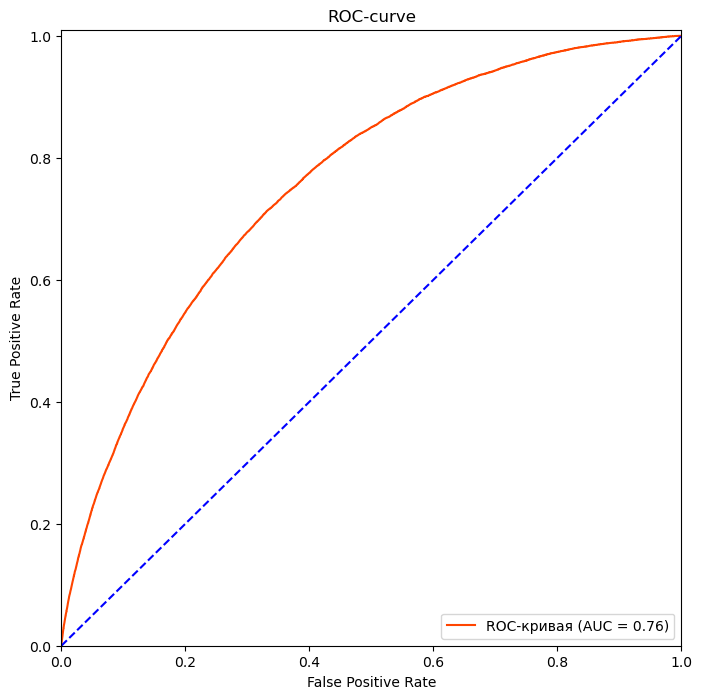

In [297]:
"""
Для каждого возможного порога классификации вычислим значения 
False Positive Rate (доля отрицательных примеров, ошибочно классифицированных как положительные)
True Positive Rate (доля истинноположительных среди всех положительных)
и соответствующие пороги.
"""
fpr, tpr, thresholds = roc_curve(y_test, df_pred['ensemble_weighted_pred'])

plt.figure(figsize=(8, 8))

# Построим график ROC-curve
plt.plot(
    fpr,
    tpr,
    color='orangered',
    label=f'ROC-кривая (AUC = {auc:.2f})'
)
# Добавим центральная диагональная линию для наглядности
plt.plot(
    [0, 1],
    [0, 1],
    color='blue',
    linestyle='--'
)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.01])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-curve')
plt.legend(loc='lower right')
plt.show()

# Optimal Thresholds selection

Найдём лучший порог классификации при котором разница между    
TPR и FPR будет максимальна.    
Эта разница отражает, насколько модель хорошо отделяет    
положительные примеры от отрицательных при данном пороге.   


In [298]:
y_proba = df_pred['ensemble_weighted_pred']
y_proba.shape

(600000,)

In [299]:
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

In [302]:
# Находим индекс, при котором разница между TPR и FPR максимальна
optimal_idx = (tpr - fpr).argmax()

# Используем этот индекс, чтобы получить оптимальный порог из массива thresholds
optimal_threshold = thresholds[optimal_idx]

# Выводим лучший порог с точностью до 4 знаков после запятой
print(f'Лучший порог: {optimal_threshold:.5f}')

# Выводим значения TPR и FPR для найденного оптимального порога с точностью до 3 знаков после запятой
print(f'TPR: {tpr[optimal_idx]:.3f}, FPR: {fpr[optimal_idx]:.3f}')

Лучший порог: 0.49642
TPR: 0.712, FPR: 0.330


In [303]:
# Посмотрим на точность ансамбля и матрицу ошибок при СТАНДАРТНОМ пороге
pred = (y_proba >= 0.5).astype(int)
print('accuracy_score', accuracy_score(y_test, pred))
confusion_matrix(y_test, pred, normalize='true')

accuracy_score 0.6760566666666666


array([[0.67495576, 0.32504424],
       [0.29401541, 0.70598459]])

In [304]:
# Посмотрим на точность ансамбля и матрицу ошибок при НАЙДЕННОМ пороге
pred = (y_proba >= optimal_threshold).astype(int)
print('accuracy_score', accuracy_score(y_test, pred))
confusion_matrix(y_test, pred, normalize='true')

accuracy_score 0.6713016666666667


array([[0.66982022, 0.33017978],
       [0.2884254 , 0.7115746 ]])

Разница небольшая.
В классификаторе пайплайна для предикта будем пользоваться найденным порогом.     
Но в кредитном скоринге важно контролировать полноту (TPR) по дефолтным клиентам, чтобы не пропустить слишком много рисковых заемщиков.
При этом нужно учитывать, что повышение TPR обычно ведёт к росту FPR — ложноположительных решений (отказов надёжным клиентам).    
И хотя такой задачи не ставилось, создадим механизм для нахождения порога классификатора по заданному значению полноты.    
Подбор порога по TPR позволяет задать бизнес-ограничения и найти компромисс между рисками и упущенной прибылью.  

In [305]:
# Выберем TPR = 0.85
threshold, tpr_val, fpr_val = select_threshold_by_tpr(y_test, y_proba, desired_tpr=0.85)
print(f"Выбранный порог: {threshold:.4f}, TPR: {tpr_val:.3f}, FPR: {fpr_val:.3f}")

Выбранный порог: 0.3840, TPR: 0.850, FPR: 0.500


In [306]:
# Посмотрим на точность ансамбля и матрицу ошибок при НАЙДЕННОМ пороге
pred = (y_proba >= threshold).astype(int)
print('accuracy_score', accuracy_score(y_test, pred))
confusion_matrix(y_test, pred, normalize='true')

accuracy_score 0.5125933333333333


array([[0.50018144, 0.49981856],
       [0.14999061, 0.85000939]])

Точность упала и FPR выросла, но это ожидаемый результат так как представителей класса 0 в дастасете в 27 раз больше и 
и занижение порога в пользу класса 1 естественно понижает общую точность предсказаний модели.

# SHAP analysis

## Сalculating SHAP values

In [92]:
df_test = pd.read_csv('../prepared_data/cut_corr_imp_test.csv')
df_test.shape

(600000, 61)

In [93]:
X_test = df_test.drop(['id', 'flag'], axis=1)
y_test = df_test.flag
X_test.shape, y_test.shape

((600000, 59), (600000,))

In [94]:
# Загружаем список весов моделей ансамбля
with open('../catboost_models/сonservative_models_weights.pkl', 'rb') as f:
    state = pickle.load(f)
    
val_auc_list = state['val_auc_list']
val_auc_list

[0.7576036850511159,
 0.7554545982995526,
 0.7532810994057619,
 0.7546988571803108,
 0.7524269260453276,
 0.7546930331964138]

In [95]:
# Соберём словарь с моделями и их весами
models_dict = {}
for i in range(5):
    model = CatBoostClassifier()
    model.load_model(f'../catboost_models/fold_{i}_сonservative_model.bin')
    models_dict[f'fold_{i}_model'] = (model, val_auc_list[i])

model = CatBoostClassifier()
model.load_model('../catboost_models/full_data_сonservative_model.bin')
models_dict['full_data_model'] = (model, val_auc_list[5])
models_dict

{'fold_0_model': (<catboost.core.CatBoostClassifier at 0x143fb49b0>,
  0.7576036850511159),
 'fold_1_model': (<catboost.core.CatBoostClassifier at 0x14153cc20>,
  0.7554545982995526),
 'fold_2_model': (<catboost.core.CatBoostClassifier at 0x1a551c470>,
  0.7532810994057619),
 'fold_3_model': (<catboost.core.CatBoostClassifier at 0x14153ec90>,
  0.7546988571803108),
 'fold_4_model': (<catboost.core.CatBoostClassifier at 0x144128650>,
  0.7524269260453276),
 'full_data_model': (<catboost.core.CatBoostClassifier at 0x143fb74a0>,
  0.7546930331964138)}

In [96]:
# Создадим словарь для SHAP-значений и весов моделей ансамбля
shap_dict = {}

# Для каждой модели ансамбля
for model_name, (model, weight) in models_dict.items():
    
    # Создаём объект толкователя SHAP
    explainer = shap.TreeExplainer(model)

    """
    Вычисляем SHAP-значения на тестовой выборке X_test
    Получаем — массив размером (n_samples, n_features), где
    строки соответствуют строкам X_test,
    а  столбцы это вклад соответствующего признака в прогноз модели.
    """
    shap_values = explainer.shap_values(X_test)

    # Сохраняем SHAP-значения и вес модели в словарь 
    shap_dict[model_name] = (shap_values, weight)

In [97]:
shap_dict['fold_0_model'][0].shape

(600000, 59)

In [98]:
"""
Для dвычисления средневзвешенных по весам моделей SHAP-значений создаём 
массив из нулей размером X_test (SHAP-значение одной модели)
""" 
avg_shap = np.zeros_like(X_test)

# Считаем сумму весов всех моделей в ансамбле для нормирования SHAP-значений
weights_sum = sum(val_auc_list)

# Суммируем в массиве взвешенные SHAP-значения каждой модели
for shap_vals, weight in shap_dict.values():
    avg_shap += shap_vals * weight
    
# Делим  сумму SHAP-значения на сумму весов моделей
avg_shap /= weights_sum

## Summary plot

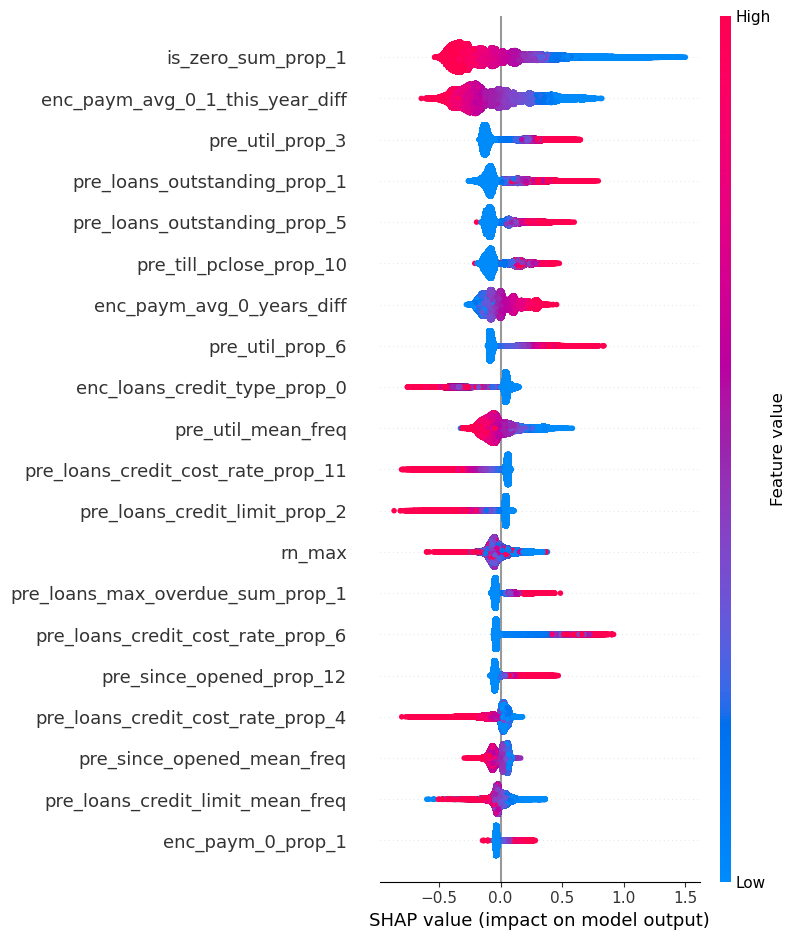

In [126]:
# Строим обобщённый график важности 20ти самых важных признаков
shap.summary_plot(avg_shap, X_test)

Интерпретация графика.  
Рассмотрим первые пять признаков дающих наибольший вклад в предсказательную способность ансамбля.  

1. is_zero_sum_prop_1 - это признак суммы флагов отсутствия просрочек в среднем на один кредит клиента по всем периодам от 5 до 90 дней,
   то есть он отражает регулярность платежей клиента.  
   Вносит самый высокий вклад в качество ансамбля.  
   Высокие значения признака (красные точки, много едениц) отражают редкие просрочки и ожидаемо  уводят SHAP value влево(понижает), то есть     снижают вероятность события класса 1 - дефолта.
   Соответственно низкие значения признака повышают вероятность дефолта.
   Вывод: Клиенты с большим количеством "чистых" периодов имеют существенно меньший риск — это основной “фильтр надёжности”.

2. enc_paym_avg_0_1_this_year_diff - признак разницы между средними значениями статусов платежей 0 и 1 на один кредит клиента за последний      год. Высокие значения признака отражают большую разницу между этими статусами и уводят SHAP value влево, то есть снижают                     вероятность дефолта клиента.
   Вывод: Можно предположить что 0 это некий положительный статус (платёж закрыт вовремя), а 1 - негативный статус (просрочка).                 Статус 0 встречается в датасете в разы чаще чем статус 1 что характерно для большинства клиентов.
   
3. pre_util_prop_3 - среднее на один кредит клиента одного из интервалов отношения оставшейся невыплаченной суммы кредита к кредитному          лимиту.
   Высокиие значения признака уводят SHAP value вправо(дефолт), низкие влево.
   Можно сделать вывод что это интервал высоких отношений, то есть невыплаченная сумма кредита близка к кредитному лимиту и частое наличие      такого значения признака в кредитах клиента говорит о его закредитованности и высоком риске дефолта.

4. pre_loans_outstanding_prop_1 - признак среднего присутствия на один кредит клиента некоего интервала невыплаченной суммы кредита.
   Высокиие значения признака уводят SHAP value вправо(дефолт), низкие влево.
   Так же как и для предыдушего признака можно сделать вывод что это интервал высоких значений невыплаченных сумм, и частое наличие             такого значения признака в кредитах клиента говорит о его закредитованности и высоком риске дефолта.

5. pre_loans_outstanding_prop_5 - аналогичный предыдушему признак, но отражающий частоту появления другого интервала значений невыплаченных     сумм, очевидно также высоких. Признак повторяет те же паттерны что и предыдущий.

Все пять признаков имеют отчётливо выраженное значение: они либо уменьшают, либо увеличивают вероятность наступления дефолта по мере увеличения своих значений.

Для всех признаков характерно, что экстремальные значения дают сильное смещение прогноза модели. Однако в признаке pre_loans_outstanding_prop_5 присутствует аномалия в виде еденичной красной точки слева (один или несколько клиентов) это, вероятно, объясняется влиянием остальных признаков на поведение моделей ансамбля, в контексте значений остальных признаков в этом или в этих случаях высокие значения признака pre_loans_outstanding_prop_5 наоборот понижали SHAP value понижая вероятность дефолта клиента.  
Подобные единичные аномалии могут встречаться у сложных моделей, и если проверить значения остальных топ-признаков у таких клиентов, скорее всего обнаружатся экстремально позитивные характеристики. Такие случаи можно анализировать отдельно чтобы проверить нет ли в данных каких-то специфических смешанных паттернов или ошибочной интерпретации отдельного признакаи и даже создать отдельную подвыборку для обучения новой модели и их дополнительной оценки.

## Bar plot

Для подтверждения важности признаков отраженнных в summary plot построим bar plot средней абсолютной важности SHAP значений признаков.

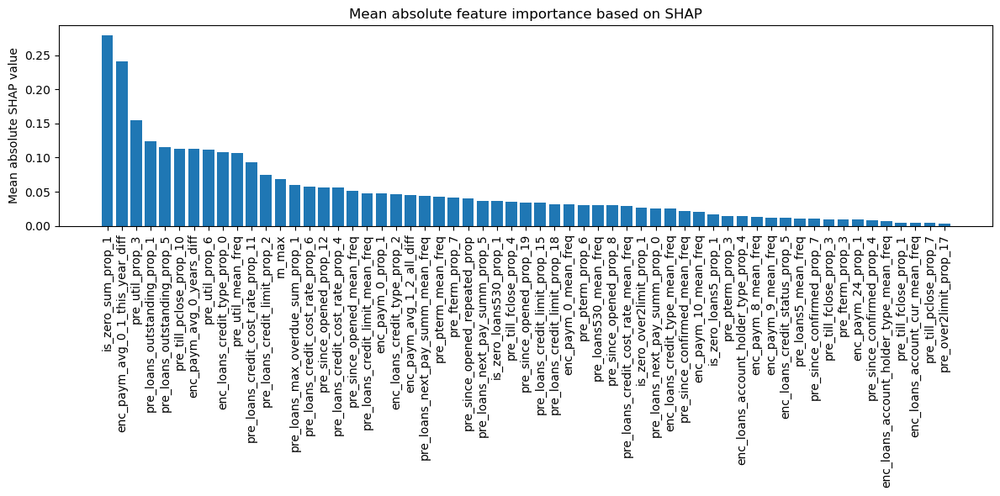

In [99]:
"""
Вычислим среднее абсолютное SHAP значение для каждого признака по всем объектам.
Будем брать модуль SHAP value, что бы учесть положительное и отрицательное влияние на 
вероятность предсказания первого класса.
"""
mean_abs_shap = np.mean(np.abs(avg_shap), axis=0)

"""
Получим индексы которые отсортировали бы массив по возрастанию (argsort)
и инвертируем сорттировку слайсингом.
"""
sorted_idx = np.argsort(mean_abs_shap)[::-1]

# Получим отсортированные названия признаков для подписей на графике
sorted_features = X_test.columns[sorted_idx]

# Получаем отсортированные значения средней абсолютной важности
sorted_mean_abs_shap = mean_abs_shap[sorted_idx]

plt.figure(figsize=(12, 6))
plt.bar(sorted_features, sorted_mean_abs_shap)

# Поворачиваем имена признаков для лучшей читаемости
plt.xticks(rotation=90)
plt.ylabel('Mean absolute SHAP value')
plt.title('Mean absolute feature importance based on SHAP')
plt.tight_layout()
plt.show()

Порядок признаков в bar plot совпадает с порядком на summary plot: лидеры по важности остаются теми же. 

Построим график средних важностей признаков моделей для сравнения со среднимиабсолютными SHAP значениями.

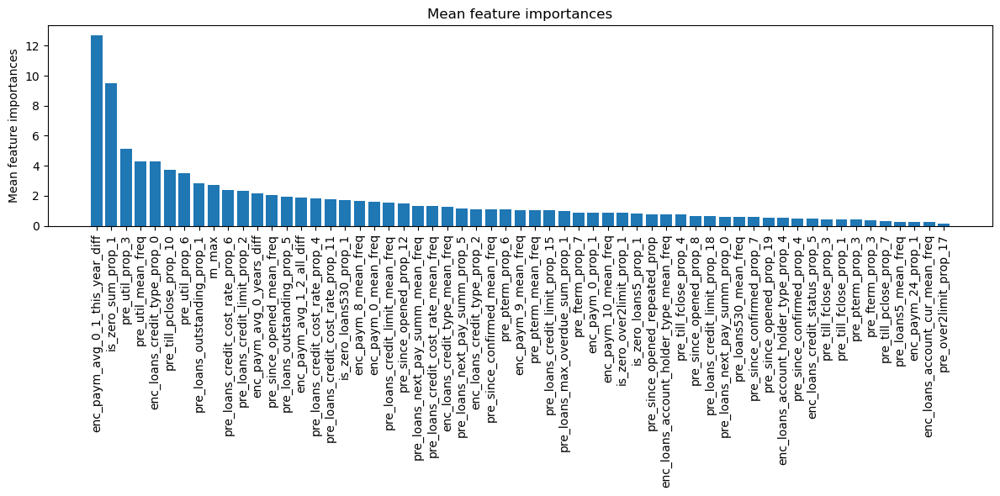

In [102]:
# Создадим словарь для накопления важностей признаков моделей ансамбля
importances_dict = {col: [] for col in X_test.columns}

# Для каждой модели из ансамбля получаем важности признаков и записываем их в словарь
for value in models_dict.values():
    importances = value[0].get_feature_importance()
    for col, imp in zip(X_test.columns, importances):
            importances_dict[col].append(imp)

# Рассчитываем среднее значение важности для каждого признака
mean_importances_dict = {col: np.mean(imps) for col, imps in importances_dict.items()}

# Сортируем признаки по убыванию среднего значения важности
sorted_mean_importances_dict = dict(
    sorted(mean_importances_dict.items(), key=lambda x: x[1], reverse=True)
)

# Сохраняем отсортированные признаки и соответствующие значения важности для построения графика
features = sorted_mean_importances_dict.keys()
values = sorted_mean_importances_dict.values()

# Строим столбчатую диаграмму значений важности по признакам
plt.figure(figsize=(12, 6))
plt.bar(features, values)     

# Поворачиваем подписи признаков на оси X для улучшения читаемости
plt.xticks(rotation=90)
plt.ylabel('Mean feature importances')  
plt.title('Mean feature importances')   
plt.tight_layout()                      
plt.show()                             

Первые два признака занимают лидирующие позиции в обоих рейтингах — по средним feature importances и по mean absolute SHAP values ансамбля, хотя их порядок отличается. Третье место полностью совпадает в обоих списках.  
Для остальных признаков последовательность начинает различаться.

Различия в рейтингах объясняются особенностями двух методов:  
SHAP важность отражает средний вклад признака в индивидуальные предсказания модели — насколько сильно этот признак влияет на результат для каждого отдельного случая.

Классическая feature importance показывает, как часто и полезно признак используется при разбиениях деревьев, оценивая его роль в структуре модели в целом, но не всегда отражает, как реально этот признак влияет на финальный прогноз.

Искажения в ранжировании могут возникать из-за наличия сложных взаимодействий между признаками или из-за выраженных пороговых эффектов — SHAP их лучше фиксирует. 

Устойчивость топа признаков по двум ключевым метрикам говорит о высокой информативности и надёжности архитектуры моделей.

## Dependence plot

Построим графики зависимостей SHAP value от значений признака для трёх самых важных признаков чтобы: 
- Оценить, как именно значения каждого из этих признаков влияют на вклад в итоговое решение модели — то есть понять направление, силу и        характер этого влияния.
- Обнаружить типовые или аномальные эффекты: например, есть ли уровни признака, при которых вклад резко меняется, есть ли нелинейные          закономерности и взаимодействия с другими признаками.

По оси X на графике откладываются значения признака, по оси Y SHAP value этого признака, цветом обозначаются значения дополнительного признака, который автоматически подбирается исходя из того какой признак образует с основным признаком максимальное взаимодействие, то есть который наиболее сильно влияет на SHAP value основного признака при его одинаковых значениях. Это позволяет выявить скрытые взаимодействия между признаками.

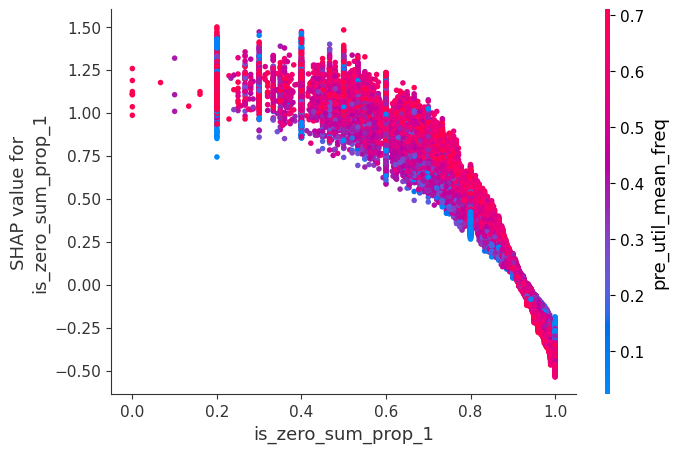

In [157]:
shap.dependence_plot('is_zero_sum_prop_1', avg_shap, X_test)

На графике можно наблюдать монотонную зависимость - при увеличении значения признака is_zero_sum_prop_1 его SHAP value стабильно снижается, переходя от положительных значений (укрепляющих прогноз дефолта) к отрицательным (исиливает принятие решения о надёжности клиента). 
Влияние признака распределено неравномерно - низкие его значения дают высокий вклад в предсказание дефолта, тогда как высокие значения признака меньше влияют на предсказание надёжности клиента.  

Области нейтрального влияния  
В интервале значений признака около 0.9 SHAP value близко к нулю. В этих точках признак практически не влияет на решение модели, а итоговое предсказание определяется за счёт других признаков. Парный признак так же не имеет влияние в этой точке что видно по отсутствию   вертикального цветового расслоения.  

Взаимодействие с дополнительным признаком  
pre_util_mean_freq - среднее на кредит клиента суммарная частотность значений признака "отношение оставшейся невыплаченной суммы кредита к кредитному лимиту в кредитах клиента", показывает насколько поведение отличается от типичного поведения остальных клиентов выборки.
На большинстве диапазонов X наблюдается вертикальная стратификация точек по цвету:
При одних и тех же значениях is_zero_sum_prop_1 объекты с большим pre_util_mean_freq (малиновые точки) имеют более высокие SHAP value чем с низким и наоборот при значениях is_zero_sum_prop_1 больше 0.9  — это указывает на выраженное статистическое взаимодействие между этими двумя признаками.

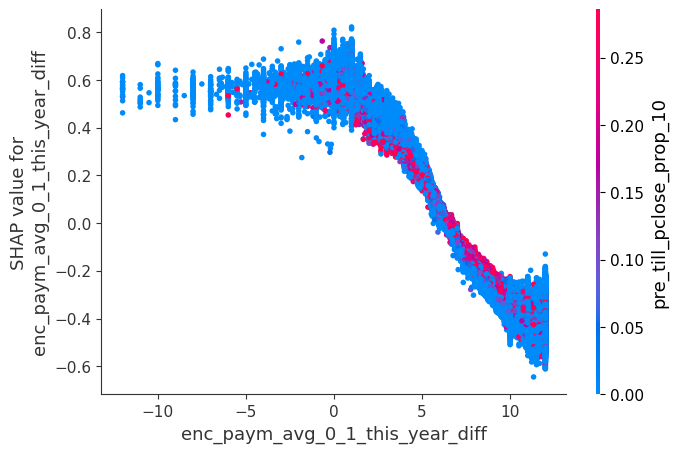

In [151]:
shap.dependence_plot('enc_paym_avg_0_1_this_year_diff', avg_shap, X_test)

Зависимость SHAP value от значения признака enc_paym_avg_0_1_this_year_diff носит нелинейный характер - при отрицательных значениях признака значения SHAP value стабильно высокие и не меняются (предсказание дефолта), а с ростом положительных значений признака SHAP value линейно убывает вплоть до отрицательных значений (надёжные клиенты).   
Это согласуется с предыдущмими выводами о характере статусов платежей 0 и 1, 0 - некий позитвный статус, 1 - негативный и их отрицательная разница говорит о высокой концентрации негативных статусов 1.  
Влияние признака интенсивно меняется в узком диапазоне около нуля, что можно расценивать как пороговое значение.  
Этот качественный скачок вероятнее всего можно объяснить тем что почти все деревья ансамбля CatBoost выбирают разбиение по этому порогу, что отражает резкую смену сценария риска между двумя классами данных. Модели здесь четко делят клиентов на надёжных и проблемных. 

В целом влияние признака на SHAP value  почти симметрично - от 0.8 до - 0.6.

Область нейтрального вклада  
В диапазоне значений признака enc_paym_avg_0_1_this_year_diff около 5 SHAP value находится близко к нулю. В этот момент признак перестает оказывать заметное влияние на предсказание модели — итог формируется за счет других переменных. Парный признак так же не имеет влияние в этой точке что видно по отсутствию   вертикального цветового расслоения.   

Взаимодействие с дополнительным признаком  
pre_till_pclose_prop_10 - доля в кредитах клиента некоего интервала признака "Плановое количество дней с даты сбора данных до даты закрытия кредита".
При отрицательных значениях основного признака не наблюдается выраженной цветовой дифференциации парного признака pre_till_pclose_prop_10. 
При положительных значениях enc_paym_avg_0_1_this_year_diff наблюдается влияние парного признака в сторону уменьшения SHAP value при высоких его значениях (малиновые точки), а после точки нейтрального вклада (около 5 по enc_paym_avg_0_1_this_year_diff) наоборот - высокие значения 
pre_till_pclose_prop_10 повышают SHAP value.
Таким образом можно сказать что статистическая зависимость между признаками существует -  SHAP value зависит не только от значения основного признака, но и от величины парного.
При больших значениях enc_paym_avg_0_1_this_year_diff (9-12) эффект взаимодействия исчезает и цветовое разделение пропадает. 

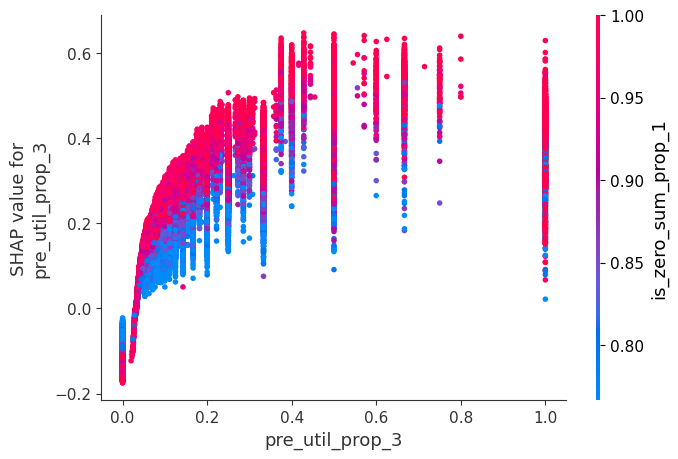

In [152]:
shap.dependence_plot('pre_util_prop_3', avg_shap, X_test)

На графике наблюдается нелинейная возрастающая зависимость SHAP value от значений основного признака pre_util_prop_3 - доля в кредитах клиента некоего инетрвала значений отношения оставшейся невыплаченной суммы кредита к кредитному лимиту . 
С ростом значений основного признака наблюдается резкое увеличение SHAP value с отрицательных значений (надёжные клиенты)  и около значений 0.1 - 0.3 выход на плато.  
На SHAP value сильно влияют значения парного признака is_zero_sum_prop_1(топовый признак) это признак суммы флагов отсутствия просрочек в среднем на один кредит клиента по всем периодам от 5 до 90 дней, то есть он отражает регулярность платежей клиента.  
Отчетливо видна стратификация по цветам почти на всех значениях основного признака, причем при значении 0 основного признака высокие значения парного признака понижают SHAP value (малиновые точки), а во всех остальных случаях повышают.   

Ранее был сделан вывод что признак  pre_util_prop_3 отражает долю в кредитах клиента неких высоких отношений невыплаченной суммы кредита к кредитному лимиту, то есть невыплаченная сумма кредита близка к кредитному лимиту и частое наличие такого значения признака в кредитах клиента говорит о его закредитованности и высоком риске дефолта.  
Теперь же судя по тому что рост значений признака после примерно 0.1 не оказывает существенного влияния на рост SHAP value можно предположить что признак не обязательно говорит о закредитованности, это например, могут быть недавно взятые кредиты.

## Waterfall plot

Для анализа поведения моделей в областях нейтрального вклада двух топовых признаков is_zero_sum_prop_1 и  enc_paym_avg_0_1_this_year_diff построим Waterfall графики для усредненных значений всех признаков объектов входящих в эти области и для самых типичных представителей этих групп, чьи значения признаков самые близкие к медианным.

In [47]:
"""
Расчётаем взвешенное SHAP base value (в логитах) для ансамбля моделей.
Base value в задачах классификации — это среднее предсказание модели 
в логитах (log-odds), до применения функции сигмоида и преобразования в вероятность.
"""
# Создаём список для base_value моделей
base_values = []

# Для всех моделей ансамбля
for model, weight in models_dict.values():    
    # создаём SHAP-объект для интерпретации модели
    explainer = shap.TreeExplainer(model)
    # Вычисляем base_value модели
    base_value_model = explainer.expected_value
    # Умножаем на вес модели и кладем в список
    base_values.append(base_value_model * weight)

# Cумма весов всех моделей(AUC на валидации)
weights_sum = sum(val[1] for val in models_dict.values())

# Финальное усреднённое base value ансамбля
ensemble_base_value = sum(base_values) / weights_sum

print("Взвешенное base value (в логитах):", ensemble_base_value)

Взвешенное base value (в логитах): [-0.02140088]


### is_zero_sum_prop_1

In [57]:
# Найдем значение признака при котором SHAP value близко к нулю
feature_name = 'is_zero_sum_prop_1'
# Найдем индекс признака
i = X_test.columns.get_loc(feature_name)
idx_group = np.where(np.abs(avg_shap[:, i]) < 0.05)[0]
idx_group.shape

(46914,)

In [58]:
# Выберем группу объектов с низким SHAP value и оценим их меры среднего
feature_values_group = X_test.iloc[idx_group][feature_name]
group_mean = feature_values_group.mean()
group_median = feature_values_group.median()
print("Среднее группы", group_mean)
print("Медиана группы", group_median)

Среднее группы 0.9253431830994949
Медиана группы 0.925


In [59]:
"""
Так как распределение SHAP value на dependence_plot скошено, 
то ориентироваться будем на медианное значение.
Выделим группу объектов находящихся в областях нейтрального
вклада признака в решение моделей ансамбля, с зазором ± 0.01
"""
threshold = 0.01
# Индексы объектов входящих в требуемый диапазон признака
idx_group = np.where(
    (X_test[feature_name] >= group_median - threshold) & (X_test[feature_name] <= group_median + threshold)
)[0]
print("Number of objects in the group", idx_group.shape[0])

Number of objects in the group 53890


In [60]:
"""
Получаем матрицу признаков для группы и 
для каждого признака вычисляем медиану.
"""
group_features = X_test.iloc[idx_group].values
median_feature_values = np.median(group_features, axis=0)
group_features.shape

(53890, 59)

In [61]:
"""
Вычисляем медианные SHAP значения для всех признаков по группе,
avg_shap – массив средневзвешенных SHAP значений 
вычисленный ранее.
"""
median_shap_group = np.median(avg_shap[idx_group], axis=0)

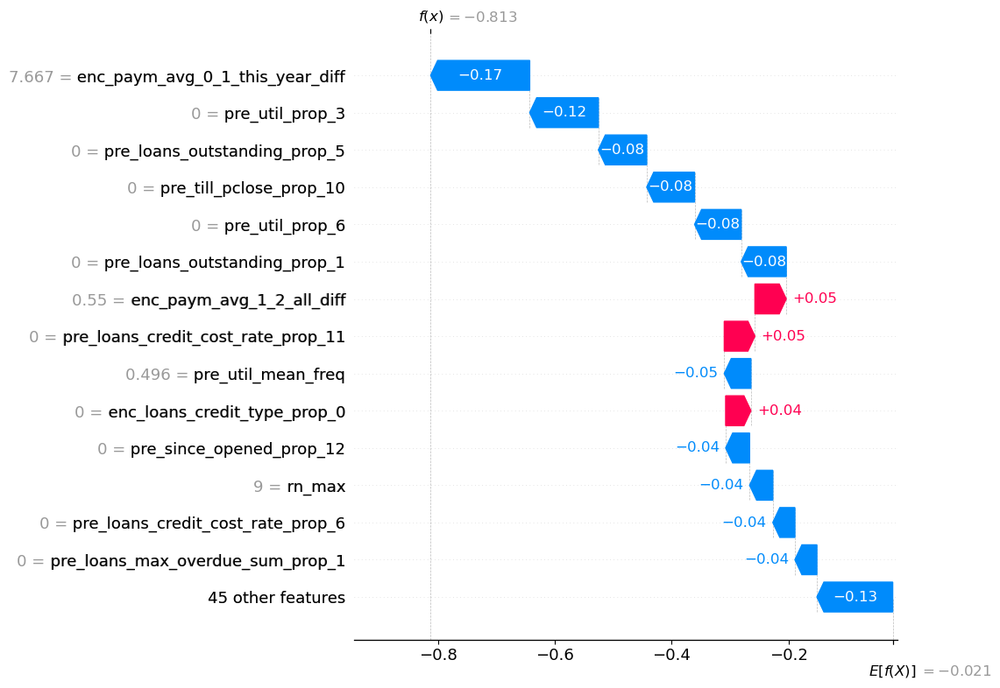

In [62]:
# Создаём объект Explanation для усреднённого (портретного) анализа группы
explanation_median = shap.Explanation(
    values=median_shap_group,            
    base_values=ensemble_base_value,     
    data=median_feature_values,         
    feature_names=X_test.columns 
)

# Строим waterfall plot для 15 топовых признаков
plt.figure(figsize=(8, 6)) 
shap.plots.waterfall(
    explanation_median,                  
    max_display=15
)

Исследуемый признак is_zero_sum_prop_1 отсутствует в первых 15ти позициях рейтинга, но даже лидер группы имеет очень маленькое SHAP значение и не имеет большой разницы со вторым местом. Это свидетельствует о том, что в данной группе вклад признаков в прогнозы модели в целом низок- не только исследуемый признак, но и все остальные признаки выглядят малозначимыми для модели.  
Это повод для целенаправленного feature engineering и пристального анализа данных в этой зоне. Оптимальным планом будет сочетание ручного анализа, создания новых информативных признаков и, при необходимости, применения отдельных моделей или экспертных правил для этой специфической подгруппы.

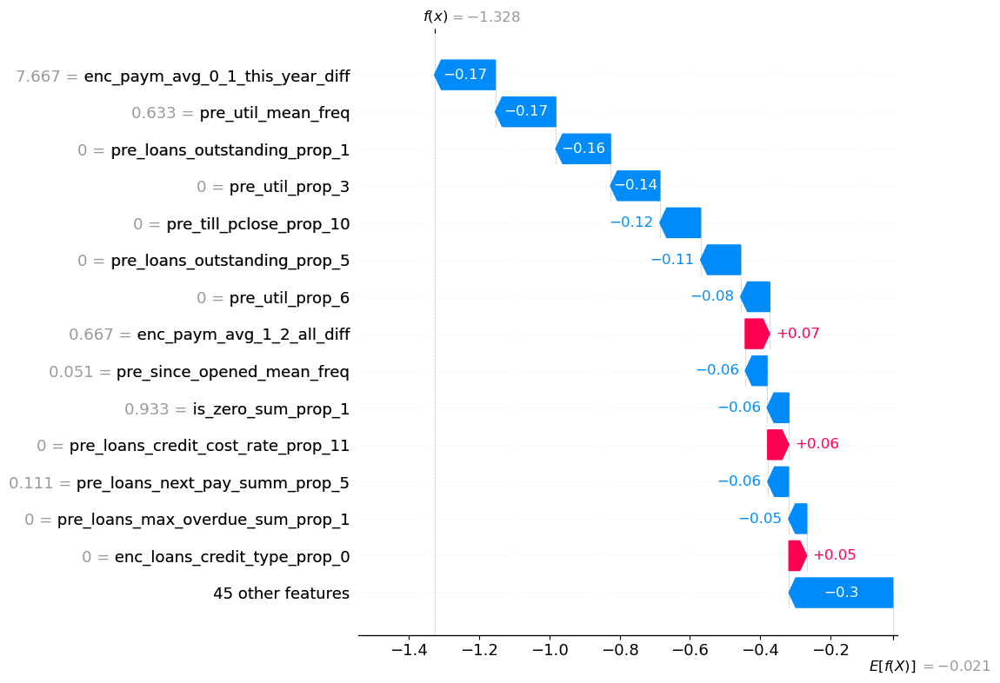

In [63]:
"""
Создадим Waterfall график для  самого типичного представителя группы -
это объект чьи значения признаков ближайшие к медианному вектору группы.
"""

# Считаем L1-расстояние (манхэттенское расстояние) от каждого объекта группы до вектора медиан
dists = np.sum(np.abs(group_features - median_feature_values), axis=1)

# Находим индекс строки внутри группы, ближайшей к медиане
i_typical = np.argmin(dists)

# Находим индекс этого же объекта относительно исходной выборки X_test
idx_typical = idx_group[i_typical]

# Выбираем значения признаков этого объекта
typical_feature_values = group_features[i_typical]

# Выбираем SHAP значения для типичного представителя
shap_typical = avg_shap[idx_typical]

# Создаём объект Explanation для типичного представителя группы
explanation_typical = shap.Explanation(
    values=shap_typical,
    base_values=ensemble_base_value,
    data=typical_feature_values,
    feature_names=X_test.columns
)

plt.figure(figsize=(8, 6))
shap.plots.waterfall(explanation_typical, max_display=15)
plt.show()

Waterfall график для самого типичного представителя группы практически не отличается от графика медианного (портретного) профиля - основной признак is_zero_sum_prop_1 появился на десятом месте рейтинга.  
Но для всех признаков в этой группе SHAP-вклады остаются низкими по модулю и не имееют больших различий, что указывает на отсутствие выраженных драйверов прогноза модели именно в данной зоне признакового пространства.  
Такое совпадение подтверждает однородность группы: модель не может выделить сколько-нибудь значимый фактор для уверенного сдвига прогноза относительно базового значения не только у абстрактного ("портретного") объекта, но и у реально существующего типичного наблюдения.

### enc_paym_avg_0_1_this_year_diff

In [67]:
# Найдем значение признака при котором SHAP value близко к нулю
feature_name = 'enc_paym_avg_0_1_this_year_diff'
# Найдем индекс признака
i = X_test.columns.get_loc(feature_name)
idx_group = np.where(np.abs(avg_shap[:, i]) < 0.05)[0]
idx_group.shape

(62699,)

In [68]:
# Выберем группу объектов с низким SHAP value и оценим их меры среднего
feature_values_group = X_test.iloc[idx_group][feature_name]
group_mean = feature_values_group.mean()
group_median = feature_values_group.median()
print("Среднее группы", group_mean)
print("Медиана группы", group_median)

Среднее группы 6.448354208372542
Медиана группы 6.5


In [79]:
"""
Ориентироваться будем на медианное значение.
Выделим группу объектов находящихся в областях нейтрального
вклада признака в решение моделей ансамбля, с зазором ± 0.01
"""
threshold = 0.01
# Индексы объектов входящих в требуемый диапазон признака
idx_group = np.where(
    (X_test[feature_name] >= group_median - threshold) & 
    (X_test[feature_name] <= group_median + threshold)
)[0]
print("Number of objects in the group", idx_group.shape[0])

Number of objects in the group 7823


In [70]:
"""
Получаем матрицу признаков для группы и 
для каждого признака вычисляем медиану.
"""
group_features = X_test.iloc[idx_group].values
median_feature_values = np.median(group_features, axis=0)
group_features.shape

(7823, 59)

In [71]:
"""
Вычисляем медианные SHAP значения для всех признаков по группе,
avg_shap – массив средневзвешенных SHAP значений 
вычисленный ранее.
"""
median_shap_group = np.median(avg_shap[idx_group], axis=0)

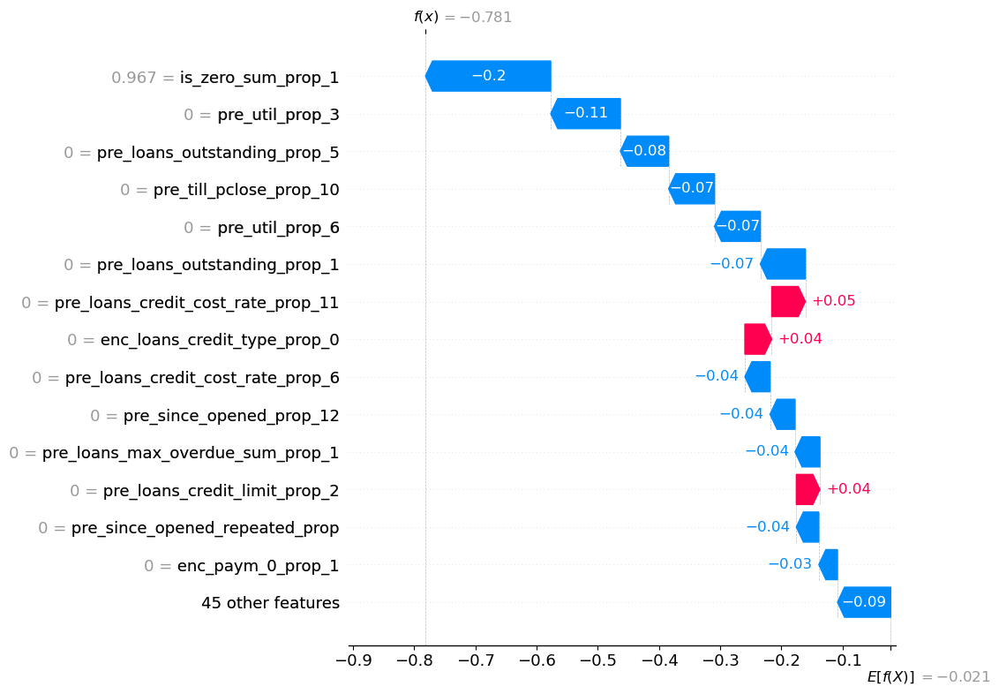

In [72]:
# Создаём объект Explanation для усреднённого (портретного) анализа группы
explanation_median = shap.Explanation(
    values=median_shap_group,            
    base_values=ensemble_base_value,     
    data=median_feature_values,         
    feature_names=X_test.columns 
)

# Строим waterfall plot для 15 топовых признаков
plt.figure(figsize=(8, 6)) 
shap.plots.waterfall(
    explanation_median,                  
    max_display=15
)

Несмотря на то что SHAP значение лидера рейтинга(is_zero_sum_prop_1) по модулю не сильно отличается от значений лидеров на предыдущих двух графиках (is_zero_sum_prop_1) можно сказать что здесь лидер имеет значение в два раза выше чем у второго признака в рейтинге и значительно отличается от SHAP значений остальных признаков. И модели ансамбля при прогнозировании дефолта для представителей этой группы в первую очередь опирается на значение is_zero_sum_prop_1, который является лидирующим рейтингом датасета.

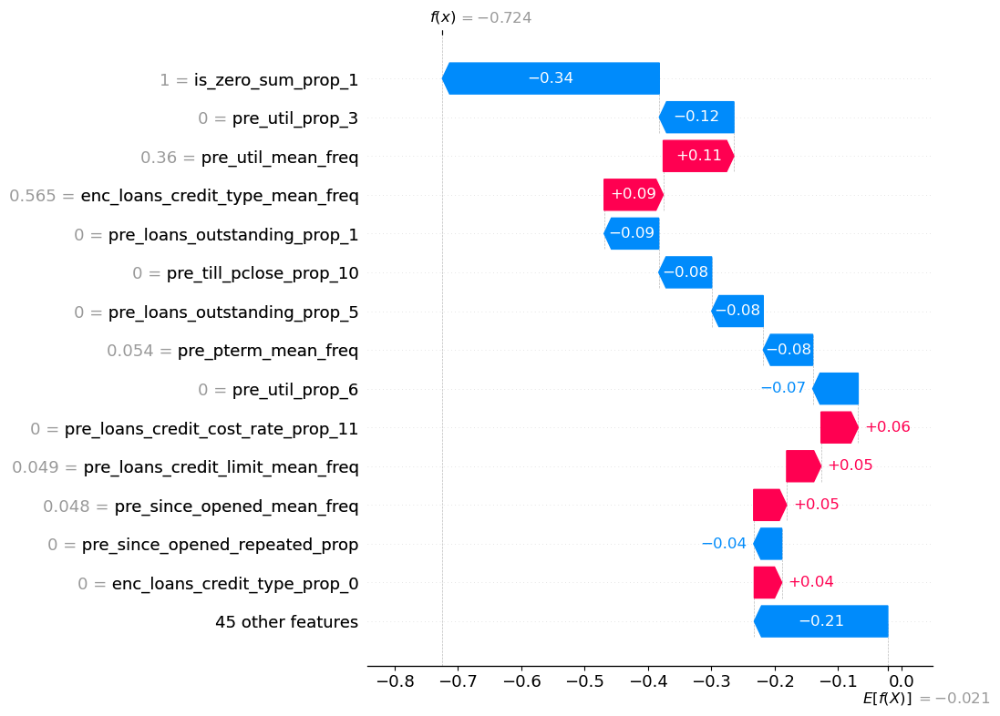

In [73]:
"""
Создадим Waterfall график для  самого типичного представителя группы -
это объект чьи значения признаков ближайшие к медианному вектору группы.
"""

# Считаем L1-расстояние (манхэттенское расстояние) от каждого объекта группы до вектора медиан
dists = np.sum(np.abs(group_features - median_feature_values), axis=1)

# Находим индекс строки внутри группы, ближайшей к медиане
i_typical = np.argmin(dists)

# Находим индекс этого же объекта относительно исходной выборки X_test
idx_typical = idx_group[i_typical]

# Выбираем значения признаков этого объекта
typical_feature_values = group_features[i_typical]

# Выбираем SHAP значения для типичного представителя
shap_typical = avg_shap[idx_typical]

# Создаём объект Explanation для типичного представителя группы
explanation_typical = shap.Explanation(
    values=shap_typical,
    base_values=ensemble_base_value,
    data=typical_feature_values,
    feature_names=X_test.columns
)

plt.figure(figsize=(8, 6))
shap.plots.waterfall(explanation_typical, max_display=15)
plt.show()

Для типичного представителя группы влияние признака is_zero_sum_prop_1 выражено ещё больше, что подтверждает вывод сделанный по графику для портретного представителя группы.

In [78]:
"""
Построим график waterfall для анализа поведения моделей ансамбля в переломной точке 
грпафика dependence признака enc_paym_avg_0_1_this_year_diff.
"""
feature_name = 'enc_paym_avg_0_1_this_year_diff'

# Получаем значения признака для всех объектов выборки
feature_values = X_test[feature_name].values

# Получаем  SHAP значения для этого признака
shap_values = avg_shap[:, X_test.columns.get_loc(feature_name)]

# Сортируем значения признака по возрастанию и соответствующие им SHAP значения
sorted_idx = np.argsort(feature_values)
sorted_feature_values = feature_values[sorted_idx]       
sorted_shap_values = shap_values[sorted_idx]            

"""
Для поиска точки перелома рассчитываем разницы между соседними SHAP value (по модулю)
из массива начиная со второго элемента вычитаем тот же массив без последнего элемента
"""
diff_shap = np.abs(sorted_shap_values[1:] - sorted_shap_values[:-1])

# Определяем индекс максимального значения разницы
max_diff_idx = np.argmax(diff_shap)

"""
Находим значение признака в точке перелома - 
это среднее между двумя соседними значениями признака, где скачок SHAP достигает максимума
"""
breakpoint_value = (sorted_feature_values[max_diff_idx] + sorted_feature_values[max_diff_idx + 1]) / 2

print("Значение признака в точке перелома", breakpoint_value)

Значение признака в точке перелома -0.2290209790209789


In [85]:
# Выделим группу объектов находящихся вблизи точки перлома

threshold = 0.03
# Индексы объектов входящих в требуемый диапазон признака
idx_group = np.where(
    (X_test[feature_name] >= breakpoint_value - threshold) & 
    (X_test[feature_name] <= breakpoint_value + threshold)
)[0]
print("Number of objects in the group", idx_group.shape[0])

Number of objects in the group 106


In [86]:
"""
Получаем матрицу признаков для группы и 
для каждого признака вычисляем медиану.
"""
group_features = X_test.iloc[idx_group].values
median_feature_values = np.median(group_features, axis=0)
group_features.shape

(106, 59)

In [87]:
"""
Вычисляем медианные SHAP значения для всех признаков по группе,
avg_shap – массив средневзвешенных SHAP значений 
вычисленный ранее.
"""
median_shap_group = np.median(avg_shap[idx_group], axis=0)

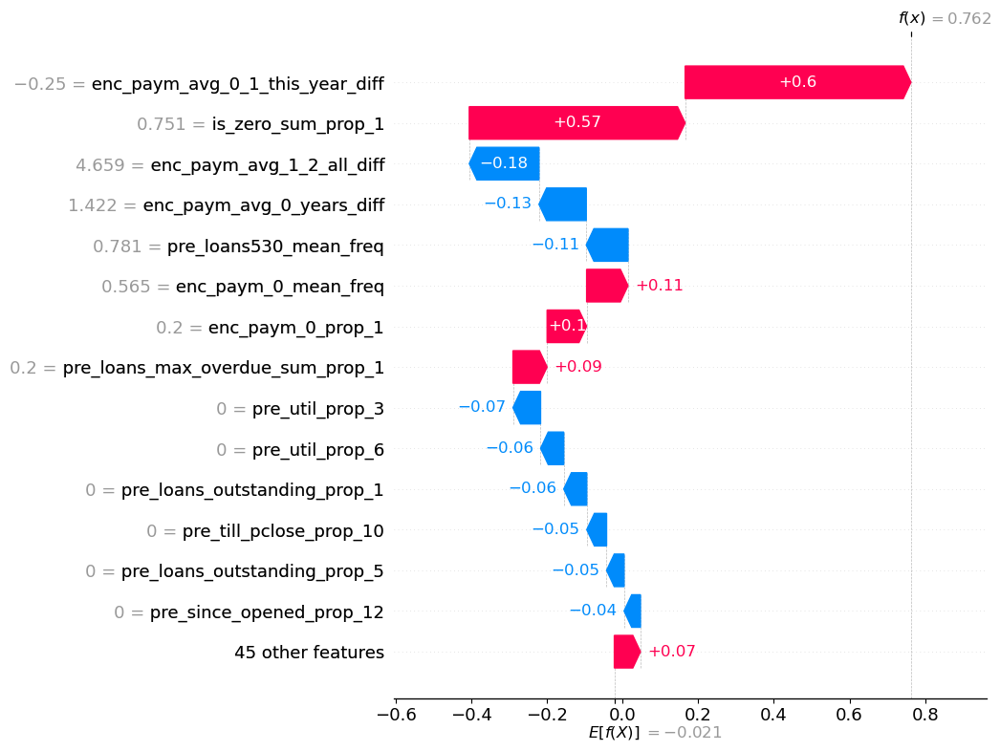

In [88]:
# Создаём объект Explanation для усреднённого (портретного) анализа группы
explanation_median = shap.Explanation(
    values=median_shap_group,            
    base_values=ensemble_base_value,     
    data=median_feature_values,         
    feature_names=X_test.columns 
)

# Строим waterfall plot для 15 топовых признаков
plt.figure(figsize=(8, 6)) 
shap.plots.waterfall(
    explanation_median,                  
    max_display=15
)

Анализируемый признак признак enc_paym_avg_0_1_this_year_diff в области близкой к точке перелома хотя и не сильно, но опережает по влиянию на предсказание второй по значимости признак is_zero_sum_prop_1, и значительно опережает по значимости остальные  переменные. 
Разница между средним количеством позитивных и негативных статусов платежей за последний год показывает совокупное "качество" недавней кредитной дисциплины каждого клиента. Даже незначительное преобладание позитивных статусов над негативными служит сильнейшим индикатором благонадежности, а негативный перекос сигнализирует о высоком риске. 
Этот признак — стратегически важный фактор, определяющий поведение модели и обладающий высокой интерпретируемостью.

## Conclusions

**Общие закономерности и ключевые признаки**  
SHAP-анализ выявил устойчивое ядро значимых признаков, определяющих поведение моделей ансамбля при прогнозировании дефолта.   
Это признаки отражающие аспекты платежной дисциплины клиентов - is_zero_sum_prop_1 - отсутствие просрочек и enc_paym_avg_0_1_this_year_diff (разница между средними частотами позитивных и негативных статусов платежей за год).   

Общий патерны:  
- экстремальные значения приводят к сильным сдвигам прогноза.
- для обоих признаков прослеживается простая взаимосвязь - рост переменной стабильно уменьшает, а снижение наоборот увеличивает вероятность дефолта.

**Согласованность метрик важности**    
По абсолютному SHAP value лидирует is_zero_sum_prop_1(~ 0.28/0.24), по классической feature importance enc_paym_avg_0_1_this_year_diff(~ 12.7/9.5), разница в обоих случаях небольшая. Ориентироваться следует на SHAP - она лучше фиксирует пороговые и контекстные эффекты.  
Общая устойчивость этих метрик подтверждает надёжность модели и информативность данных.  
Значения метрик сильно превышают показатели остальных признаков.  

**Зависимости и взаимодействия**  
is_zero_sum_prop_1  
Монотонное снижение SHAP value при росте значений признака; нейтральная зона около 0.9, где вклад минимален.  
Выраженное взаимодействие с pre_util_mean_freq, усиливающее или ослабляющее эффект в зависимости от типичности кредитной нагрузки.

enc_paym_avg_0_1_this_year_diff   
Нелинейная зависимость с пороговым скачком около 0, все отрицательные значения признака дают одинаковое влияние на модель и говорят о риске дефолта.  
Нейтральная область около 5. 
Взаимодействие с pre_till_pclose_prop_10 (доля в кредитах клиента некоего интервала признака "Плановое количество дней с даты сбора данных до даты закрытия кредита"), меняющееся по знаку до и после нейтральной зоны.  

**Поведение в специальных зонах**  
В зоне нейтрального влияния признака enc_paym_avg_0_1_this_year_diff модель опирается на is_zero_sum_prop_1 подтверждая его глобальную значимость.  
В переломной точке enc_paym_avg_0_1_this_year_diff этот признак по влиянию слегка опережает is_zero_sum_prop_1, доминируя над остальными. Даже малый позитивный баланс статусов резко снижает риск.
А в зоне нейтрального влияния самого важного признака is_zero_sum_prop_1 ни один из признаков не берёт на себя выраженную роль лидера - вклад всех низок. Это указывает на однородность группы и необходимость уделения ей особого внимания.   
Особенно это актуально тем что к этой группе можно отнести от 8 до 10 процентов клиентов. 

**Рекомендации и выводы**  
В целом модели ансамбля показали хорошую интерпретируемость, устойчивое ядро признаков и чёткие пороговые эффекты для разделения классов.
Фокусироваться следует на топ-признаках для скоринга — регулярность платежей и баланс статусов как ключевые индикаторы.  
Для группы клиентов из зоны нейтрального влияния следует найти дополнительные признаки либо обучить модель другого класса или собрать стек моделей. Можно также ввести для них ручной отбор хотя для этого группа слишком многочисленна. 
Дополнительными признаками могут стать более детализированные признаки разницы статусов платежей, например за последние пол года или несколько месяцев.